In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

import chromATAC as ca

In [3]:
# Directory containing TE bed files
COORDINATES_DIRECTORY = '/cluster/home/t124771uhn/data/V2-TEs/non_olap/'
# Directory containing clusters found by CREAM tools 
CLUSTERS_DIRECTORY = '/cluster/home/t124771uhn/data/V2-TEs/non_olap/cores1000/'

In [4]:
clusters, cls_names = ca.tl.load_beds(CLUSTERS_DIRECTORY)
clusters = ca.al.chrom_counter(clusters)
clusters.columns = cls_names
coors, coo_names = ca.tl.load_beds(COORDINATES_DIRECTORY)
coors = ca.al.chrom_counter(coors)
coors.columns = coo_names

FileNotFoundError: [Errno 2] No such file or directory: '/cluster/home/t124771uhn/data/V2-TEs/non_olap/cores1000/'

In [5]:
# CREAM cannot extract cores for the TEs that have less than 1000 elements, then we don't have clusters for all TEs
# So we should filter out common TEs between chromosomes dataframe and clusters dataframe
short_chromosomes = coors.loc[:, [l not in clusters.columns for l in coors.columns]]
coors = coors.loc[:, [l in clusters.columns for l in coors.columns]]
coors

NameError: name 'coors' is not defined

In [ ]:
array([ 3.,  1.,  1.,  2.,  5.,  3.,  0.,  0.,  0.,  1.,  0.,  0.,  1.,
        1.,  1.,  0.,  1.,  0.,  1.,  0.,  1.,  0., 23.,  0.])

In [9]:
clusters['L1MA1'].sort_index()

chr
1      3.0
2      1.0
3      1.0
4      2.0
5      5.0
6      3.0
7      0.0
8      0.0
9      0.0
10     1.0
11     0.0
12     0.0
13     1.0
14     1.0
15     1.0
16     0.0
17     1.0
18     0.0
19     1.0
20     0.0
21     1.0
22     0.0
23    23.0
24     0.0
Name: L1MA1, dtype: float64

In [ ]:
array([288., 252., 383., 253., 252., 255., 173., 162., 135., 165., 126.,
       150.,  96., 107.,  73.,  95.,  74.,  85.,  45.,  33.,  68.,  26.,
       837.,  74.])

In [6]:
clusters

,THE1B-int,Penelope1_Vert,L1MD,L1ME3E,L1MA4,AluSz,MER5A1,MER63D,MER90a,MER52A,...,MER67D,HAL1M8,AluSq,AluSz6,LTR16B1,LTR16A1,AluYm1,MER21-int,MER91B,Kanga2_a
chr,,,,,,,,,,,,,,,,,,,,,
1,2.0,1.0,17,16,18,100,10,2.0,1.0,2.0,...,0.0,8.0,7,23,6.0,2.0,10.0,5.0,6.0,3.0
2,3.0,1.0,25,13,9,59,14,5.0,1.0,3.0,...,0.0,6.0,10,14,4.0,0.0,4.0,2.0,9.0,0.0
3,2.0,2.0,10,15,20,58,28,1.0,1.0,1.0,...,0.0,6.0,6,14,4.0,11.0,3.0,5.0,5.0,3.0
4,5.0,1.0,13,10,18,39,9,1.0,0.0,4.0,...,0.0,2.0,9,4,6.0,1.0,4.0,1.0,3.0,4.0
5,3.0,3.0,14,3,14,48,9,3.0,1.0,4.0,...,1.0,4.0,7,14,5.0,1.0,4.0,3.0,1.0,4.0
6,7.0,1.0,12,10,5,39,6,6.0,1.0,2.0,...,0.0,7.0,6,9,4.0,0.0,5.0,3.0,3.0,1.0
7,2.0,3.0,17,12,7,106,6,4.0,0.0,2.0,...,0.0,4.0,14,12,3.0,0.0,8.0,3.0,2.0,1.0
8,1.0,2.0,8,7,5,30,6,4.0,0.0,2.0,...,1.0,7.0,5,10,0.0,1.0,1.0,1.0,1.0,0.0
9,1.0,1.0,12,5,14,47,10,1.0,2.0,2.0,...,0.0,3.0,8,11,1.0,1.0,5.0,5.0,1.0,1.0


#### Percentile the Numbers

In [43]:
coors = ca.pp.percentile(coors)
clusters = ca.pp.percentile(clusters)

## Differential Analysis of TEs counts of the Clusters VS TEs counts of Chromosomes

### Significant Changes

In [72]:
diff = (clusters - coors).values

<AxesSubplot: >

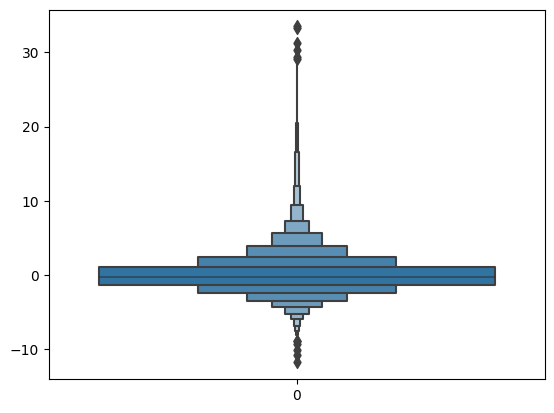

In [73]:
sns.boxenplot(diff.flatten())

### Kolmogorov-Smirnov (KS) test

In [ ]:
ks = ca.al.KS_test(clusters, coors, plot=True)
ks.index = clusters.columns
ks

In [48]:
ks.loc['L1MA1']

Column                            34
KS Statistic                0.458333
P-Value                     0.011965
Distribution Similarity    Different
Name: L1MA1, dtype: object

### Anderson-Darling test

/cluster/home/t124771uhn/projects/chromATAC/chromATAC/al/stats.py:50: UserWarning: p-value capped: true value larger than 0.25
  ad_statistic, critical_values, significance_level = anderson_ksamp([df1[:, col_idx], df2[:, col_idx]])
/cluster/home/t124771uhn/projects/chromATAC/chromATAC/al/stats.py:50: UserWarning: p-value floored: true value smaller than 0.001
  ad_statistic, critical_values, significance_level = anderson_ksamp([df1[:, col_idx], df2[:, col_idx]])


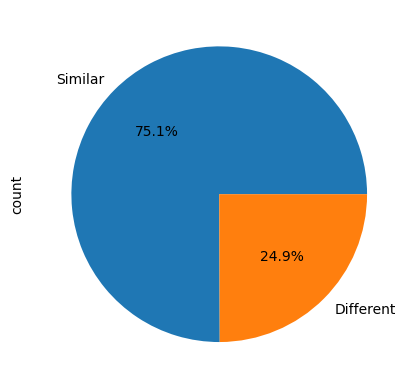

,Column,AD Statistic,Critical Values,Significance Level,Distribution Similarity
THE1B-int,1,0.980554,"[0.32500000000000007, 1.226, 1.960999999999999...",0.128877,Similar
Penelope1_Vert,2,1.571096,"[0.32500000000000007, 1.226, 1.960999999999999...",0.073031,Similar
L1MD,3,-0.942469,"[0.32500000000000007, 1.226, 1.960999999999999...",0.250000,Similar
L1ME3E,4,-0.900927,"[0.32500000000000007, 1.226, 1.960999999999999...",0.250000,Similar
L1MA4,5,-0.494511,"[0.32500000000000007, 1.226, 1.960999999999999...",0.250000,Similar
...,...,...,...,...,...
LTR16A1,449,8.094340,"[0.32500000000000007, 1.226, 1.960999999999999...",0.001000,Different
AluYm1,450,-0.230578,"[0.32500000000000007, 1.226, 1.960999999999999...",0.250000,Similar
MER21-int,451,1.348288,"[0.32500000000000007, 1.226, 1.960999999999999...",0.090350,Similar
MER91B,452,0.863670,"[0.32500000000000007, 1.226, 1.960999999999999...",0.144428,Similar


In [49]:
ad = ca.al.AnDa_test(clusters, coors, plot=True)
ad.index = clusters.columns
ad

In [50]:
ad.loc['L1MA1']

Column                                                                    34
AD Statistic                                                        5.496832
Critical Values            [0.32500000000000007, 1.226, 1.960999999999999...
Significance Level                                                  0.002311
Distribution Similarity                                            Different
Name: L1MA1, dtype: object

### Chi Squared Test

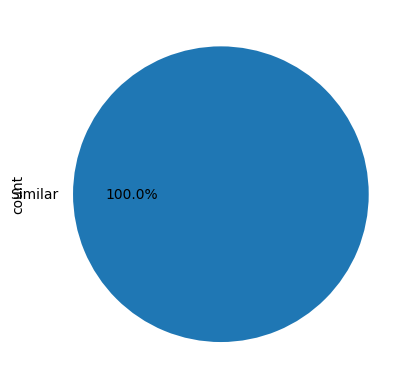

,Column,Chi-Square Statistic,P-Value,Degrees of Freedom,Expected Frequencies,Distribution Similarity
THE1B-int,1,144.000000,0.224217,132,"[[0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0.25, 0....",Similar
Penelope1_Vert,2,67.885714,0.314353,63,"[[0.2916666666666667, 0.5833333333333334, 0.29...",Similar
L1MD,3,360.000000,0.278179,345,"[[0.08333333333333333, 0.08333333333333333, 0....",Similar
L1ME3E,4,266.000000,0.385791,260,"[[0.08333333333333333, 0.08333333333333333, 0....",Similar
L1MA4,5,249.000000,0.364896,242,"[[0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0....",Similar
...,...,...,...,...,...,...
LTR16A1,449,83.000000,0.510350,84,"[[0.5, 0.5, 0.5, 0.5, 0.5, 1.0, 0.5, 0.5, 0.5,...",Similar
AluYm1,450,171.600000,0.408531,168,"[[0.041666666666666664, 0.041666666666666664, ...",Similar
MER21-int,451,115.885714,0.219959,105,"[[0.5833333333333334, 0.2916666666666667, 0.29...",Similar
MER91B,452,164.666667,0.558286,168,"[[0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0....",Similar


In [51]:
chi = ca.al.ChiSquared_test(clusters, coors, plot=True)
chi.index = clusters.columns
chi

## Voting among Statistical tests for finding Oute of Distribution(OOD) Points

In [53]:
outliers = ca.al.identify_outliers(diff)

In [63]:
tests = sum([v for v in outliers.values()])
mask = np.ones_like(tests)
mask[diff<0]= -1
outliers_df = pd.DataFrame((mask*tests).astype(int), columns=clusters.columns)

In [74]:
for k, v in outliers.items():
    print(k)
    print(v.sum())

svm
5452.0
z_score
279.0
iso_forrest
3327.0
grubbs
294.0
interquantile
530.0


In [55]:
outliers_df # negative numbers: (negative sign shows that the percentage has bee decreased from coordinates to clusters)
            # the number shows that how many statistical test have found it to be significant

,THE1B-int,Penelope1_Vert,L1MD,L1ME3E,L1MA4,AluSz,MER5A1,MER63D,MER90a,MER52A,...,MER67D,HAL1M8,AluSq,AluSz6,LTR16B1,LTR16A1,AluYm1,MER21-int,MER91B,Kanga2_a
0,-1,-2,0,0,2,0,-1,-2,0,-1,...,0,1,-3,0,4,-1,1,2,1,1
1,0,-2,2,0,-2,-2,-2,0,-1,-1,...,-2,0,-1,-1,0,-2,-2,0,2,-2
2,-2,0,-3,4,2,0,2,-4,0,-2,...,0,0,-2,0,0,5,-2,2,0,1
3,0,-2,0,0,0,-1,-1,-2,-2,0,...,-2,-2,1,-2,2,-1,0,-2,0,2
4,0,0,0,-5,0,0,0,-1,0,2,...,4,-1,0,1,2,0,0,2,-2,2
5,3,0,0,-1,-3,-1,-2,2,0,0,...,-2,1,-1,-1,2,-1,-1,1,0,0
6,0,2,1,1,-2,2,-2,0,-2,0,...,0,0,0,0,0,-1,1,0,0,0
7,-1,2,-2,-1,-2,-2,0,1,-2,0,...,4,2,0,0,-4,0,-2,-2,-1,-2
8,0,-1,0,0,2,0,0,-2,2,0,...,-1,0,1,1,0,1,1,2,0,1
9,-1,1,0,-3,0,0,1,-2,-1,-1,...,0,0,2,0,0,-1,0,0,-2,1


### Assignment of TEs to Chromosomes

In [56]:
# Define the size of majority portion required to identify a change as a significant change
MAJORITY_NUMBER = 3
# np.abs shows that we here consider the negative changes as well
chr_assignments = {}
for te in outliers_df.columns:
    chr_assignments[te] = np.where(np.abs(outliers_df.loc[:,te])>=MAJORITY_NUMBER)[0]

In [57]:
chrs = {i:[] for i in range(0, 24)}
len_chrs = []

In [58]:
for k, v in chr_assignments.items():
    len_chrs.append(len(v))    
    for chr in v:
        chrs[chr].append(k)

<AxesSubplot: ylabel='count'>

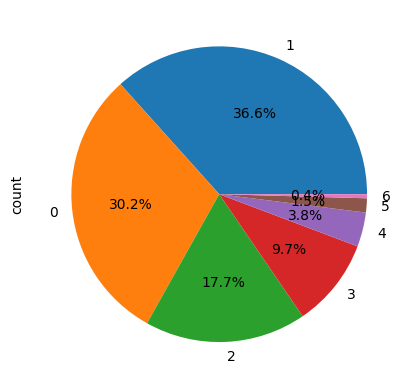

In [59]:
pd.Series(len_chrs).value_counts().plot(kind='pie', autopct='%1.1f%%')

[ 1  3  6  8 10 11 13 14 15 23 24]
[ 3  6 11 14 21 23 24]
[]
[]
[ 6 23]
[ 6 23]


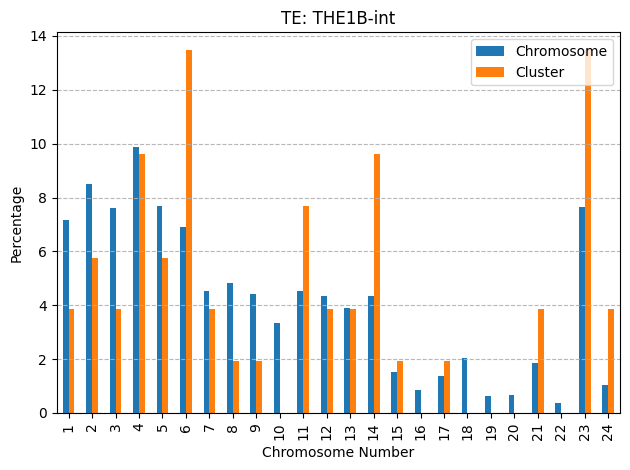

[ 1  2  4  7  8  9 11 13 14 15 17 18 19 22]
[ 1  2  4  7  8 10 11 13 15 17]
[]
[]
[]
[]


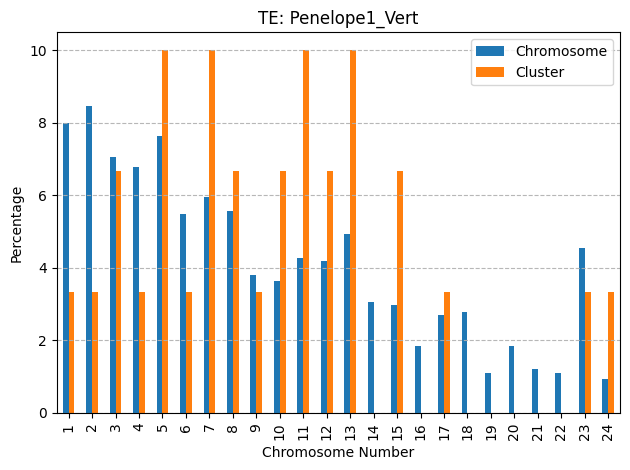

[ 2  3  8 11 14 16 18 20 22 23 24]
[ 2  3  7  8 11 16 17 19 23]
[]
[]
[3]
[3]


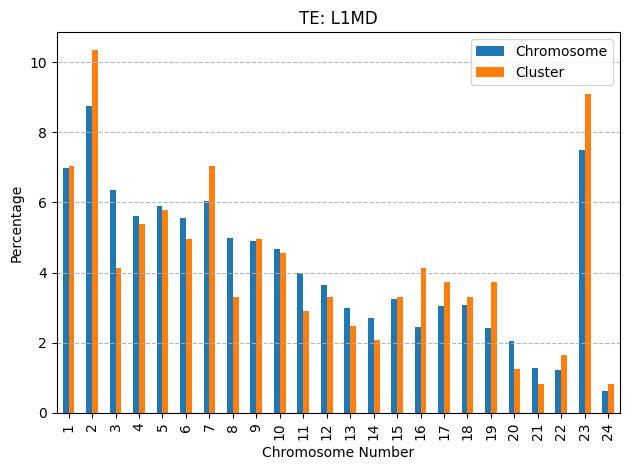

[ 3  5  6  7  8 10 12 13 14 19 23]
[ 3  5 10 12 13 14]
[3 5]
[5]
[ 3  5 10]
[ 3  5 10]


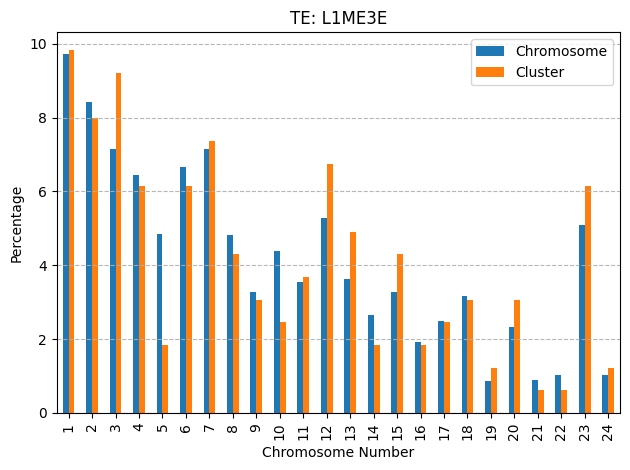

[ 1  2  3  6  7  8  9 12 16 22 23]
[ 1  2  3  6  7  8  9 12 23]
[]
[]
[6]
[6]


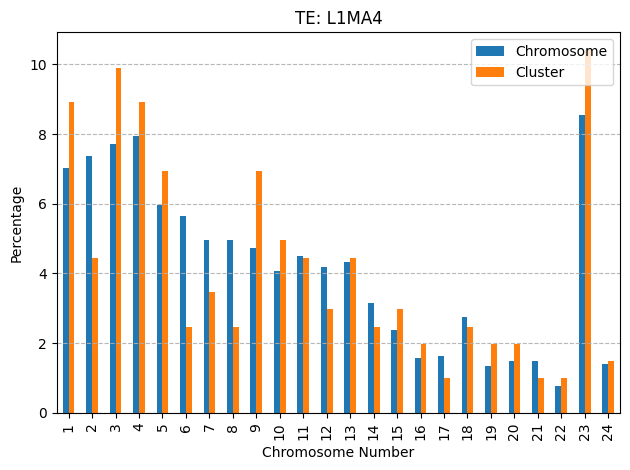

[ 2  4  6  7  8 11 12 16 17 18 19 22 23]
[ 2  7  8 16 17 19]
[19]
[19]
[19]
[19]


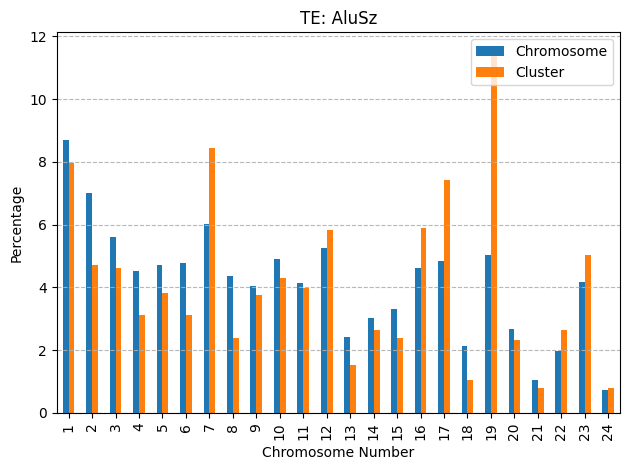

[ 1  2  3  6  7 11 12 16 17 19 20 21 23]
[ 2  3  4  6  7 10 16 20 23]
[]
[]
[]
[]


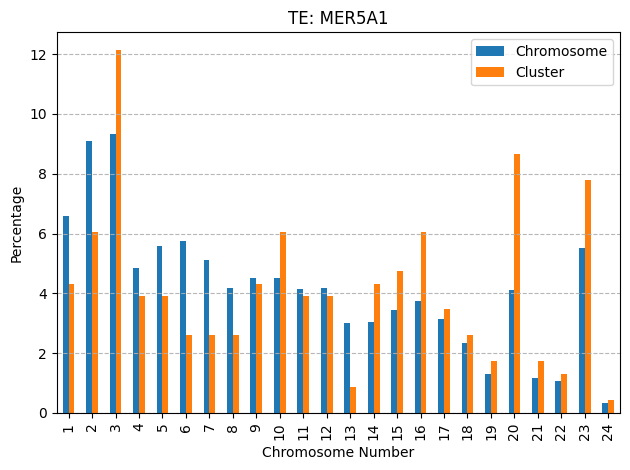

[ 1  3  4  6  8  9 10 12 14 20 23 24]
[ 1  3  4  5  6  9 10 12 18]
[]
[3]
[3]
[3]


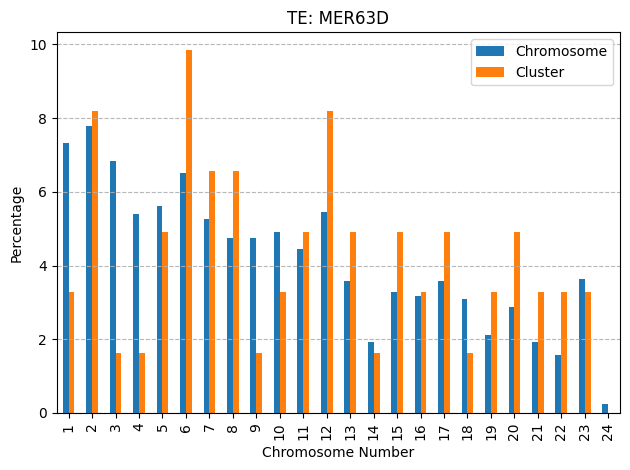

[ 4  7  8  9 10 11 12 13 14 16 19 22 23 24]
[ 2  4  7  8  9 12 16 19 23]
[]
[23]
[23]
[23]


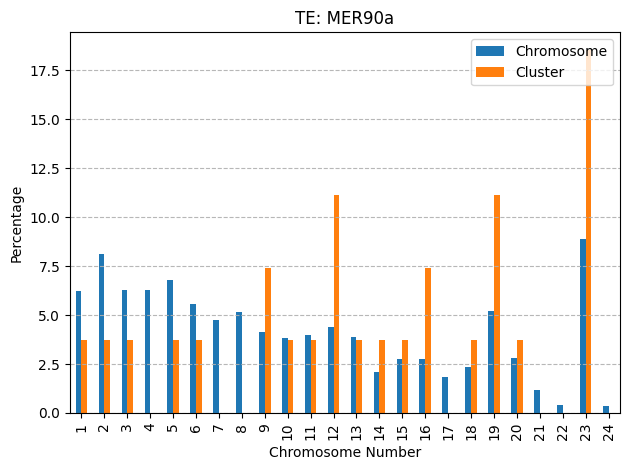

[ 1  2  3  5 10 12 13 17 18 21 23 24]
[ 3  5 12 17 18 22 24]
[]
[24]
[24]
[24]


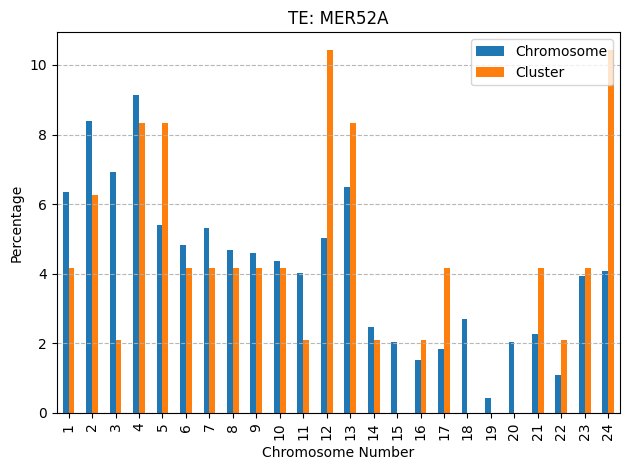

[ 4  5  6  7  8  9 10 15 16 17 18 21 22 24]
[ 5  7  8 10 15 17]
[15]
[15]
[15]
[15]


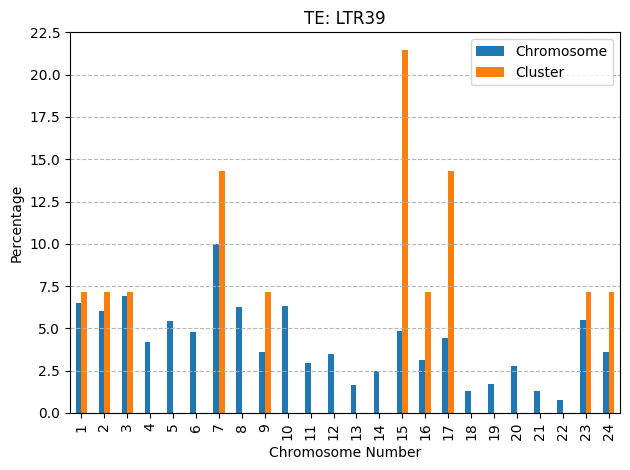

[ 1  2  4  6  7  9 12 13 16 19 20 24]
[ 2  6  7 12 13 16 18 19]
[]
[]
[]
[]


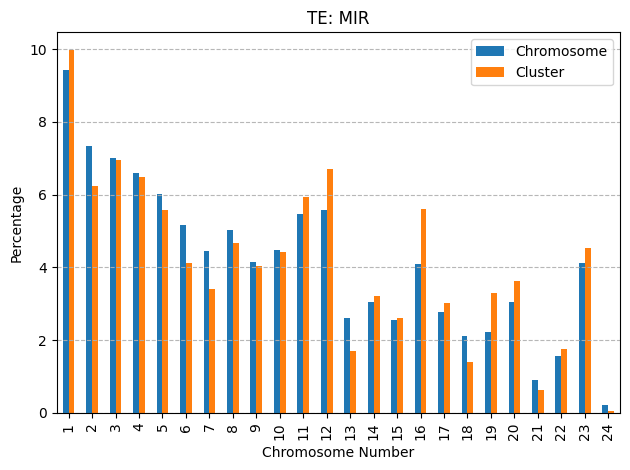

[ 4  5  6  9 10 13 15 16 18 19 20 23]
[ 4  5  6  9 10 18 19]
[]
[]
[]
[]


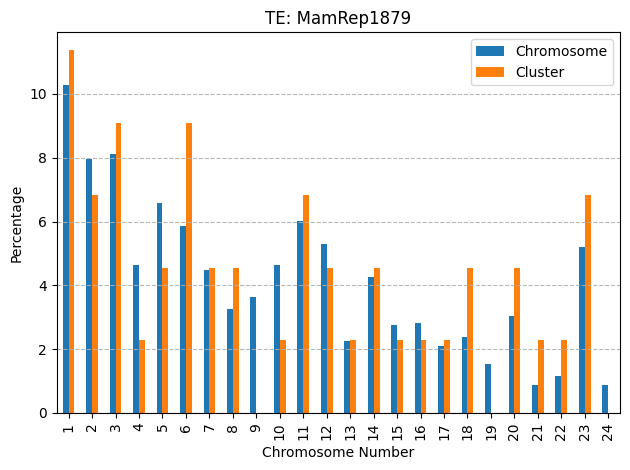

[ 1  2  3  4 11 12 15 17 18 19 23]
[ 2  3 12 15 17 18 23]
[2 3]
[2 3]
[ 2  3 12 15]
[ 2  3 12 15]


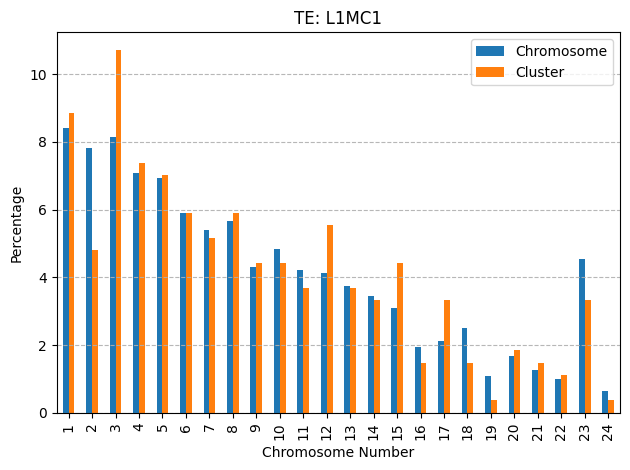

[ 1  4  6  7  8 11 12 18 19 23 24]
[ 4  6  7  8 11 19 23]
[19 23]
[23]
[ 6 19 23]
[ 6 19 23]


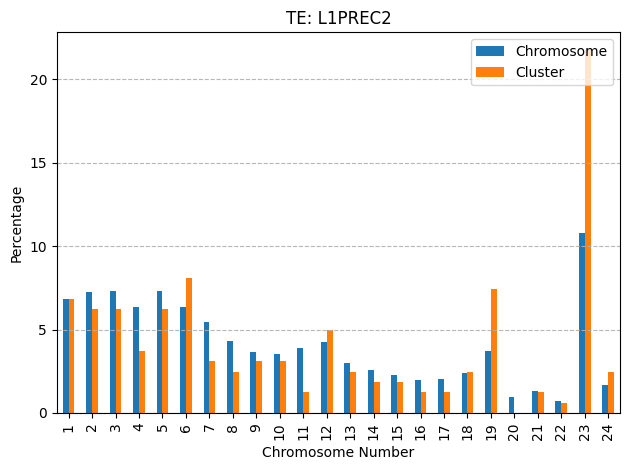

[ 1  2  3  4  5  8 10 11 16 17 19 22 23]
[ 4 16 17 19 22]
[]
[19]
[19]
[19]


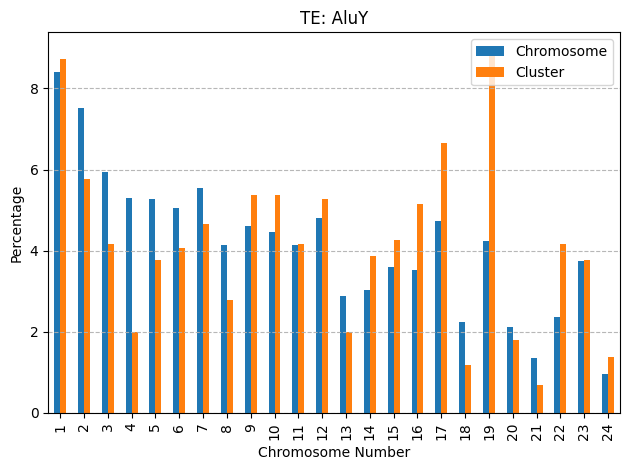

[ 2  4  6  7  9 10 13 16 17 19 22 23 24]
[ 4  6  9 13 20 23]
[]
[23]
[]
[23]


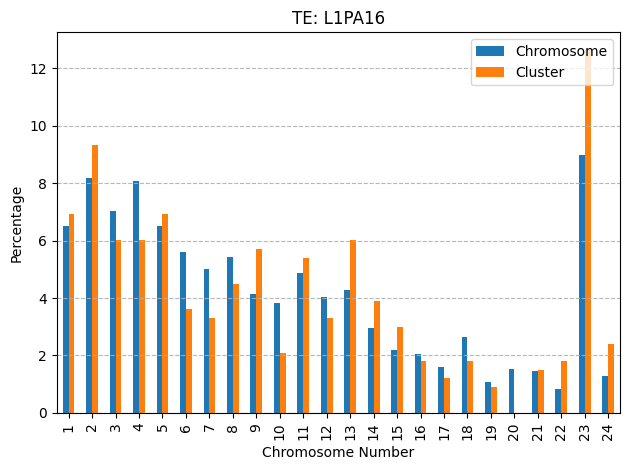

[ 2  3  4  7  8  9 10 11 14 15 20 21 22]
[ 2  4  5  8 14 21]
[2]
[2]
[2]
[2]


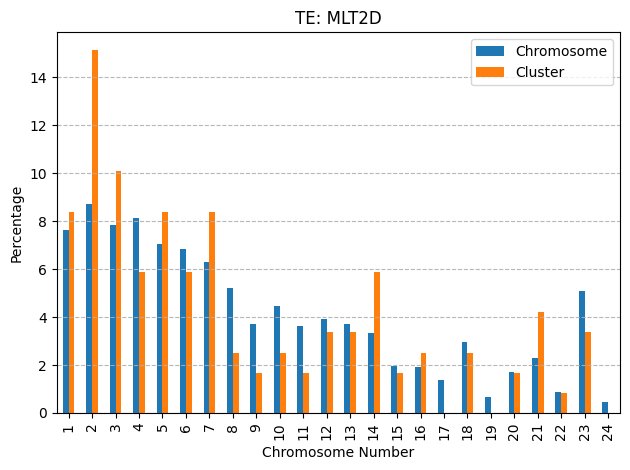

[ 1  2  3  4 11 12 13 16 17 19 22 23 24]
[ 1  2  3  4 13 17 19]
[17 19]
[17 19]
[17 19]
[17 19]


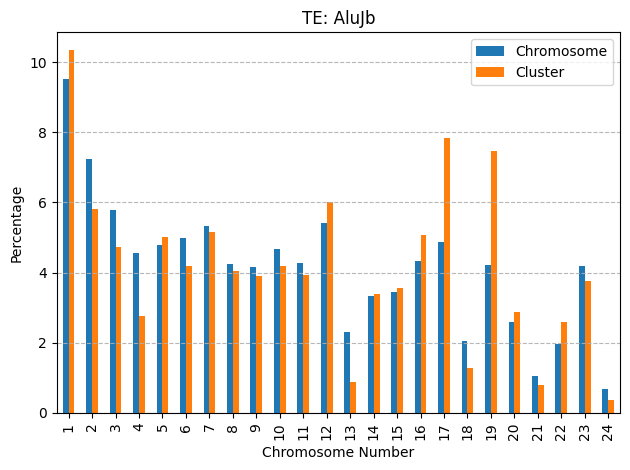

[ 3  5  8 10 11 12 15 17 19 20 23 24]
[ 3  8 12 17 23 24]
[]
[24]
[24]
[24]


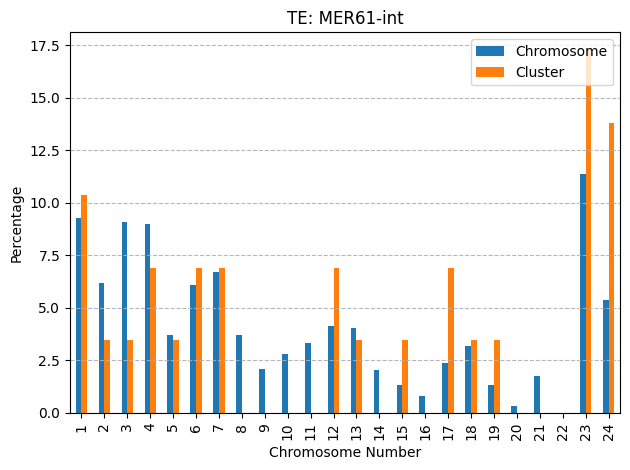

[ 1  2  4  9 10 12 13 15 16 18 21 24]
[ 1 10 12 15]
[10]
[10]
[10]
[10]


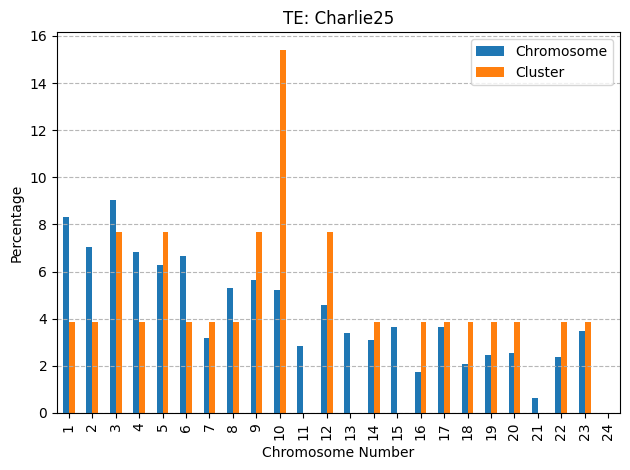

[ 1  2  3  4  5  6 11 12 14 15 17 23]
[ 1  2  4 17 23]
[ 1 17]
[1]
[ 1  2 17]
[ 1  2 17]


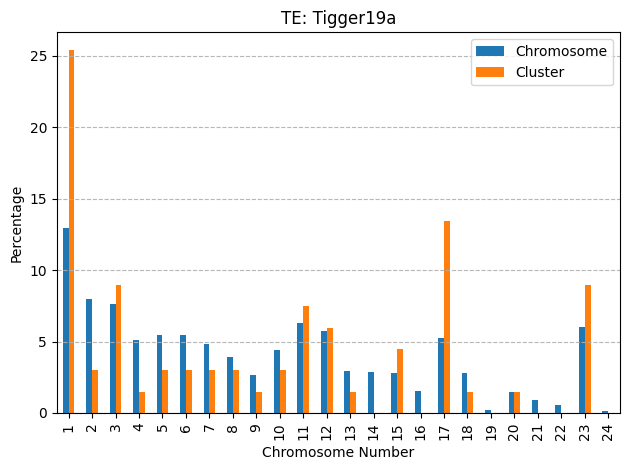

[ 3  4  6  8  9 11 12 13 15 18 20 21]
[ 3  4  6  8  9 10 11 18]
[]
[]
[]
[]


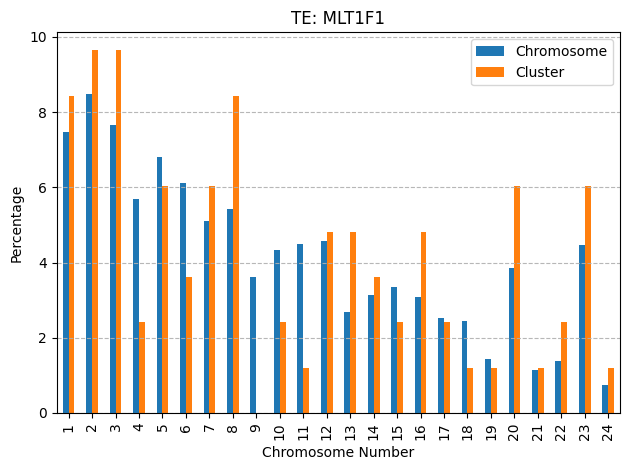

[ 1  2  4  6  9 10 11 12 16 19 20 23 24]
[ 1  9 12 16 19 20 23]
[16 20]
[16 20]
[16 19 20]
[16 19 20]


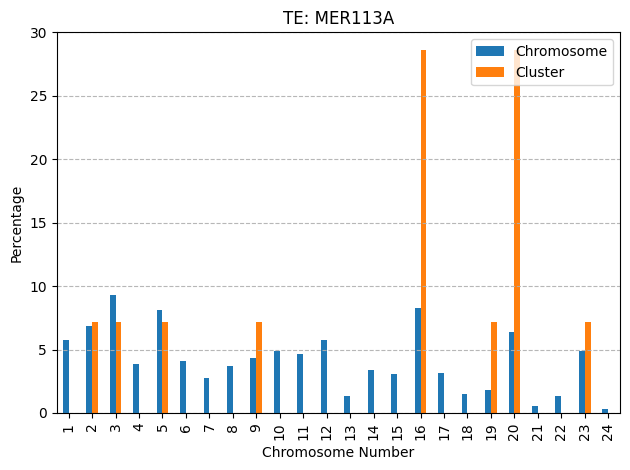

[ 4  5  6  8 10 12 13 18 19 20 22 23]
[ 4  5  6  8 10 11 22 23]
[]
[23]
[]
[23]


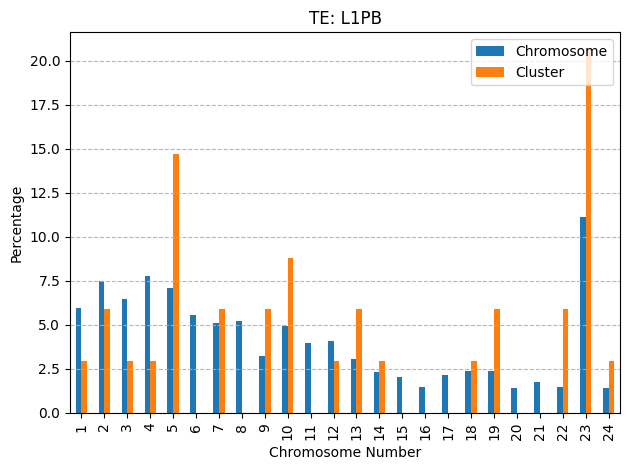

[ 1  2  4  6  7  8 10 11 13 18 20 24]
[ 1  2  4  7  8  9 10 11 12 13 15 16 20]
[]
[]
[]
[]


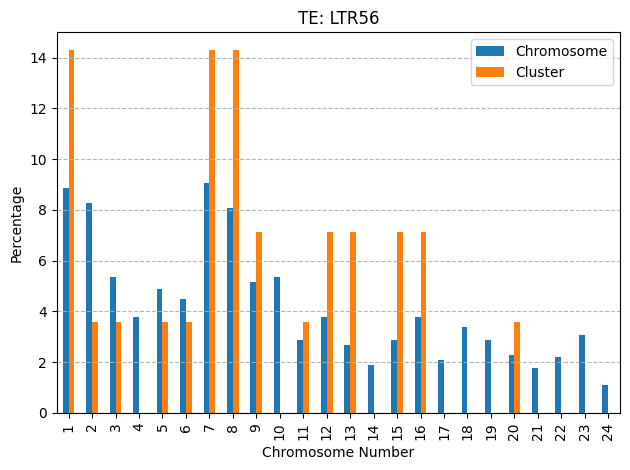

[ 1  2  3  5  6  9 11 14 15 17 19 20 24]
[ 1  3  5  6 15 20 23]
[]
[]
[]
[]


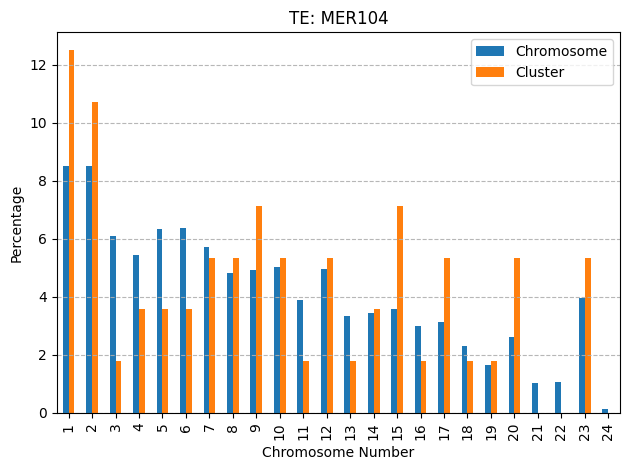

[ 1  2  3  4  5  7  8 12 14 16 17 21 23]
[ 1  3  8 12 17 23]
[17]
[17]
[17]
[17]


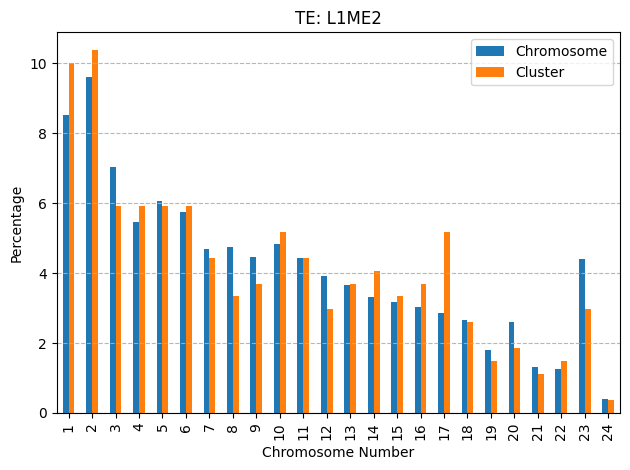

[ 1  2  3  6  7  8  9 10 11 12 15 22]
[ 1  2  6  9 11 12 15 20]
[ 1  6 12]
[6]
[ 1  6 12]
[ 1  6 12]


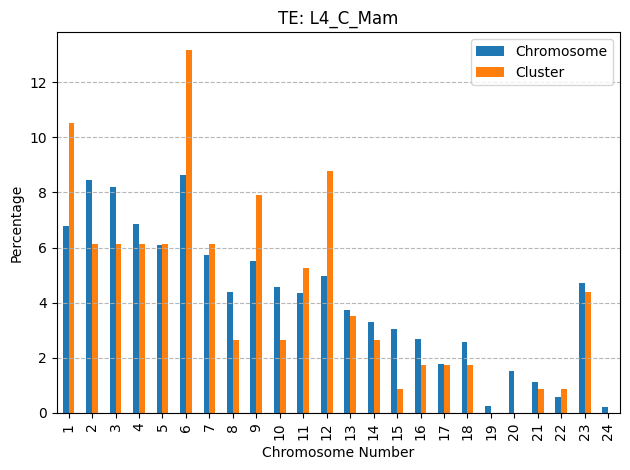

[ 1  2  5  9 10 11 12 15 18 21 23]
[ 2 10 11 14 23]
[]
[]
[11]
[11]


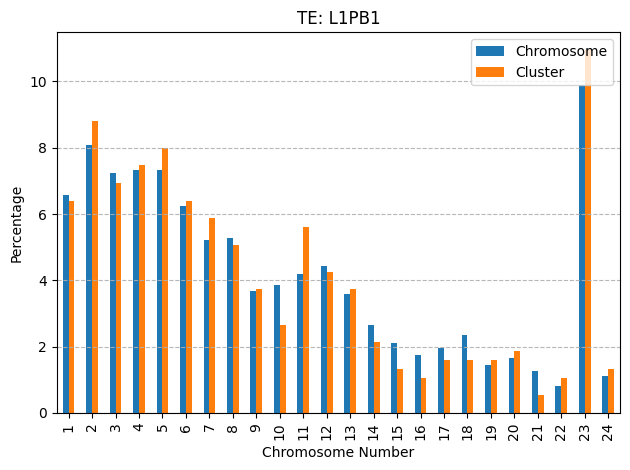

[ 1  3  4  5  6  7  9 11 13 19 23 24]
[ 1  3  4  5  7  8  9 13 15 16 18 23]
[]
[]
[]
[]


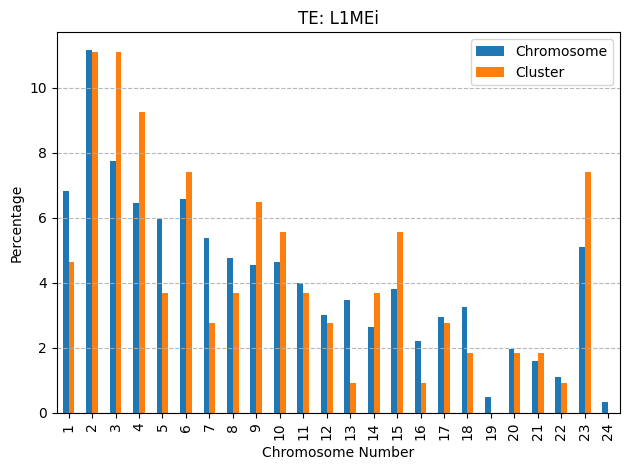

[ 1  2  3  4  6  7  8 12 13 15 20]
[ 1  4  5  6  7 13 17 20]
[]
[]
[1]
[1]


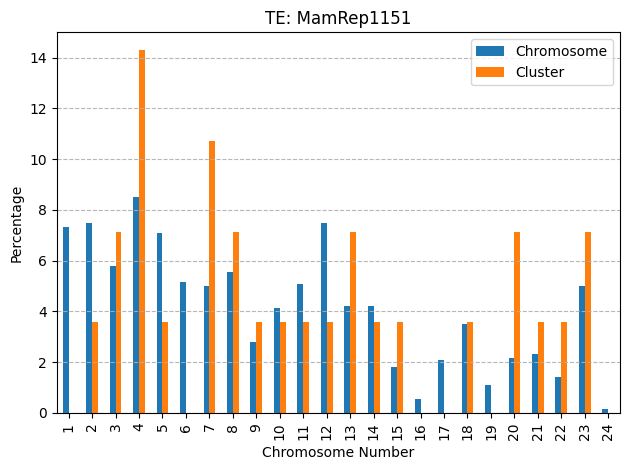

[ 4  8 11 12 13 15 16 17 18 19 21 23]
[ 4 11 12 15 17 19 23]
[19]
[19]
[17 19]
[17 19]


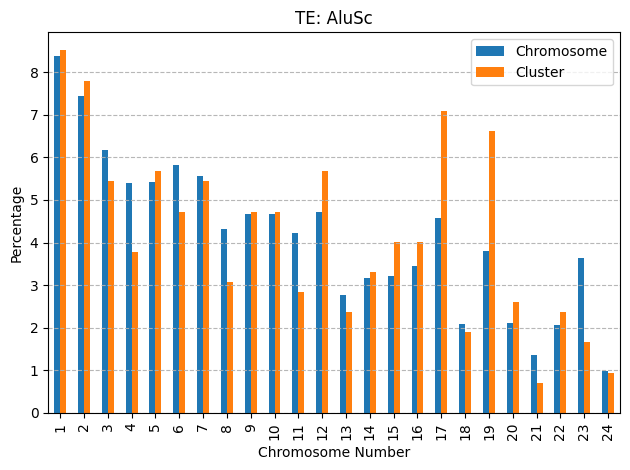

[ 2  3  5  6  7  8  9 12 15 19 21 23]
[ 3  5 23]
[23]
[23]
[23]
[23]


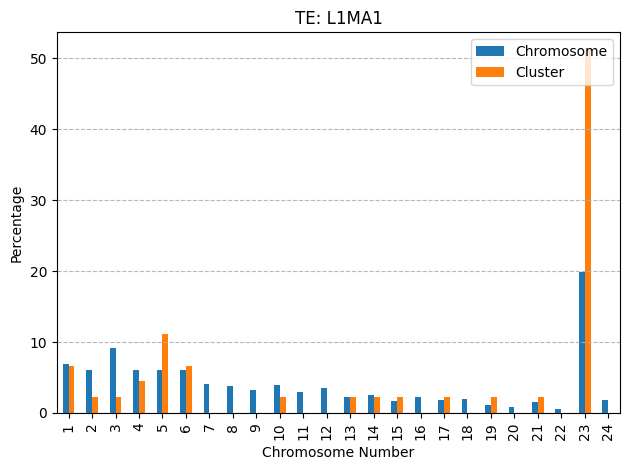

[ 1  2  4  6  8 11 16 17 18 22 23 24]
[ 1  4  6  8 23 24]
[23]
[23]
[23 24]
[23 24]


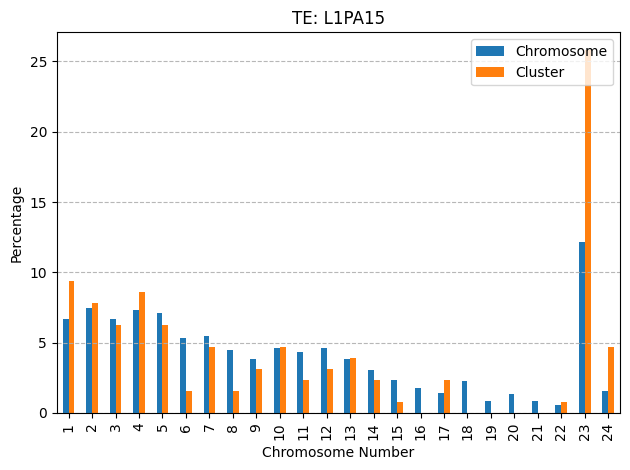

[ 1  4  5  8  9 10 12 13 14 15 16 21 22 24]
[ 1  3  4  8 12 13 16 17 18]
[]
[]
[]
[]


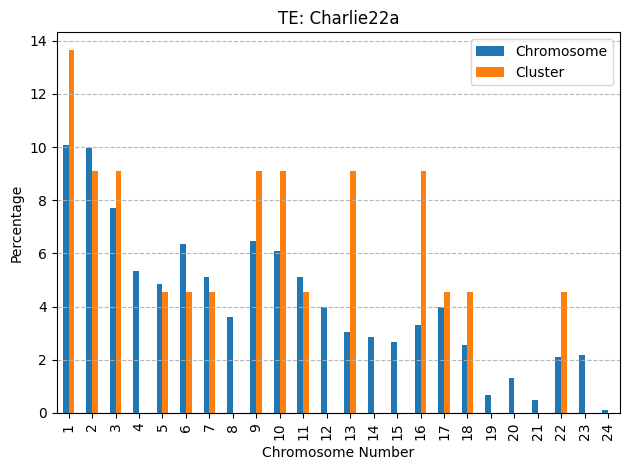

[ 1  2  3  6  7  9 11 13 15 16 19 23]
[ 1  3 11 15 16 23]
[1]
[1]
[ 1 15]
[ 1 15]


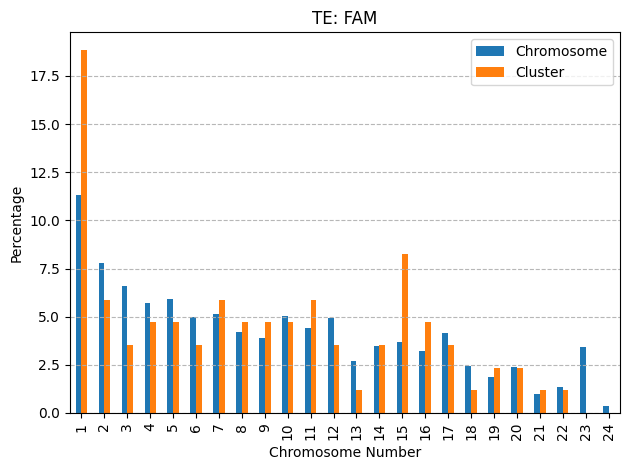

[ 2  3  6  9 11 13 14 15 18 19 20 21 24]
[ 2  3  6  9 11 14 21 22 24]
[]
[]
[]
[]


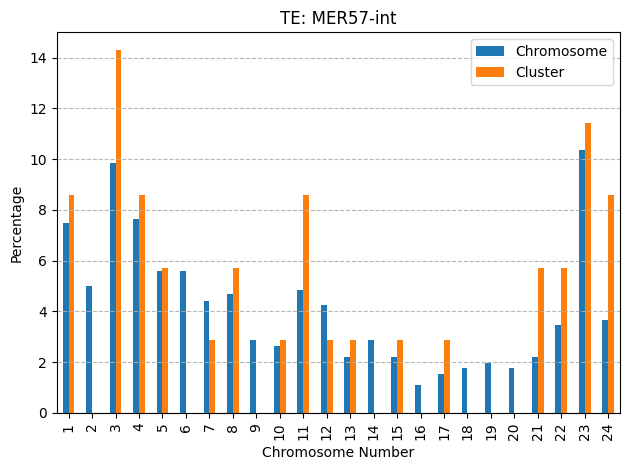

[ 1  2  3  4  7  9 10 13 14 16 19]
[ 2  7 14 16 19]
[]
[14]
[14]
[14]


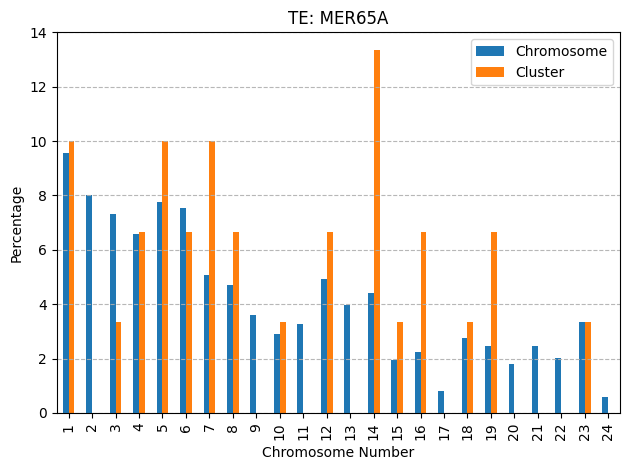

[ 1  2  3  4  6  8 10 11 13 17 19 21]
[ 1  2  3  4  6  8 10 12 17 19]
[]
[]
[ 4 17 19]
[ 4 17 19]


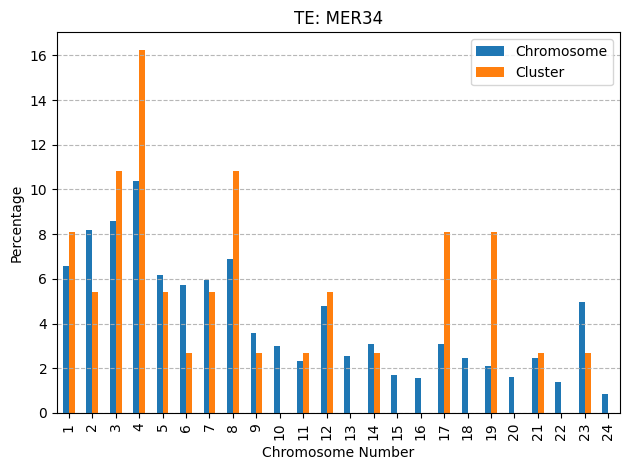

[ 1  3  7  8  9 10 13 14 15 19 23]
[ 1  3  7 10 13 23]
[23]
[23]
[23]
[23]


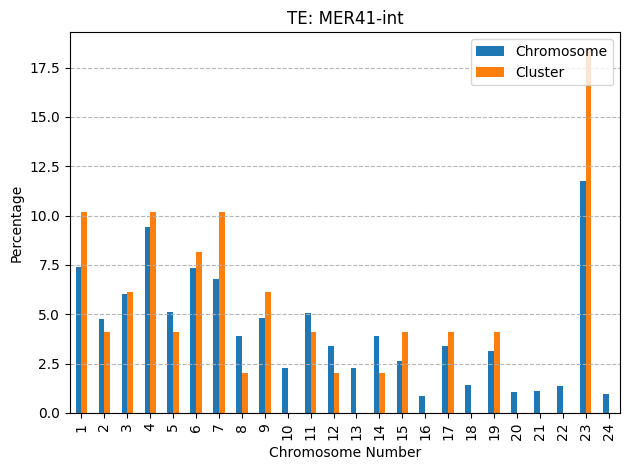

[ 1  5 12 13 14 16 17 18 19 22 24]
[ 1  5 12 13 17 19 22 23]
[]
[17]
[]
[17]


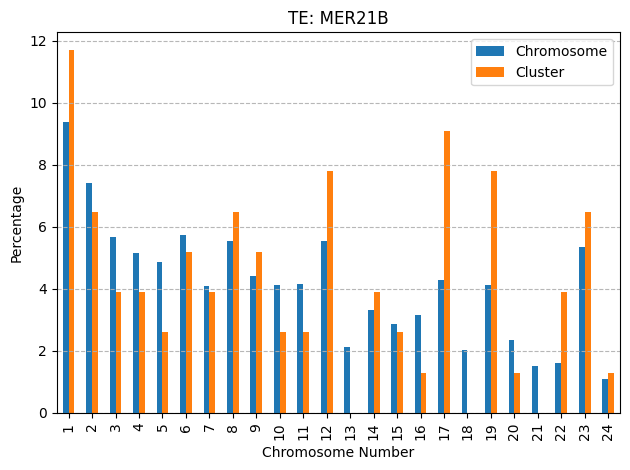

[ 1  2  4  6  7 11 12 16 17 19 23 24]
[ 4  6 11 16]
[]
[]
[]
[]


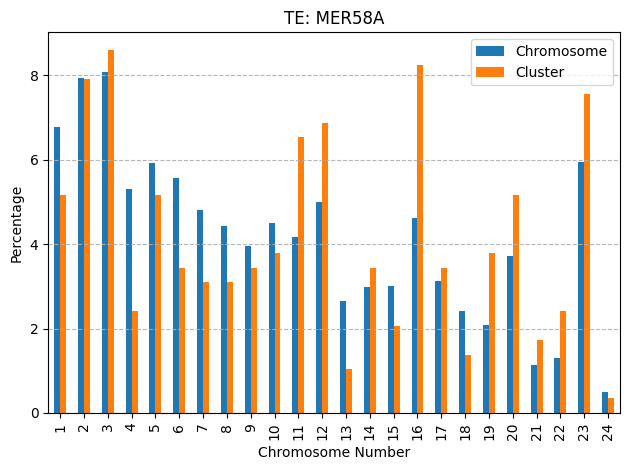

[ 3  4  5  9 10 11 12 13 16 19 23]
[ 3  4  5 10 12 13 21]
[]
[10]
[]
[10]


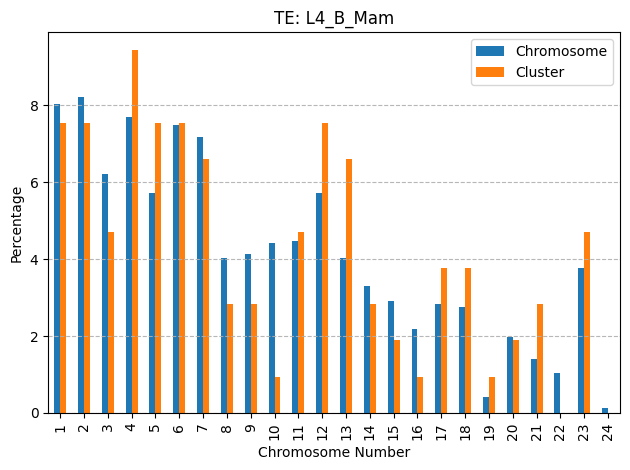

[ 1  3  6 10 11 12 13 19 23 24]
[ 3  4 10 11 12 19 23 24]
[]
[24]
[24]
[24]


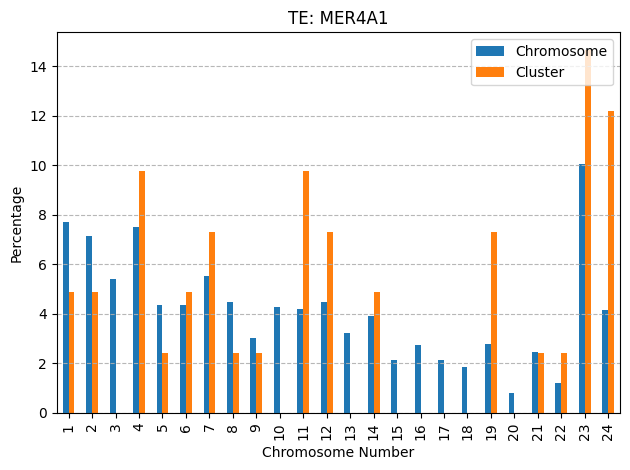

[ 2  3  4  5  6  7 11 12 15 16 18 20 24]
[2 3 4 5]
[]
[2]
[2]
[2]


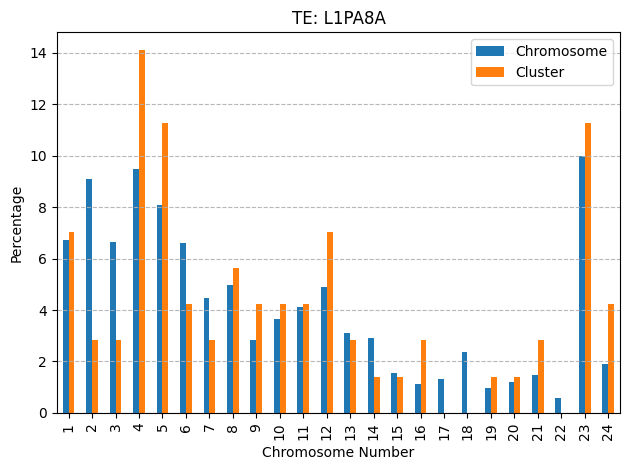

[ 1  2  3  6 10 11 12 13 16 19 23 24]
[ 1  3  6 13 19 23]
[1]
[1]
[1]
[1]


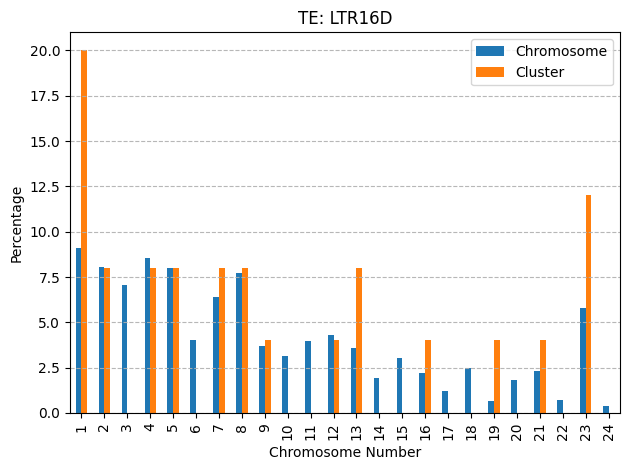

[ 3  4  7  9 10 11 13 15 18 19 20 21 22 23 24]
[ 1  3  4  5  7  9 12 16 18 21 23]
[]
[]
[]
[]


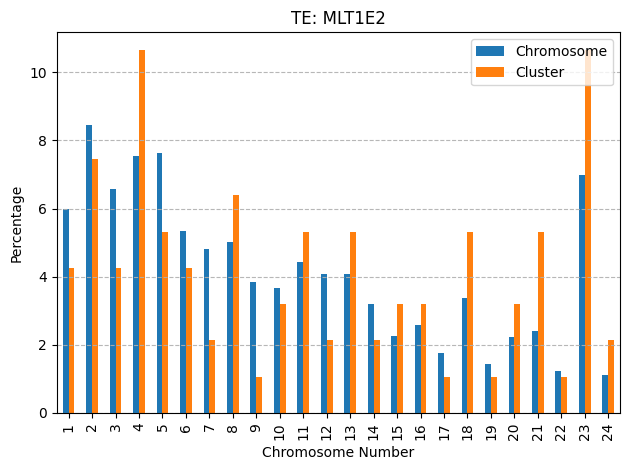

[ 1  3  6  7  9 10 11 12 15 16 17 19]
[ 6  9 12 15 17 19]
[19]
[19]
[17 19]
[17 19]


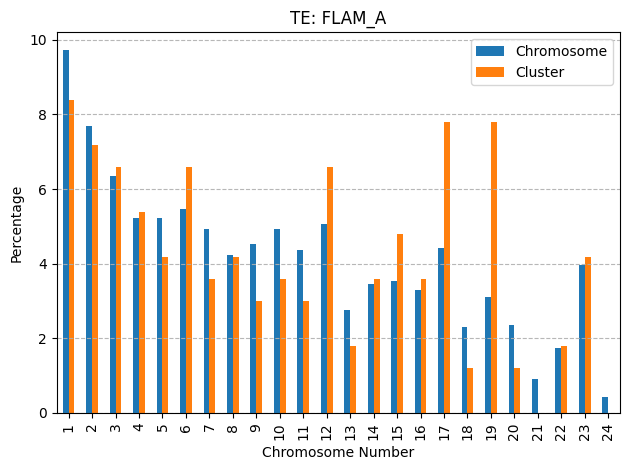

[ 1  4  5  7  9 10 12 15 16 18 20 24]
[ 1  4  7  8 12 14 15 16 19 22]
[]
[]
[]
[]


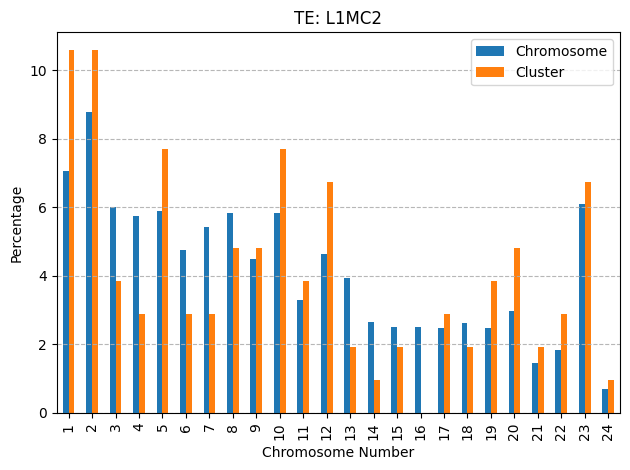

[ 1  6  7  8  9 10 11 14 15 17 18 23]
[ 1  6  7 10 11 15 23]
[ 1 23]
[ 1 23]
[ 1 10 23]
[ 1 10 23]


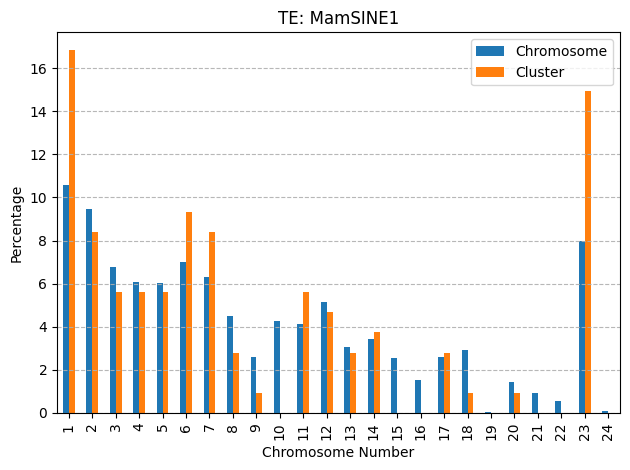

[ 1  4  6  8 10 12 14 16 18 19 20 23]
[ 1  4  6 14 16 19]
[]
[]
[]
[]


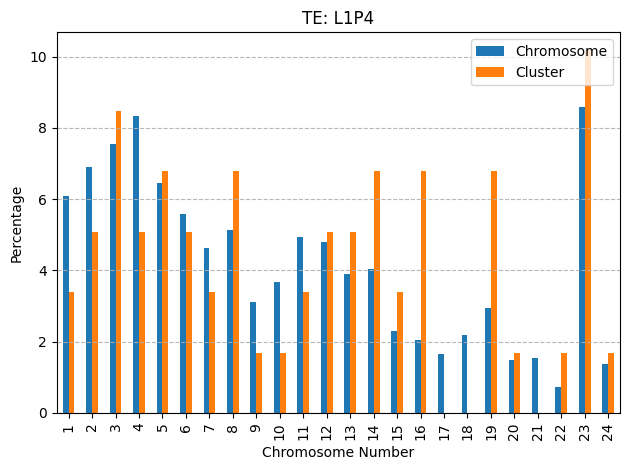

[ 2  3  5 10 13 14 15 16 17 19 21 23 24]
[ 2  3  5 13 16 17 23]
[]
[2]
[]
[2]


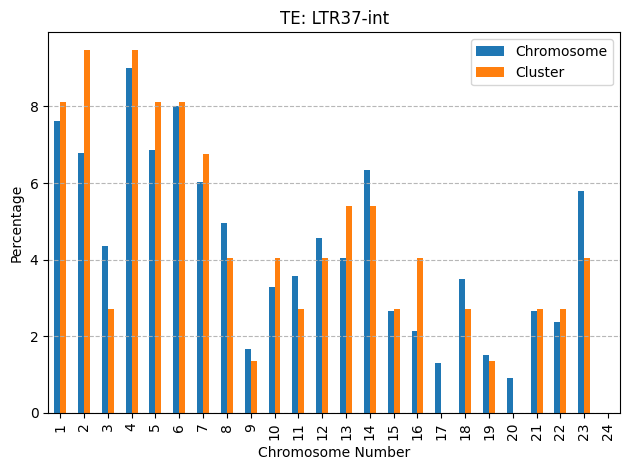

[ 4  5 12 13 14 15 16 17 19 20 23 24]
[ 4  5 14 16 19 20 23]
[16 19 20 23]
[23]
[16 19 20 23]
[16 19 20 23]


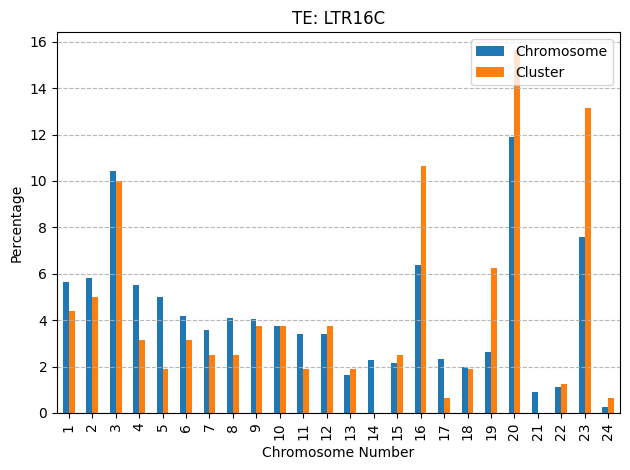

[ 1  2  3  5  6  7  8 10 11 12 15 17 19 22 24]
[ 1  2  5  6 11 12 19 21]
[]
[]
[]
[]


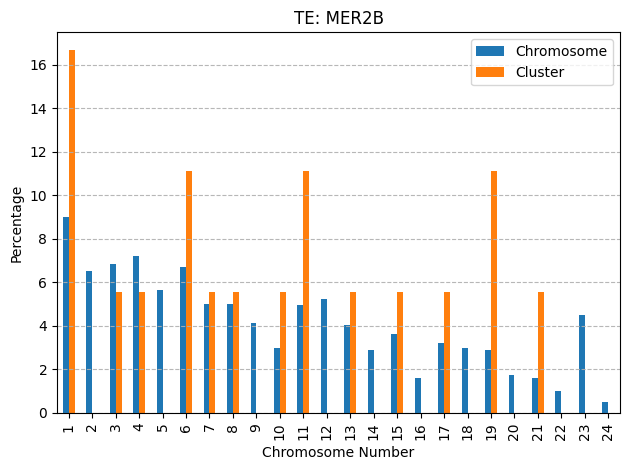

[ 2  5  6  7 11 12 14 17 18 19 23 24]
[ 2  7 18 19 23]
[23]
[23]
[ 7 18 23]
[ 7 18 23]


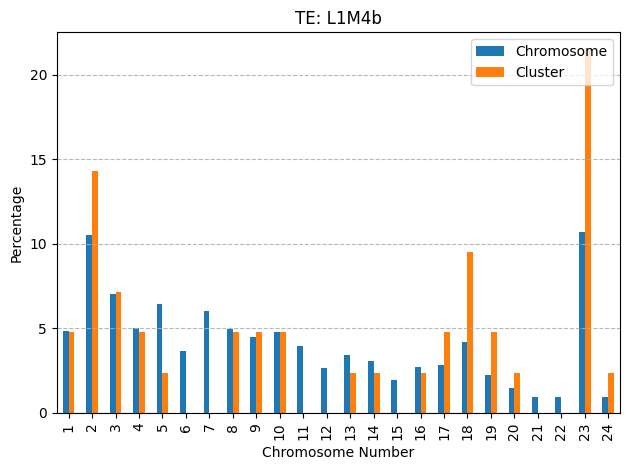

[ 1  6  7  9 10 12 15 16 17 19 23 24]
[ 7  8 10 12 19 23 24]
[]
[]
[23]
[23]


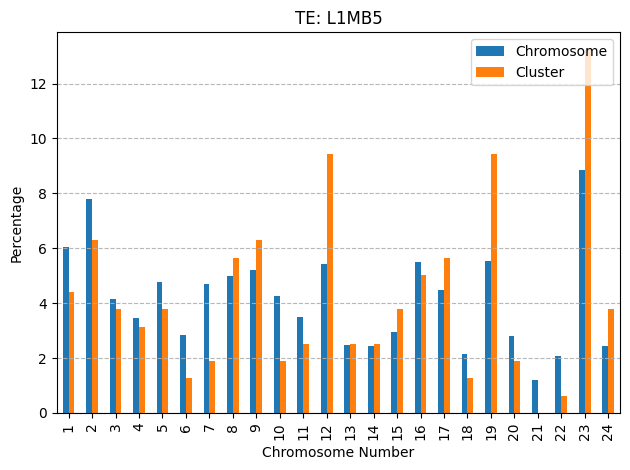

[ 2  4  7  8 10 13 16 17 19 22 23 24]
[ 2  4  7 16 19]
[ 7 19]
[19]
[ 7 19]
[ 7 19]


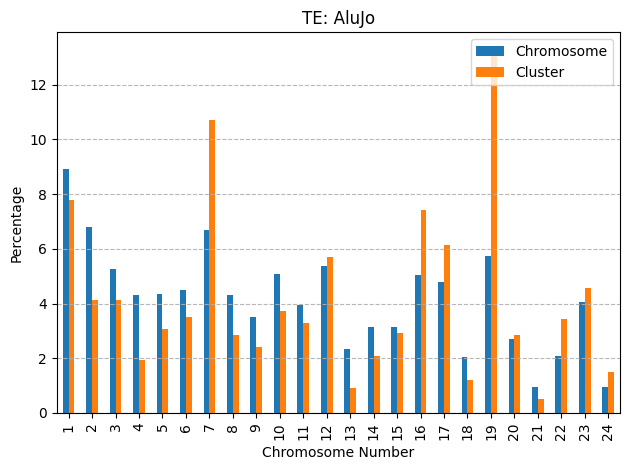

[ 2  3  6  7  9 10 11 17 18 22 23]
[ 2  6  7  9 10 17 23]
[]
[]
[]
[]


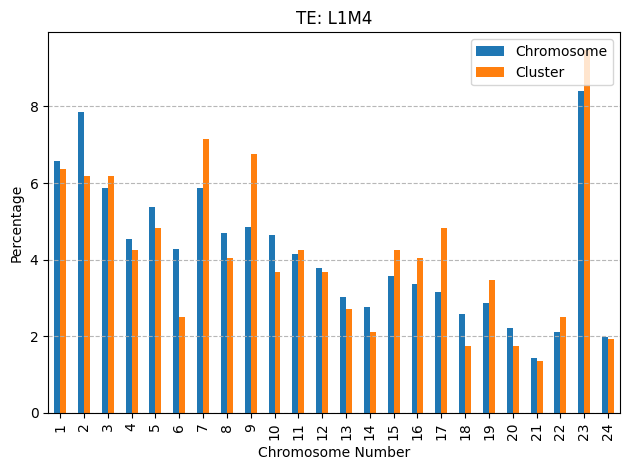

[ 1  3  7  8 10 13 14 15 16 17 18 19]
[ 1  3  7  8  9 10 13 15 22 24]
[]
[1]
[]
[1]


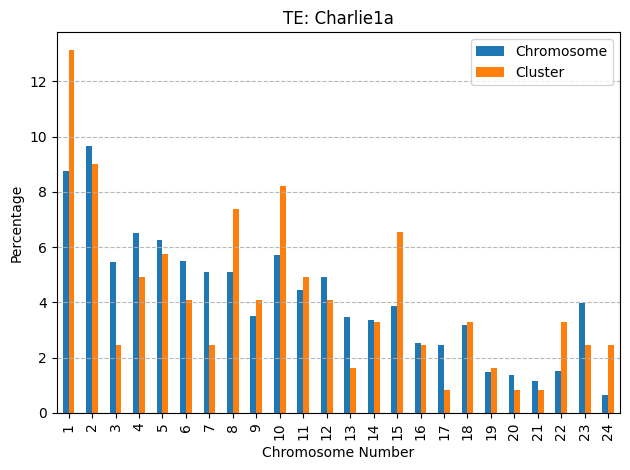

[ 3  4  5  7  9 10 14 16 19 23 24]
[ 3  4  7 10 12 13 15 16 18 23 24]
[]
[]
[]
[]


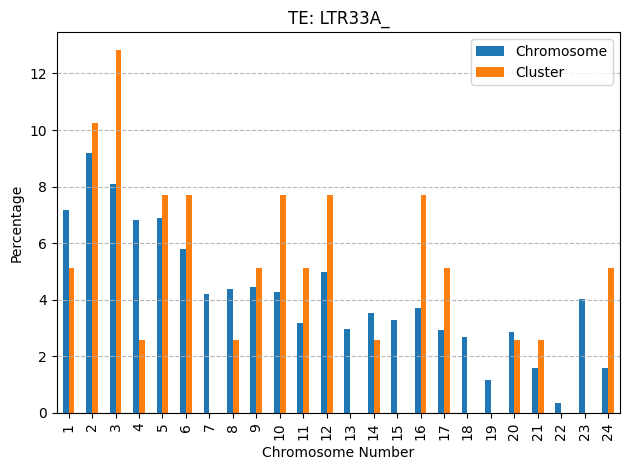

[ 2  6  7 10 11 13 14 19 20 21 23]
[ 2  6  7 10 11 14 19]
[]
[]
[10]
[10]


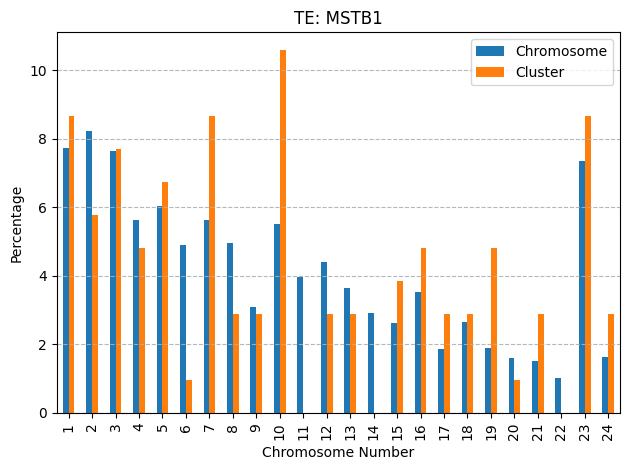

[ 1  2  3  4  5 12 17 20 21 24]
[ 1  2  3  4  5 12 17 23]
[]
[]
[ 1 17]
[ 1 17]


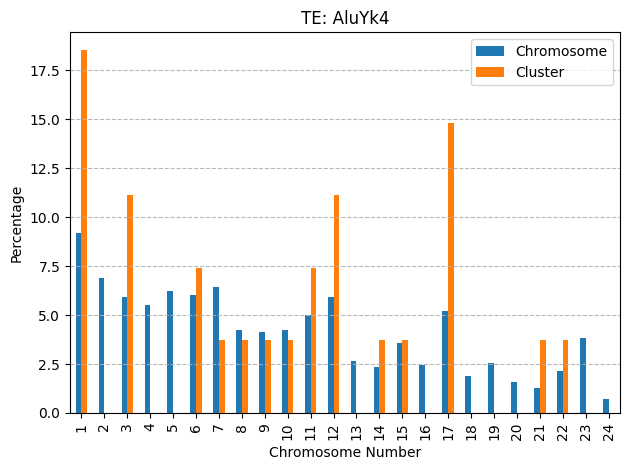

[ 1  2  3  4  8  9 11 13 19 21 22 23 24]
[ 1  2  3  4  9 19 23 24]
[]
[]
[]
[]


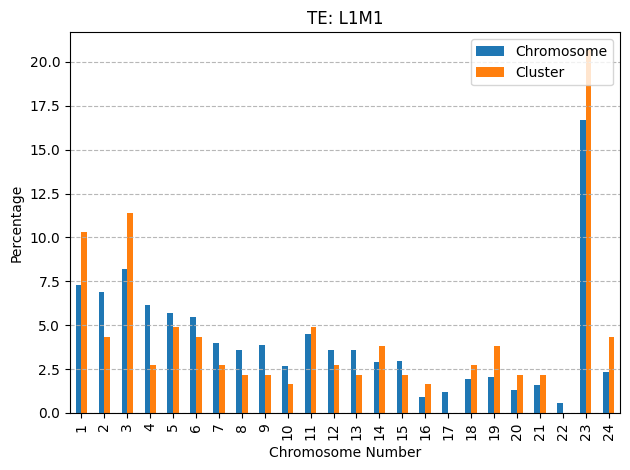

[ 1  2  3  4  6  7  9 10 14 18 23]
[ 1  2  3  6  7 23]
[3]
[3]
[3 6]
[3 6]


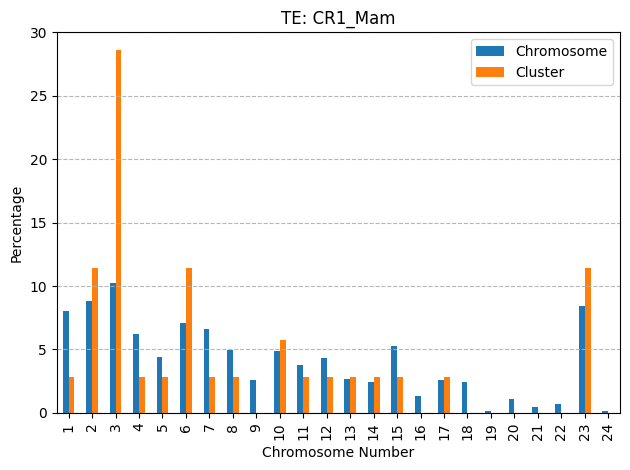

[ 1  2  3  4  5  6  7  9 14 15 17 24]
[ 3  4  6  7  8  9 11 14 15 17 21]
[]
[]
[]
[]


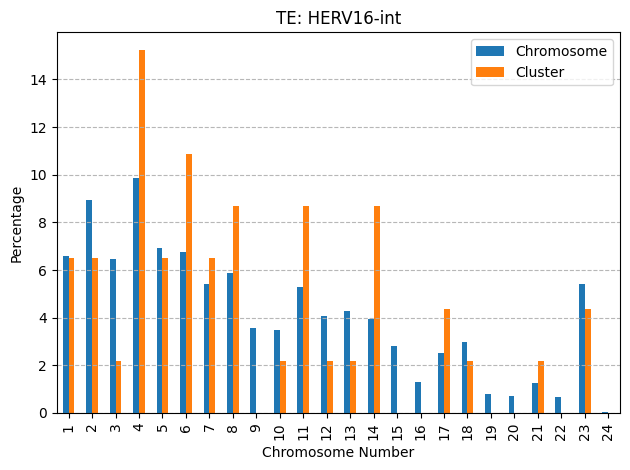

[ 1  3  5  6  7  9 11 12 15 18 21 23]
[ 1  3  5  6  7 15 18]
[]
[18]
[18]
[18]


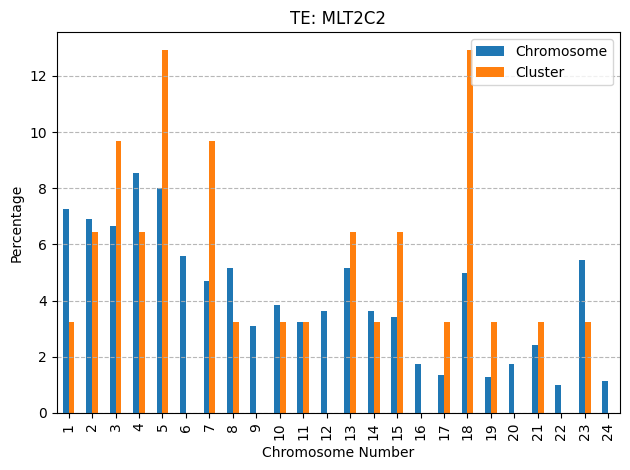

[ 1  4  6  8 13 16 17 20 21 22 23 24]
[ 1  3  4  6  7 16 18 21 23]
[]
[]
[]
[]


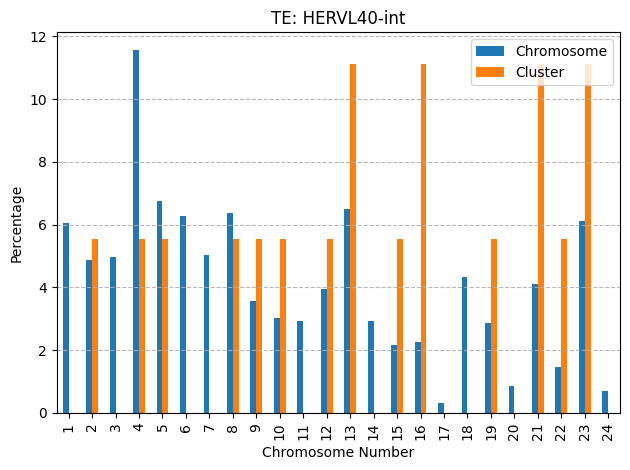

[ 1  3  4  6  7  8 10 11 15 17 18 20 24]
[ 1  3  4  6  8 11 17 18]
[]
[11]
[]
[11]


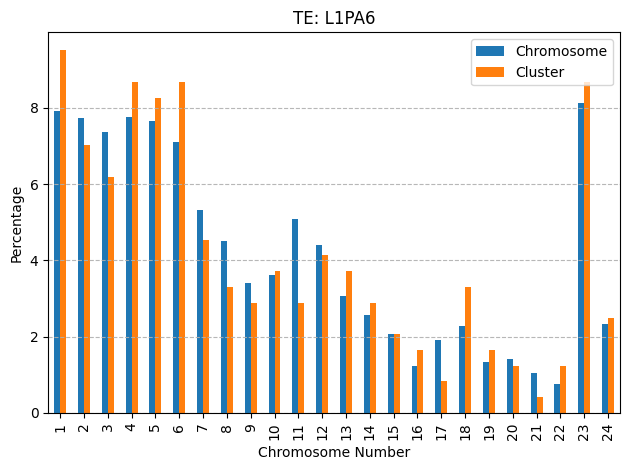

[ 1  2  3  4  7 14 16 18 19 21 22 24]
[ 2 18 19 24]
[24]
[24]
[19 24]
[19 24]


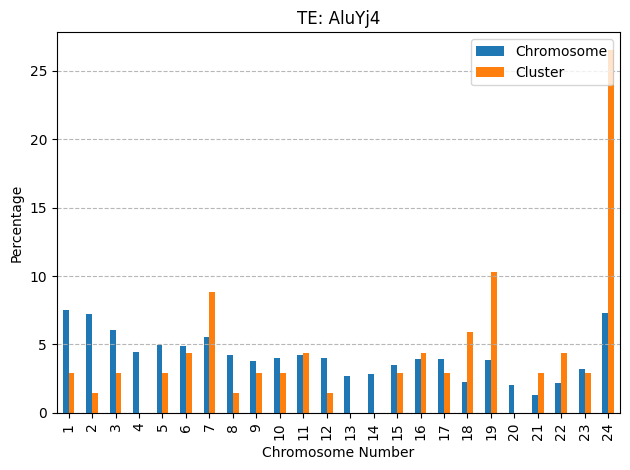

[ 1  2  3  4  7  8  9 11 12 13 14 22 23]
[ 1  2  4  7 11 22]
[1]
[1]
[1]
[1]


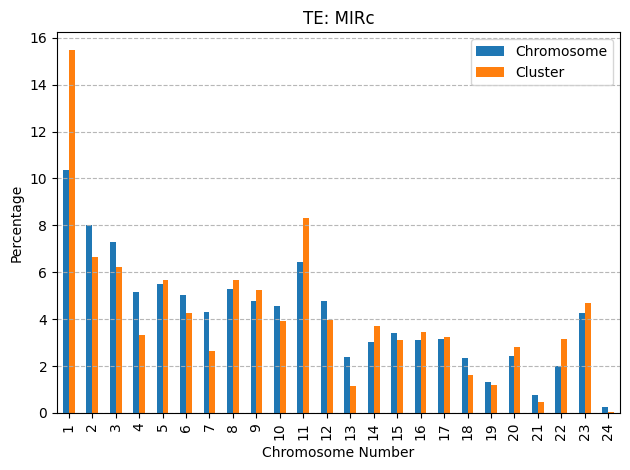

[ 3  4  5  6  8 12 13 17 19 21 22 23]
[ 3  4  5 13 17 22 23]
[]
[23]
[ 4 23]
[ 4 23]


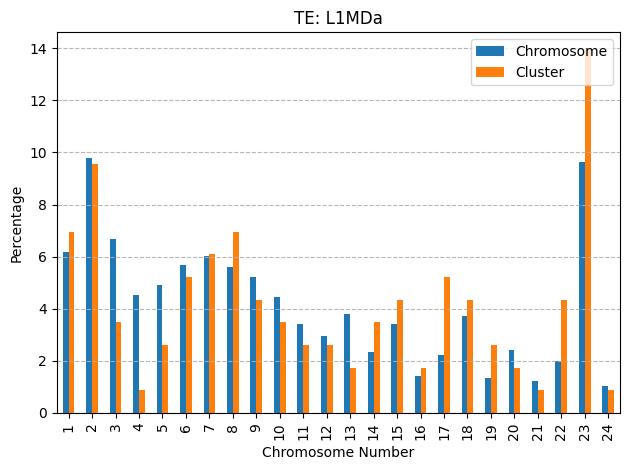

[ 1  2  5  7  8  9 10 14 16 18 22]
[ 1  2  7  8  9 10 13 14 22]
[]
[]
[]
[]


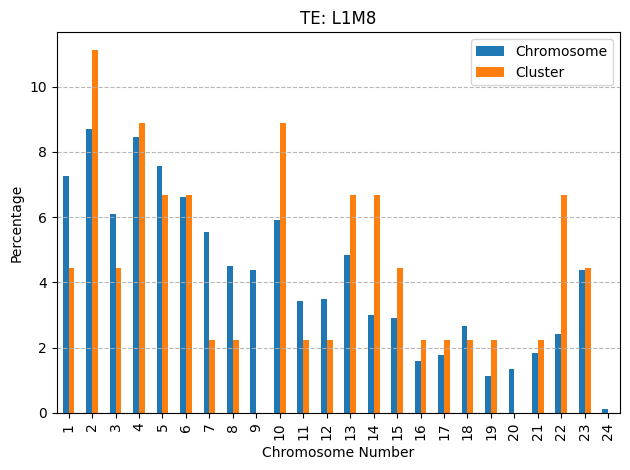

[ 2  4  5  7 14 15 16 19 21 22 23 24]
[ 2  4  7 16 19 20 23 24]
[19]
[19]
[19]
[19]


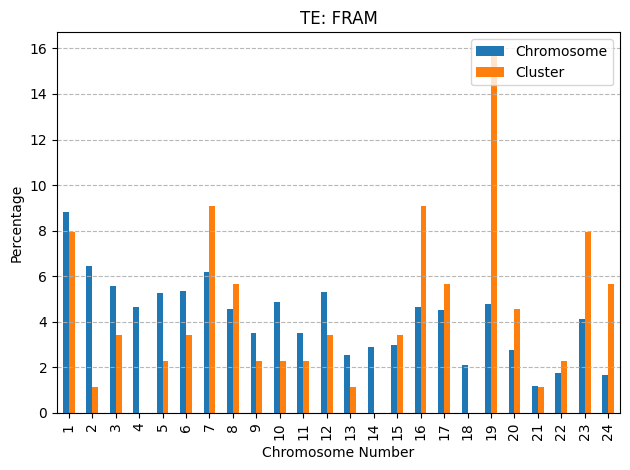

[ 3  5  6  7  8 11 12 16 17 19 23 24]
[ 3  4  5  7  8 12]
[]
[12]
[12]
[12]


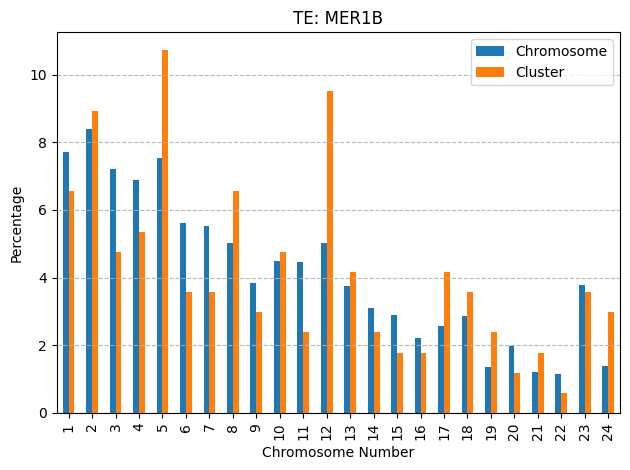

[ 2  3  8  9 10 11 12 16 19 20 23]
[ 3  8  9 11 16 23]
[]
[3]
[3]
[3]


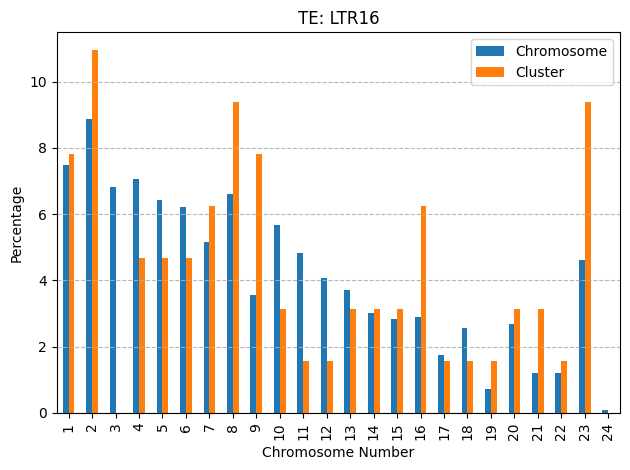

[ 4  6  7  8  9 10 12 13 15 17 18 19 20 23]
[ 4  7  8  9 10 12 18 19]
[4 9]
[]
[ 4  7  8  9 12]
[ 4  7  8  9 12]


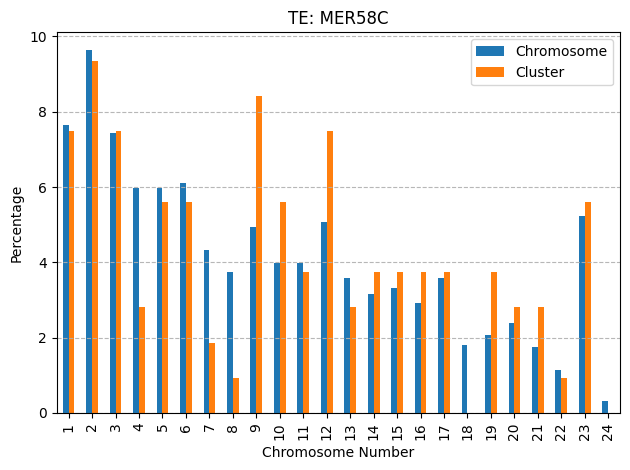

[ 3  4  6  7  9 10 12 15 16 18 22 23]
[ 3  4  9 12 15 16 20 23]
[ 4 23]
[]
[ 4 23]
[ 4 23]


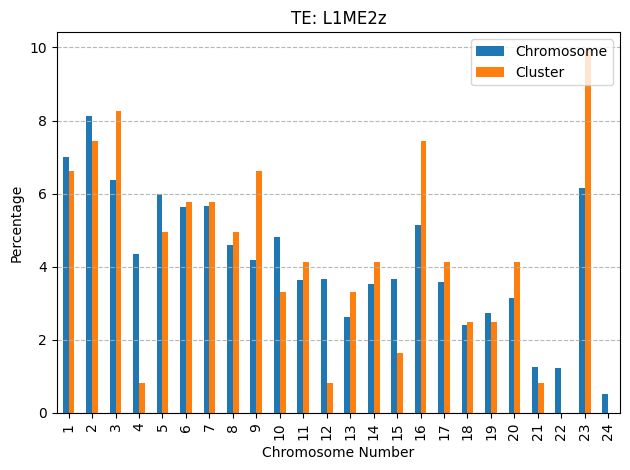

[ 2  3  4  7  9 10 14 15 16 17 18]
[ 2  3  5  6 14 15 16 21]
[]
[2]
[]
[2]


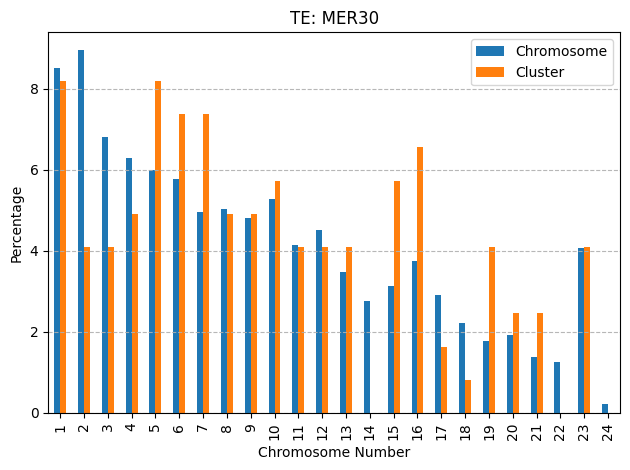

[ 1  2  4  8 10 12 14 19 20 21 23 24]
[ 2 14 19 23]
[23]
[23]
[ 2 19 23]
[ 2 19 23]


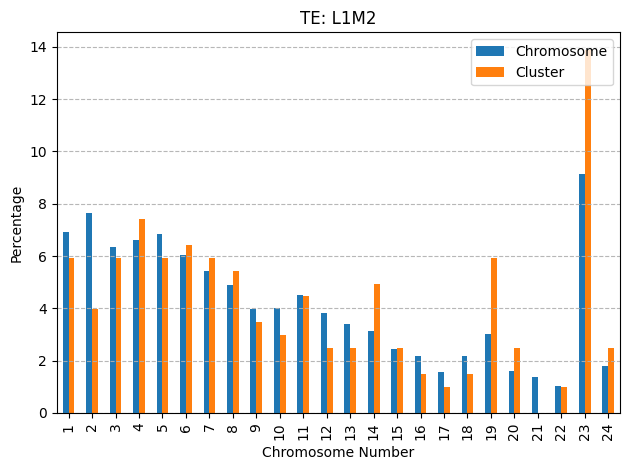

[ 2  3  4  5  9 10 11 12 13 19 24]
[ 2  3  4  5 11 12 13 15 19 23]
[4]
[4]
[4 5]
[4 5]


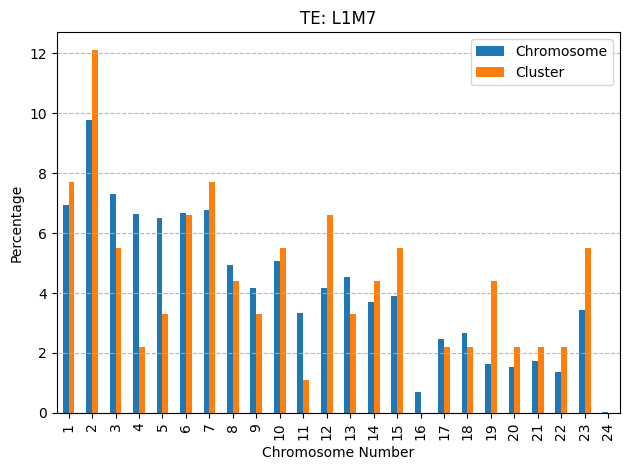

[ 1  3  9 11 12 13 14 16 17 18 19 21 23]
[ 1  9 11 14 17 21 23]
[23]
[23]
[17 23]
[17 23]


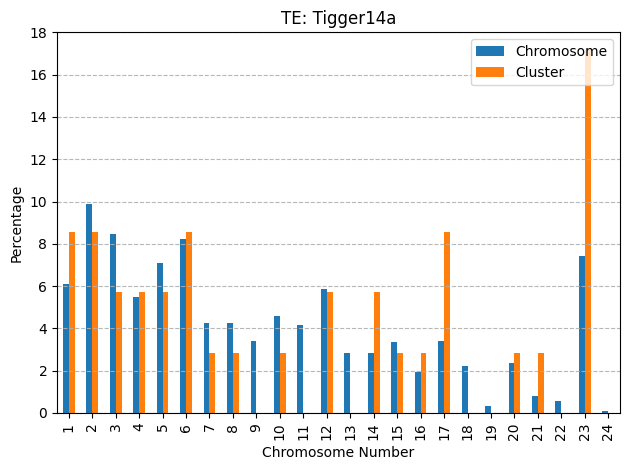

[ 1  2  4  7  9 11 15 17 21 23]
[ 2  4 14 17 21 22 23]
[]
[2]
[2]
[2]


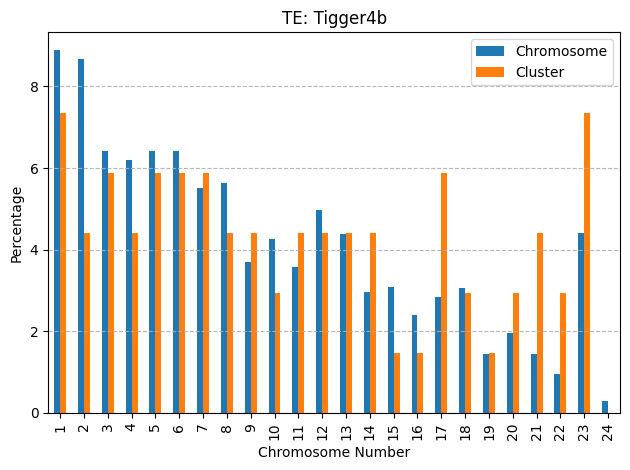

[ 1  3  8 11 13 14 15 16 18 19 22 24]
[ 1  6 11 12 13 14 16 19]
[]
[]
[]
[]


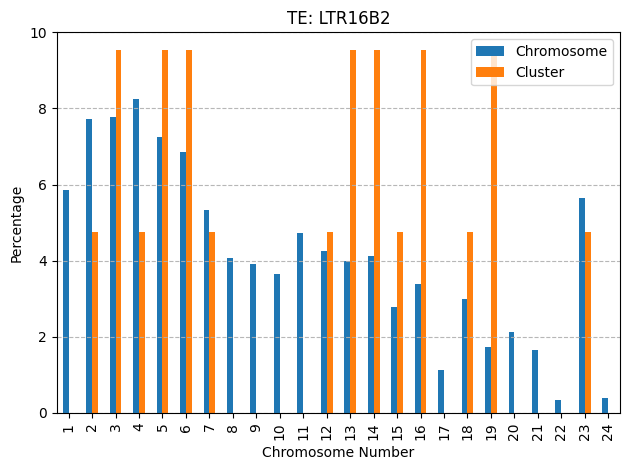

[ 2  3  4  5  7  9 10 12 17 18 19 23]
[ 4  5  7  8  9 10 12 18 23]
[]
[]
[]
[]


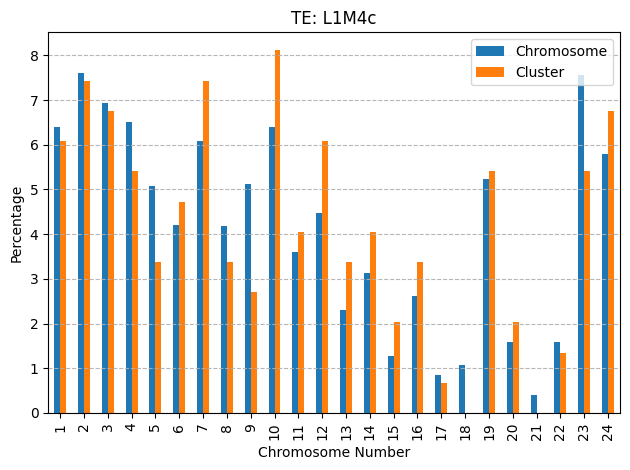

[ 4  6  7  8  9 13 14 16 17 19 20 21 24]
[ 4  6  7 13 14 16 19]
[ 7 19]
[ 7 19]
[ 4  6  7 19]
[ 4  6  7 19]


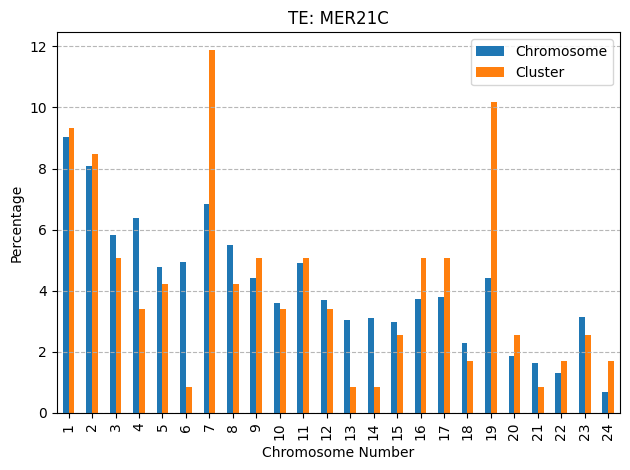

[ 1  3  4  5  7  8 11 12 14 15 18 23]
[ 5  8 12 23]
[ 5 23]
[23]
[ 5 12 23]
[ 5 12 23]


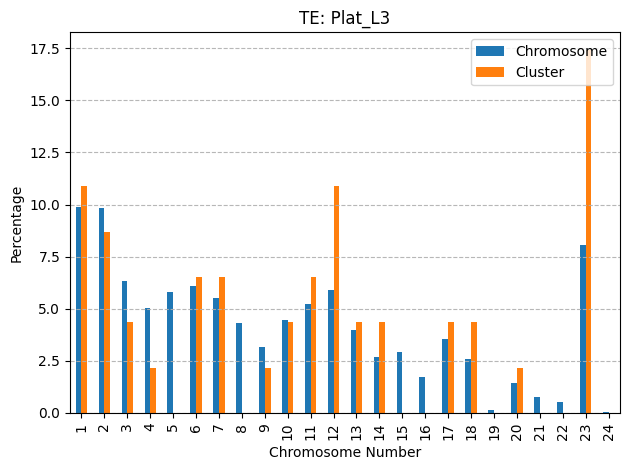

[ 1  2  5  6  7  8 12 14 16 18 19 20 23]
[ 2  6  7 12 19 20 23]
[19 23]
[19 23]
[ 7 19 23]
[ 7 19 23]


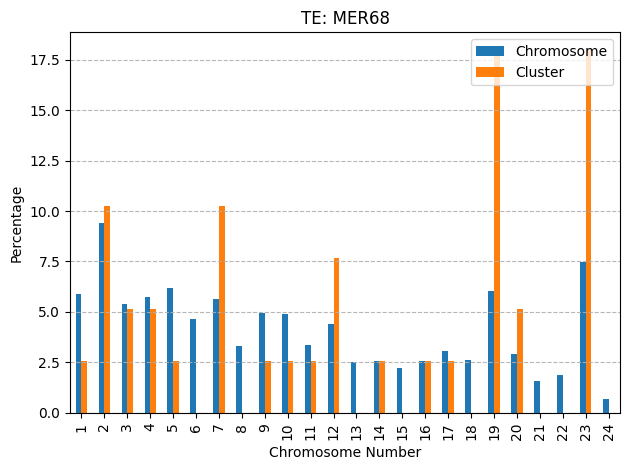

[ 1  4  7  8 12 13 14 15 16 20 22 23 24]
[ 1  4  7  8  9 12 13 20]
[]
[]
[1 4 7]
[1 4 7]


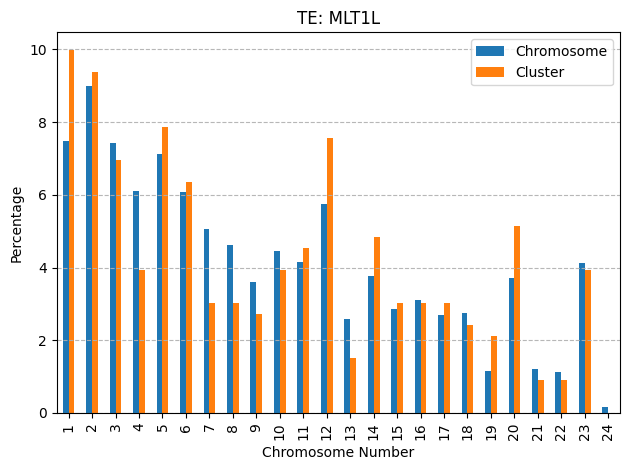

[ 3  7  8 10 13 14 18 19 20 22 23 24]
[ 7 10 13 14 19 23 24]
[23]
[23]
[23]
[23]


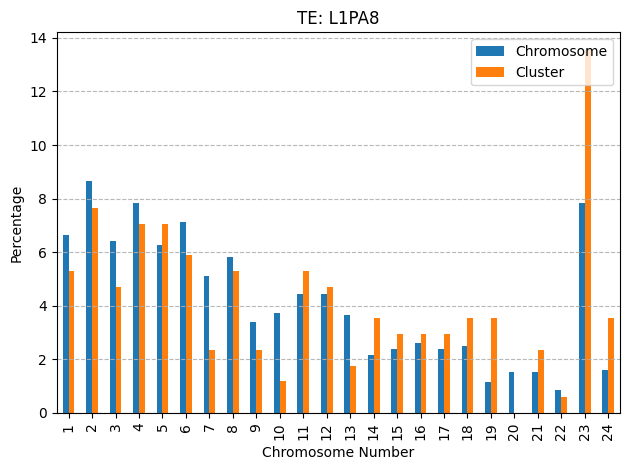

[ 1  5  9 10 11 12 13 15 16 17 18 19 24]
[ 1  6 10 12 13 15 17 20]
[]
[]
[]
[]


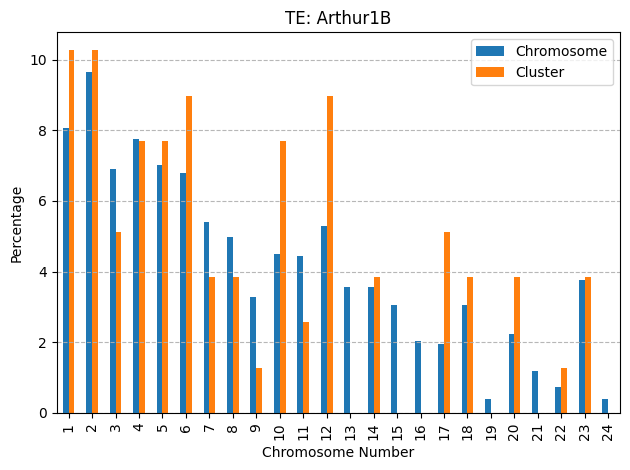

[ 2  3  4  8  9 10 11 15 16 17 18 23 24]
[ 2  8  9 11 15]
[11]
[11]
[ 8 11]
[ 8 11]


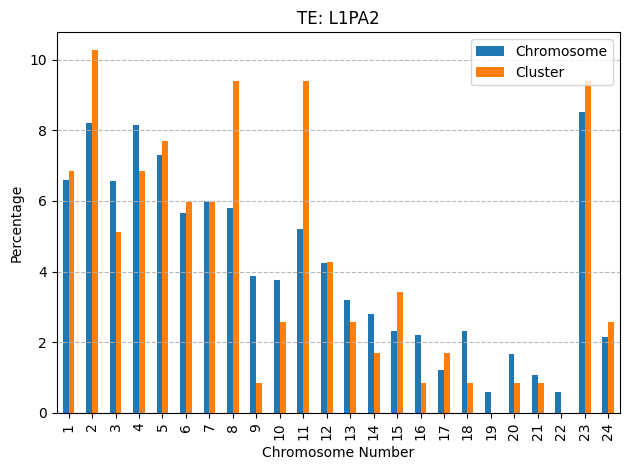

[ 1  3  5  6  8  9 13 16 18 21 22 23]
[ 3  5  9 13 18 23]
[9]
[9]
[9]
[9]


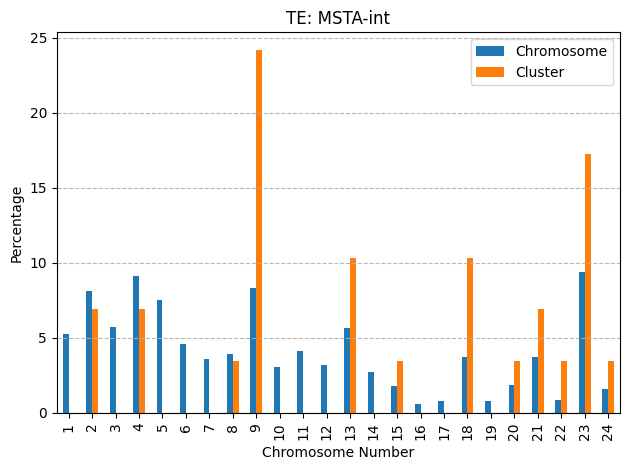

[ 1  2  5  7 10 11 12 14 15 16 23 24]
[ 1  2  7 14 15 16 18 23]
[]
[]
[]
[]


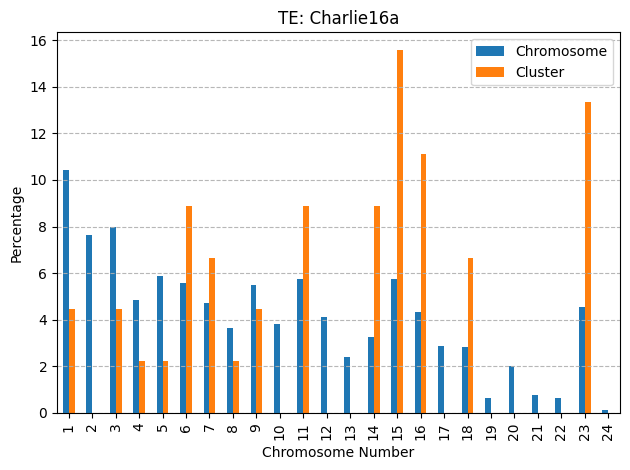

[ 1  2  3  5  7  8 10 13 14 17 19 21]
[ 1  2  3  5  7 14]
[1 2 3]
[2 3]
[1 2 3]
[1 2 3]


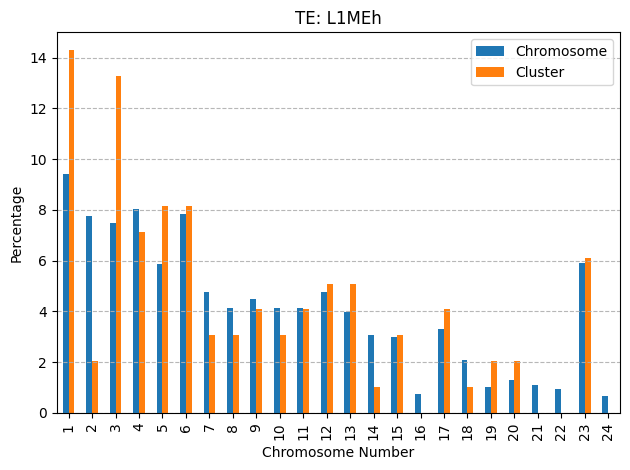

[ 1  4  6  7 11 12 13 14 16 17 22]
[ 1  4  6 12 13 14 16 17 19 21]
[]
[]
[]
[]


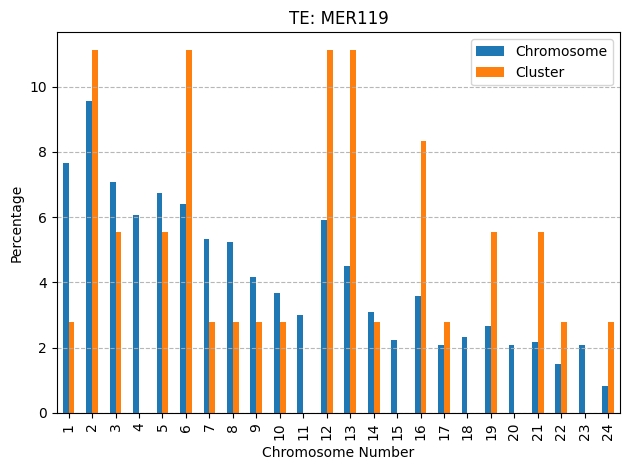

[ 2  7 10 11 12 13 14 15 16 18 22 23 24]
[ 2  6 13 15 16 18 23]
[]
[]
[13 18]
[13 18]


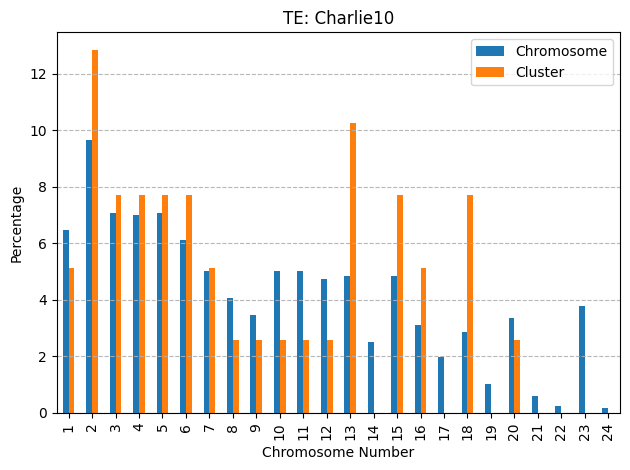

[ 1  3  4  5  6  7  8  9 10 11 12 15 16 18 19 20 21 22 23 24]
[ 1 12 15 16 19]
[ 1  2 11 12 13 14 15 16 17 18 19]
[19]
[ 1 12 15 16 19]
[ 1 12 15 16 19]


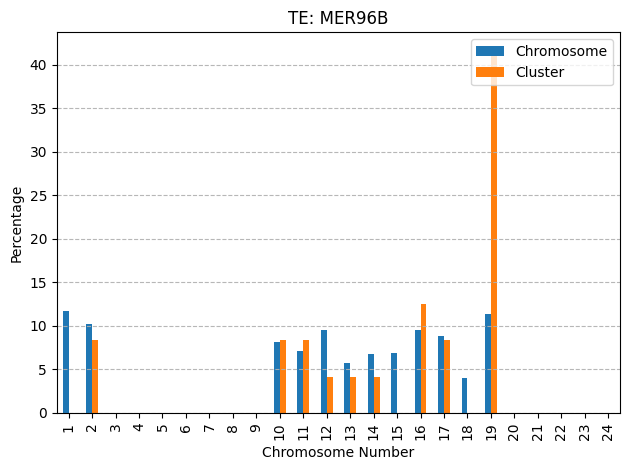

[ 1  3  4  7  8  9 10 12 13 18 20 23]
[ 1  3  4  7  9 13 16 23]
[]
[23]
[]
[23]


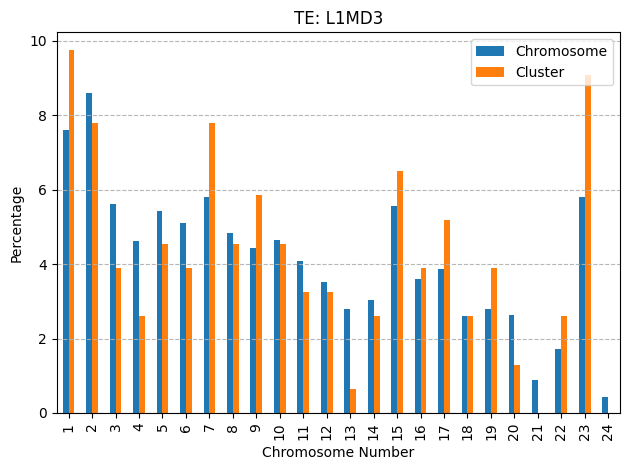

[ 1  2  4  6  7 11 12 13 16 18 19 22 23 24]
[ 4  6 10 11 12 13 16 17 19 23]
[]
[]
[]
[]


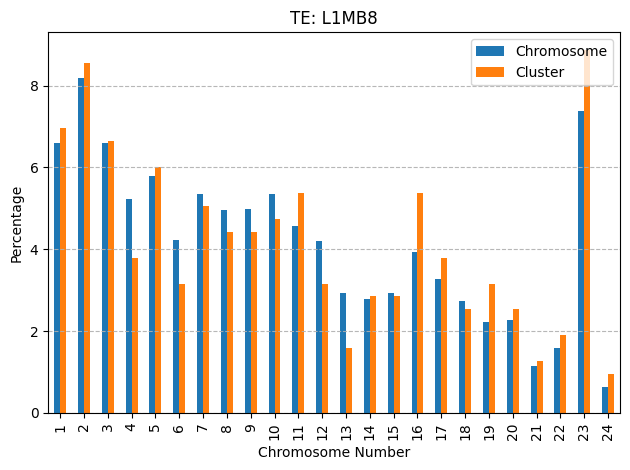

[ 1  2  5  7  8 11 14 15 16 18 23 24]
[ 7  8 15 16 23]
[23]
[23]
[15 23]
[15 23]


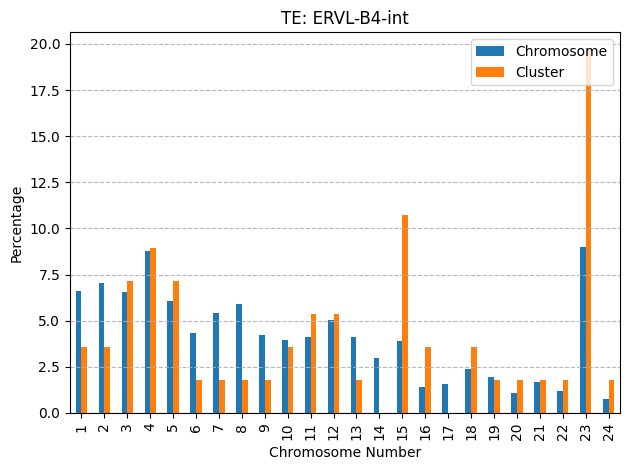

[ 1  2  3  4  7  9 10 13 15 17 18 19 23]
[ 2  7  9 17 23]
[23]
[23]
[23]
[23]


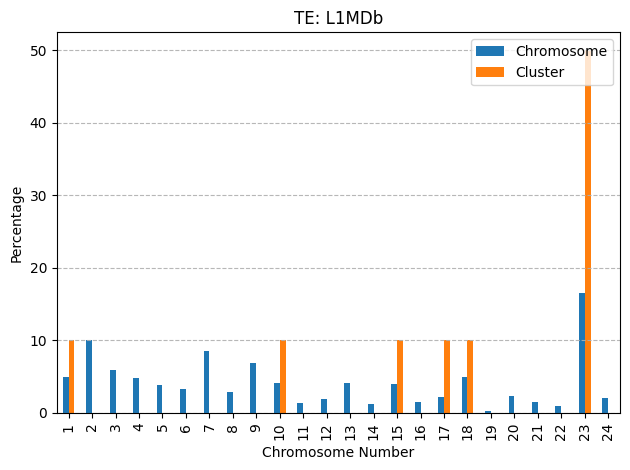

[ 1  3  6  9 10 11 12 15 16 18 19]
[ 1  3  6  8  9 11 16 18 19 23]
[16]
[16]
[16]
[16]


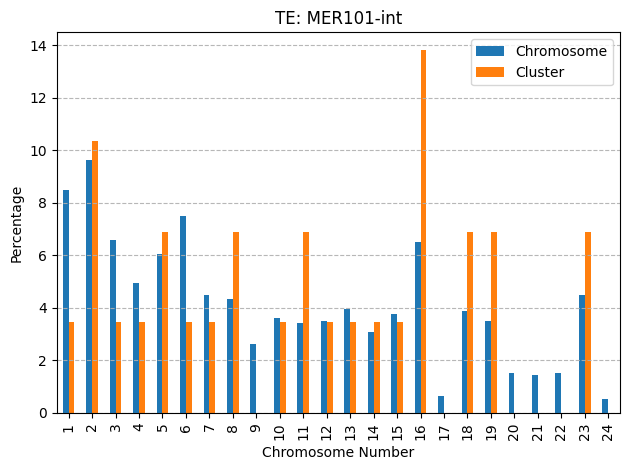

[ 1  2  4  5  9 14 15 16 19 20 23 24]
[ 1  2  3  4  5 11 13 16 20]
[]
[16]
[16]
[16]


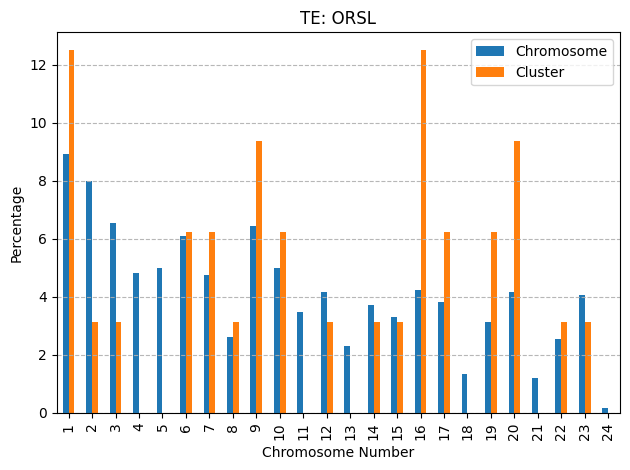

[ 1  2  3  4  5  6 18 19 21 22 23 24]
[ 1  2  3  4 21 23]
[2]
[ 2 23]
[ 2 23]
[ 2 23]


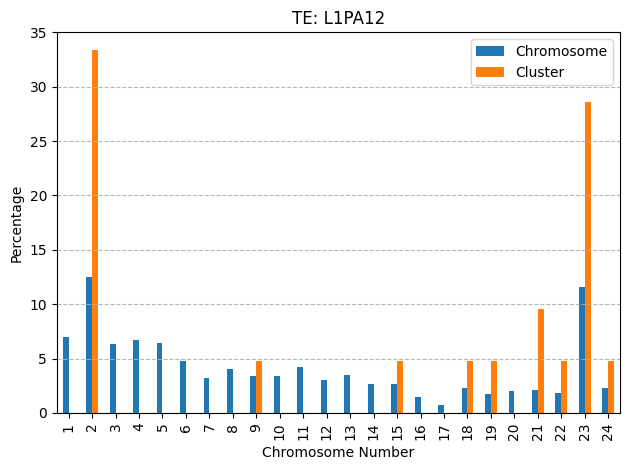

[ 1  2  3  4  6  9 13 20 22]
[ 1  2  3  4  6  7  9 11 15 22 23]
[]
[]
[]
[]


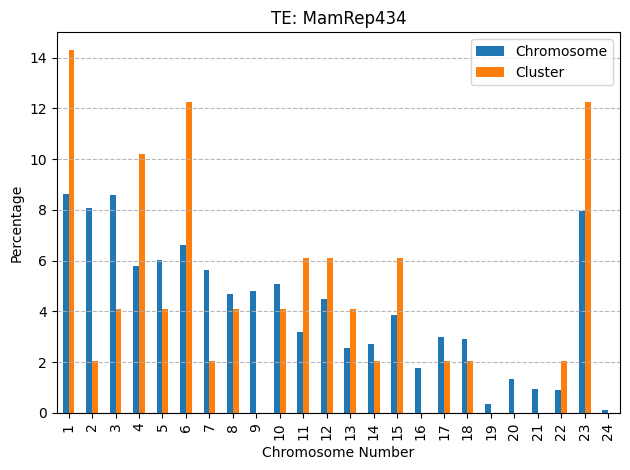

[ 1  2  3  7  8 10 11 15 16 19 23]
[ 2  3  7 10 11 12 23]
[]
[]
[]
[]


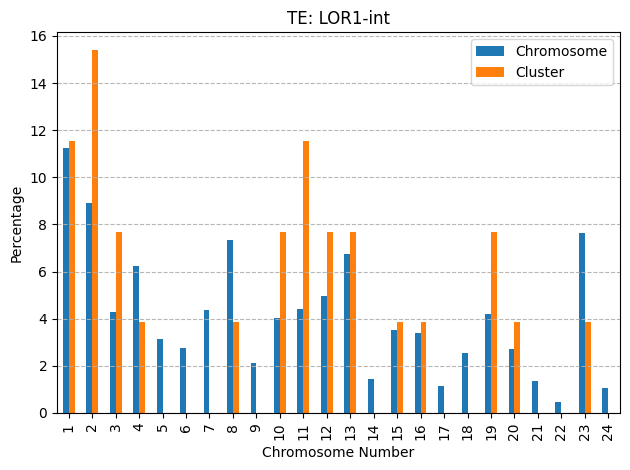

[ 2  3  6  8  9 10 11 16 17 19 20 21 23]
[ 1  2  3  9 12 17 19 20 23]
[]
[]
[]
[]


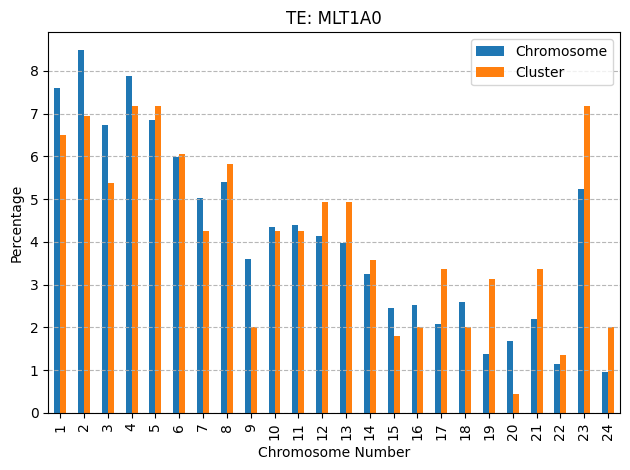

[ 2  3  4  5  8 11 12 14 17 21 23 24]
[ 2  3  4  5 11 12 14 21 24]
[]
[]
[]
[]


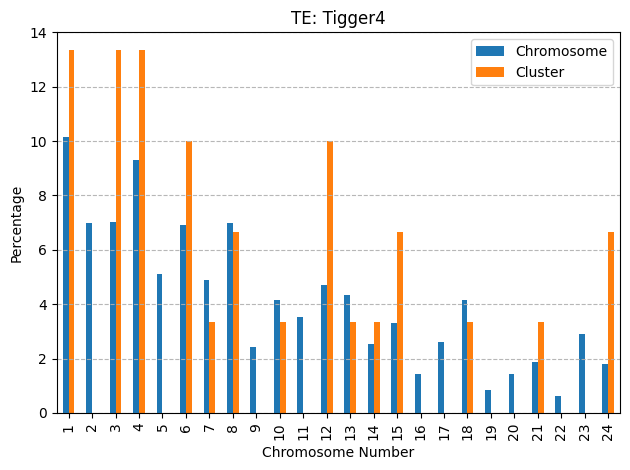

[ 2  3  5  6  7  8  9 10 11 14 16 17 19 23]
[ 2  3  7  8  9 10 16 19]
[9]
[9]
[ 9 19]
[ 9 19]


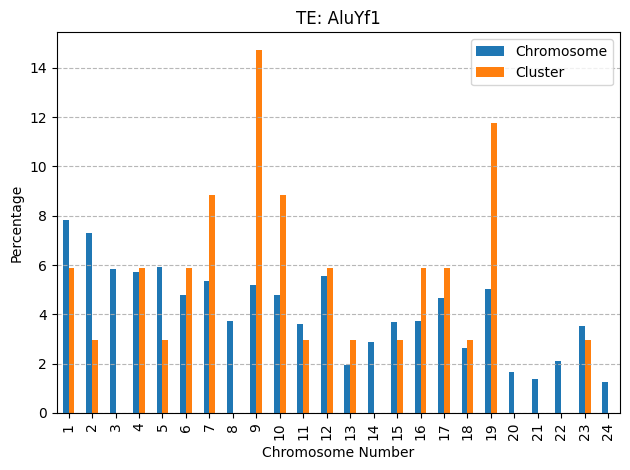

[ 1  3  4  6  8 10 11 13 16 17 23]
[ 1  3  4  6  7  8 11 18 23]
[]
[]
[]
[]


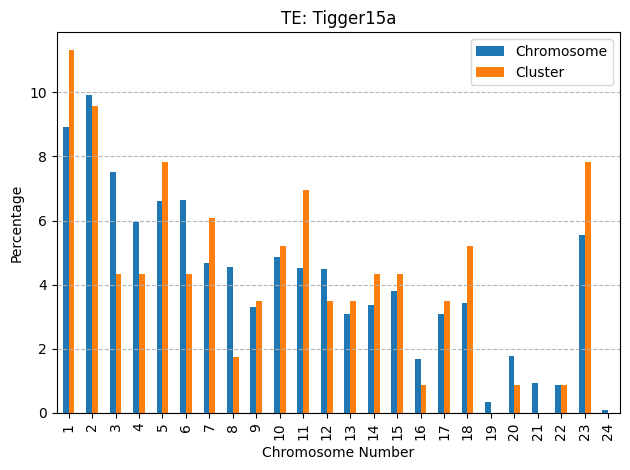

[ 1  2  4  5 11 12 13 15 19 20 23 24]
[ 1  2  4  5 11 12 15 19 23]
[1 2]
[2]
[ 1  2 23]
[ 1  2 23]


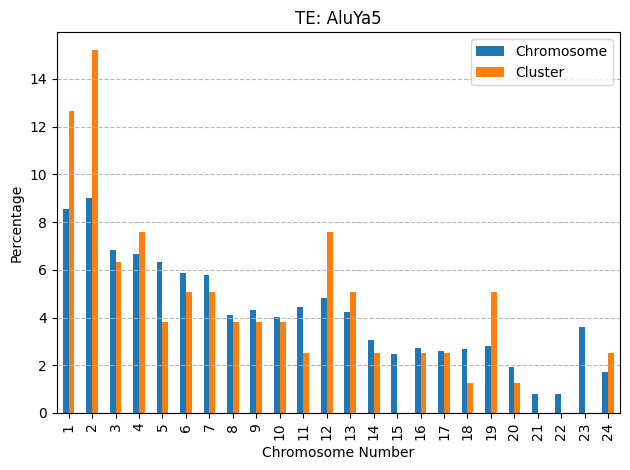

[ 1  2  3  5  8 11 15 16 17 20 23 24]
[ 2  3  5 10 15 16 17 20 23]
[]
[16]
[16]
[16]


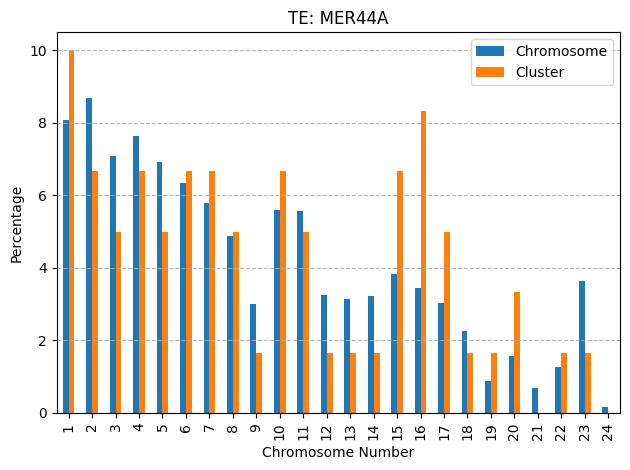

[ 1  2  3  5 10 13 14 15 18 19 21 23]
[ 1  2  3  8 11 13 14 15 18 19 23]
[]
[]
[]
[]


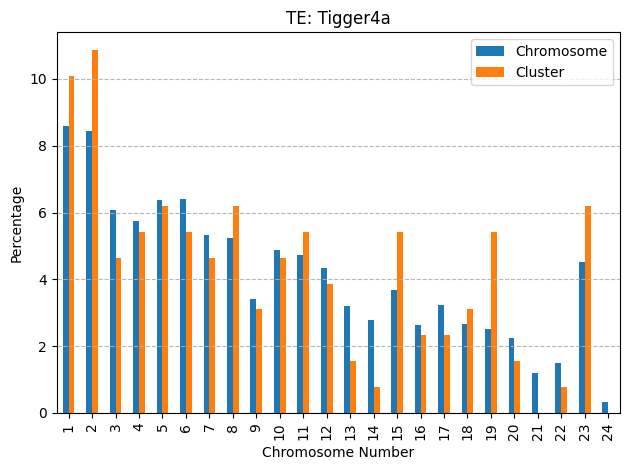

[ 1  2  3  4  6  8 10 14 18 19 23 24]
[ 1  2  3  4  8 10 14 23 24]
[23]
[23]
[ 1 23]
[ 1 23]


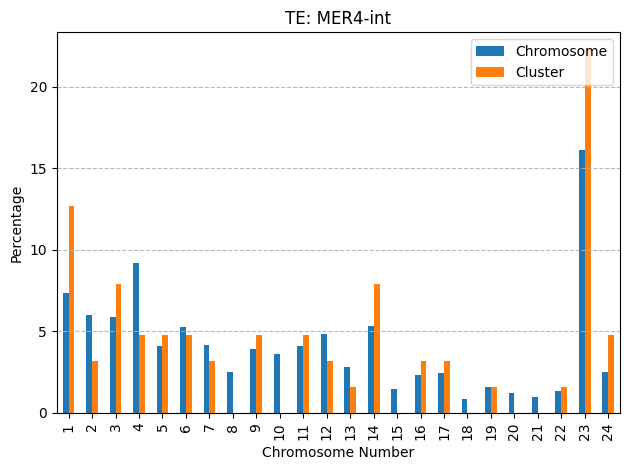

[ 2  4  6  7 13 15 16 17 22 23 24]
[ 2  4 13 16 22 24]
[]
[]
[]
[]


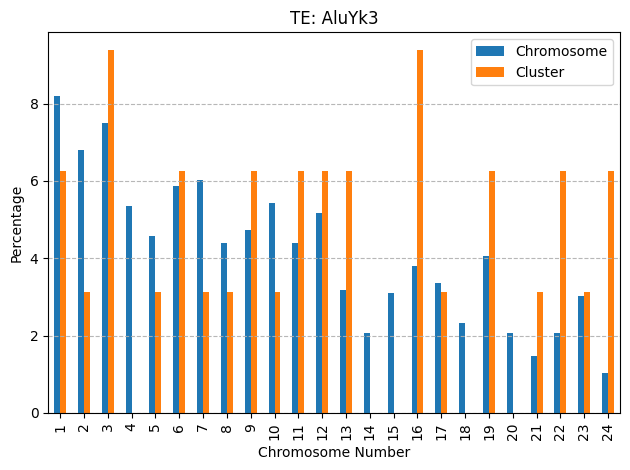

[ 1  3  5  9 10 12 14 16 18 21 23]
[ 1  2  3  4  5  8  9 12 14 15 16 23]
[]
[]
[]
[]


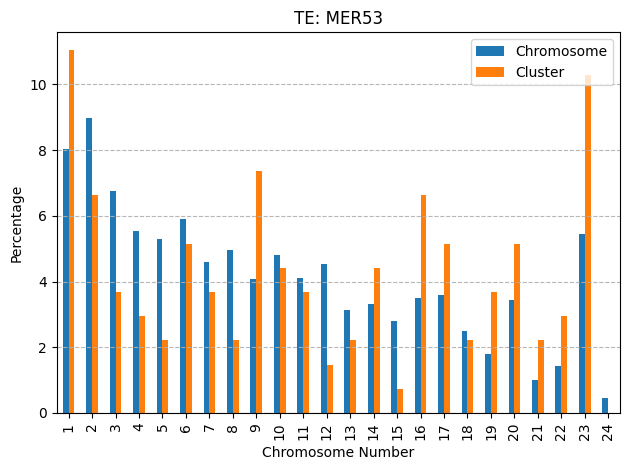

[ 2  3  5  6  7  8 11 12 14 15 20 22 23]
[ 2  3  6 20 23]
[3]
[3]
[3]
[3]


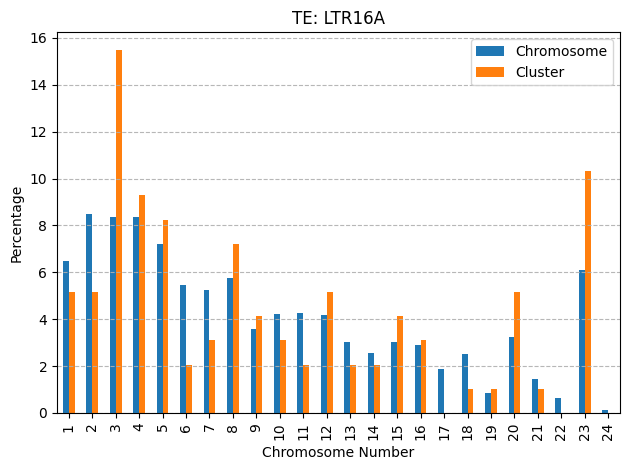

[ 1  3  4  6 10 11 13 16 17 19 20 22]
[ 1  4  6 16 17 19 22]
[17 19]
[]
[17 19]
[17 19]


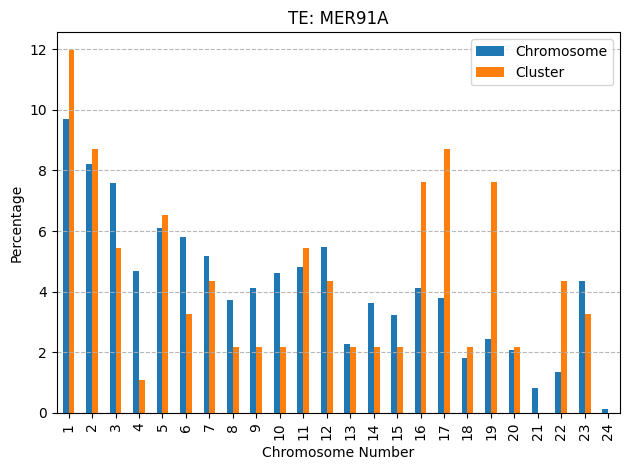

[ 1  3  5 10 13 14 16 17 18 20 23 24]
[ 1  3  5 14 16 20]
[]
[]
[ 3  5 14]
[ 3  5 14]


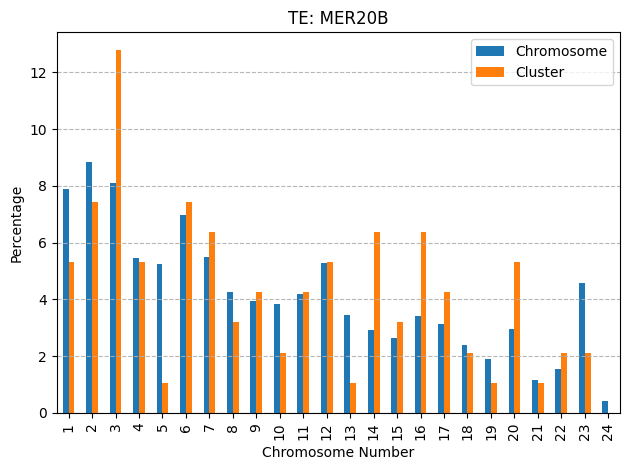

[ 2  3  4  5  6  8 16 18 20 21 23]
[ 2  4  6  7 12 16 17 18 23]
[]
[]
[]
[]


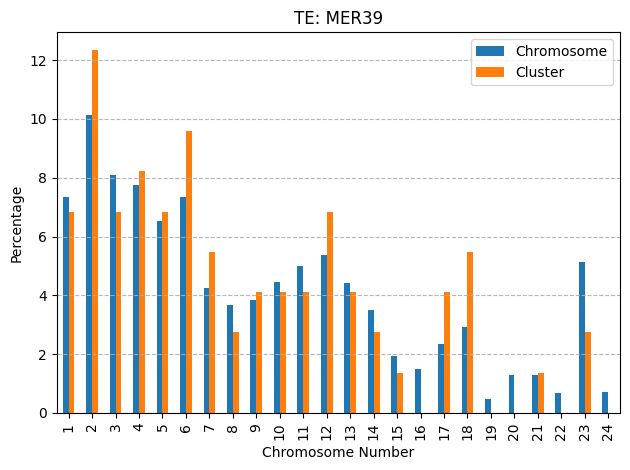

[ 1  2  3  6  8  9 10 12 13 14 22 23 24]
[ 1  2  3  9 11 12 13 14 16 23]
[]
[]
[]
[]


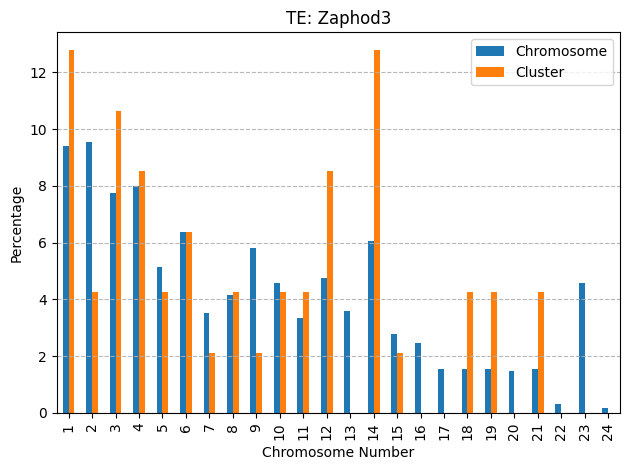

[ 1  2  4  6  8  9 10 11 14 16 17 21]
[ 1  2  4  6  8  9 16 17]
[ 4 17]
[ 4 17]
[ 1  4 17]
[ 1  4 17]


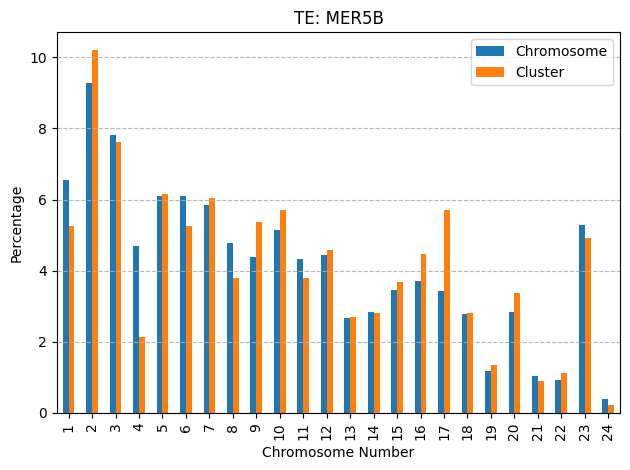

[ 1  2  3  6 11 12 13 15 17 19 20 23]
[ 1  2  3 12 17 23]
[ 1 23]
[23]
[23]
[ 1 23]


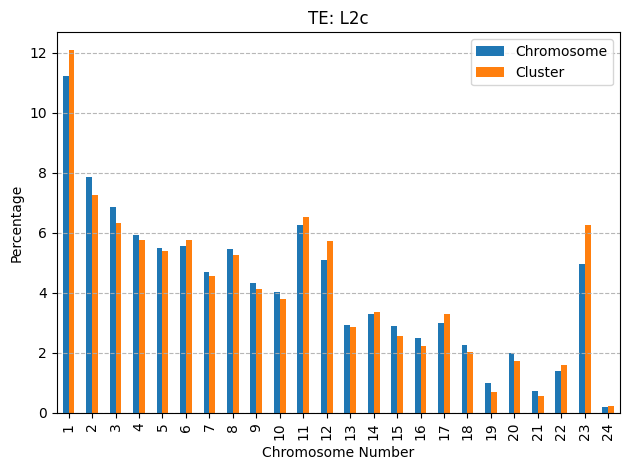

[ 2  4  5  6  7 11 14 15 16 18 23]
[ 2  4  5  6  7  8 14 15 23]
[]
[]
[ 4  5  6 23]
[ 4  5  6 23]


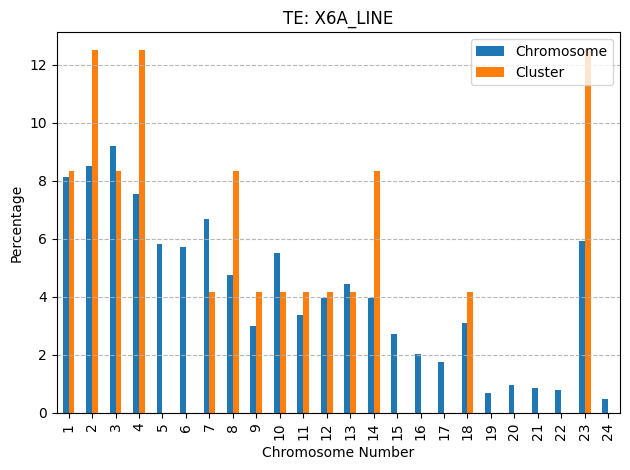

[ 1  5  7  8 10 12 16 18 19 22 24]
[ 1  7  8 10 12 13 16 18]
[]
[]
[]
[]


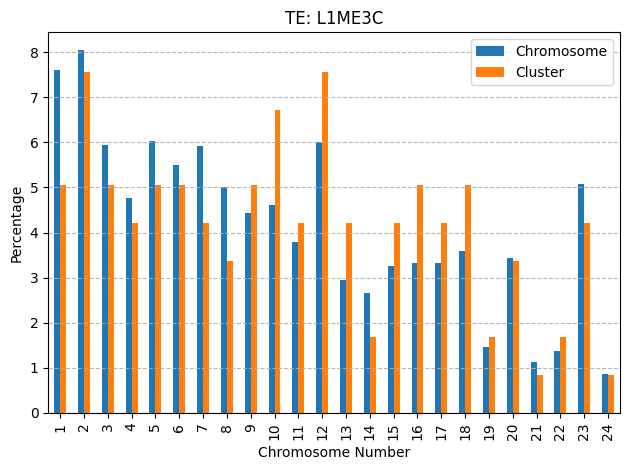

[ 2  3  4  5 10 12 13 14 15 16 19 20 22]
[ 2  3  4  8 10 12 13 14 16 17 19 20]
[]
[19]
[19]
[19]


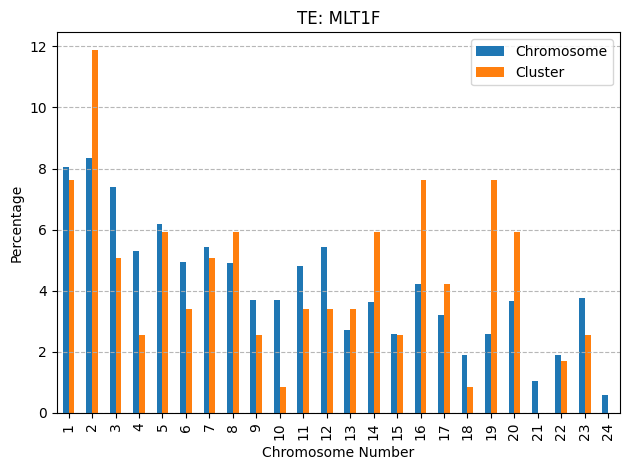

[ 1  2  3  5  6  7  8  9 13 14 17 23]
[ 1  2  3  5 14 17 23]
[ 5 17]
[ 5 17]
[ 3  5 17]
[ 3  5 17]


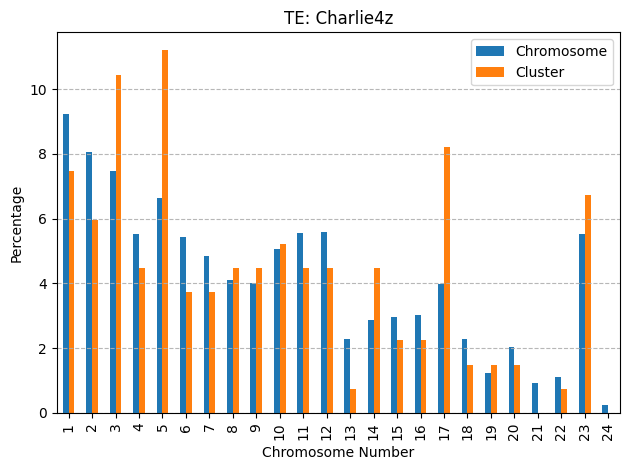

[ 2  3  4  5  7  9 10 13 15 18 23 24]
[ 5  7  9 15 23]
[23]
[23]
[23]
[23]


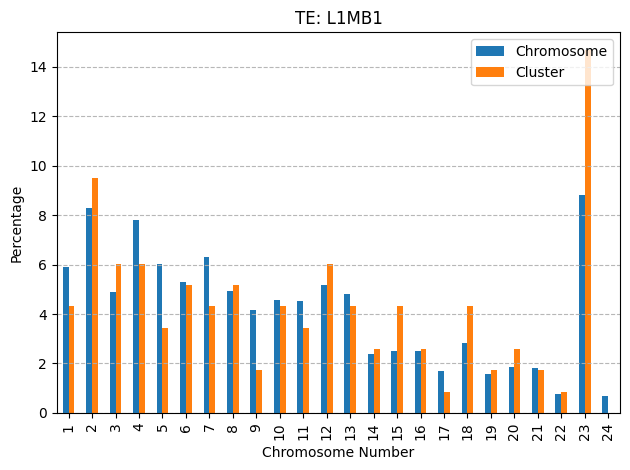

[ 3  5  7  9 11 12 15 16 17 19 21 22]
[ 3  5  7  9 11 16 19 22]
[]
[5]
[5]
[5]


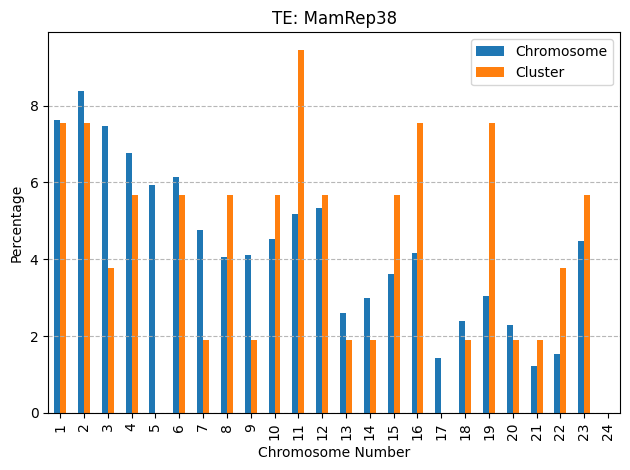

[ 1  3  5  6  9 11 12 14 19 20 22 24]
[ 1  3 11 14 19]
[]
[]
[]
[]


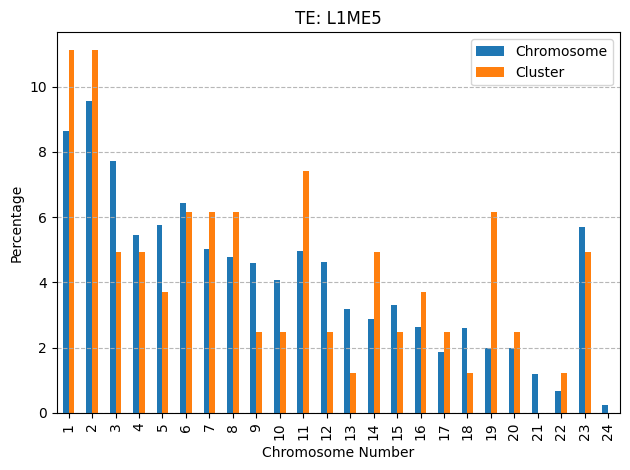

[ 2  3  5  9 12 13 14 16 18 19 20 24]
[ 2  5 10 13 16 19]
[]
[]
[]
[]


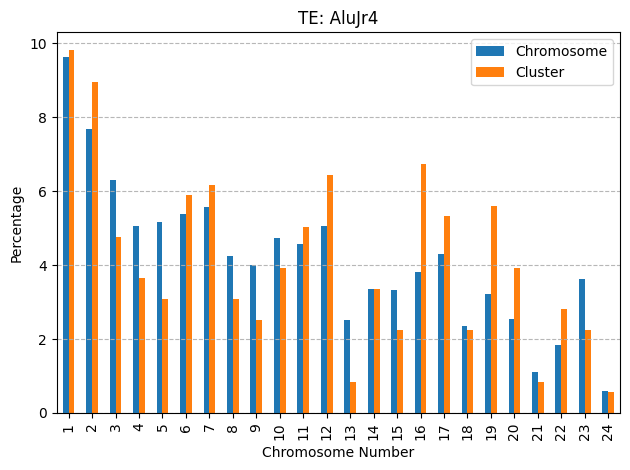

[ 4  6  8 10 11 12 14 16 17 18 19 20 21]
[ 4  6  8 11 12 17 19 21]
[]
[]
[]
[]


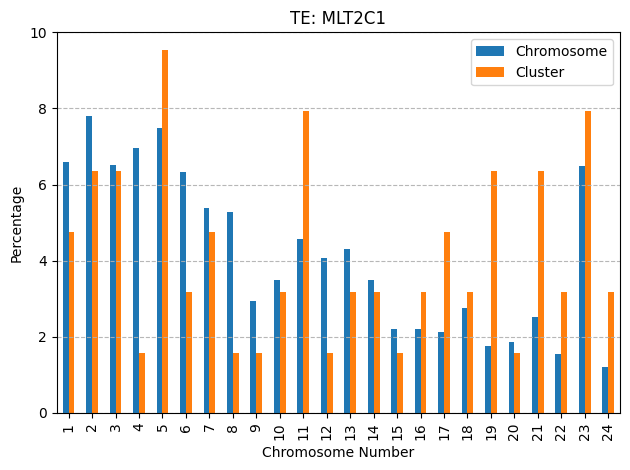

[ 1  2  4  5  6 11 13 14 17 19 21 23]
[ 1  2  6 11 23]
[2 6]
[2 6]
[2 6]
[2 6]


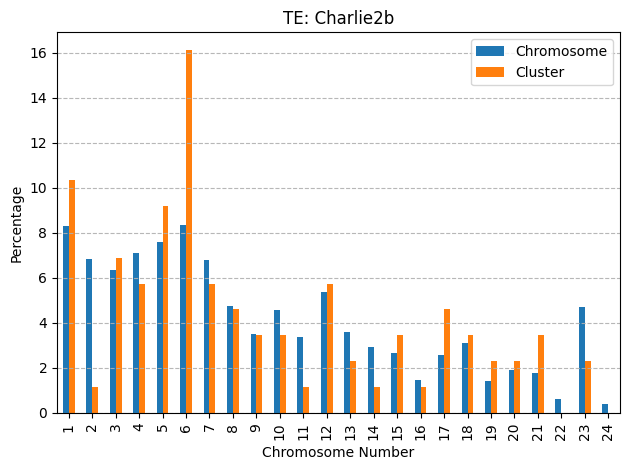

[ 2  3  8 10 17 18 20 22 23 24]
[ 2  8 17 20 22 23]
[]
[]
[]
[]


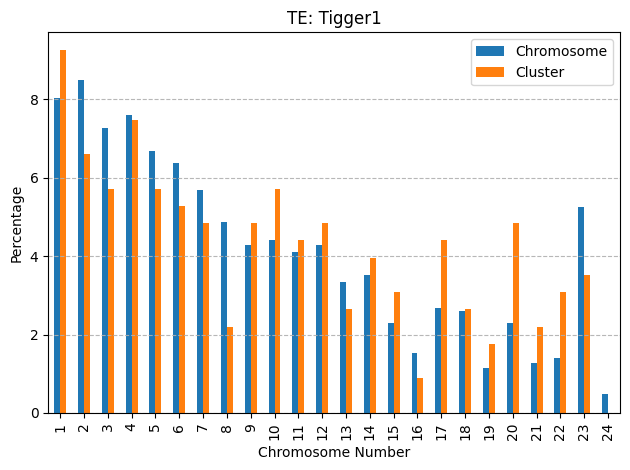

[ 3  4  5  6  7 10 12 16 17 19 23 24]
[ 3  4  6 19 23]
[23]
[23]
[23]
[23]


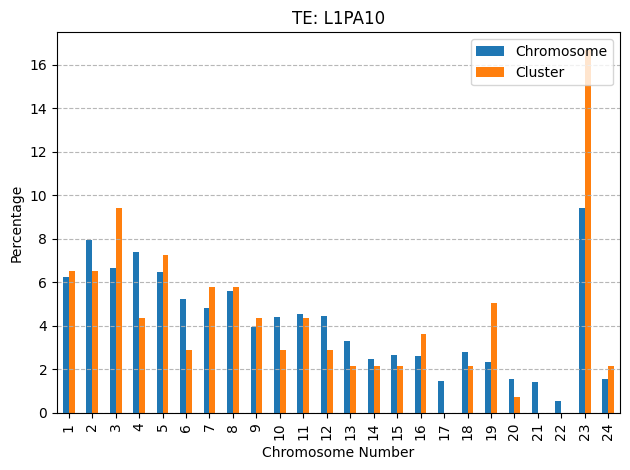

[ 2  3  4  5  6  7 10 15 16 19 20 22 23]
[ 2  3  4  5 16 20]
[]
[]
[]
[]


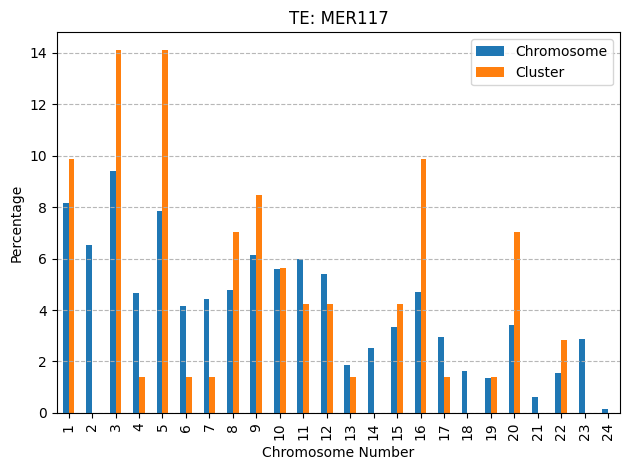

[ 1  2  3  4  5  8 10 12 14 17 18 22 23]
[ 2  4  5 10 12 23]
[]
[23]
[ 2 23]
[ 2 23]


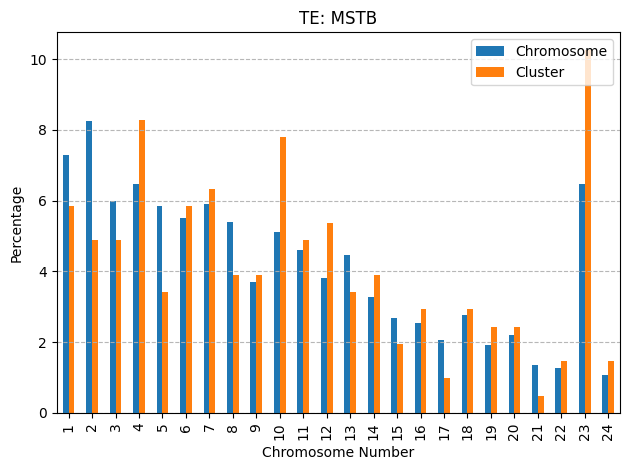

[ 1  2  4  6  9 12 15 16 19 22 24]
[ 1  2  4  6 10 12 16 19 22 23 24]
[]
[]
[]
[]


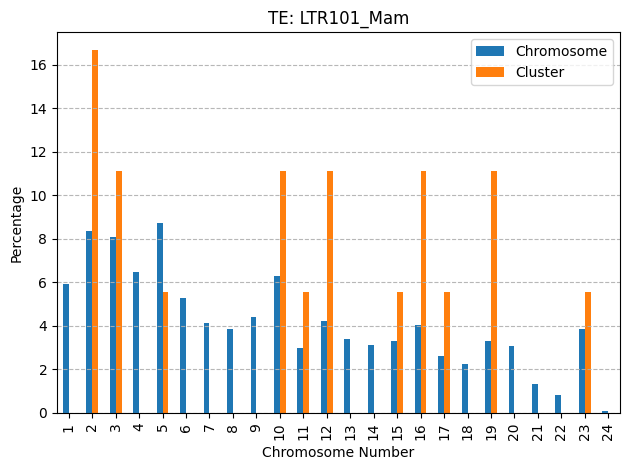

[ 1  2  5  7  8 10 14 15 17 18 21 22 23]
[ 1  2  9 10 14 15 17 23]
[]
[]
[ 1 15 23]
[ 1 15 23]


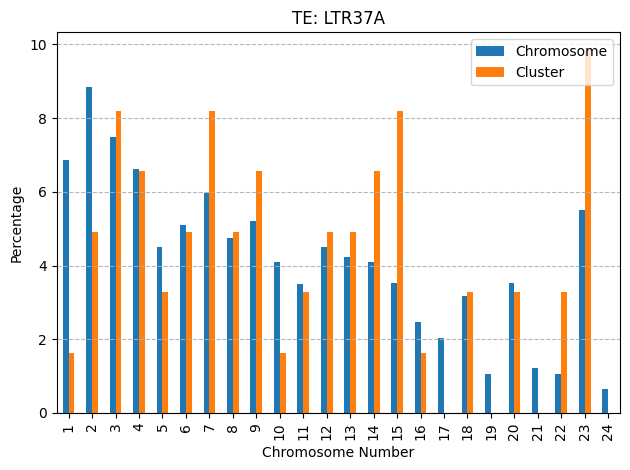

[ 2  5  7  8  9 10 13 14 18 19 22 23 24]
[ 2  5  7  8 10 13 14 18 23]
[]
[]
[13 14]
[13 14]


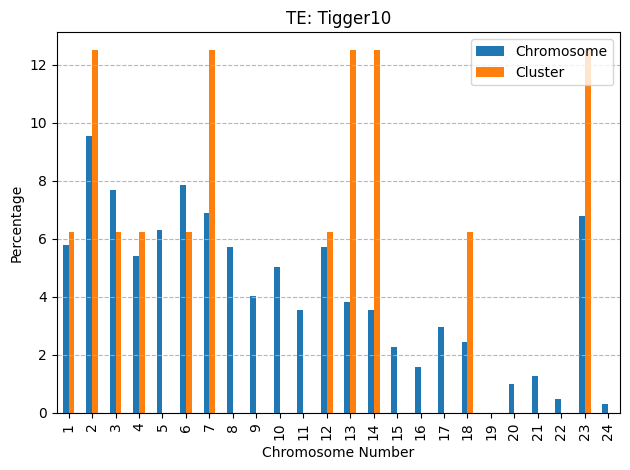

[ 1  2  4  5  6  8 12 14 15 19 22 23 24]
[ 2  8 15 19 24]
[19]
[19]
[19]
[19]


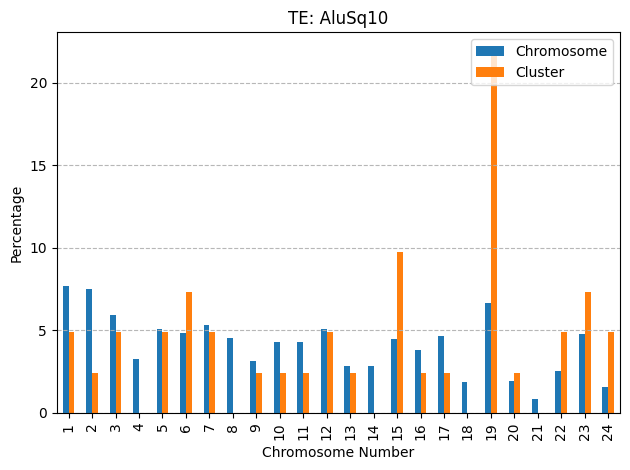

[ 1  2  4  6  7  9 10 11 13 18 23 24]
[ 4  6 18 23]
[23]
[23]
[23]
[23]


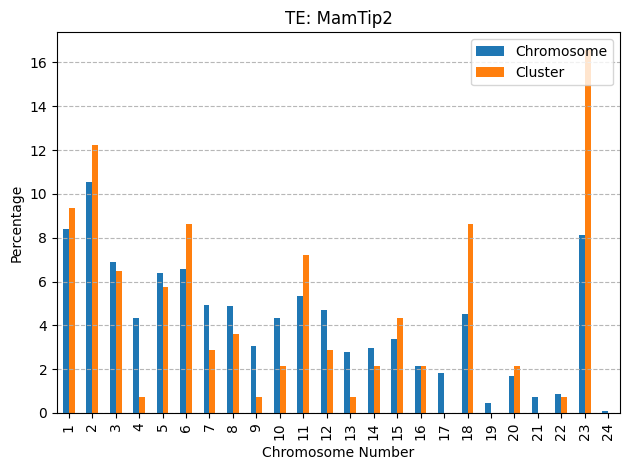

[ 3  5  7  9 11 13 17 19 20 23]
[ 5  7  9 11 19 22 23]
[]
[]
[]
[]


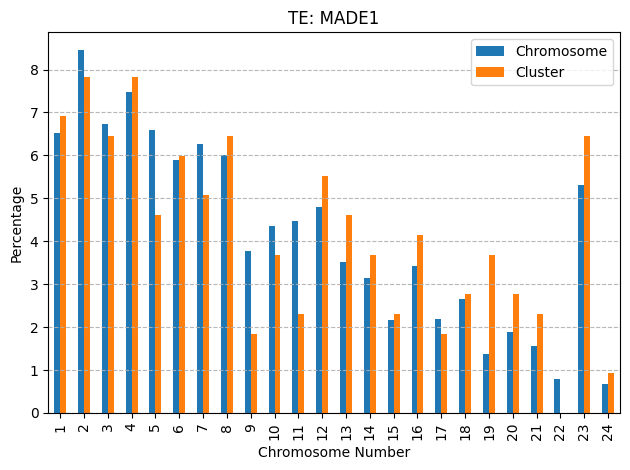

[ 1  3  5  9 10 11 15 19 20 22 24]
[ 5  9 10 11 15 19 20]
[5]
[5]
[5]
[5]


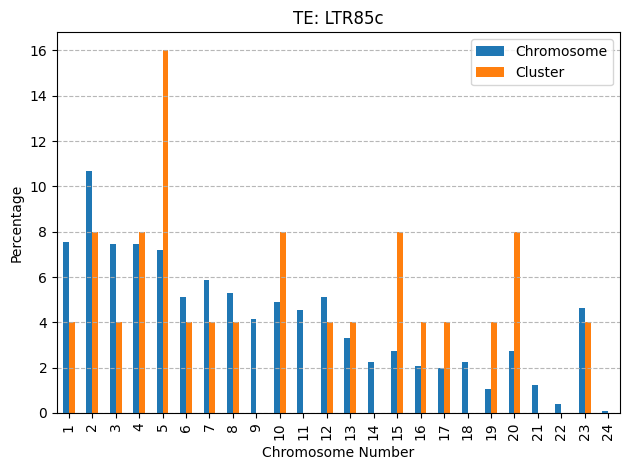

[ 3  6  8  9 10 14 15 16 20 23]
[ 3  5  8  9 10 14 15 16 23]
[]
[]
[]
[]


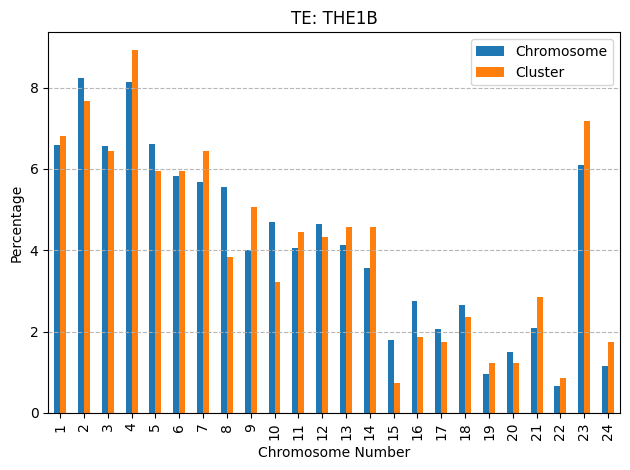

[ 2  3  6  7  8  9 10 12 16 18 19 23]
[ 3  7  8 10 23]
[23]
[23]
[23]
[23]


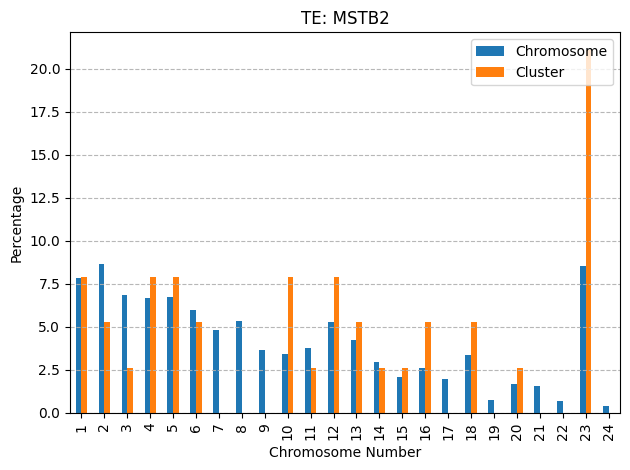

[ 1  4  5  7  8 10 11 14 15 23]
[ 1  4  7  8 10 14 23]
[]
[]
[ 1 10 14]
[ 1 10 14]


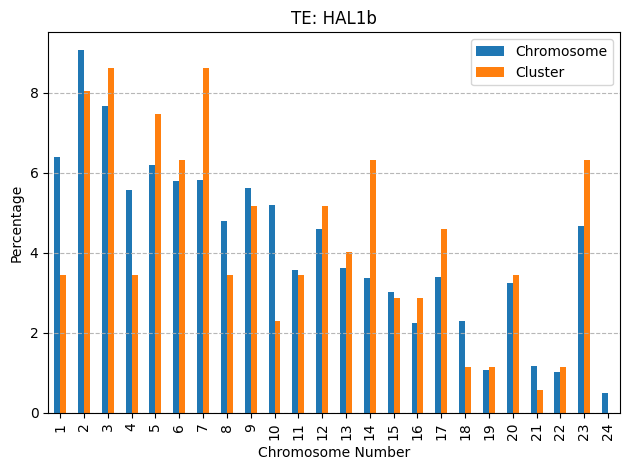

[ 2  4  5  6  8  9 12 15 19 20 23]
[ 1  2  4  5  6  9 11 12 13 16 17 20]
[]
[]
[]
[]


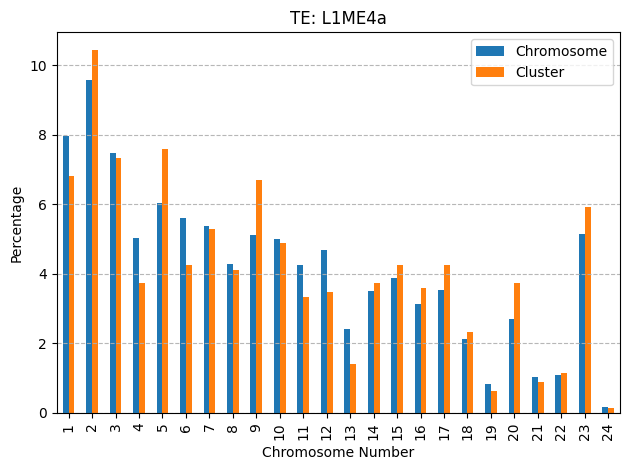

[ 1  2  3  4  5  6  9 16 18 19 20 23]
[ 1  2  3  5 16 19 20 23]
[20]
[20]
[19 20 23]
[19 20 23]


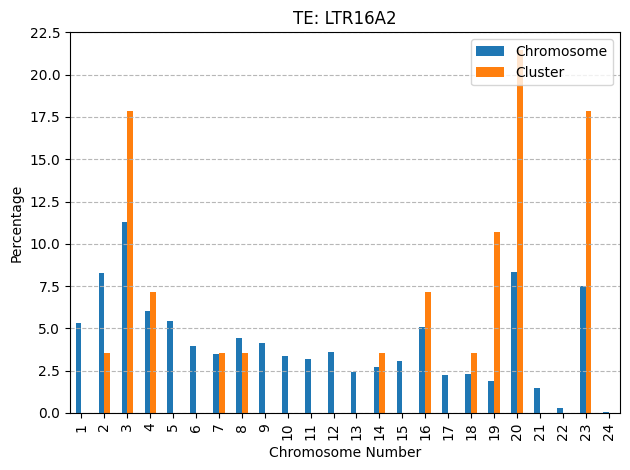

[ 1  4  5  7  8  9 11 13 14 15 17 23]
[ 1  8  9 14 15 17]
[1 8]
[1 8]
[1 8]
[1 8]


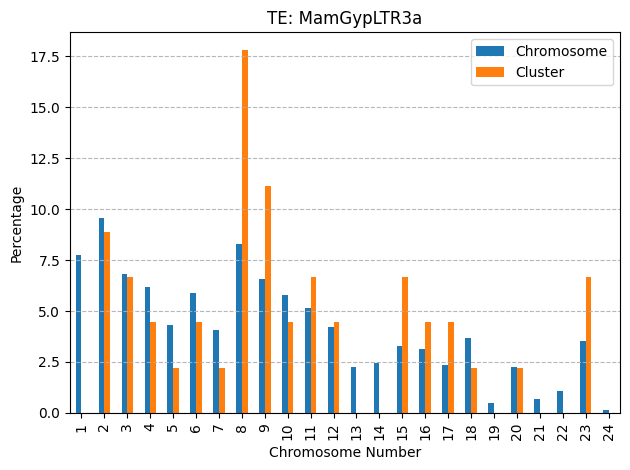

[ 5  6  7  8 10 11 12 18 19 20 21 23]
[ 1  5  6  7  8  9 10 11 19 23]
[]
[]
[]
[]


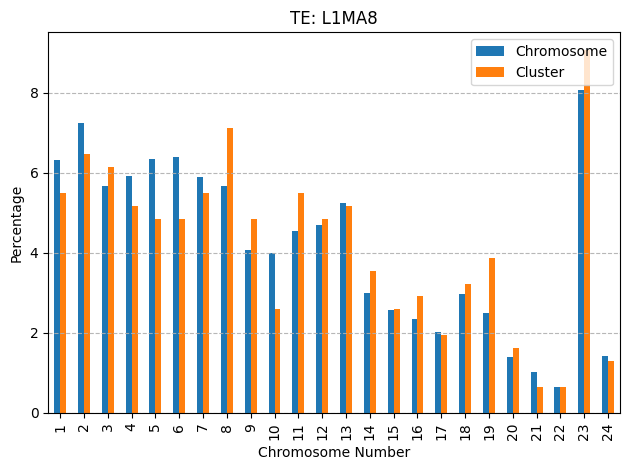

[ 3  4  6  7  8 12 14 16 19 20 22 23]
[ 3 12 16 19 20 23]
[]
[]
[16 19]
[16 19]


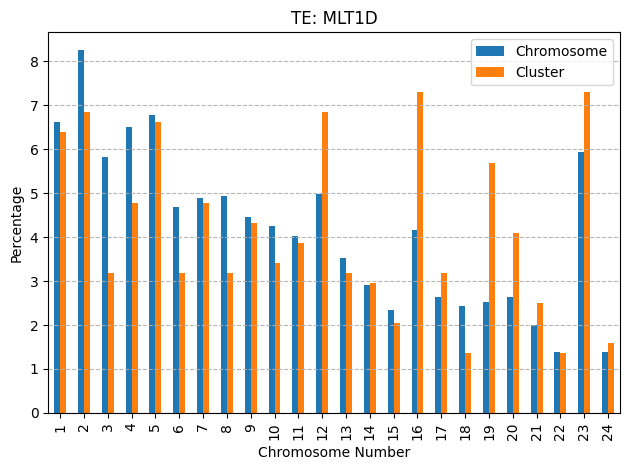

[ 1  2  4  6 13 16 18 19 20 21 22]
[ 1  2  4 11 13 16 19 20 22]
[19]
[]
[ 1  4 19]
[ 1  4 19]


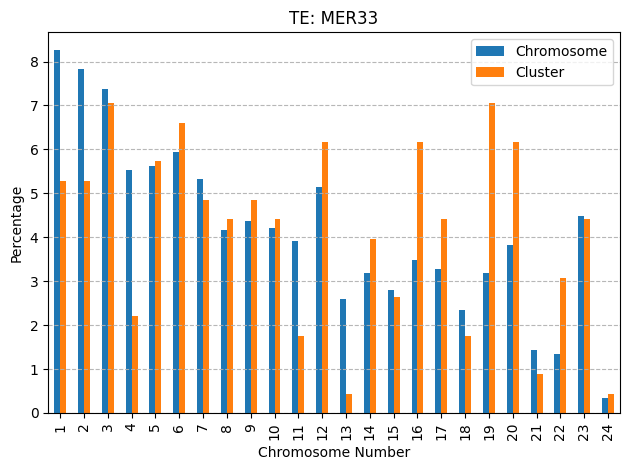

[ 4  6  7  9 11 13 15 16 17 20 22]
[ 4  7  9 15 17 20]
[]
[]
[]
[]


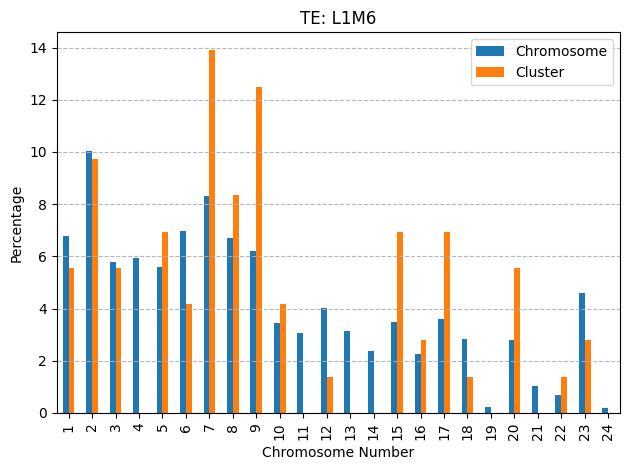

[ 1  4  5  7  9 11 12 14 15 23 24]
[ 5  6  7  9 10 11 12 14 16 18]
[]
[]
[]
[]


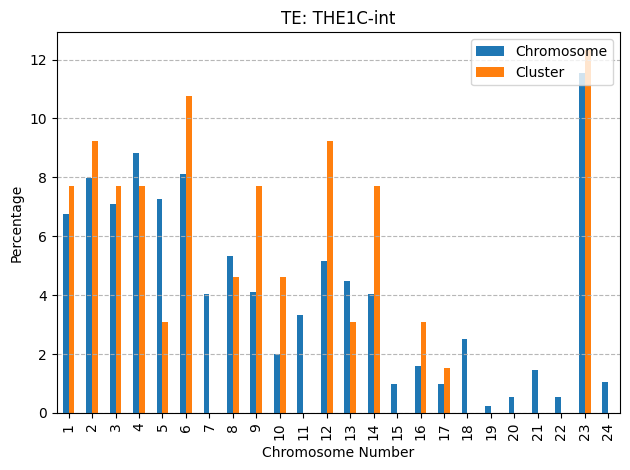

[ 2  4  6  7  8  9 10 11 15 16 17 21]
[ 2  7 10 16]
[ 7 16]
[ 7 16]
[ 7 16]
[ 7 16]


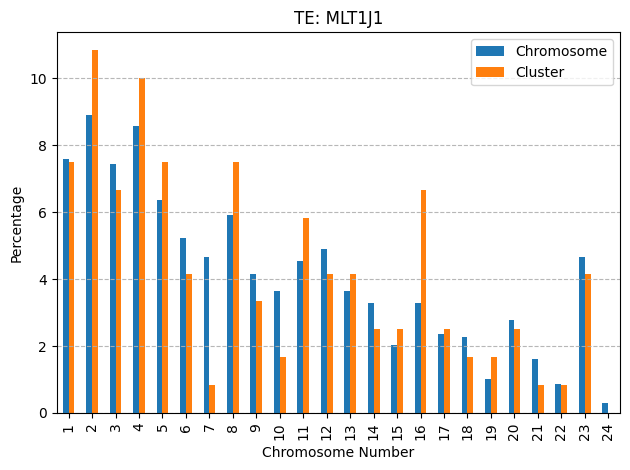

[ 1  4  5  8  9 12 13 17 18 20 22 23]
[ 1  4  5  8 12 17 20]
[]
[1]
[1]
[1]


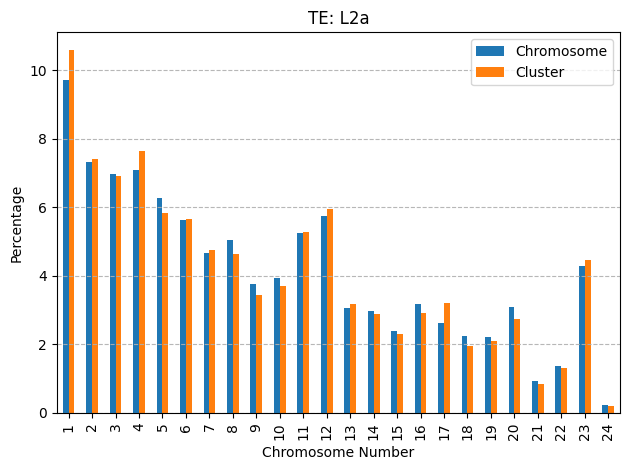

[ 4  6  8 10 11 12 13 16 17 18 21]
[ 3  4  5  6  8 10 11 16 18 21]
[]
[]
[]
[]


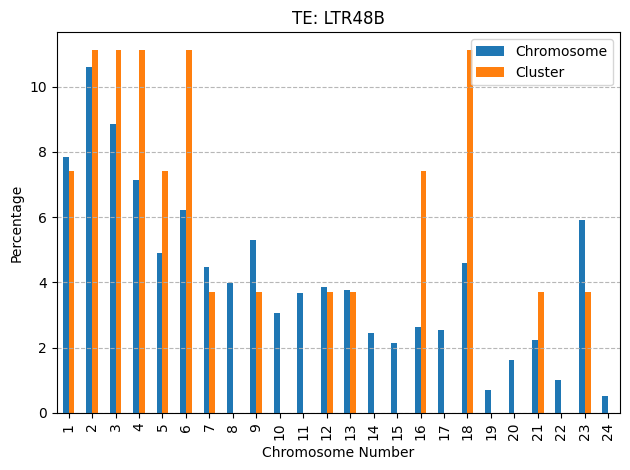

[ 1  4  5  6  8 10 11 12 15 17 20 23]
[ 1  5  6  8 10]
[ 8 10]
[8]
[ 1  6  8 10]
[ 1  6  8 10]


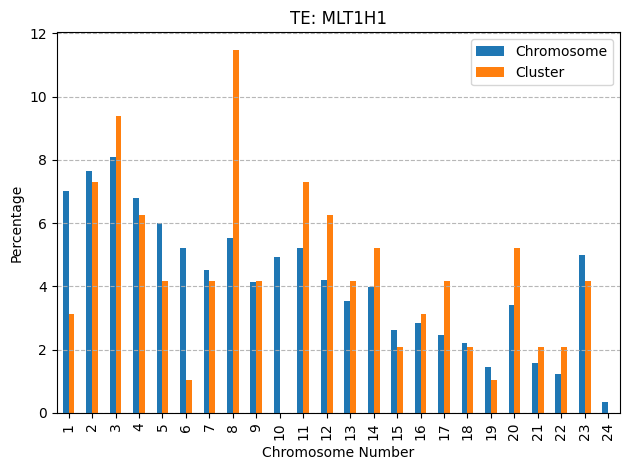

[ 4  5  7  8  9 10 13 15 16 19 23 24]
[ 4  7  8 13 19 23]
[]
[]
[]
[]


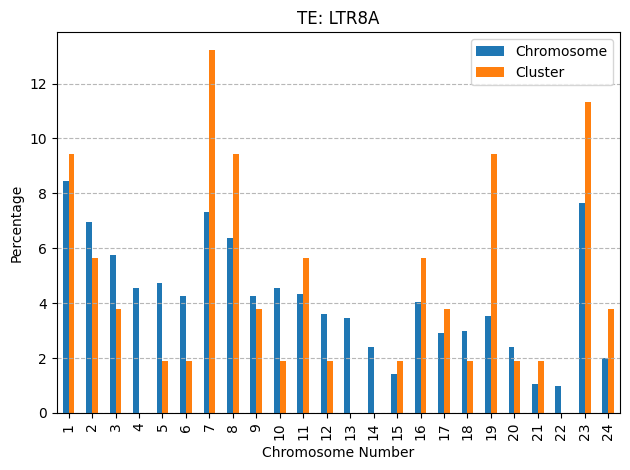

[ 2  8  9 10 13 15 16 18 19 20 22]
[ 2 10 15 20]
[]
[2]
[]
[2]


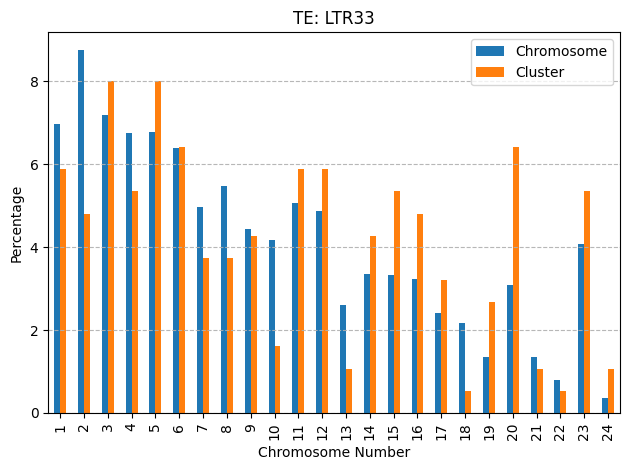

[ 1  2  3  4  7  8  9 16 18 20 22 23]
[ 2  3 16 20]
[20]
[20]
[20]
[20]


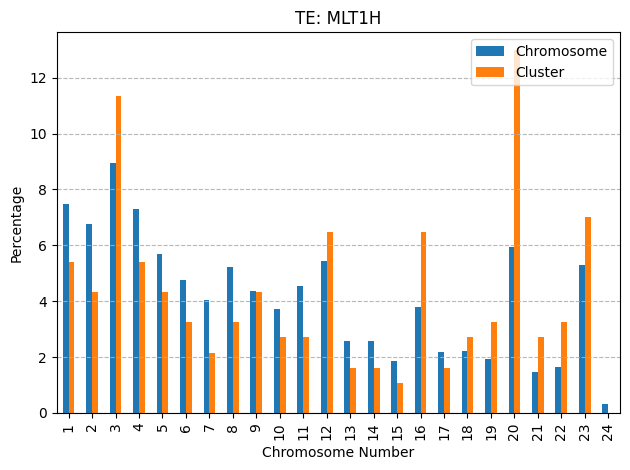

[ 1  3  6  8 13 14 19 21 22 23]
[ 1  3 13 14 19]
[]
[]
[]
[]


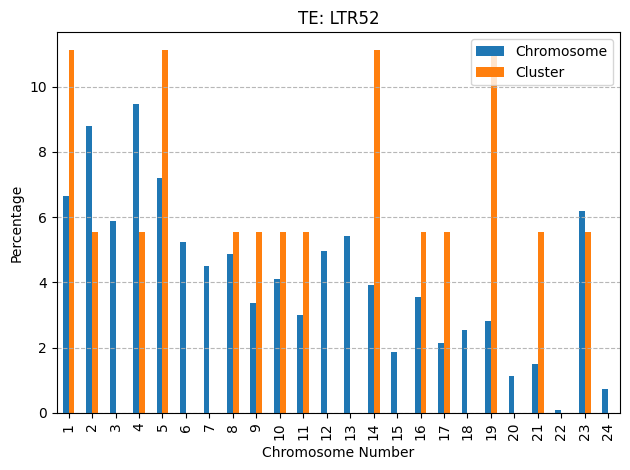

[ 3  4  6  9 10 12 14 18 19 23 24]
[ 3  6  7  9 10 12 14 17 18 20 23]
[]
[]
[]
[]


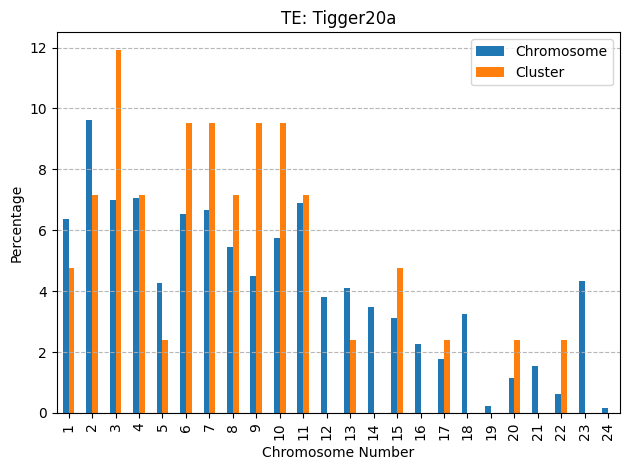

[ 1  2  3  4  5  6  7  8 10 12 15 16 17]
[ 1  2  4 10 14]
[]
[4]
[]
[4]


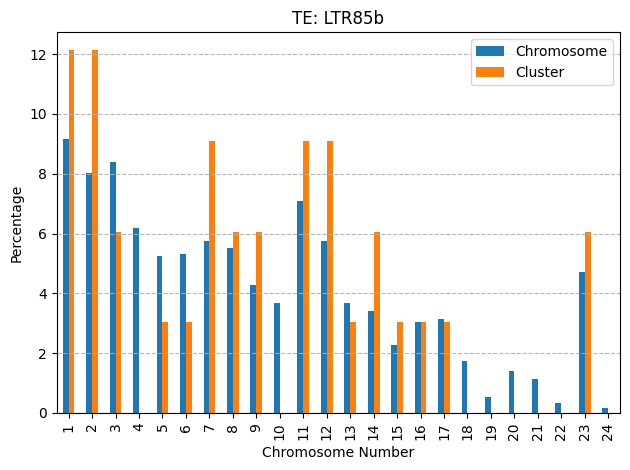

[ 3  4  5  6  8 10 13 17 18 19 23 24]
[ 3  4  6  8 10 13 17 23]
[]
[]
[ 3  8 10]
[ 3  8 10]


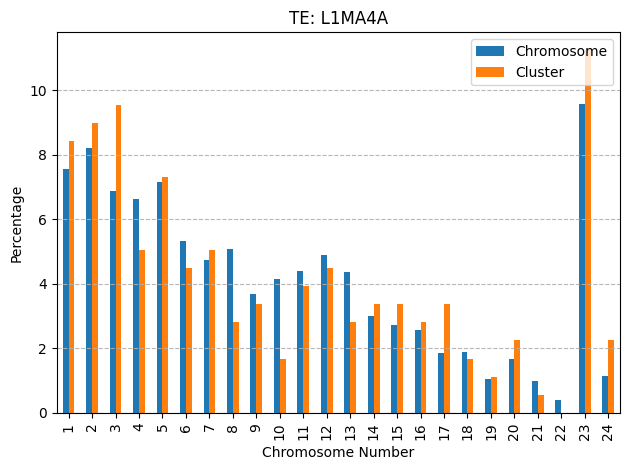

[ 1  2  3  4  5  6  7 10 11 14 19 21 23 24]
[ 3  4  5  8 10 11 15 19 23 24]
[]
[]
[]
[]


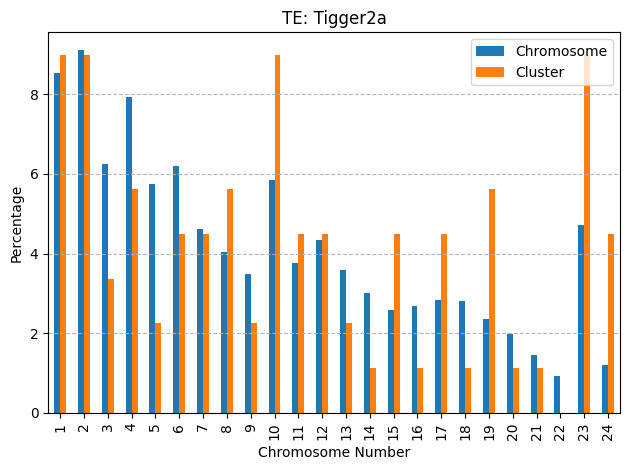

[ 1  2  3  4  5 13 16 19 20 22 23]
[ 1  2  3  7 17 19 20 23]
[]
[]
[]
[]


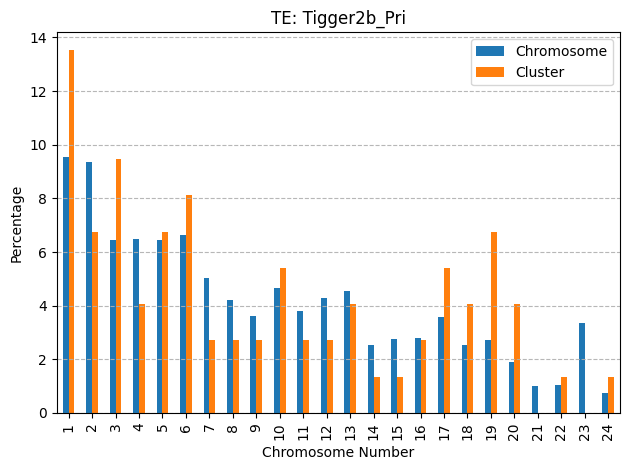

[ 2  4  6 10 11 12 13 14 16 17 19 20 21]
[ 2  3  4  5  7 17 19 20]
[]
[]
[]
[]


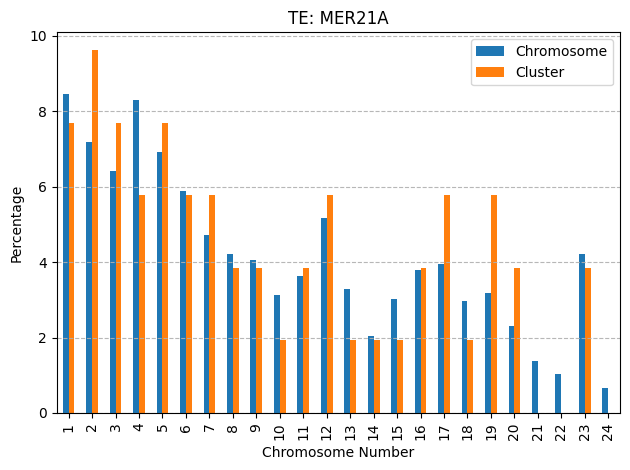

[ 4  5  8  9 10 12 18 19 21 22 23]
[ 1  5  8  9 15 18 19 22 23 24]
[]
[]
[]
[]


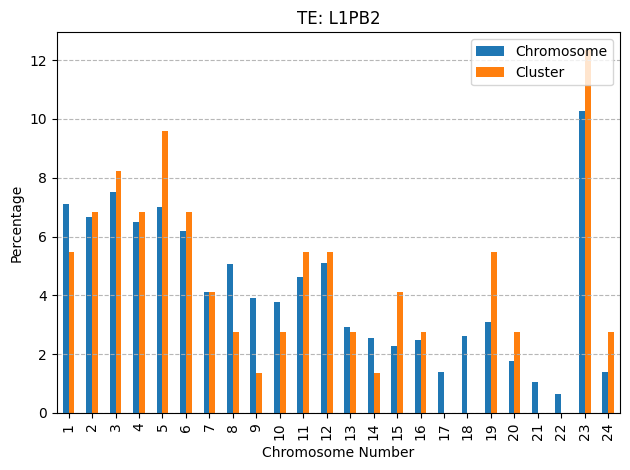

[ 1  2  3  4  8 10 11 12 16 17 20 22]
[ 3 12 20 22]
[20]
[20]
[20]
[20]


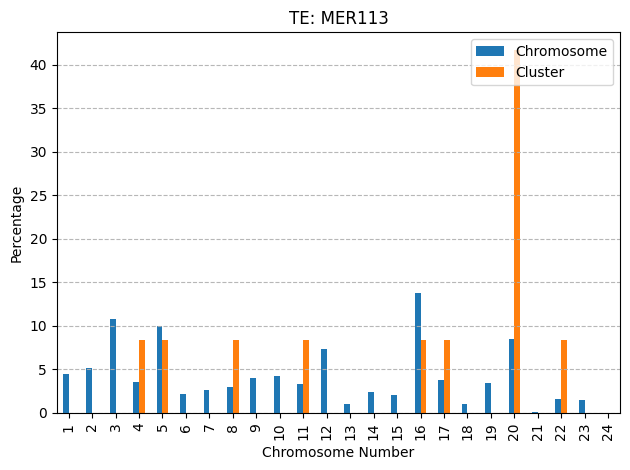

[ 1  2  3  8 10 13 14 15 16 17 20 21 22 23]
[ 1  2  3 10 13 17 21 23]
[]
[]
[1 3]
[1 3]


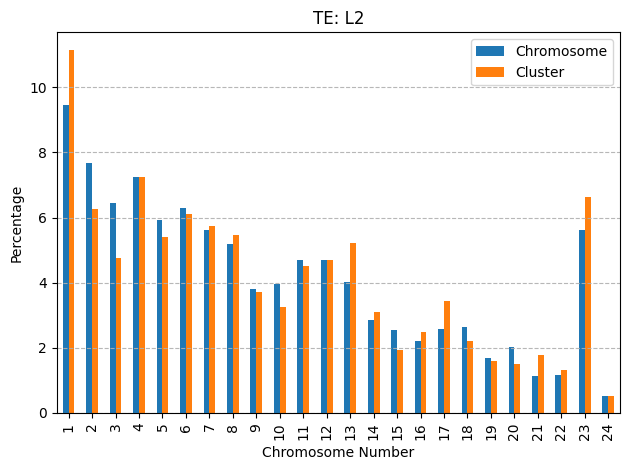

[ 1  3  4  5  6  7 13 15 17 20 22 23]
[ 1  3  4  5  6 20]
[]
[3 6]
[3 6]
[3 6]


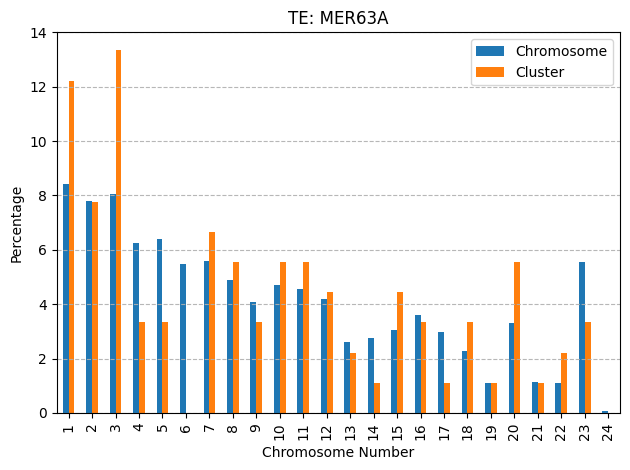

[ 1  2  3  5  7  9 10 13 15 19 24]
[ 1  3  5  7  9 10 19]
[]
[1]
[1]
[1]


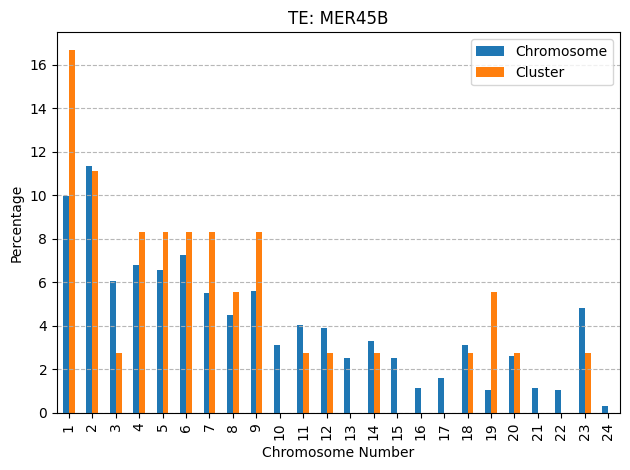

[ 1  2  5  6  8  9 12 16 17 19 20 23]
[ 1  5 12 16 17 19]
[ 5 12 16]
[16]
[ 5 12 16]
[ 5 12 16]


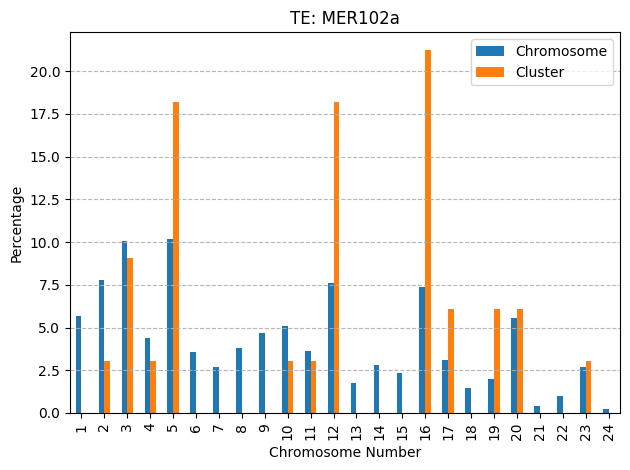

[ 1  2  3  5  6  8 10 12 23 24]
[ 1  2  3  5  6 10 12 15 16 18 23]
[]
[]
[]
[]


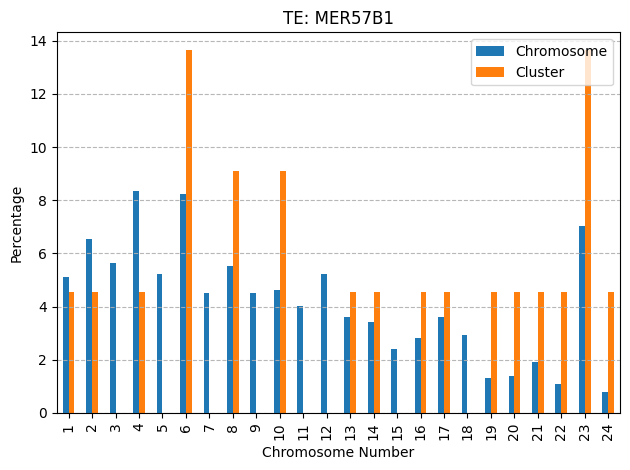

[ 2  3  4  5  6  7  8 10 16 22 23]
[ 2  5  6  7  8 10 15 16 20]
[6 8]
[6]
[6]
[6 8]


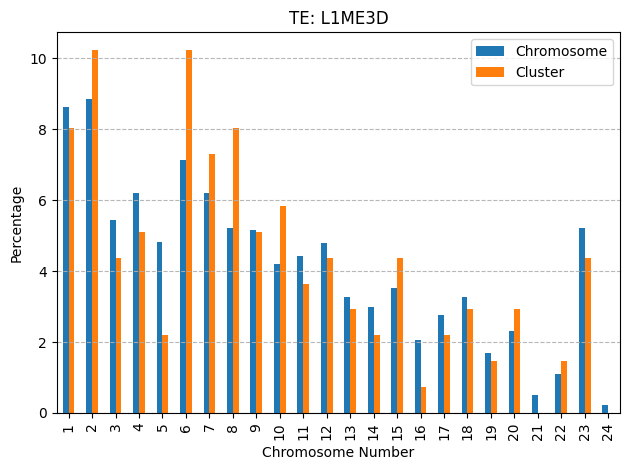

[ 1  2  3  5  7  8 10 12 16 17 18]
[ 1  2  3  7  8 10 12 14 18]
[ 2 18]
[]
[2]
[ 2 18]


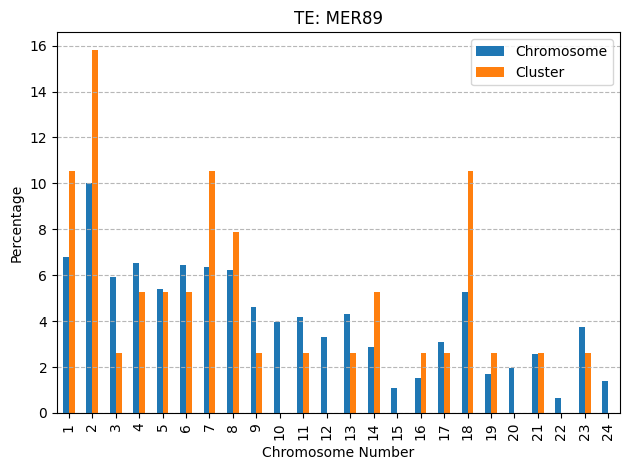

[ 2  5  6  7  8  9 10 11 12 13 22]
[ 1  5  8  9 10 12 13]
[ 6  7  8  9 12]
[12]
[12]
[ 8  9 12]


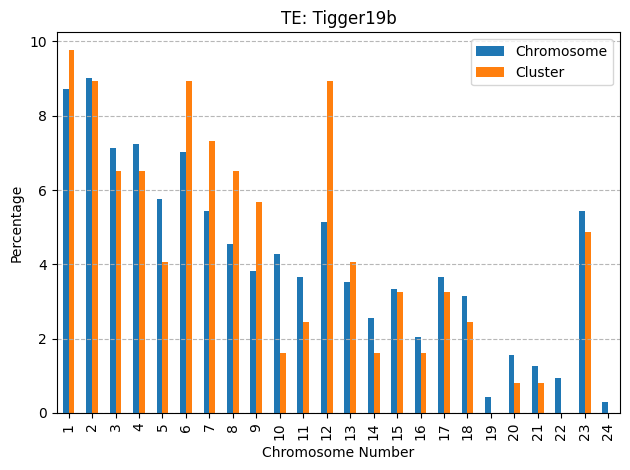

[ 1  2  4  6  7  9 13 14 15 19 23]
[ 1  4  5  6  7 13 14 15 19 20 23]
[]
[]
[]
[]


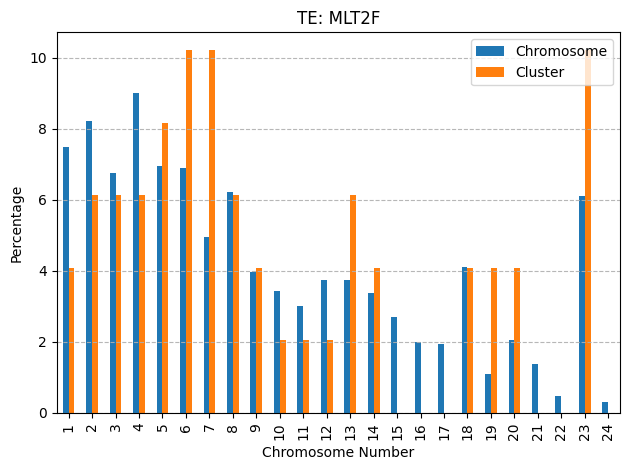

[ 1  3  7 10 13 14 15 16 17 19 20 23]
[ 1  7 10 15 19 23]
[19]
[19]
[19]
[19]


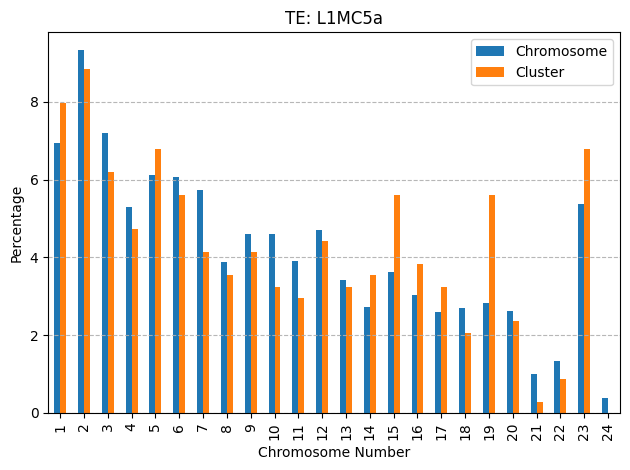

[ 2  7  8  9 10 11 12 13 14 17 18 20 22]
[ 2  8  9 10 13 18 20]
[]
[10]
[ 2 10 18]
[ 2 10 18]


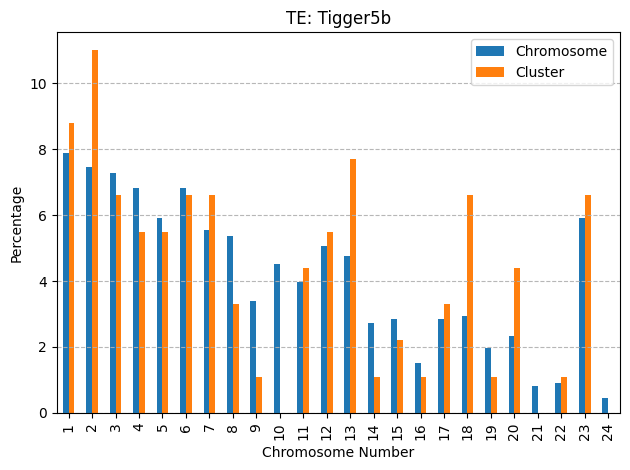

[ 1  2  3  4 10 11 12 13 14 15 17 18 19]
[ 1  2  4 10 11 13 14 15 17]
[10 14]
[10 14]
[10 14]
[10 14]


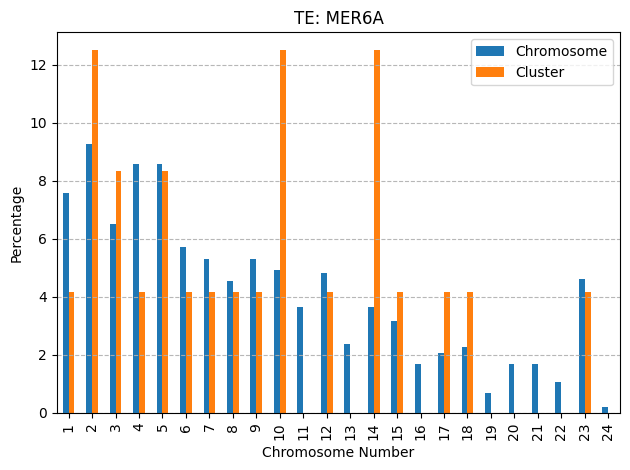

[ 3  4  6  9 11 13 14 17 20 21 23 24]
[ 3  4  5  6 11 13 23]
[]
[]
[]
[]


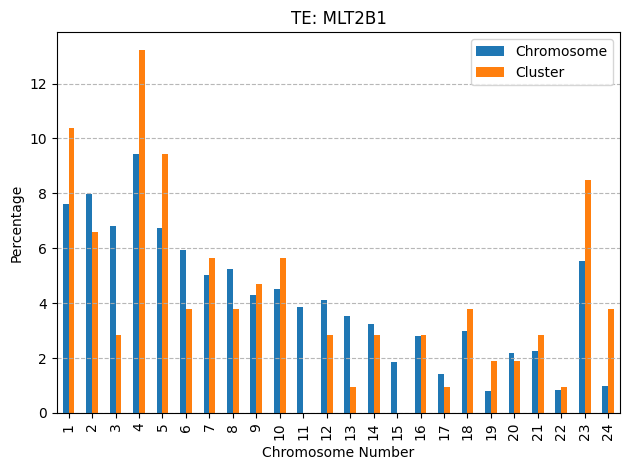

[ 1  4  6  8 11 14 16 17 21 23 24]
[ 1  6  8 11 17 23]
[]
[1]
[1]
[1]


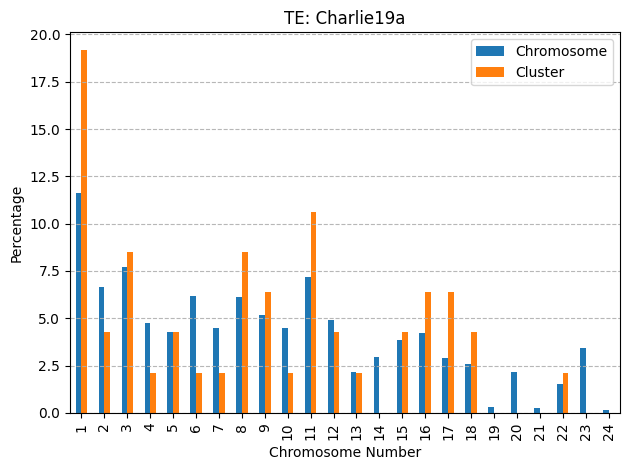

[ 1  3  4  5  7 10 13 15 18 20 23 24]
[ 1  3  4 14 20 23]
[3]
[3]
[3]
[3]


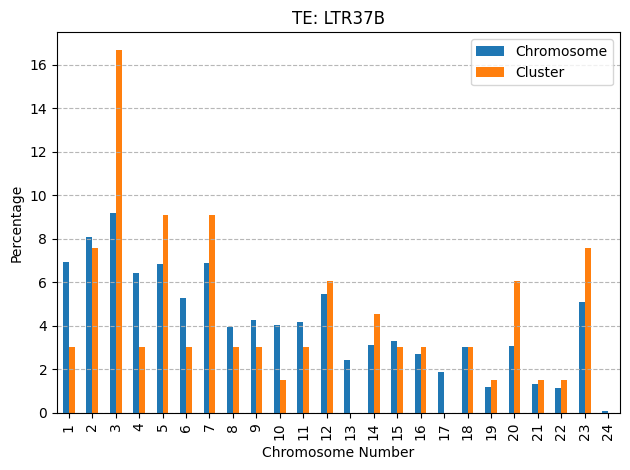

[ 1  2  3  5  6 10 11 12 14 16 23 24]
[ 1  2  3  4  5  9 11 14 15 16 17 23]
[]
[]
[11]
[11]


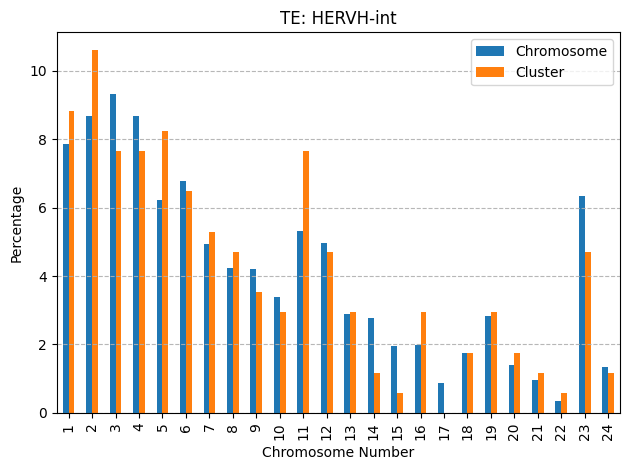

[ 2  4  5  6  7 11 15 16 17 18 23 24]
[ 2  5 15 23 24]
[23]
[23]
[23]
[23]


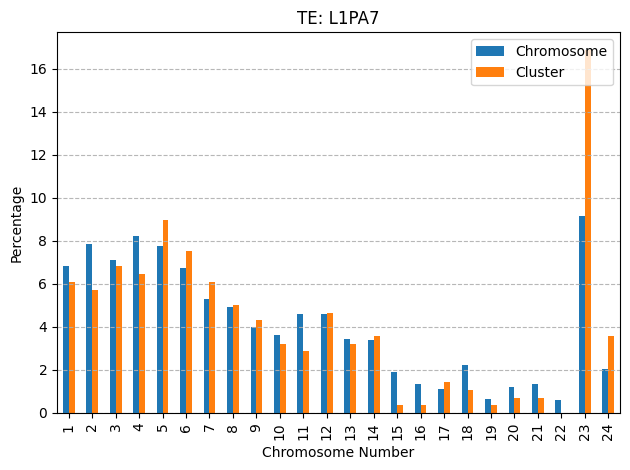

[ 2  3  4  7  9 11 12 14 19 21 22 23 24]
[ 2  3  7 11 19 23 24]
[]
[]
[23]
[23]


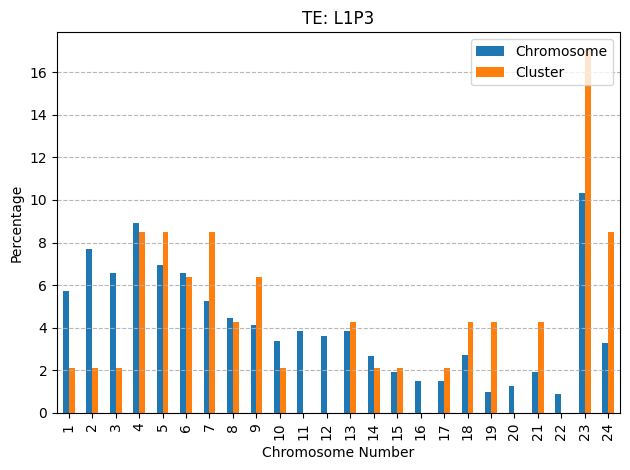

[ 1  3  4  5  7  8 11 15 16 18 23]
[ 1  3  5 11 23]
[]
[]
[]
[]


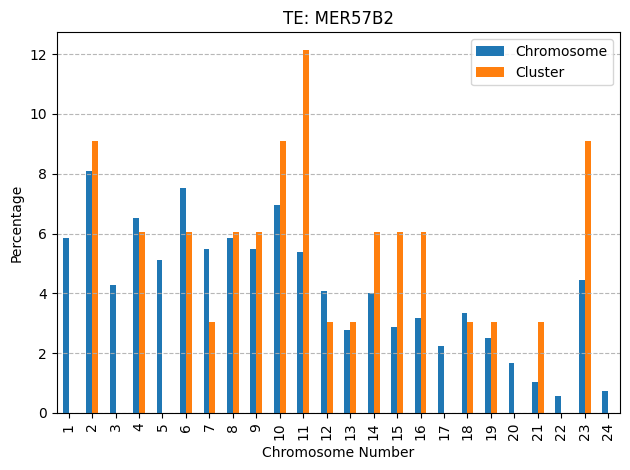

[ 3  4  5  6  7  8 11 12 15 16 19 20 21]
[ 3  4  6  7  8 12 16 20 23]
[]
[]
[]
[]


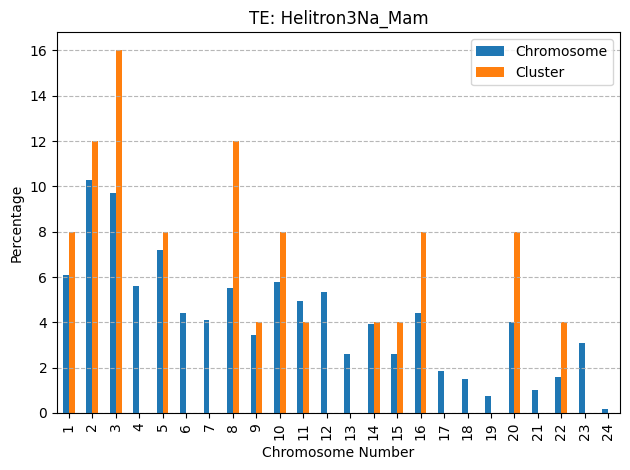

[ 2  4  5  6  7  9 11 12 14 15 17 19]
[ 2  5  6 11 17 19]
[19]
[17 19]
[ 2 17 19]
[ 2 17 19]


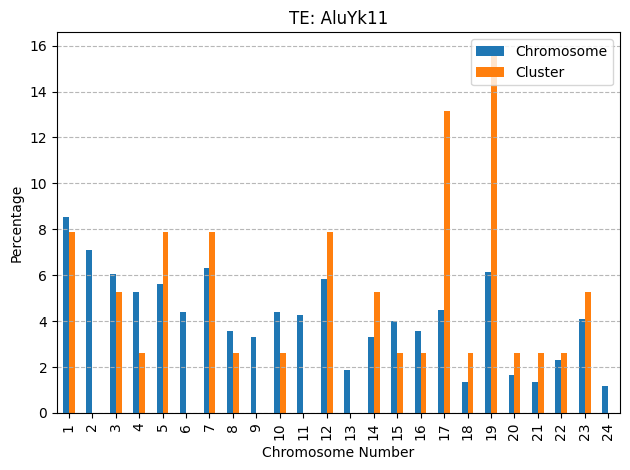

[ 2  4  5  6  7 17 18 20 22 23 24]
[ 2  4  5 17 23]
[]
[]
[]
[]


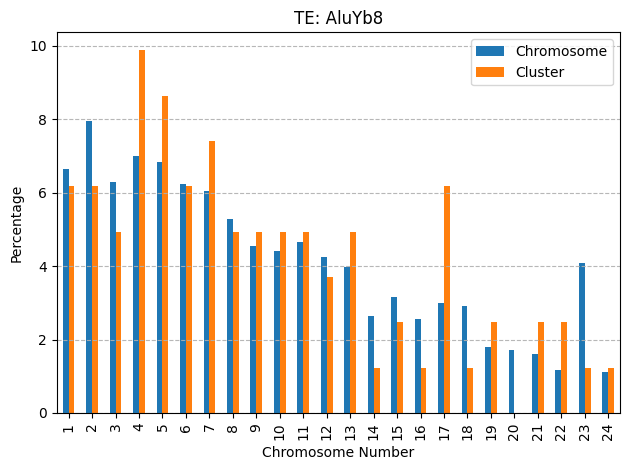

[ 3  7  8  9 11 12 13 15 19 21 24]
[ 3  5  6  7  8  9 11 12 13 15 19 23 24]
[]
[]
[]
[]


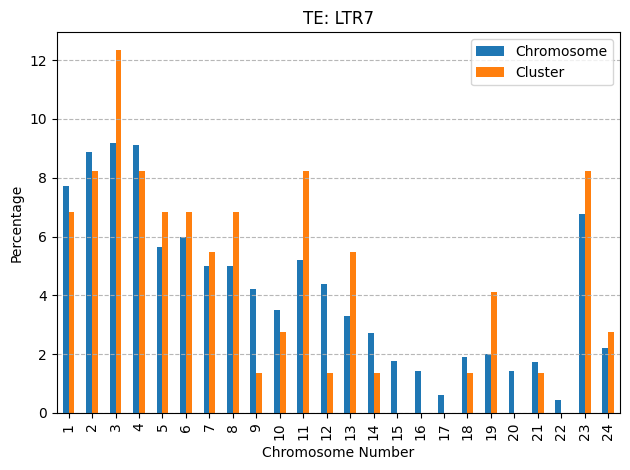

[ 1  2  4  5  7  8  9 12 14 18 23 24]
[ 1  4  5 14 23]
[]
[5]
[5]
[5]


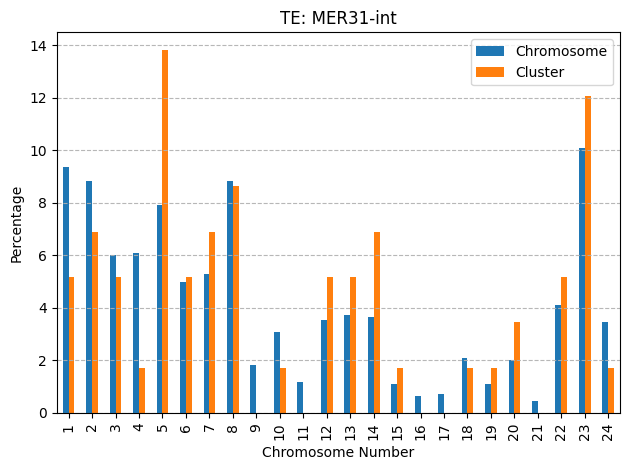

[ 2  4  8 13 14 16 17 19 20 22 24]
[ 2  4 17 19]
[19]
[19]
[ 2 19]
[ 2 19]


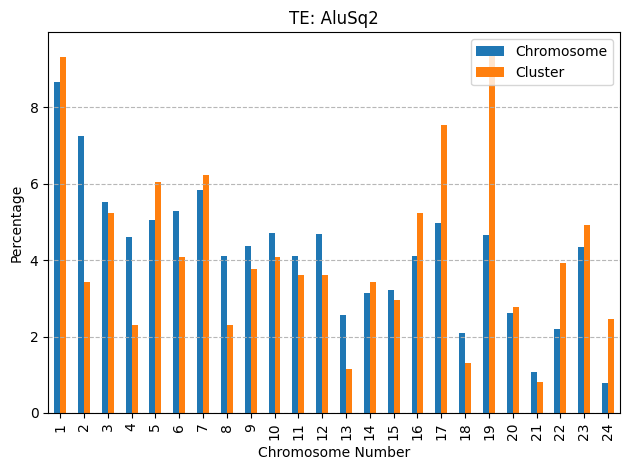

[ 1  3  4  5  6  7 11 12 14 19 20 22 23]
[ 1  2  3  4  5  6  7 14 17]
[]
[]
[]
[]


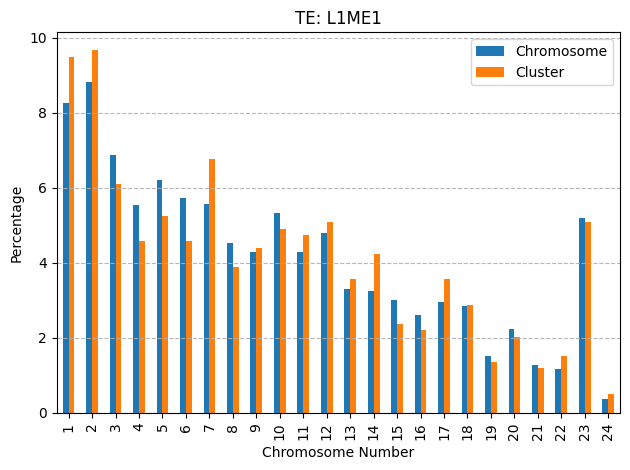

[ 3  4  6  7 10 11 15 16 19 23 24]
[ 3  6  8 11 16 23]
[]
[23]
[23]
[23]


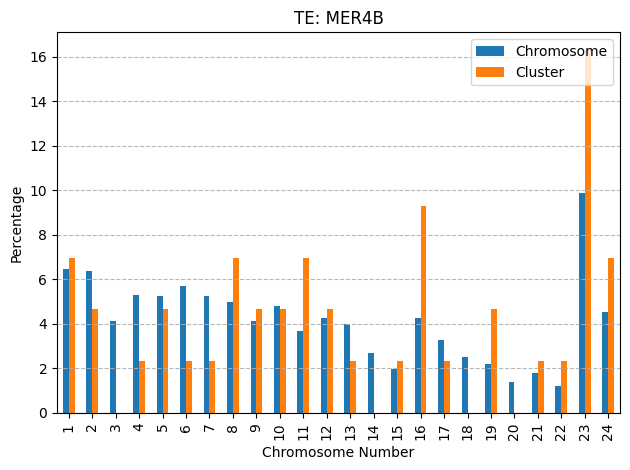

[ 1  2  3  5  6  8  9 10 13 19 20 23 24]
[ 1  2  3  5  9 23]
[]
[]
[23]
[23]


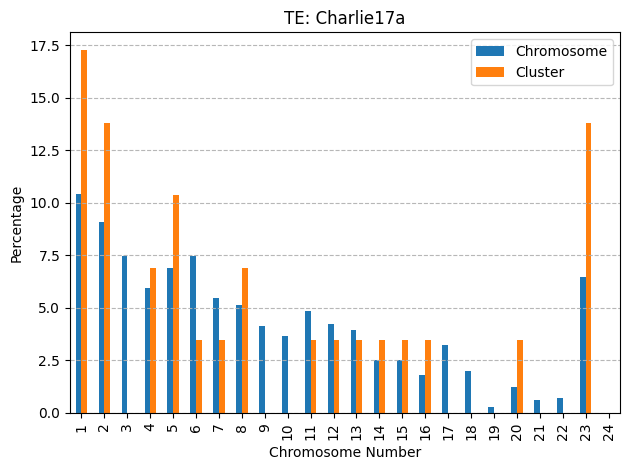

[ 2  3  5  6  7  8 11 16 17 22 23 24]
[ 2  3  5  6  7  8 11 23]
[]
[3]
[]
[3]


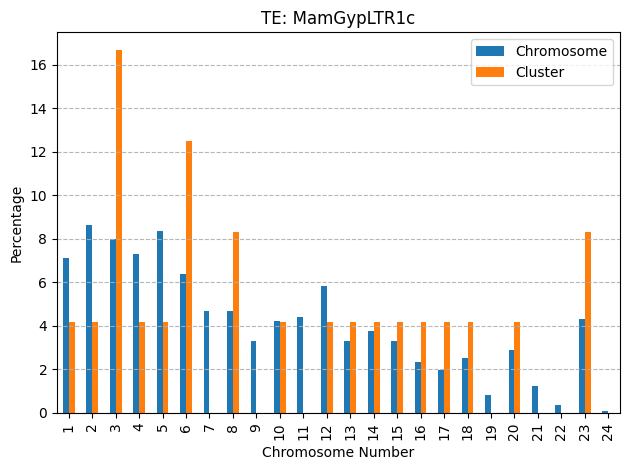

[ 2  3  4  5  8 14 16 17 18 21 23 24]
[ 2  3  4  6  8 14 16 18 23]
[]
[]
[18]
[18]


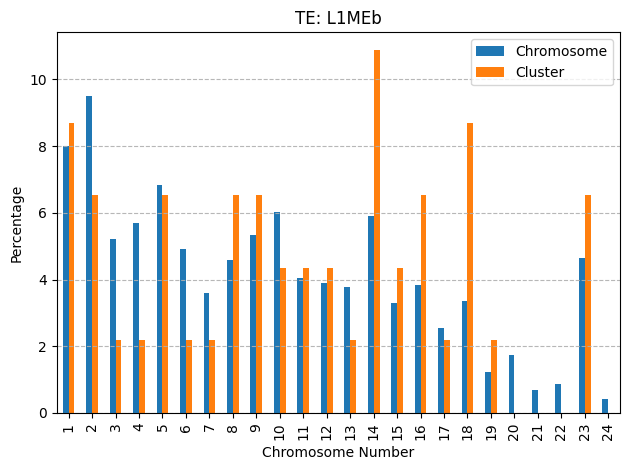

[ 1  2  3  4  7  9 14 18 19 20 22 23 24]
[ 1  3  4  7 14 19]
[19]
[19]
[ 7 14 19]
[ 7 14 19]


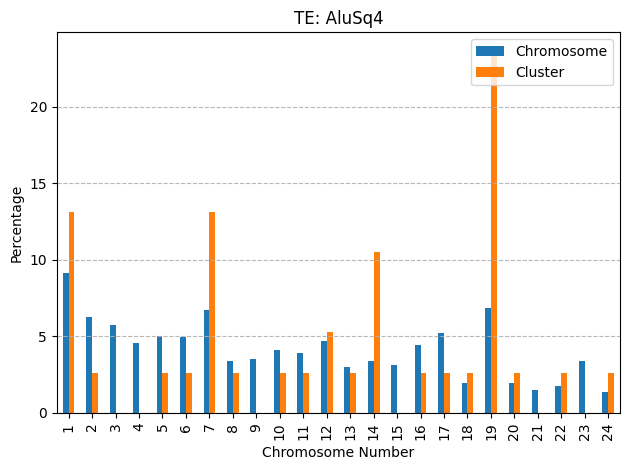

[ 3  4  7 10 11 12 14 17 19 21 23]
[ 3  4 10 11 14 15 17 22 23]
[]
[]
[]
[]


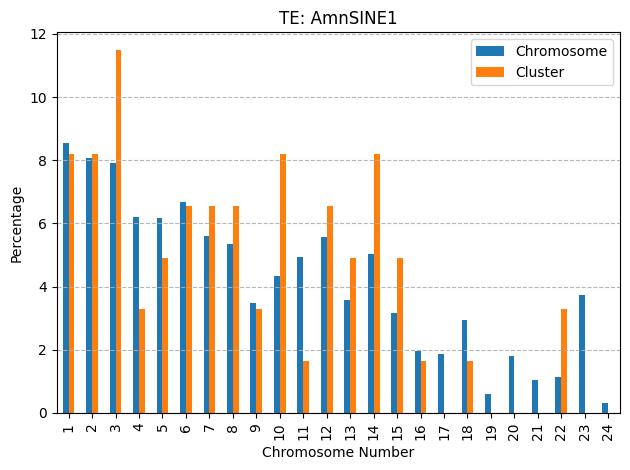

[ 1  2  3  4  6  7  9 13 18 22 23 24]
[ 1  3  4  6  9 13 22 23]
[]
[3]
[3]
[3]


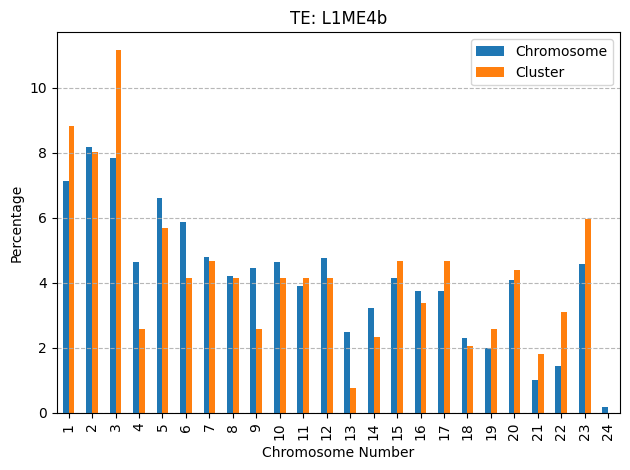

[ 1  3  9 10 11 13 14 16 19 21 22]
[ 3 10 11 13 16 19]
[]
[19]
[]
[19]


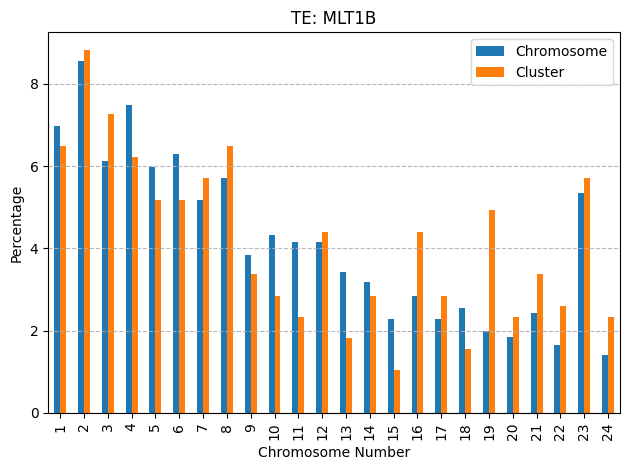

[ 1  2  3  4  5  7  9 12 14 16 17 23]
[ 1  2  3  4  7  9 11 23]
[]
[]
[]
[]


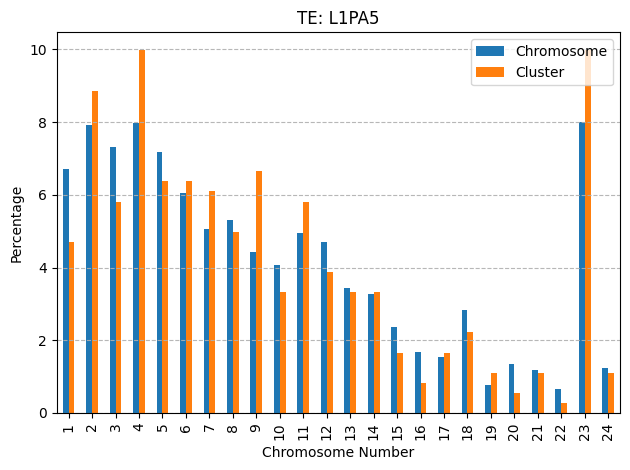

[ 2  6  7  8  9 12 13 19 20 21 24]
[ 2  6  7  9 12 13 14 16 18 21 23]
[]
[]
[]
[]


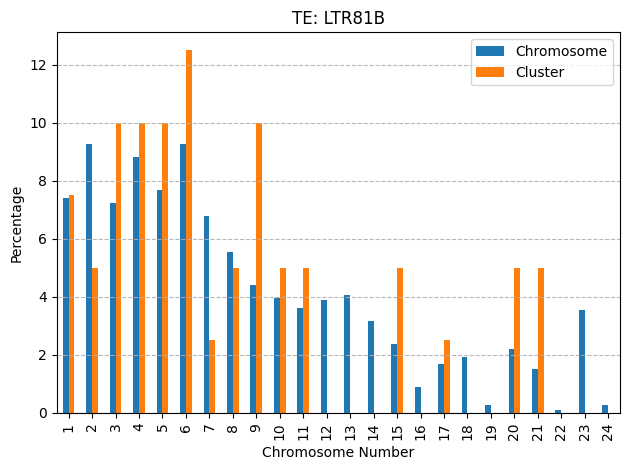

[ 1  2  3  5  7  8 10 12 14 15 16 18 20]
[ 1  2  3  5  8 10]
[3]
[3]
[ 2  3 10]
[ 2  3 10]


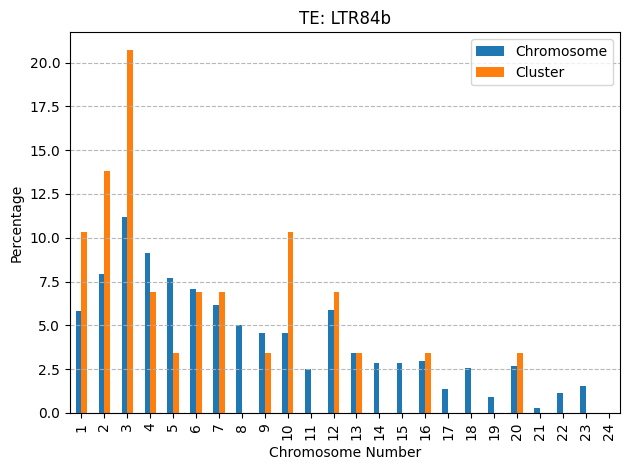

[ 1  6  7  8 11 12 14 17 18 23]
[ 1  6  7 11 12 14 18 23]
[]
[]
[]
[]


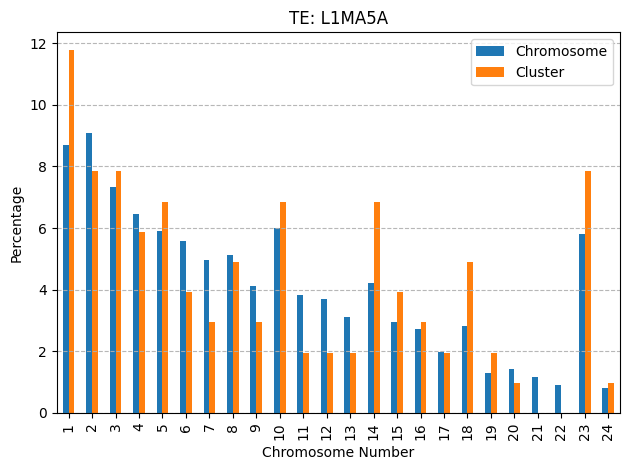

[ 3  5  8 13 14 16 17 20 21 22 24]
[ 3  5 13 16 17 19 20 22]
[]
[16]
[16]
[16]


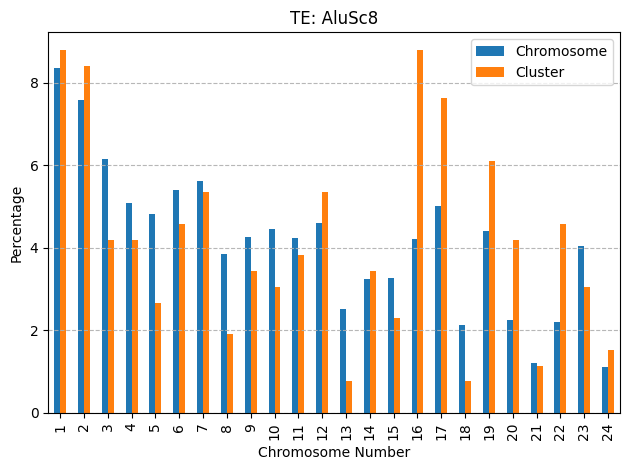

[ 1  2  3  5  6  7  8 12 14 20 23]
[ 1  2  5  6 12 23]
[6]
[6]
[1 6]
[1 6]


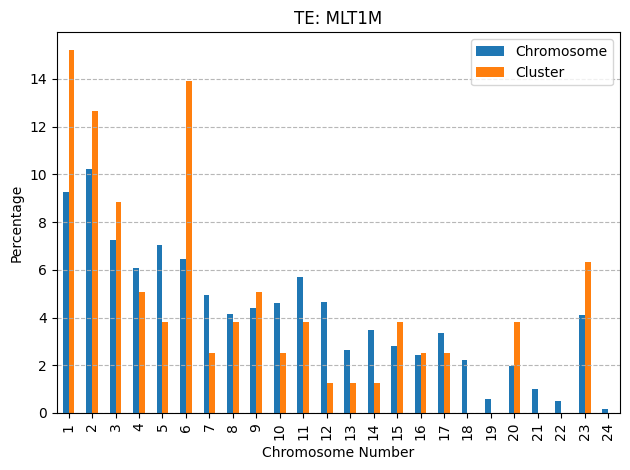

[ 2  6  7  8 10 11 12 14 18 20 22 23]
[ 2  4  6  8 11 14 18 23]
[]
[]
[]
[]


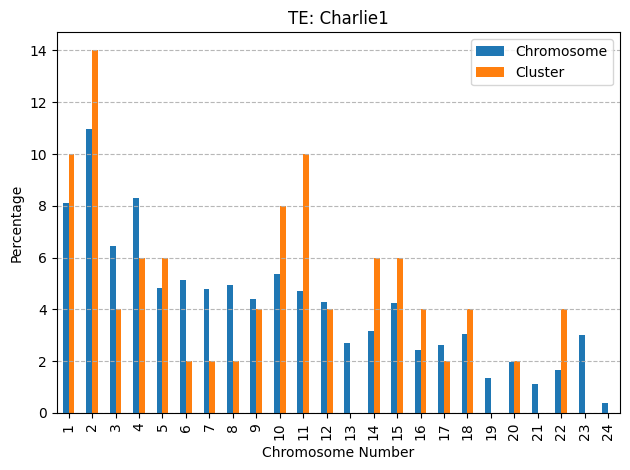

[ 5  6  7  9 10 18 20 23 24]
[ 1  2  6  7  9 10 12 18 20 23]
[]
[6]
[6]
[6]


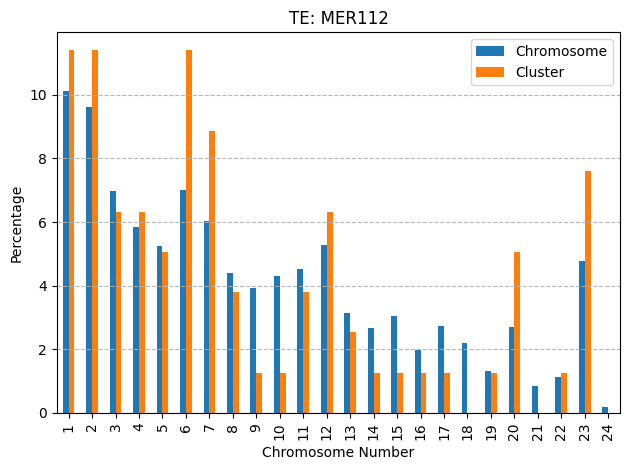

[ 1  3  4  6  9 11 13 14 16 17 18 20 23]
[ 1  3  9 11 17]
[]
[3]
[3]
[3]


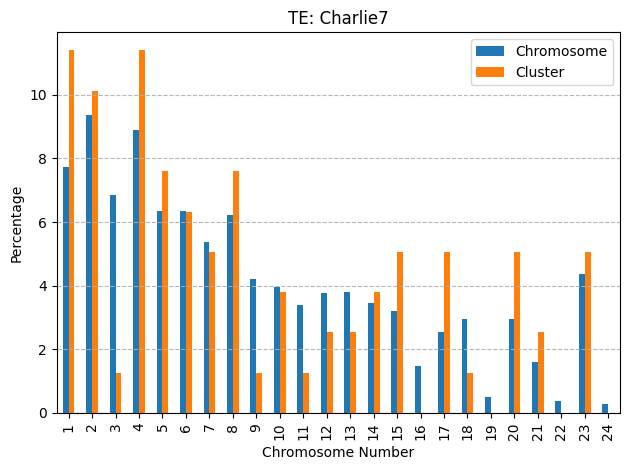

[ 1  3  4  5  8 11 12 15 18 19 23 24]
[ 1  3  4  7 12 23]
[1 3]
[3]
[1 3]
[1 3]


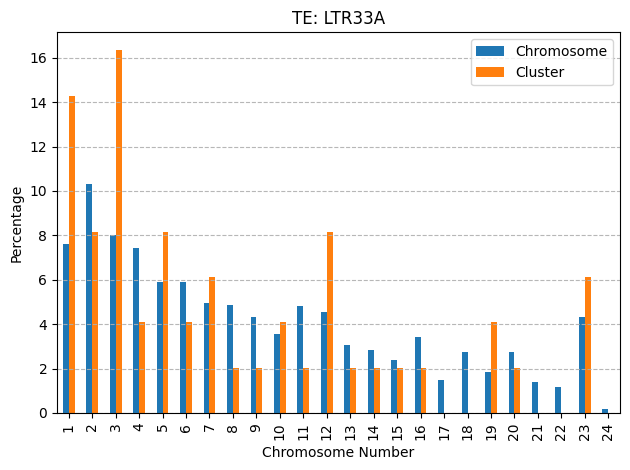

[ 1  2  5  6  7 10 12 17 18 19 20 22]
[ 1  2  5  6  7 15 17 19]
[]
[]
[1]
[1]


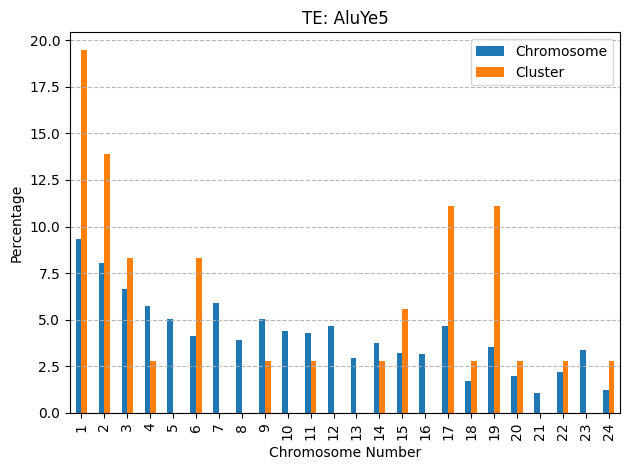

[ 1  2  3  4  5  6  7  8  9 11 20 21]
[ 1  3  4  5  6  7  8 11 21]
[1]
[1]
[1]
[1]


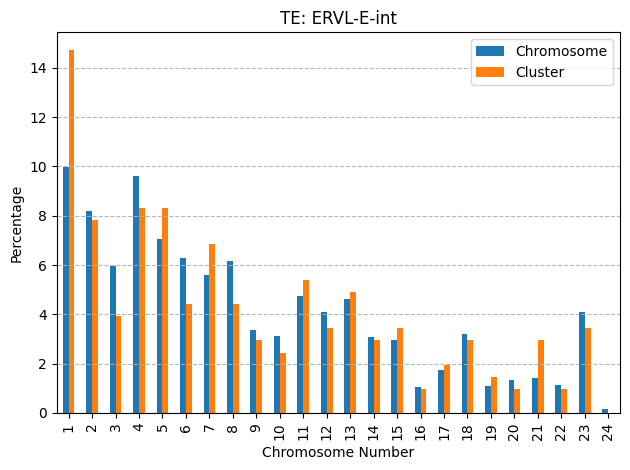

[ 4  5  6  7  8 12 13 14 17 20 21 23 24]
[ 4  5  6  8 12 13 14 20 23]
[8]
[8]
[8]
[8]


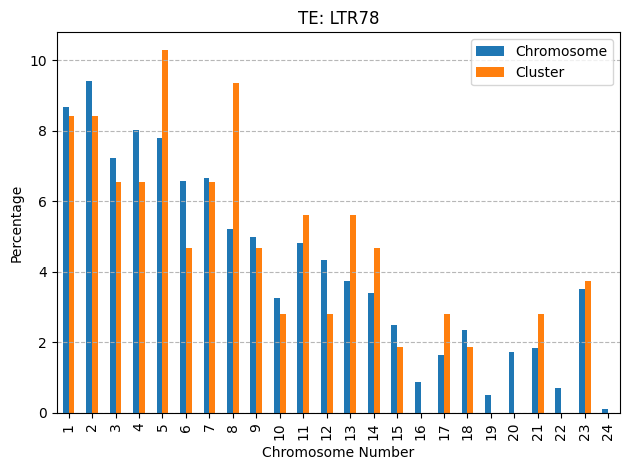

[ 1  2  3  4  5  8 10 11 12 15 17 23]
[ 1  2  3  4  5  8 11 23]
[ 1  3  4 23]
[1]
[ 1  3  4 23]
[ 1  3  4 23]


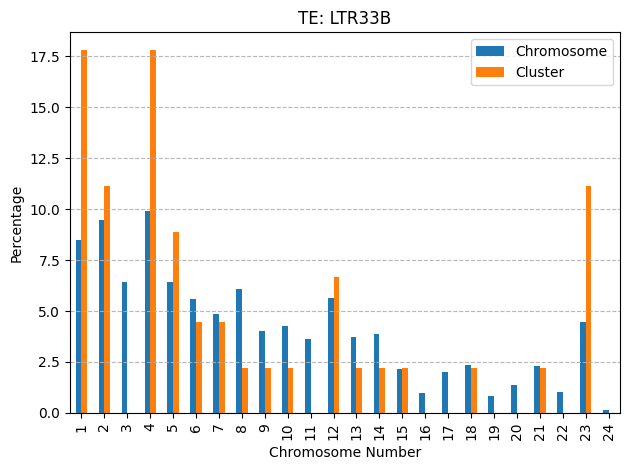

[ 1  2  3  4  5  6 17 19 20 21 23 24]
[ 1  2  3  5  6 17 19 23]
[17]
[17]
[17]
[17]


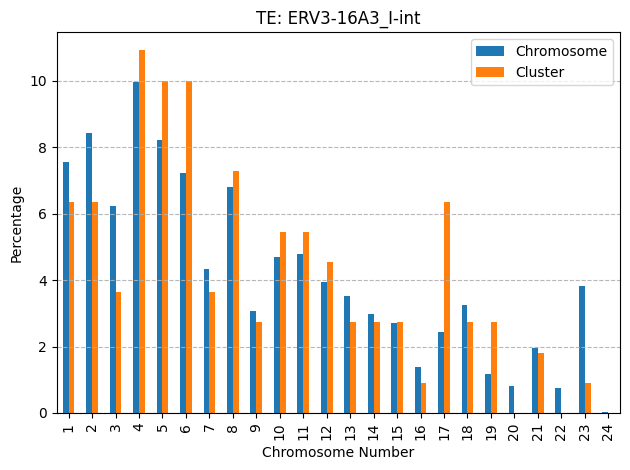

[ 1  2  3  4  5  6  7  8 12 14 17 22]
[ 1  3  5  6 12 14]
[3]
[3]
[ 1  3  5 12 14]
[ 1  3  5 12 14]


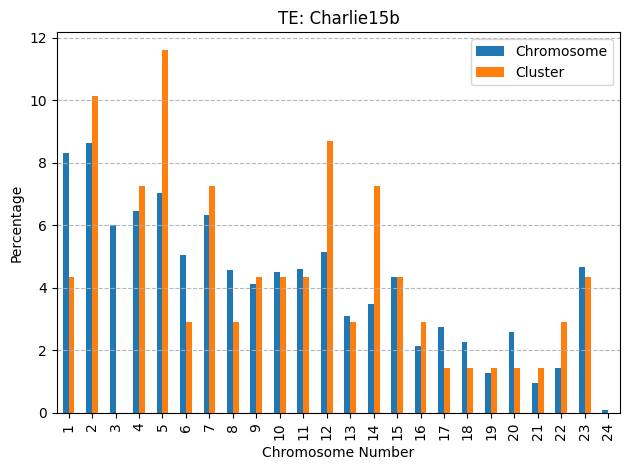

[ 1  2  8  9 10 11 12 14 15 18 19]
[ 2  9 19 21]
[19]
[19]
[19]
[19]


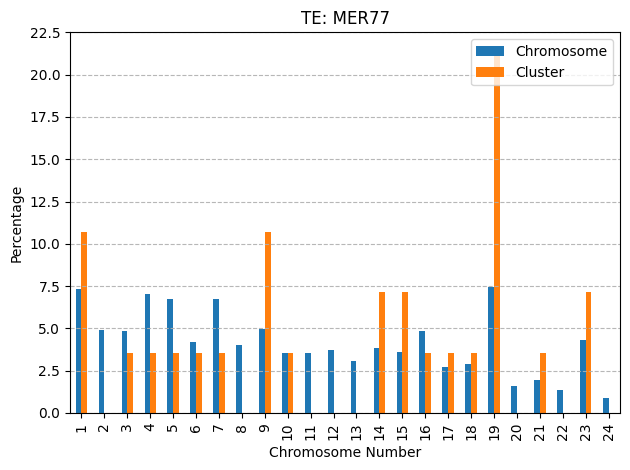

[ 1  2  3  8 10 11 12 14 15 16 18 19 20 23]
[ 1  8 12 14 18 20 21]
[]
[]
[]
[]


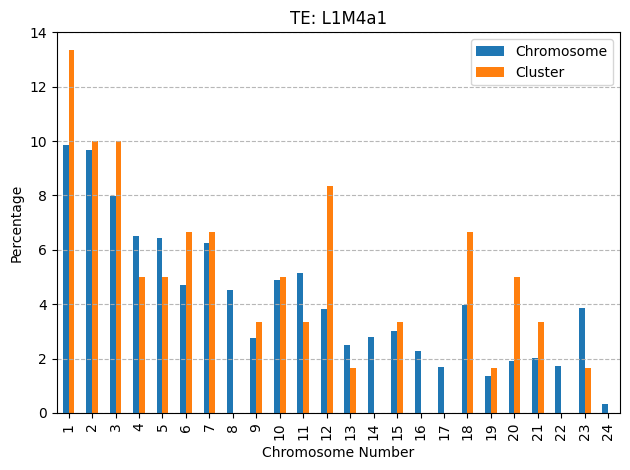

[ 1  4  5  6 11 12 13 14 18 19 20]
[ 4  5  6 12 13 17 19 20]
[]
[20]
[20]
[20]


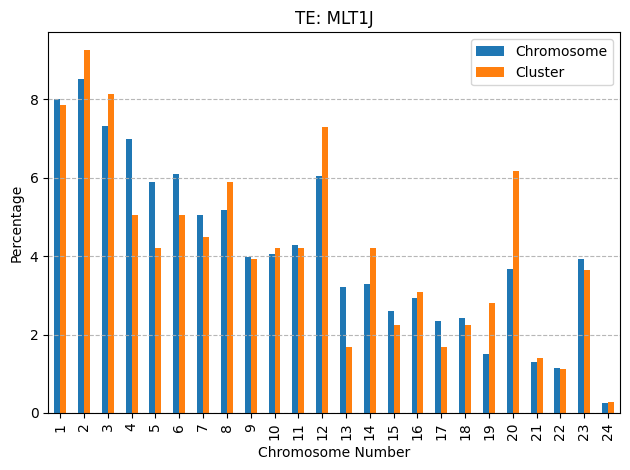

[ 1  7  8 11 13 14 15 16 18 20 21 22 23 24]
[ 8 11 13 15 16 20 23 24]
[]
[15]
[13 15]
[13 15]


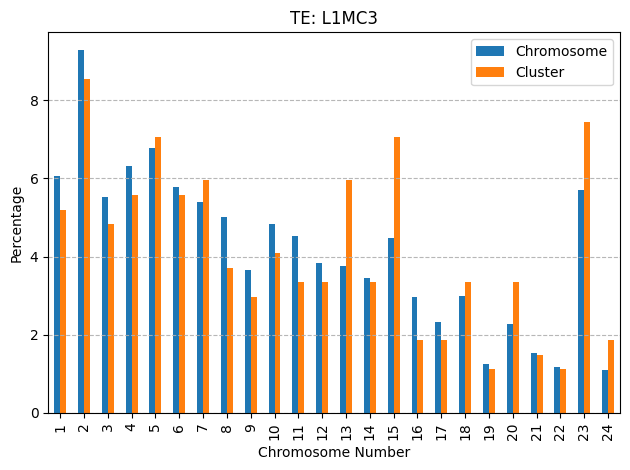

[ 1  3  5  8  9 10 11 19 20 22 23 24]
[ 5 19 23 24]
[23]
[23]
[23]
[23]


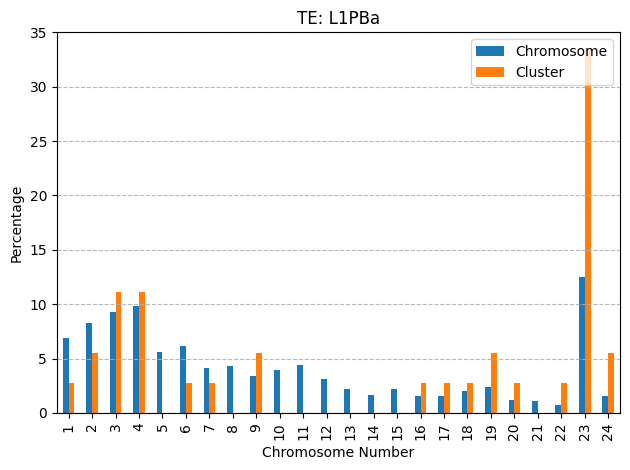

[ 1  2  4  6  7  8 11 14 18 21 23 24]
[ 1  2  4  6  7  8 11 14 23]
[]
[]
[]
[]


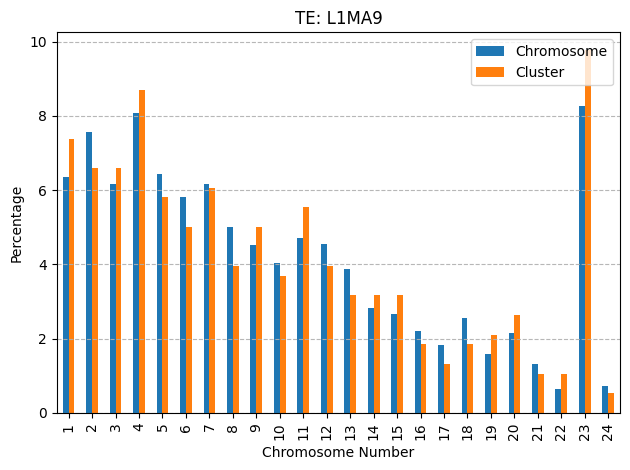

[ 2  3  5  6  8 11 12 13 17 18 20 23]
[ 1  2  5  8  9 11 12 14 18 23]
[]
[]
[]
[]


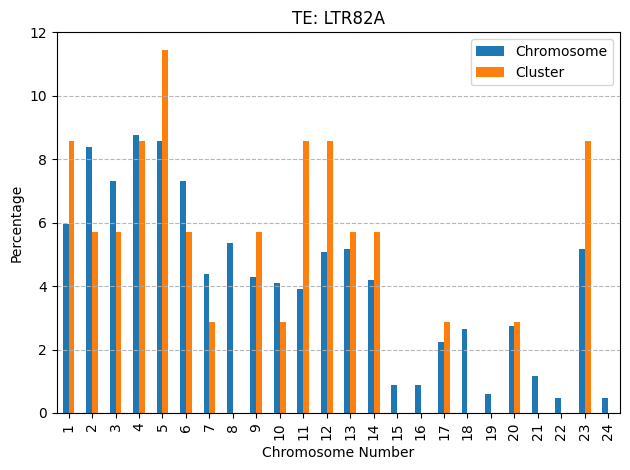

[ 1  4  8  9 11 12 14 15 17 18 19 22 23]
[ 1 12 14 15 18]
[]
[15]
[15]
[15]


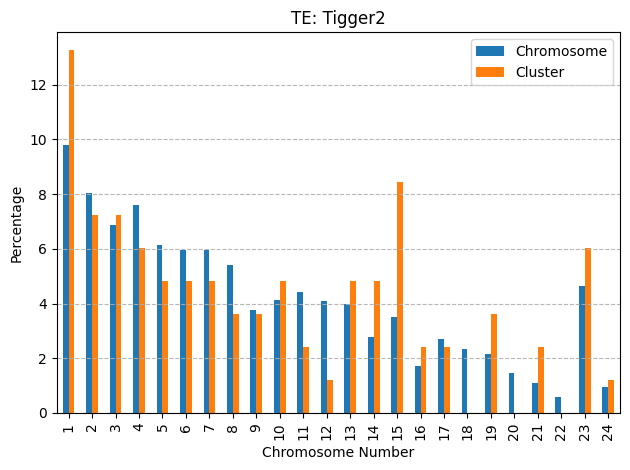

[ 2  4  6  7 10 14 15 17 20 21 23 24]
[ 1  2  4  6  7 14 15 16 20 23]
[2 6]
[]
[2 6]
[2 6]


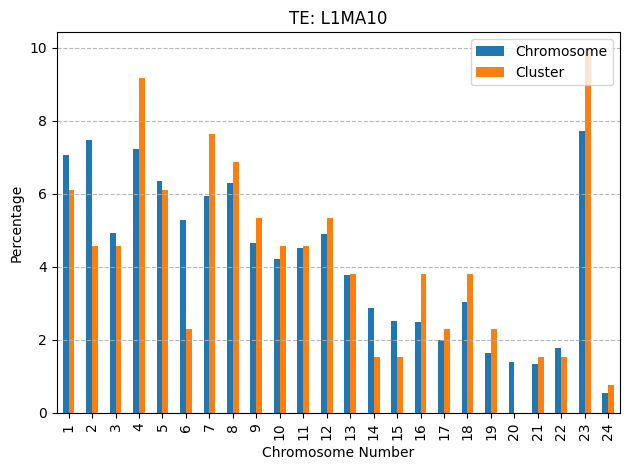

[ 1  2  3  5  6  7  8 10 12 14 16 24]
[ 1  2  6 24]
[6]
[6]
[6]
[6]


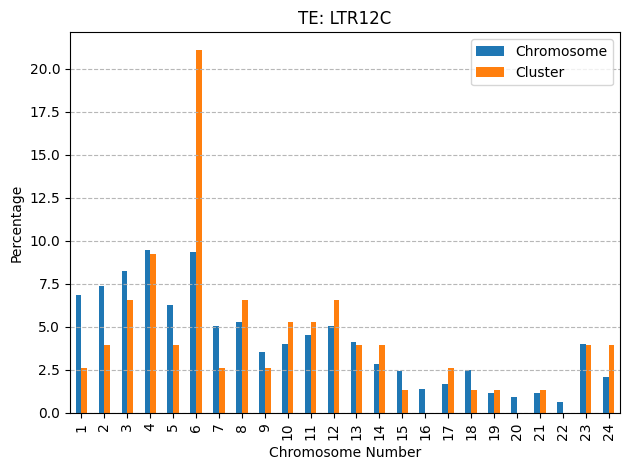

[ 2  5  6  7  8  9 13 14 16 19 20]
[ 2  5  6  7  8  9 13 15 19 20]
[ 9 19 20]
[19]
[ 6  9 19 20]
[ 6  9 19 20]


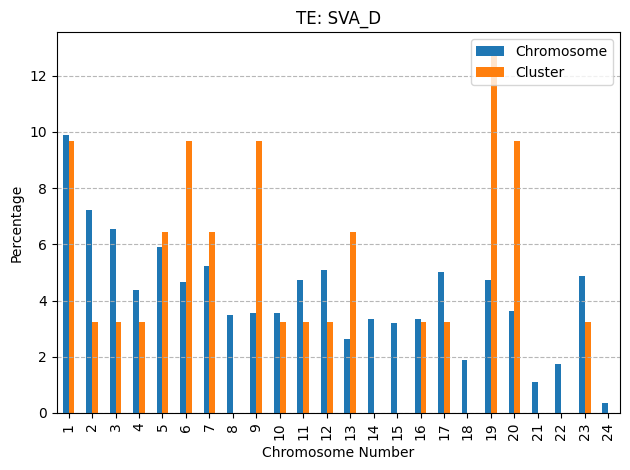

[ 1  3  4  7 10 11 12 13 15 16 19 20 23]
[ 1  4  7 13 20]
[20]
[20]
[ 1  7 20]
[ 1  7 20]


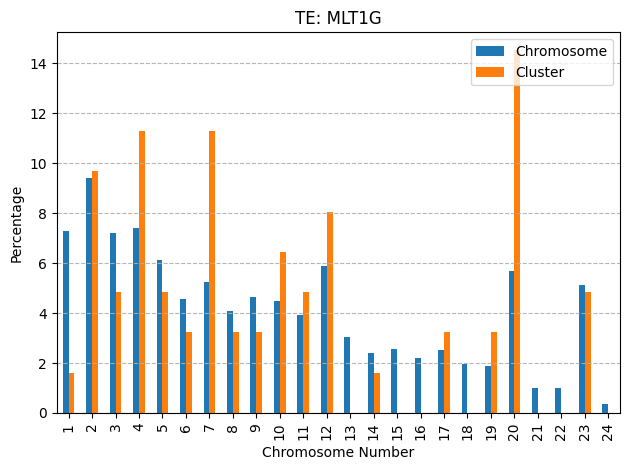

[ 1  3  4  5  6  8  9 11 13 14 15 16 18 19]
[ 1  3  6  8  9 11 13 16]
[]
[]
[]
[]


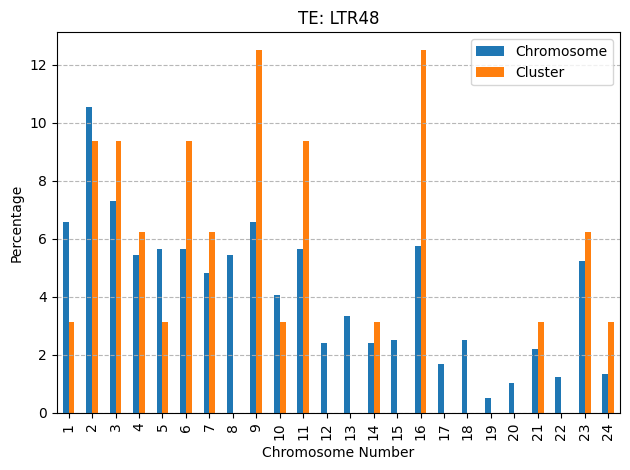

[ 1  2  3  5  6 10 15 16 17 19 22]
[ 2  6 17 19]
[19]
[19]
[19]
[19]


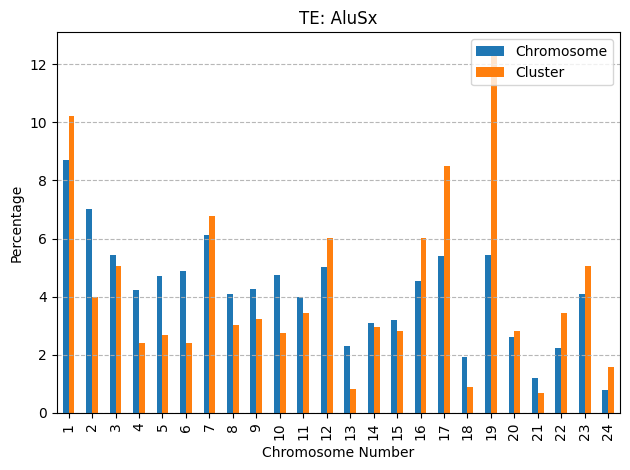

[ 1  2  3  4  6  7  9 12 19 22 23]
[ 1  3  4 12 19]
[19]
[19]
[ 1 19]
[ 1 19]


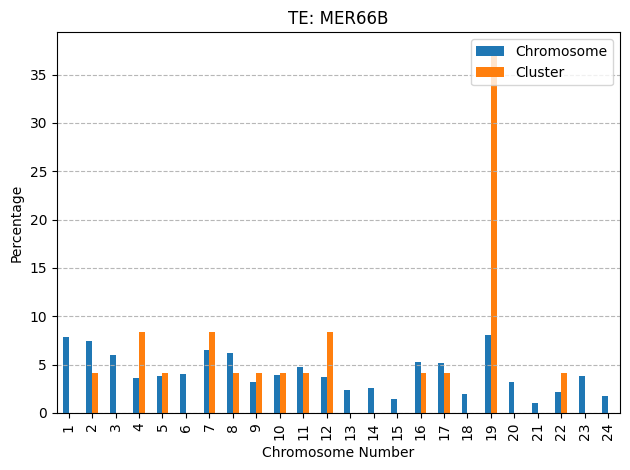

[ 1  3  5  6  7 11 12 14 18 23 24]
[ 3  6  7 11 12 14 23 24]
[23]
[23]
[23]
[23]


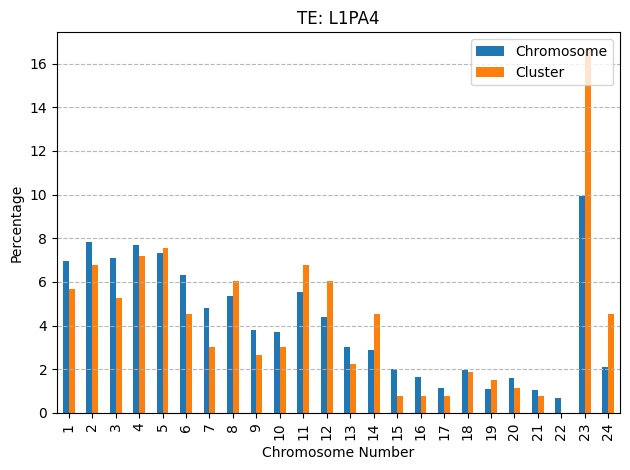

[ 2  3  4  5  6  9 10 12 15 22 24]
[ 2  3  4 10 12 14]
[ 4 12]
[12]
[ 3  4 10 12]
[ 3  4 10 12]


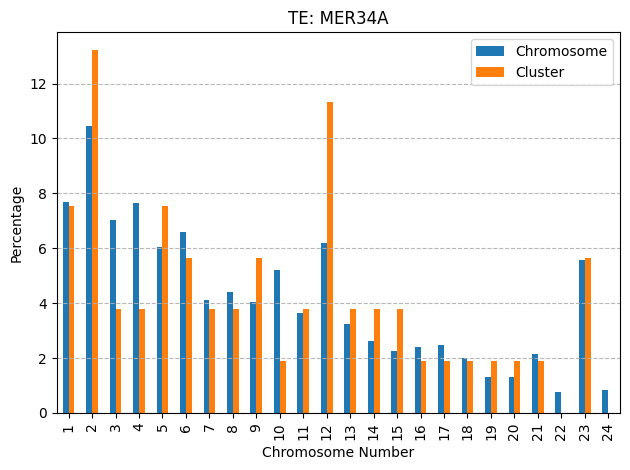

[ 2  3  5 11 13 14 16 17 19 22 23]
[ 3  5 16 17 19 22 23]
[19]
[19]
[19]
[19]


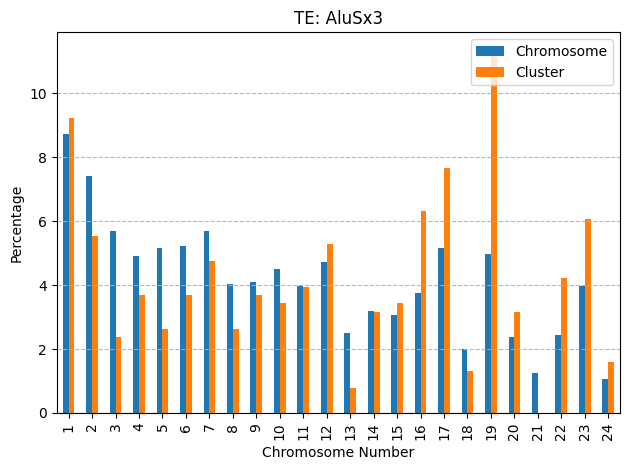

[ 1  3  4  5  6 10 11 12 20 21 23 24]
[ 1  3  4  7 12 21 23 24]
[23]
[23]
[12 23]
[12 23]


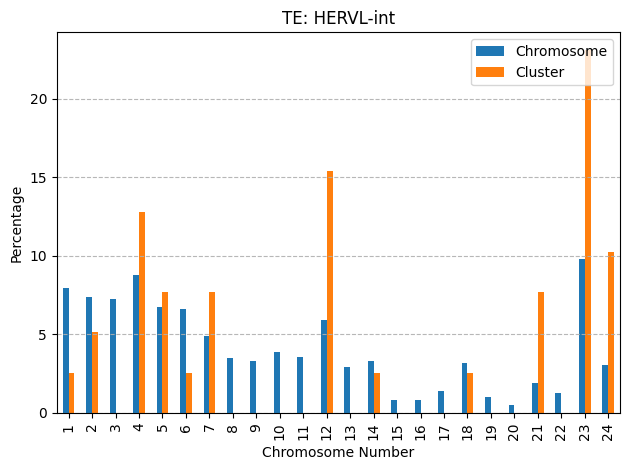

[ 1  2  3  4  6  8  9 11 14 17 18 22 23]
[ 1  2  3  4  8 13 18 23]
[23]
[23]
[23]
[23]


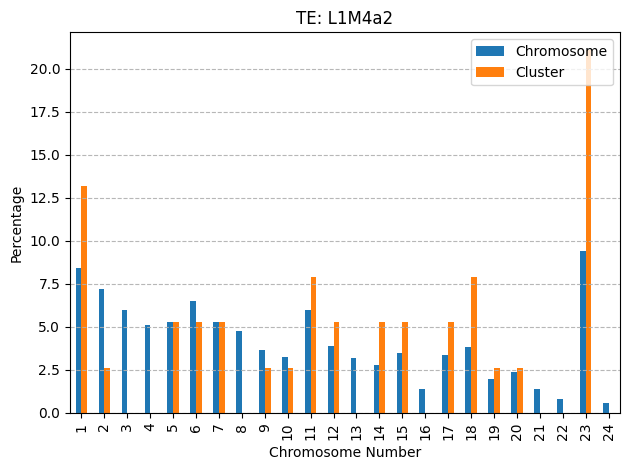

[ 1  2  4  5  6  7  9 11 12 13 18 21 22]
[ 1  4  5 12 21 22]
[]
[]
[]
[]


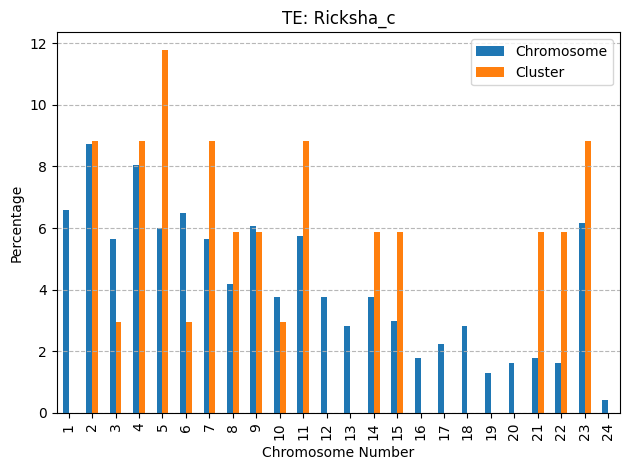

[ 1  2  6  8  9 10 11 13 14 18 20 24]
[ 1  6  8  9 10 14]
[9]
[9]
[9]
[9]


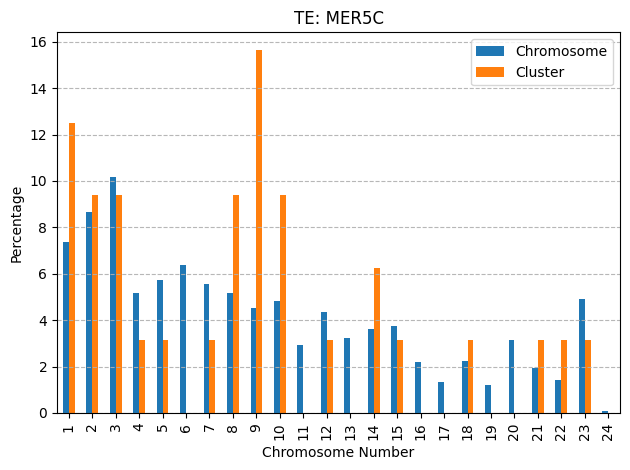

[ 1  4  8 10 12 13 14 15 16 18 19 23 24]
[ 1  4 10 13 15 19]
[4]
[4]
[4]
[4]


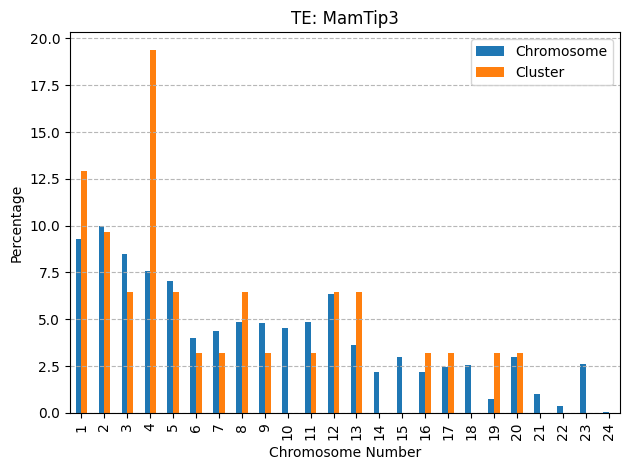

[ 1  2  4  5  6  9 12 16 17 19 20 22]
[ 2  4  5 12 16 19 20]
[16]
[16]
[16 20]
[16 20]


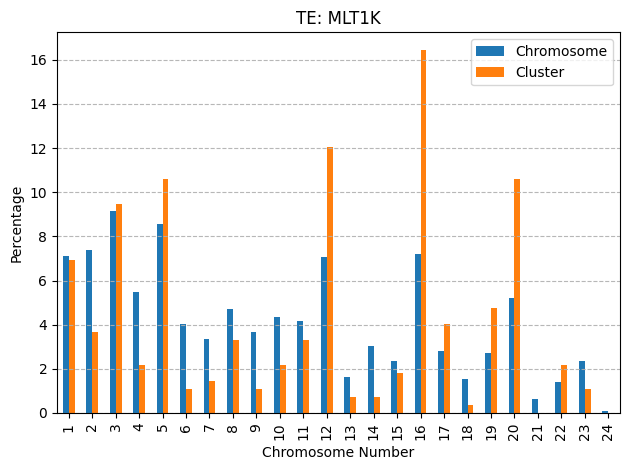

[ 1  2  3  7  9 11 12 13 14 18 19 20 23 24]
[ 2  3  7 10 11 12 13 17 20 23]
[]
[]
[]
[]


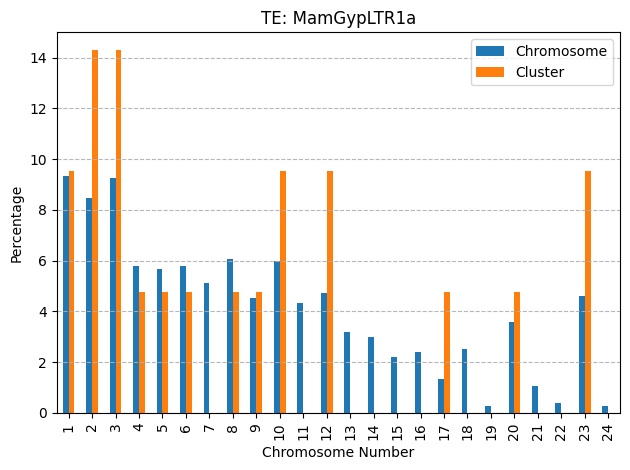

[ 2  3  6 11 13 14 15 16 19 23 24]
[ 2  6 13 14 19 23]
[23]
[23]
[ 2 23]
[ 2 23]


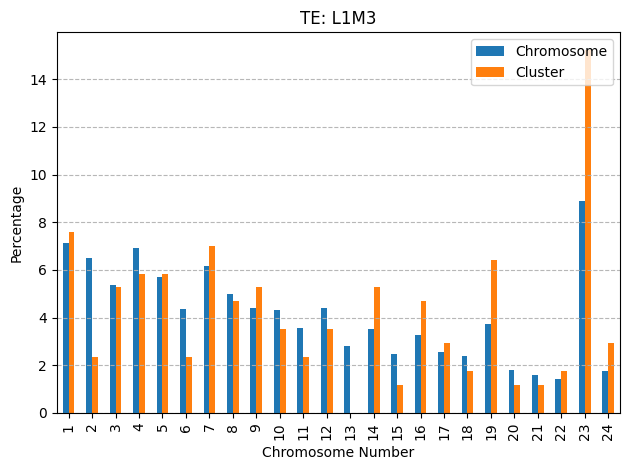

[ 2  4  5  8 11 12 13 16 17 19 22 23 24]
[ 1  2  4 19 22]
[]
[2]
[2]
[2]


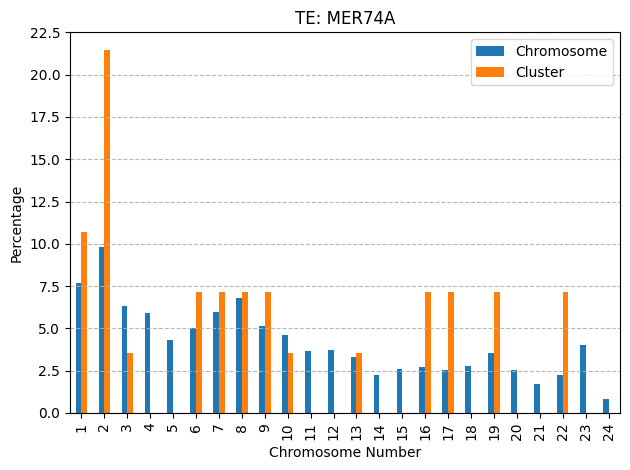

[ 1  2  6 11 13 16 17 18 19 23]
[ 1  6 11 13 16 19 21 23]
[]
[]
[]
[]


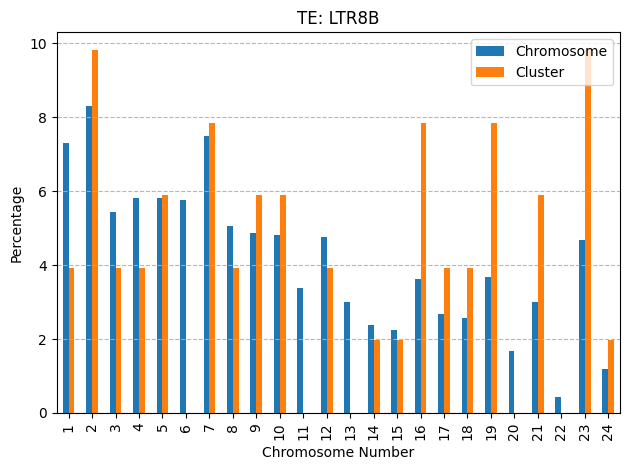

[ 1  2  4  7  8 10 11 15 16 20 21 23]
[ 1  2  4  7  8 10 11 23]
[]
[]
[ 1  7 23]
[ 1  7 23]


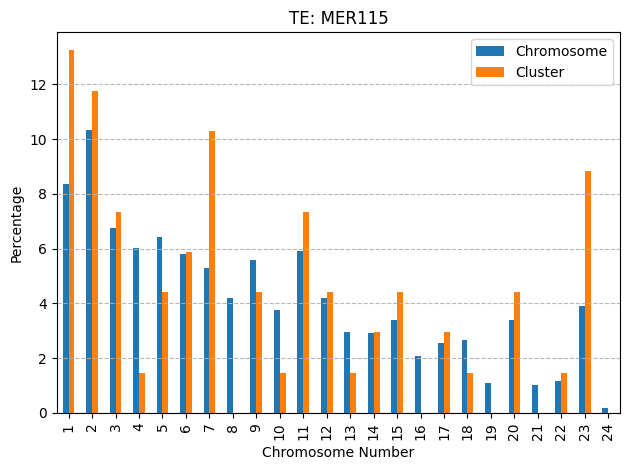

[ 1  4  5  6  7  8 10 11 13 17 18 23]
[ 1  4  5  8 11 23]
[23]
[23]
[23]
[23]


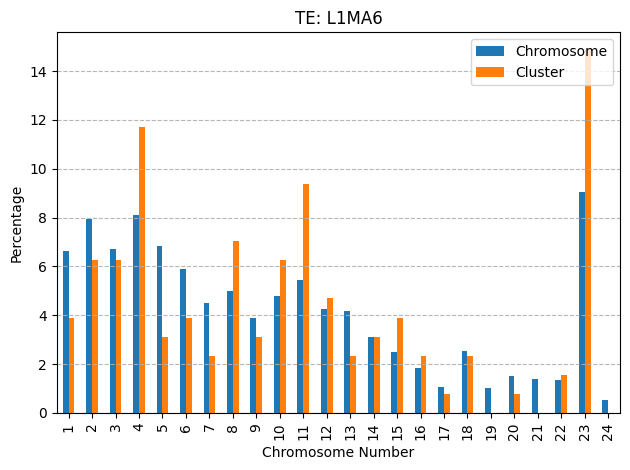

[ 1  2  3  4  5  6  7 10 13 14 15 16 19 20 23]
[ 1  2  6 10 15 21 23]
[]
[]
[]
[]


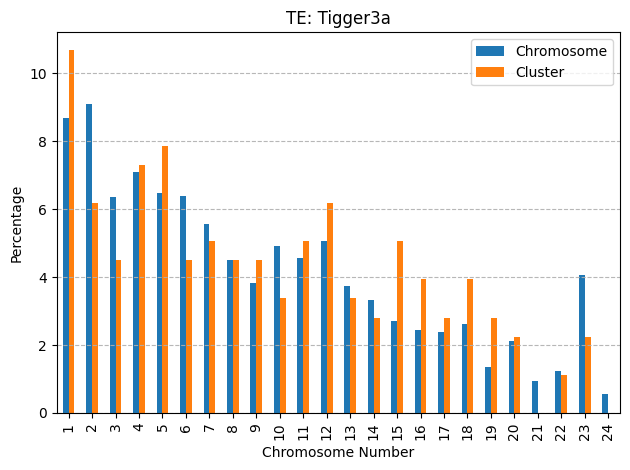

[ 1  2  7  8  9 10 11 13 16 18 19]
[ 2  8  9 10 11 13 16]
[]
[2]
[2]
[2]


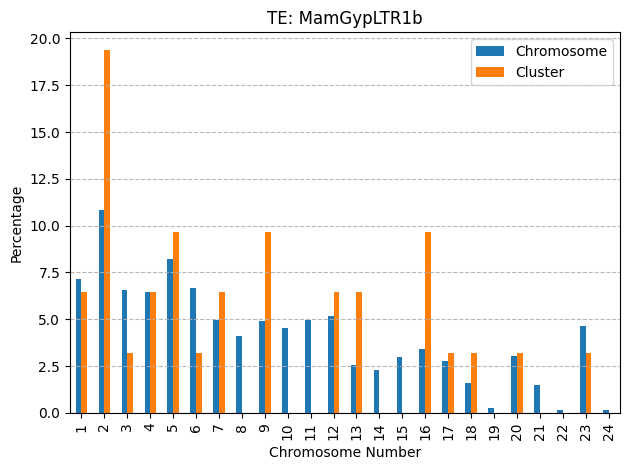

[ 1  2  3  4  5  6  7  8 11 13 19 21 24]
[ 1  2  3  5  6  7 19]
[]
[]
[]
[]


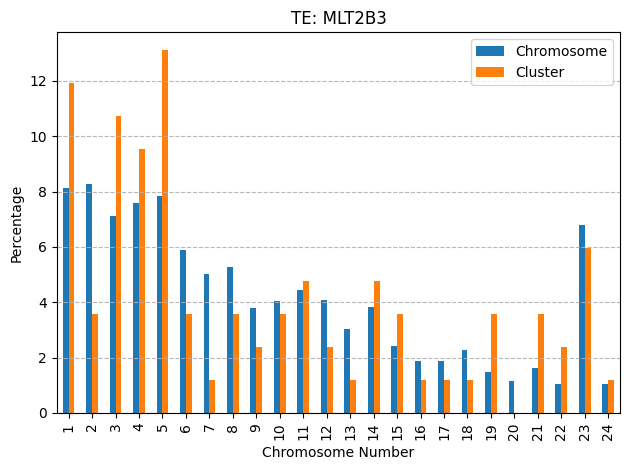

[ 1  2  3  4  8 10 13 14 16 17 19 24]
[ 2  8 16 17 19]
[16 17 19]
[17]
[ 2 16 17 19]
[ 2 16 17 19]


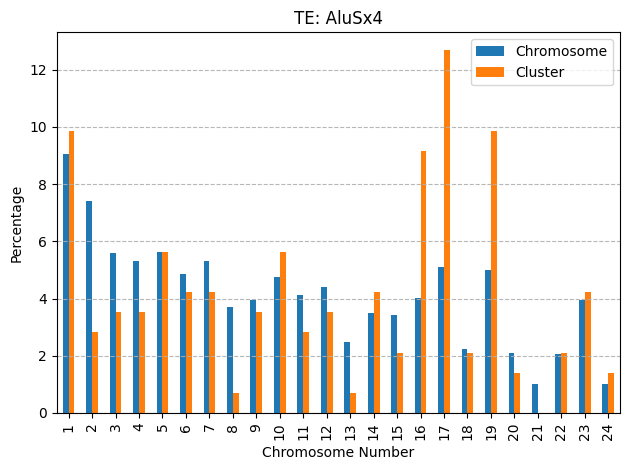

[ 1  2  3  4  5  8 10 11 12 13 15 16 19 20]
[ 2  4  5  8 11 13 16]
[16]
[16]
[16]
[16]


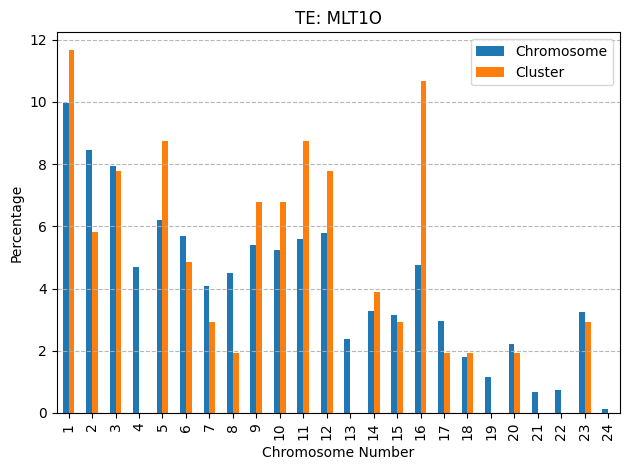

[ 2  3  5  6  9 12 13 16 19 22 23 24]
[ 3  4  6  9 12 13 16 19 21 23]
[]
[]
[]
[]


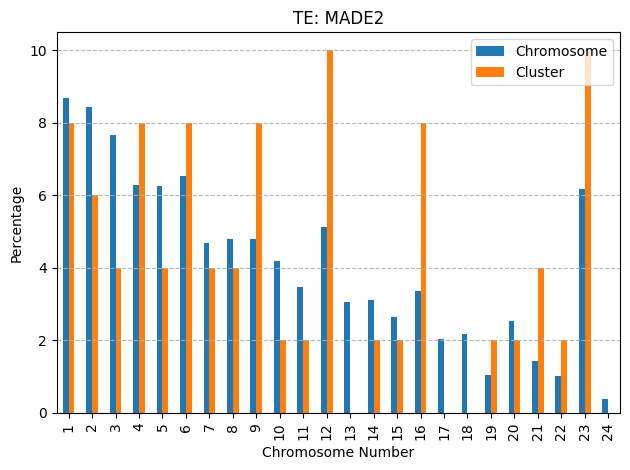

[ 1  2  5  6  7  8 10 11 13 15 20]
[ 1  2  5  6  7  8 11]
[]
[]
[]
[]


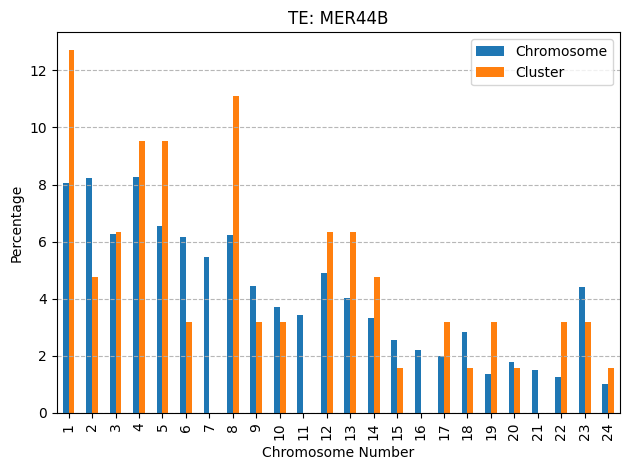

[ 1  2  5 10 13 15 16 19 20 21 23]
[ 1  2  5 10 13 15 16 19 21 23 24]
[ 2 13]
[]
[ 2 13]
[ 2 13]


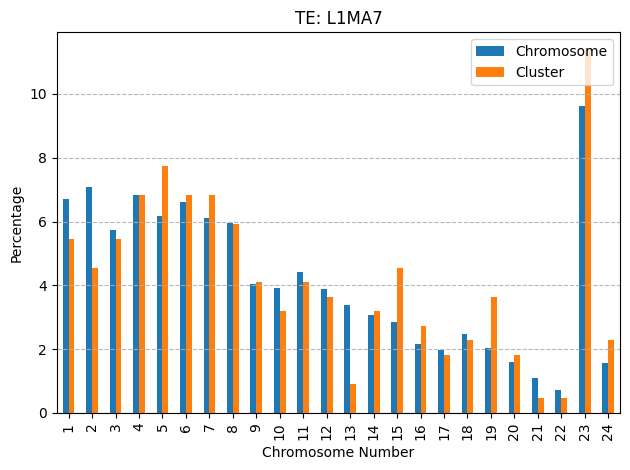

[ 1  2  5  6 11 13 16 17 18 19 21 22]
[ 1  2  5 11 12 17 19]
[19]
[19]
[19]
[19]


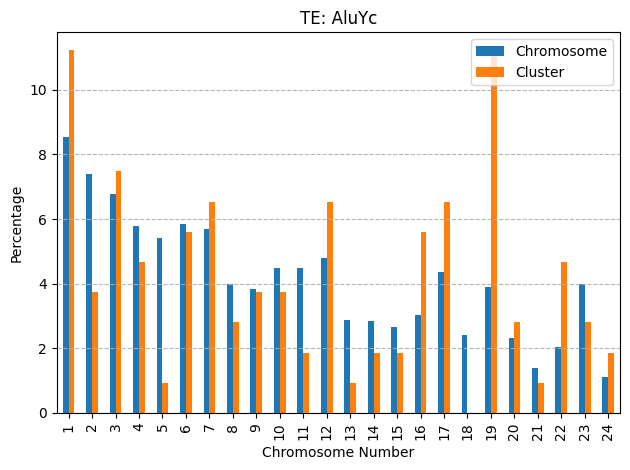

[ 1  2  4  5  7  8  9 10 13 15 18 20 23]
[ 1  2  6  7  9 10 15]
[]
[1]
[1]
[1]


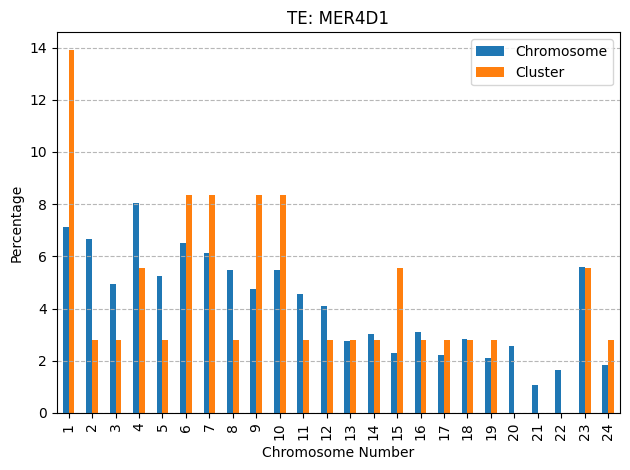

[ 1  2  3  4  5  8 10 12 18 19 21 22]
[ 2  3  4  5  7  8 12 21]
[2]
[2]
[2 3 8]
[2 3 8]


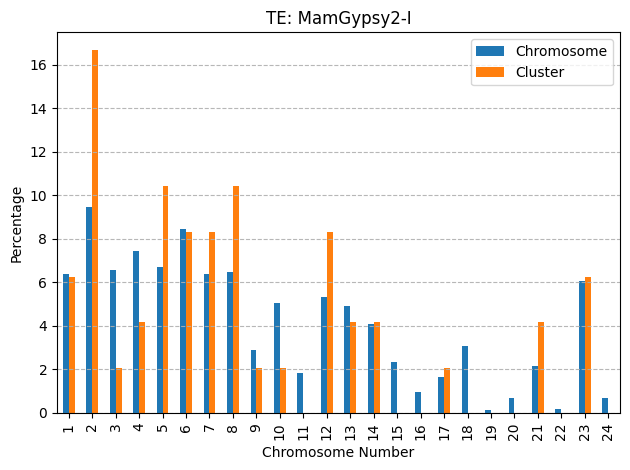

[ 1  3  6  8  9 12 13 14 16 22 23 24]
[ 3  5  6  8  9 12 14]
[]
[12]
[]
[12]


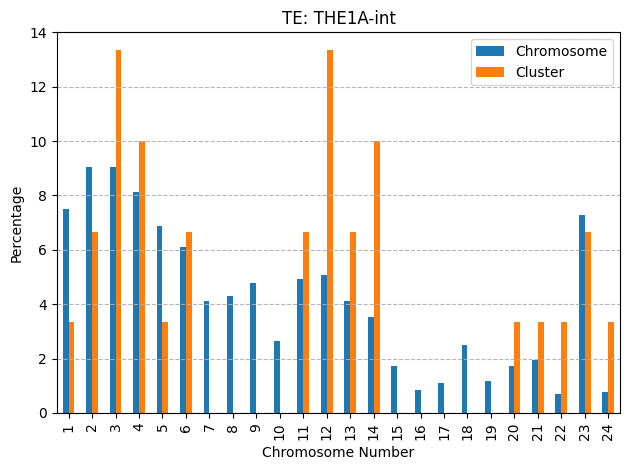

[ 1  4  5  7  9 12 13 15 18 19 21 23]
[ 4  5  9 12 13 15 17 20 23]
[]
[]
[]
[]


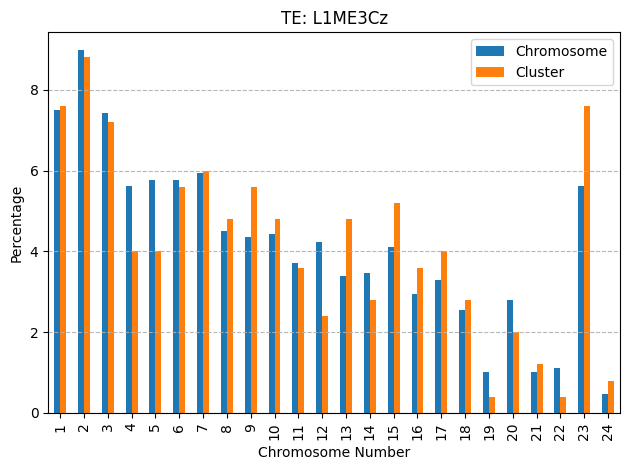

[ 2  4  5  6  8 10 11 12 16 17 19 21 22]
[ 2  5  8 13 16 17 19]
[]
[19]
[19]
[19]


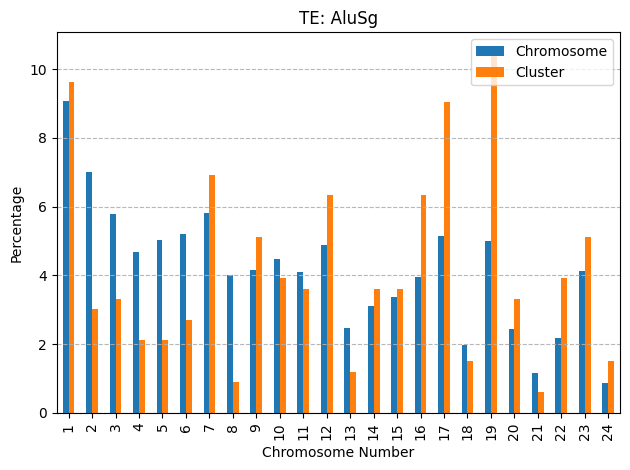

[ 1  3  4  6  7 10 11 13 15 19 22 23]
[ 1  4  7 10 19]
[]
[ 1 19]
[19]
[ 1 19]


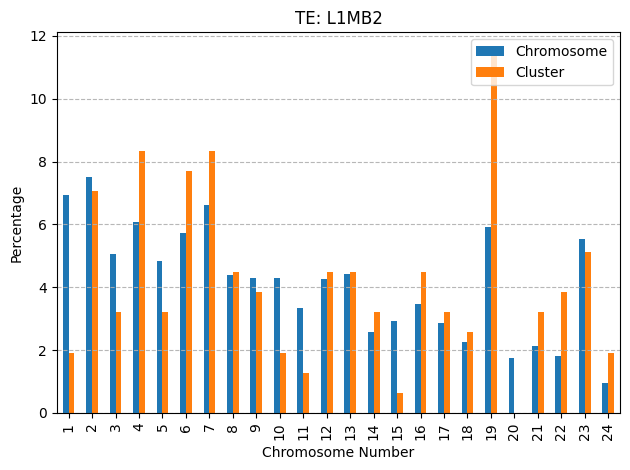

[ 1  4  9 10 11 13 17 19 20 22 23 24]
[ 1  4  9 13 18 19 20 22 23 24]
[]
[]
[]
[]


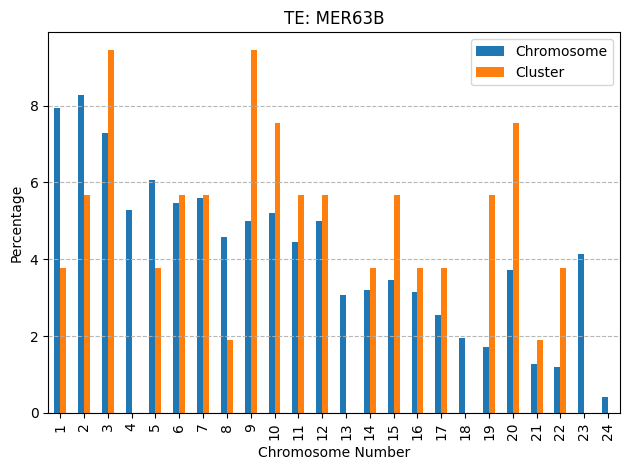

[ 2  4  5  7  8 10 11 12 16 20 21 24]
[ 2  7 10 12 16 21]
[]
[]
[]
[]


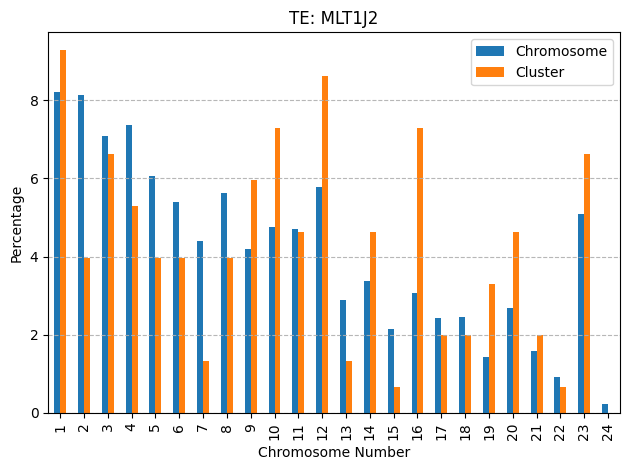

[ 1  3  4  6  7  8 10 13 16 19 20 23]
[ 1  3 10 13 20 23]
[ 1  3 23]
[1]
[ 1  3 10 23]
[ 1  3 10 23]


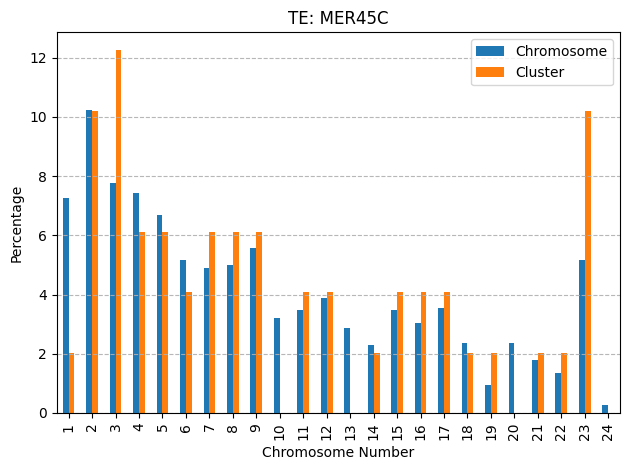

[ 1  3  6  7 11 13 14 17 18 19 22]
[ 1  3  4  6  7 11 13 14 19]
[]
[]
[]
[]


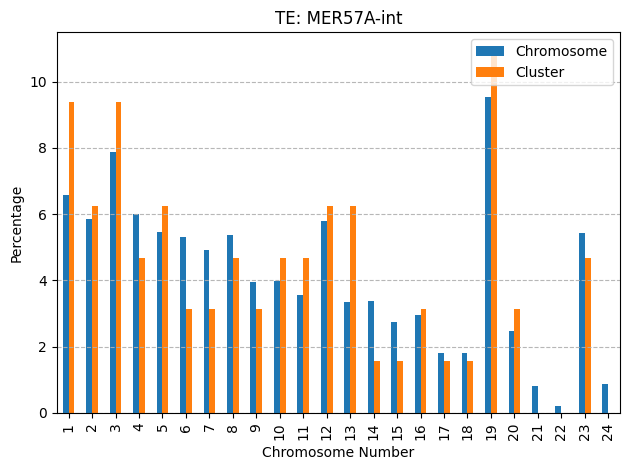

[ 1  2  3  4  8 11 12 13 17 22 23 24]
[ 1  2  3  4  9 12 13 22 23]
[]
[4]
[ 4 23]
[ 4 23]


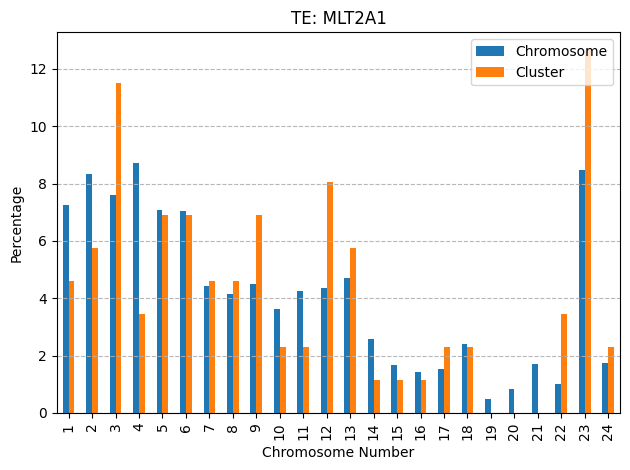

[ 2  3  5  8 12 16 18 19 21 23 24]
[ 2  3  5 12 16 19]
[]
[]
[]
[]


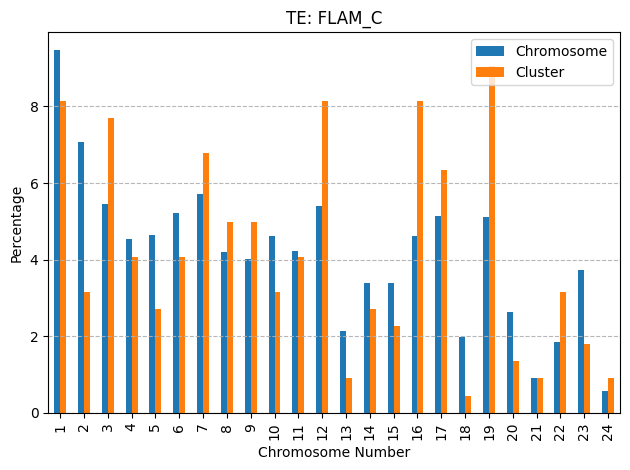

[ 1  2  3  4  5  7  8  9 11 18 19 21 22 23 24]
[ 2  3  5  7  9 14 19 24]
[]
[]
[]
[]


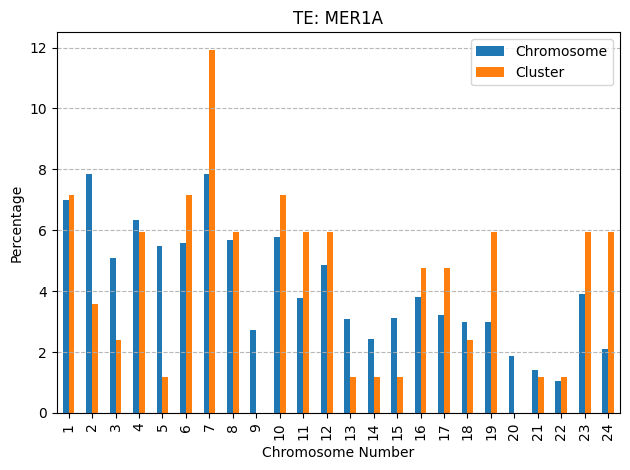

[ 2  4  6  7 10 13 16 17 18 19 22 23 24]
[ 2 16 19 22]
[19]
[19]
[19]
[19]


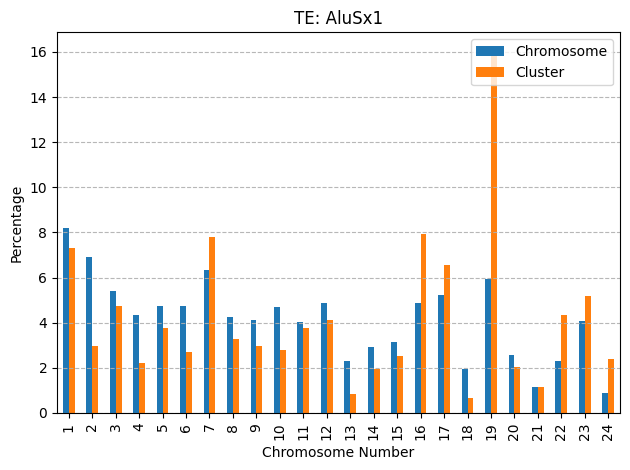

[ 1  2  3  5  6  8  9 13 15 17 19]
[ 1  2  8  9 13 17]
[]
[]
[]
[]


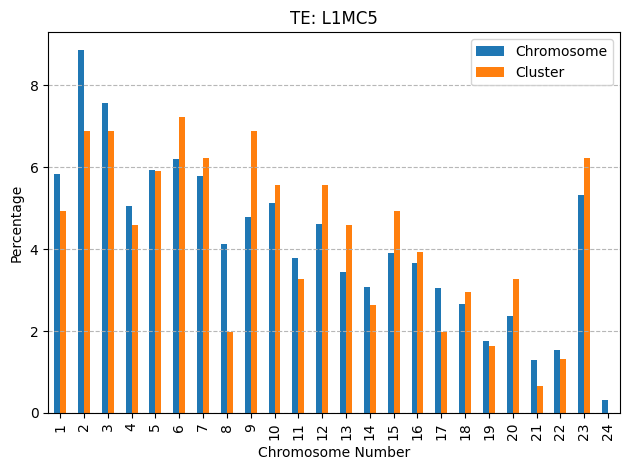

[ 3  4  5 10 11 12 16 17 19 23 24]
[ 5 10 17 19 20 23]
[]
[]
[]
[]


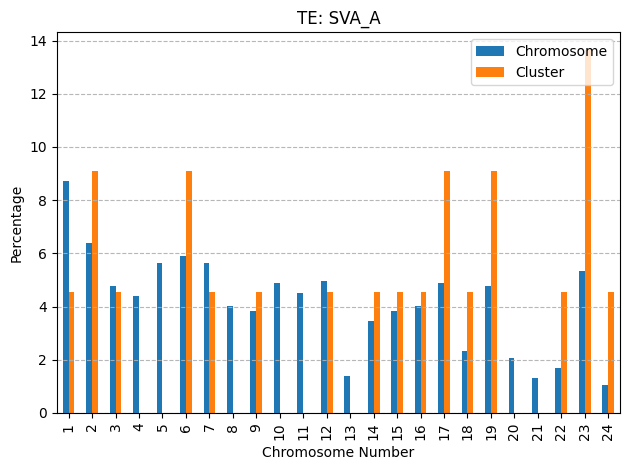

[ 1  4  5  8  9 10 14 16 19 21 23]
[ 4  6  9 10 11 14 16 17 19 20 22 23]
[]
[]
[]
[]


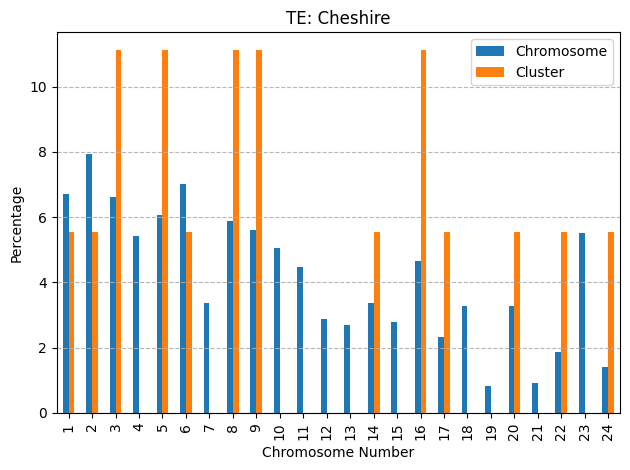

[ 1  2  3  4  5  6  8  9 14 19 22 23]
[ 1  5  6  8 19 22 23]
[ 8 19]
[19]
[19]
[ 8 19]


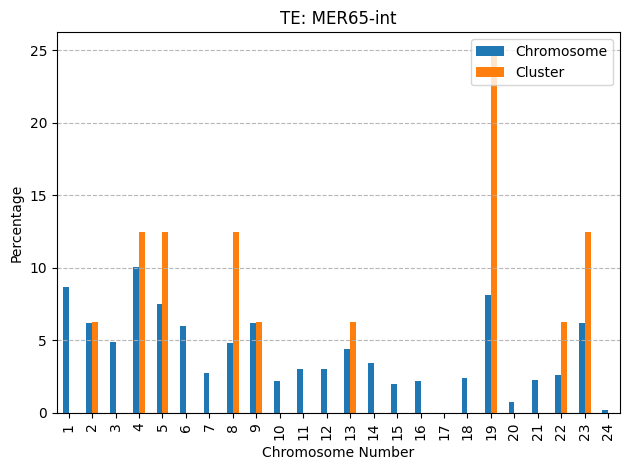

[ 6  7  9 10 11 13 14 16 17 18 19 20 24]
[ 7  9 11 13 16 19 24]
[]
[19]
[19]
[19]


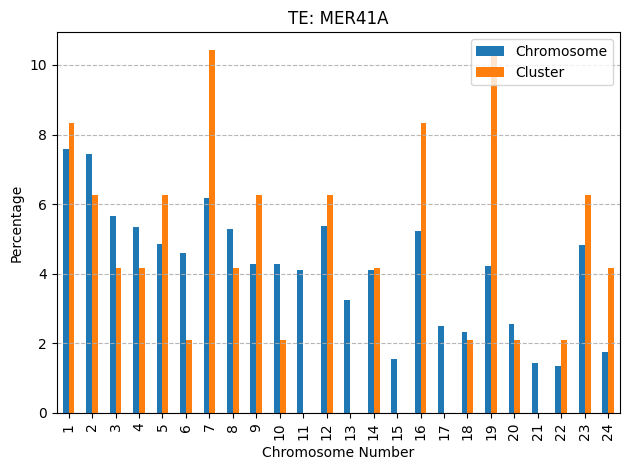

[ 2  3  5  6  7  9 10 11 12 19 20 21 22]
[ 1  2  3  5  8 10 22 23]
[]
[]
[]
[]


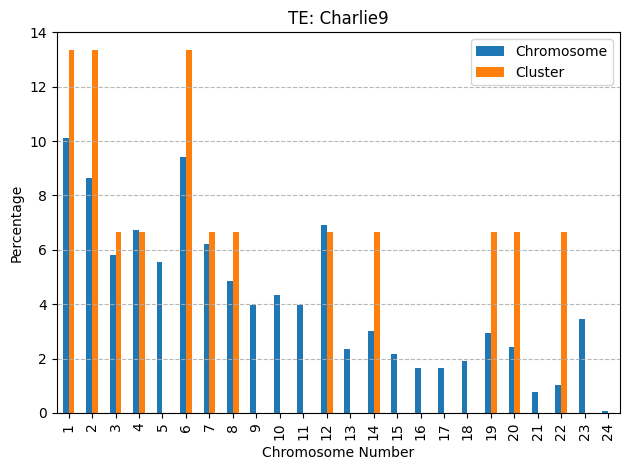

[ 2  3  4  6  8  9 11 13 17 18 20]
[ 1  3  4  6  9 11 13 17 20]
[]
[4]
[3 4]
[3 4]


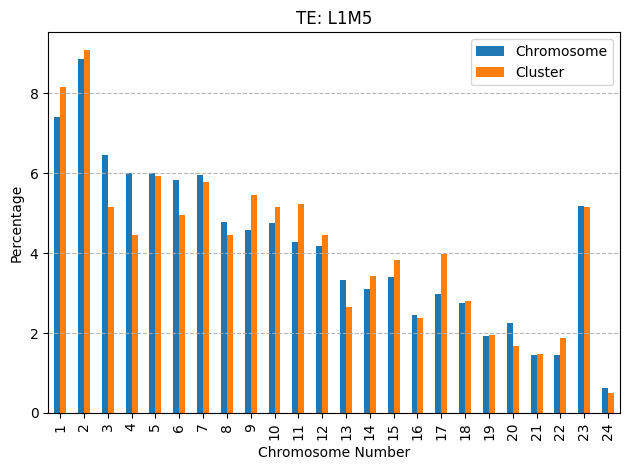

[ 1  2  3  6  7 10 11 13 16 17 20 22]
[ 1  3  6  9 13 16 22]
[]
[13]
[13]
[13]


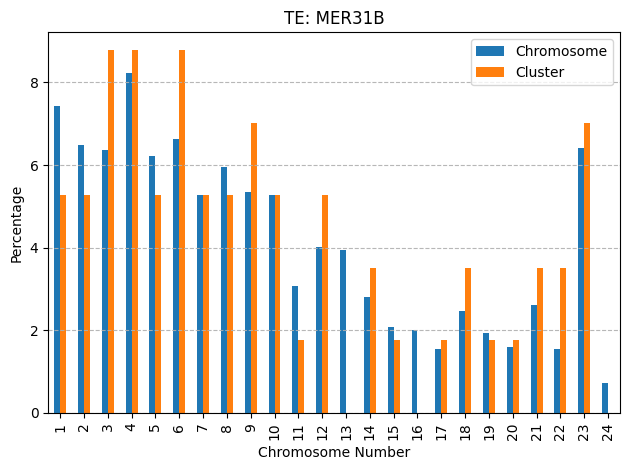

[ 1  5  7  8 10 11 12 13 15 17 18 21 23]
[ 2  5  7  8 10 11 12 15]
[]
[5]
[5]
[5]


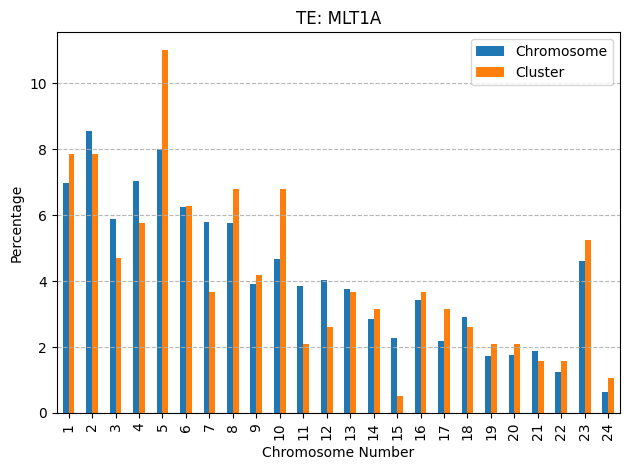

[ 2  4  5  6  9 10 12 13 14 18 22 23 24]
[ 2  5  6 23]
[23]
[23]
[23]
[23]


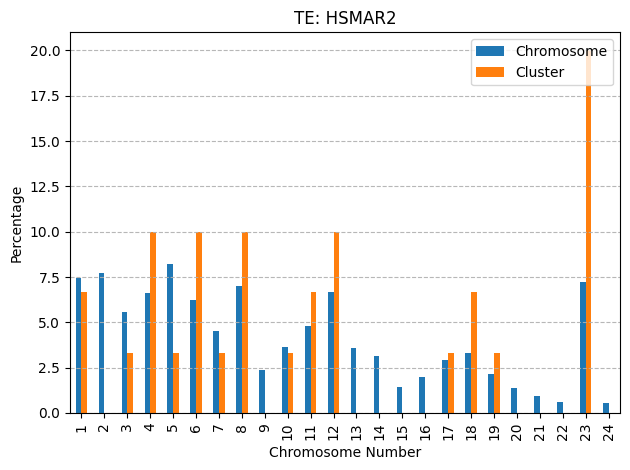

[ 2  3  4  6  8  9 12 15 16 17 19 20 23]
[ 2  4  6  9 12 16 19]
[]
[]
[]
[]


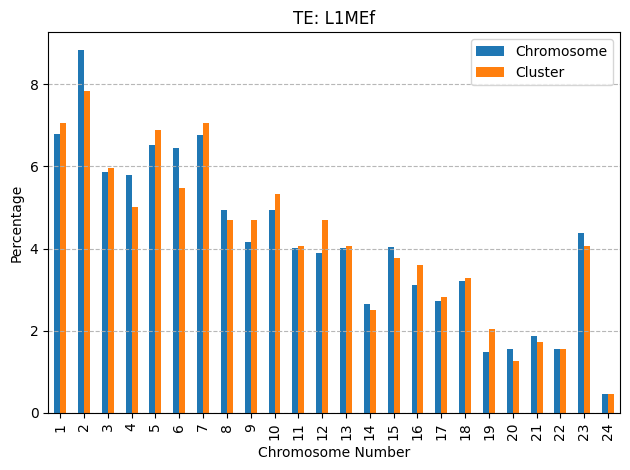

[ 1  2  3  4  8 12 15 16 18 21 22]
[ 2  4 16 21]
[]
[16]
[16]
[16]


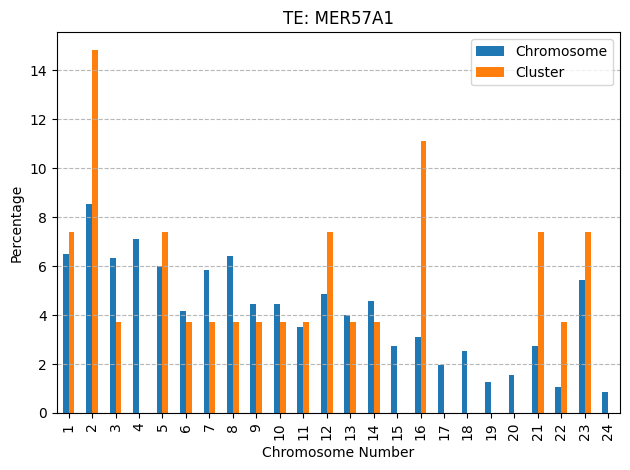

[ 1  2  3  4  5  6  8 12 15 16 20 21 23 24]
[ 1  3  4  5 12 15 16 20 22]
[16]
[12 16]
[12 16]
[12 16]


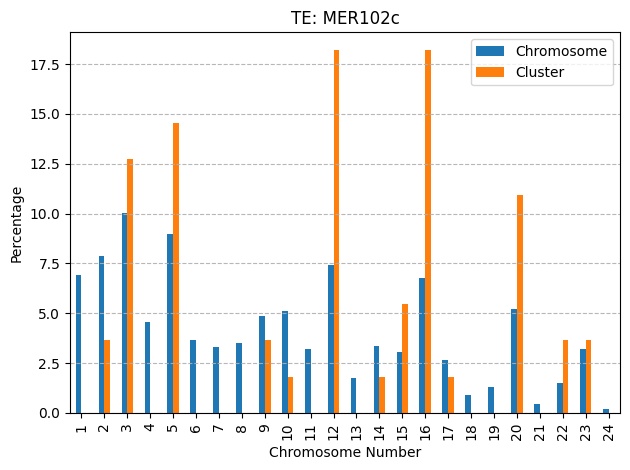

[ 2  5  6  7 10 17 18 21 22 23]
[ 2  5  7 10 17 22 23]
[]
[]
[]
[]


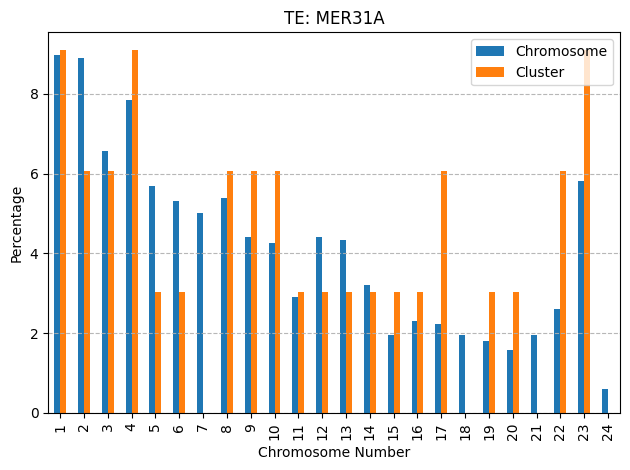

[ 2  3  5  6 11 12 14 15 17 18 19 21]
[ 2  3  4  5  9 10 11 13 15 17 18]
[]
[]
[]
[]


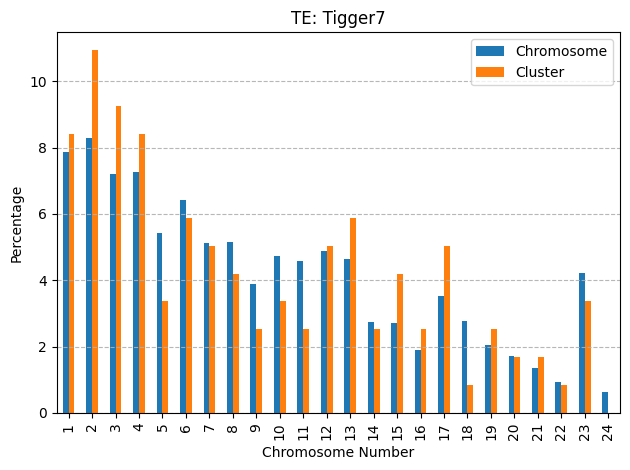

[ 3  4  5  6 14 15 16 18 20 23]
[ 3  4  6  7  9 15 16 20 21 23]
[]
[23]
[23]
[23]


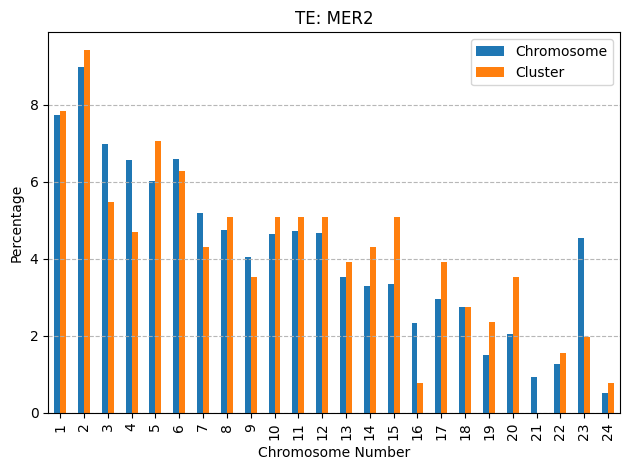

[ 1  4  9 10 11 12 16 19 20 21 22 23 24]
[ 1  2  4 12 16 18 19 20 23]
[]
[20]
[20]
[20]


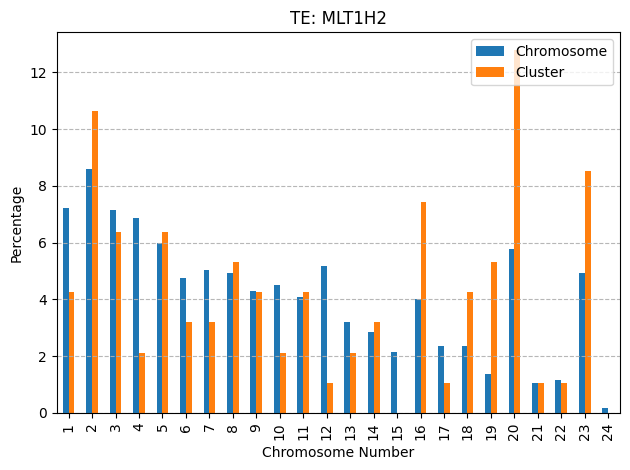

[ 1  4  7  8 10 11 13 14 16 18 21 23 24]
[ 7 13 16 23 24]
[23]
[23]
[23]
[23]


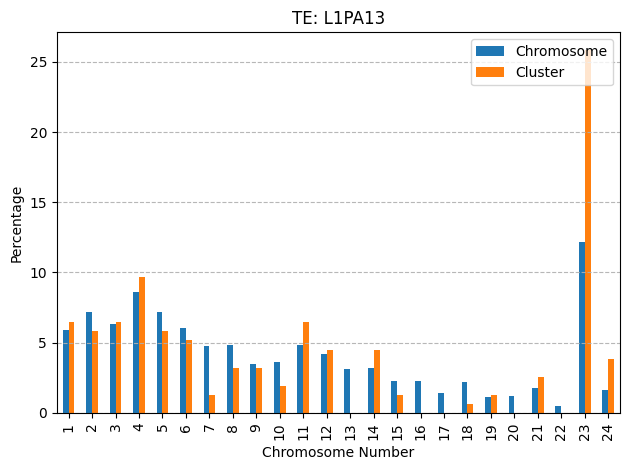

[ 2  4  5  6 10 11 12 13 14 19 23 24]
[ 2  4 10 11 13 19]
[13]
[13]
[ 2 13]
[ 2 13]


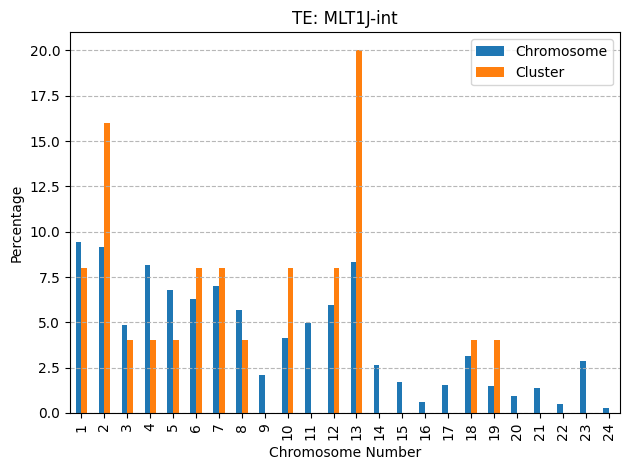

[ 1  5  8  9 11 14 16 20 21 22 23 24]
[ 1  5  8 11 14 16 20]
[]
[8]
[]
[8]


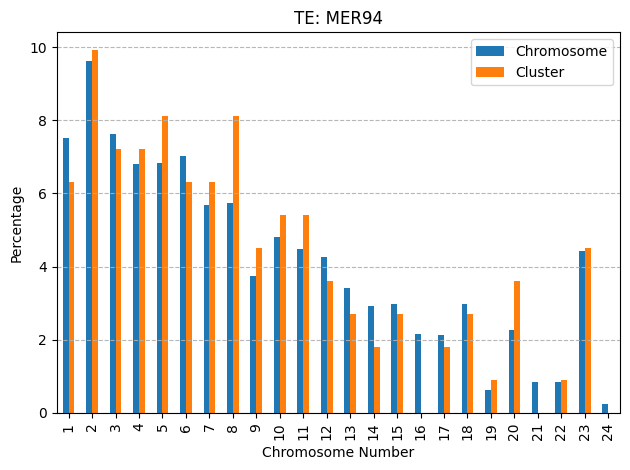

[ 2  3  5  6  7 10 12 13 14 16 18 19 20]
[ 2  3  7 10 12 16 20]
[]
[]
[ 3 20]
[ 3 20]


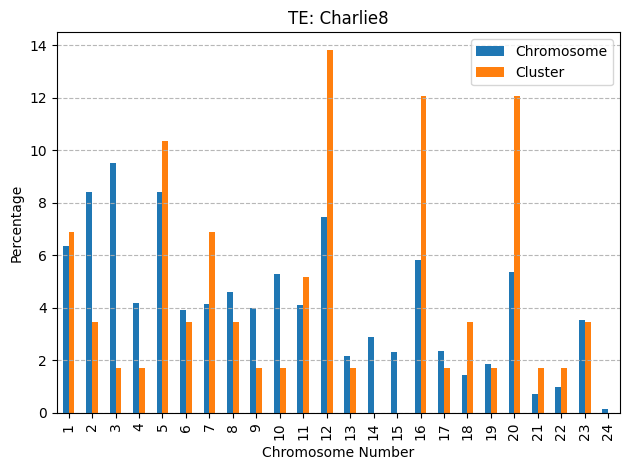

[ 1  5  8  9 10 11 15 16 17 19 23 24]
[ 1  4  9 10 15 17 19 23]
[]
[]
[]
[]


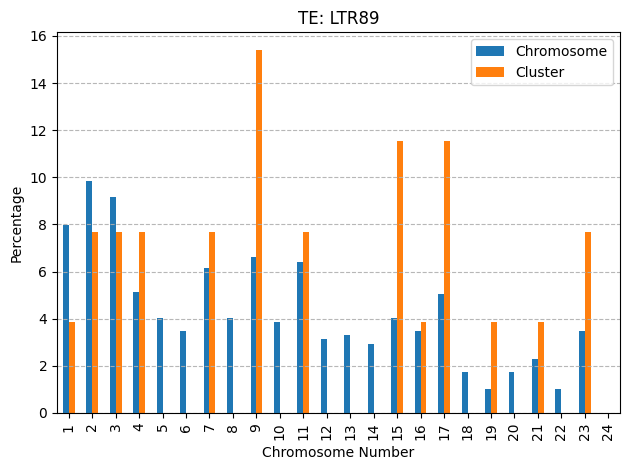

[ 1  2  3  6  7 11 12 14 15 18 20 23]
[ 1  2  3  6  7 11 14]
[1]
[1]
[1]
[1]


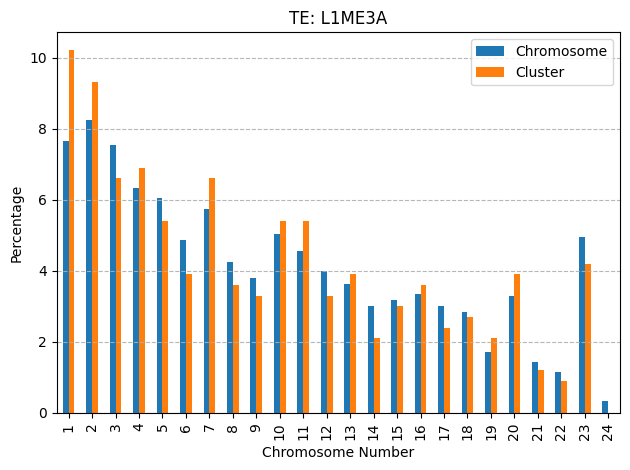

[ 1  3  4  5  6  9 11 15 18 20 23 24]
[ 3  4 11 18]
[]
[11]
[]
[11]


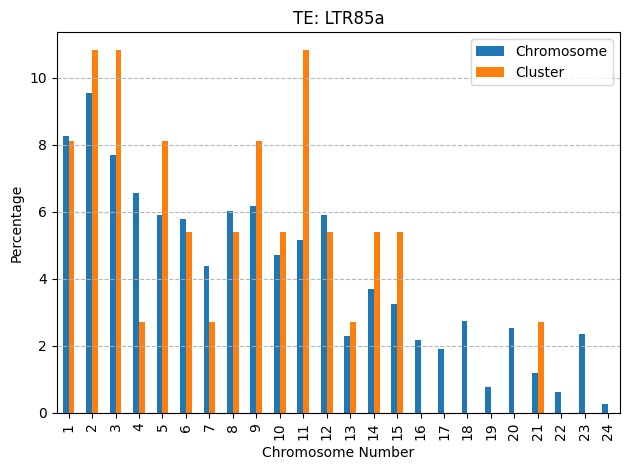

[ 3  4  5  8 10 11 13 15 17 18 22]
[ 3  4  5  9 10 11 17 18]
[]
[]
[ 3  4 10 17]
[ 3  4 10 17]


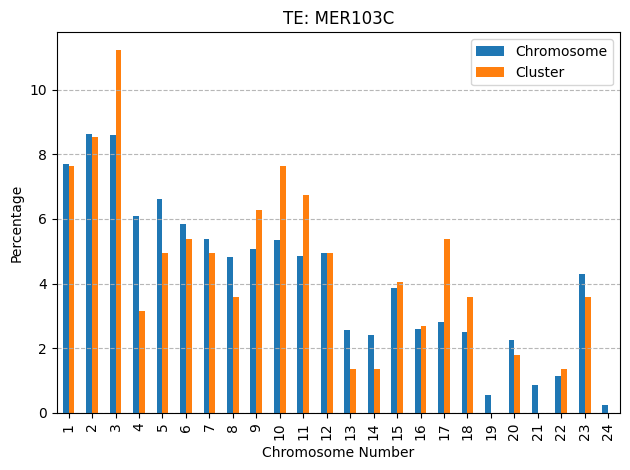

[ 2  5  6  7  8  9 17 18 19 20 21 22 23]
[ 2  5  6  8 17 20]
[20]
[20]
[ 2 20]
[ 2 20]


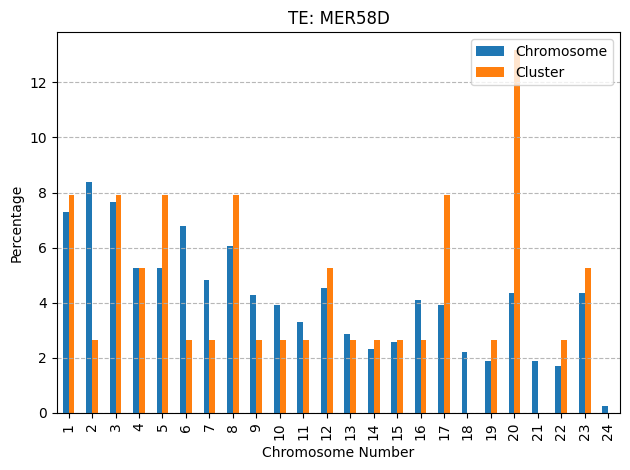

[ 2  6  7  9 11 12 13 14 15 19 23 24]
[ 2  6  9 12 13 14 19 23]
[19]
[19]
[ 2 19]
[ 2 19]


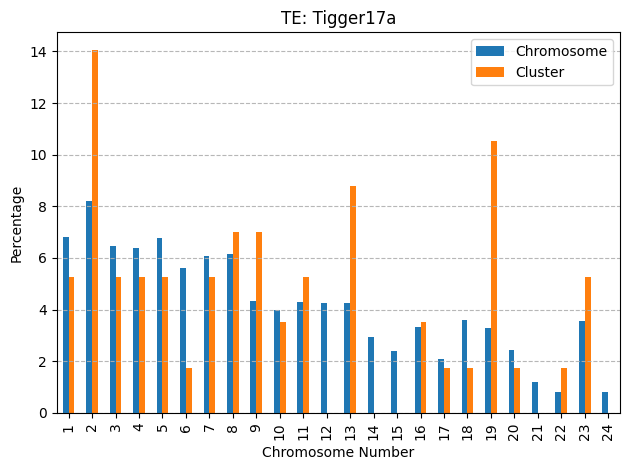

[ 2  3  5  6  7  9 11 12 13 23]
[ 2  3  5  6  7  9 11 23]
[]
[]
[]
[]


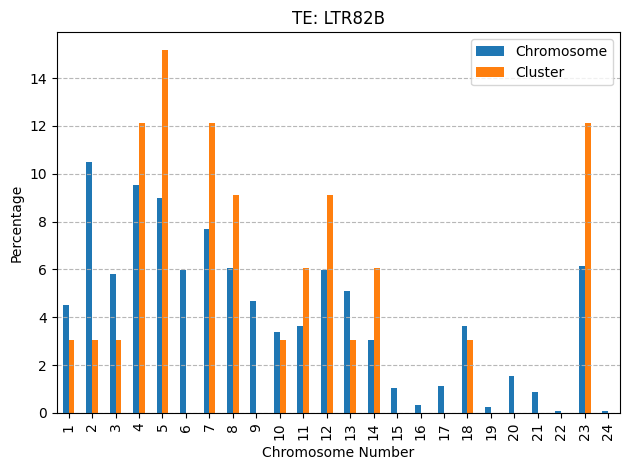

[ 2  4  6  9 12 16 19 20 22 23 24]
[ 2  6  9 11 20 22]
[]
[22]
[]
[22]


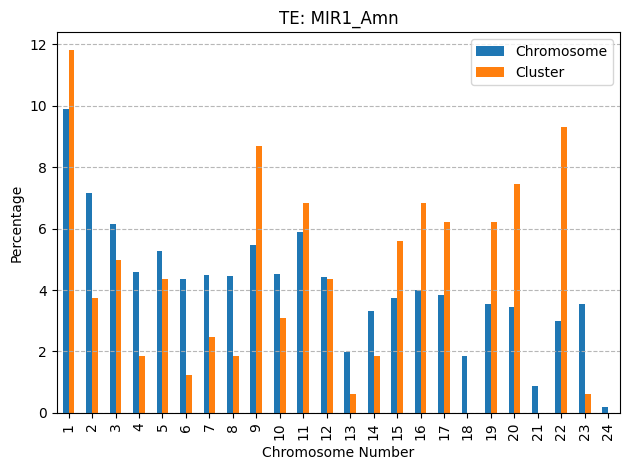

[ 1  3  5  8  9 10 11 14 16 19 20 24]
[ 3  5  8  9 10 14 19]
[]
[]
[]
[]


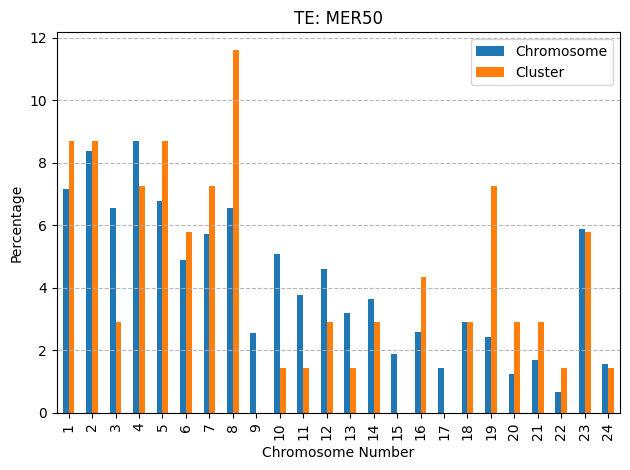

[ 1  2  4  5  6  9 10 12 14 17 19 20 23]
[ 2  5 10 17 23]
[5]
[5]
[ 2  5 23]
[ 2  5 23]


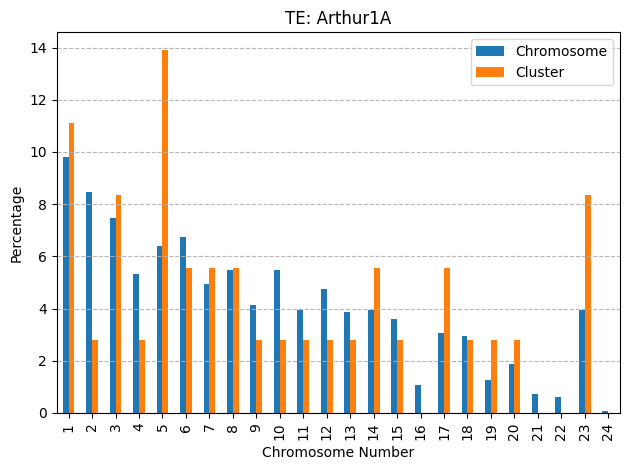

[ 3  5  6  7  8  9 14 15 17 18 22]
[ 5  8 15 22]
[]
[]
[]
[]


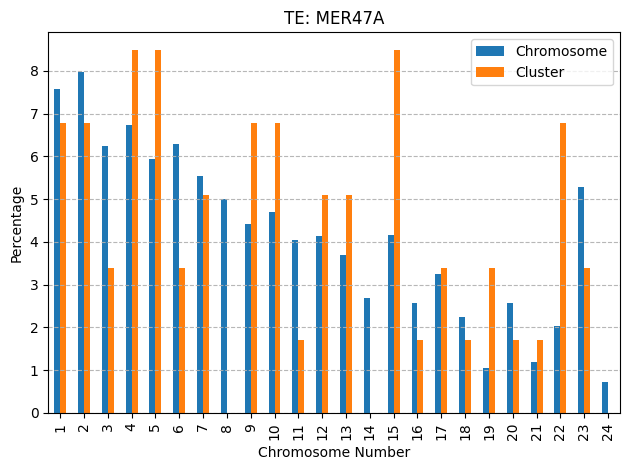

[ 1  2  3  4  5  7  8 11 15 16 17 18 19 21 23]
[ 1  2  3  4  5  7 14 16 20 23]
[2 4 5 7]
[]
[ 1  2  4  5  7 23]
[ 1  2  4  5  7 23]


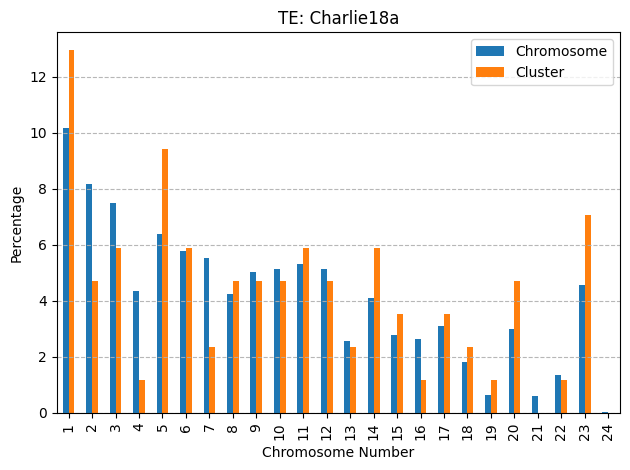

[ 1  2  5  6  7  9 11 14 15 17 20 23 24]
[ 1  2  5  6 11 14 15 17 23]
[1]
[1]
[1]
[1]


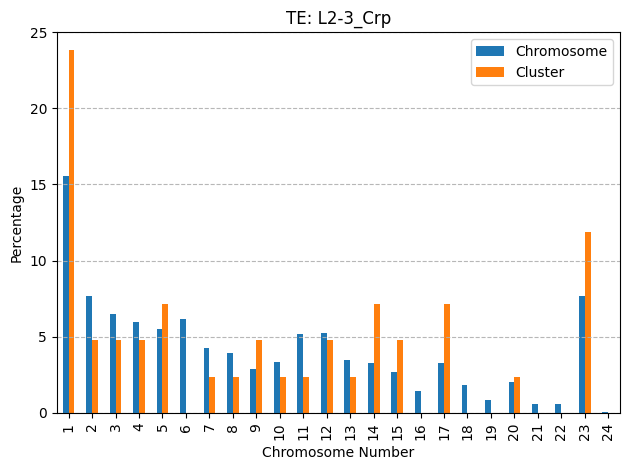

[ 1  2  3  4  5  6  9 10 11 12 14 18 23]
[ 1  3  6  9 14]
[6 9]
[9]
[1 6 9]
[1 6 9]


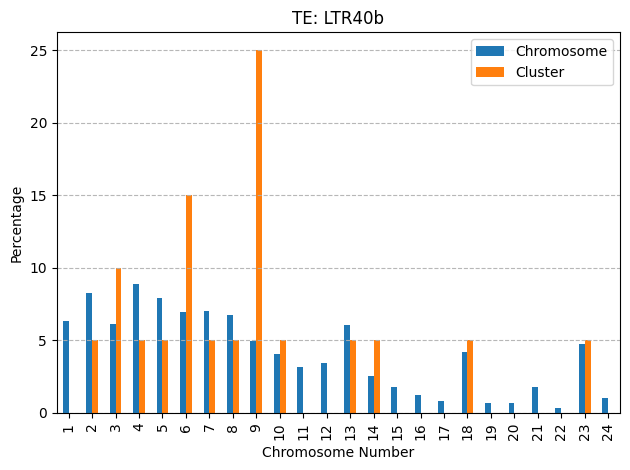

[ 2  4  5  6 11 17 19 21 22 23 24]
[ 2  4  5  6 11 19 23 24]
[]
[23]
[]
[23]


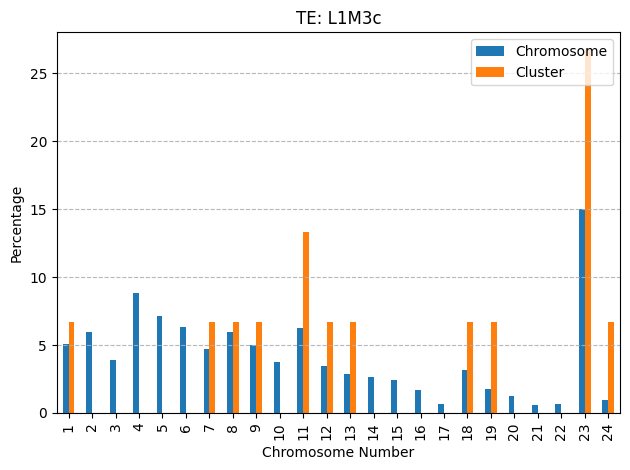

[ 1  2  3  6  7  9 10 12 14 15 18 23 24]
[ 3  6  7  9 10 11 18]
[9]
[9]
[9]
[9]


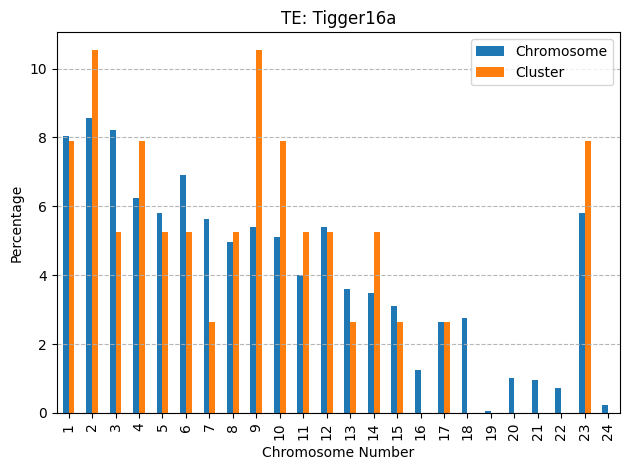

[ 4  5  6  7 11 12 14 18 19 22 23 24]
[ 3  4  5  7 11 12 18 23]
[]
[]
[18 23]
[18 23]


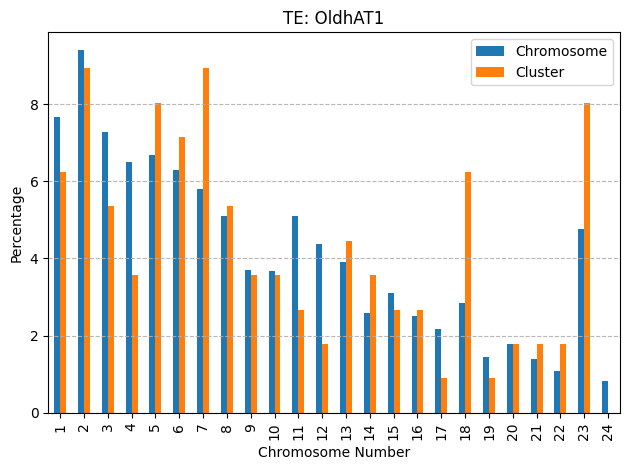

[ 1  2  6  7  8  9 11 13 17 18 19 23]
[ 1  2  6  9 23]
[23]
[23]
[23]
[23]


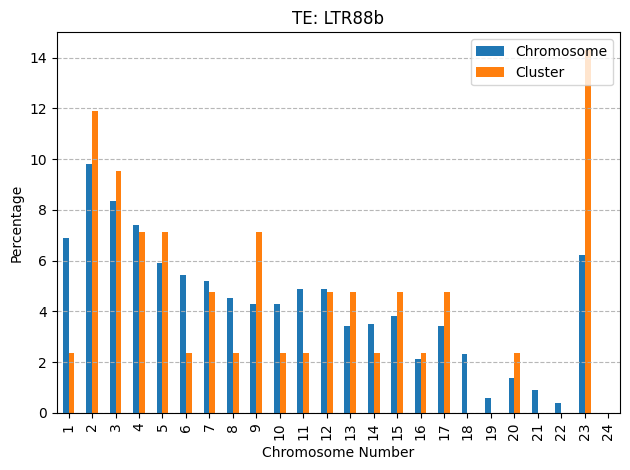

[ 3  6  8  9 10 12 14 15 17 23]
[ 6  8  9 10 12 17 23]
[]
[12]
[12]
[12]


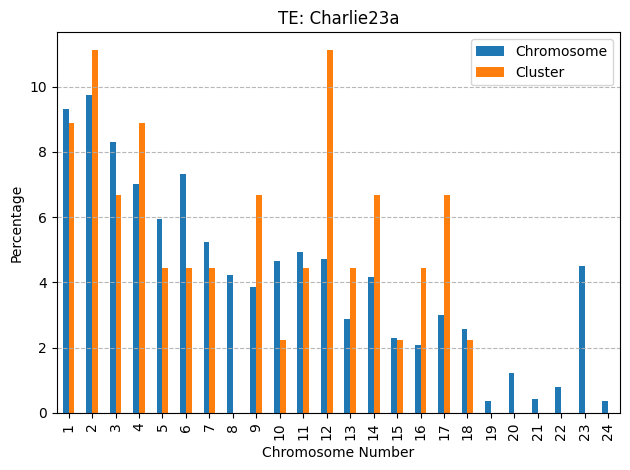

[ 2  4  6  7  9 11 13 14 17 19 21 23 24]
[ 2  4  6  7 13 16 19 21 23]
[23]
[]
[]
[23]


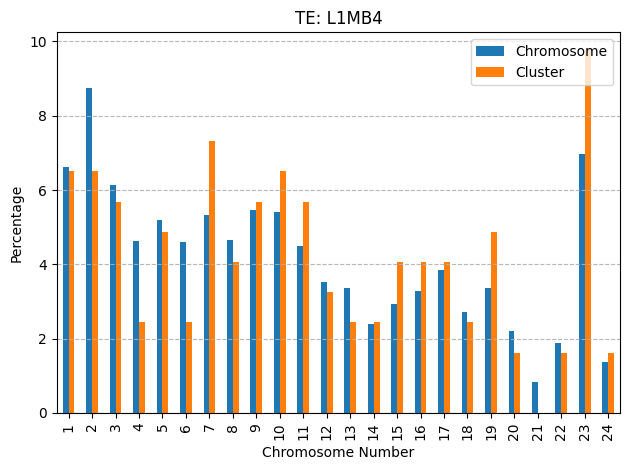

[ 1  2  5  8 12 15 16 17 18 19 21 22]
[ 1  2  4  5 16 19 21]
[]
[19]
[]
[19]


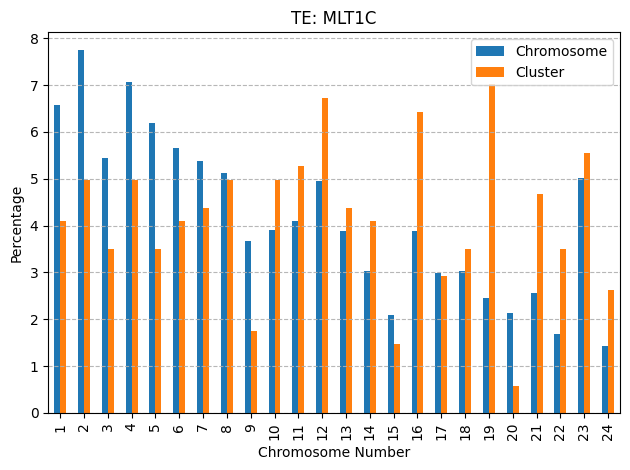

[ 1  2  3  4  5  6  9 10 12 15 17 22 24]
[ 1  2  5  6 10 12]
[2]
[2]
[2]
[2]


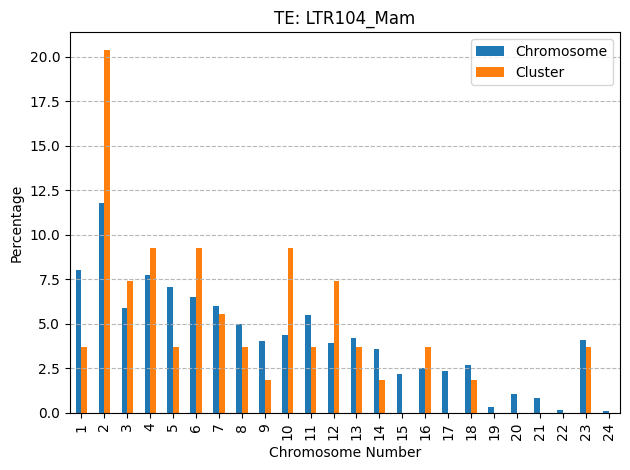

[ 1  2  3  6  8 10 12 15 17 20 24]
[ 2  3  6 10 15 20 23]
[10]
[10]
[10 15]
[10 15]


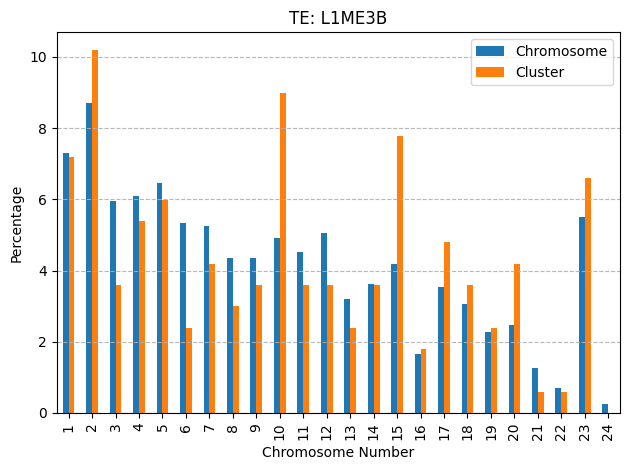

[ 1  7 12 14 15 17 19 20 22 24]
[ 1  3  7 11 12 14 15 17 20]
[]
[]
[]
[]


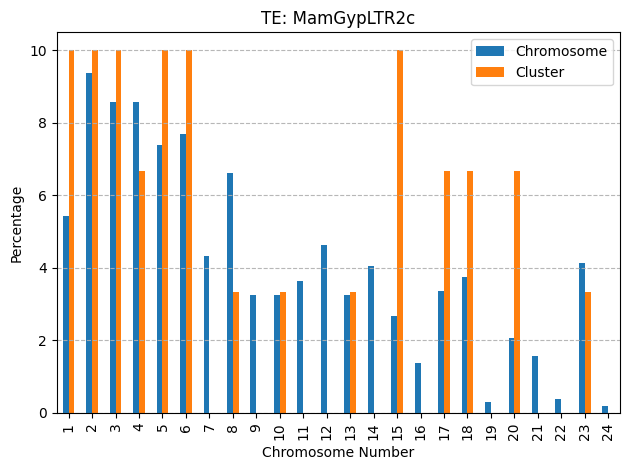

[ 2  3  5  7  8 10 11 14 15 16 18 19 20]
[ 2  5  8 10 16 17 19 21]
[]
[]
[]
[]


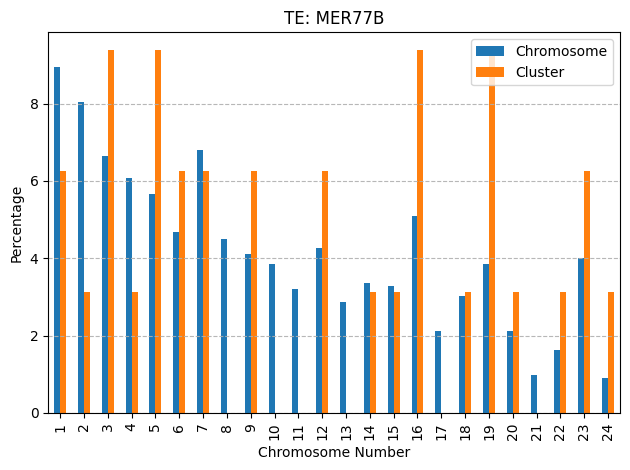

[ 1  2  4  5  6  7  9 13 14 17 19 20]
[ 1  4  5  9 13 15 17 18 20 22]
[]
[]
[]
[]


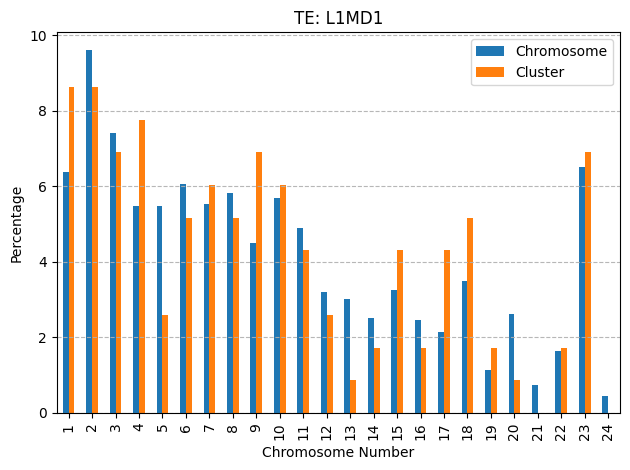

[ 2  3  5  9 12 14 15 19 22 23 24]
[ 2  3  9 19 20]
[]
[]
[]
[]


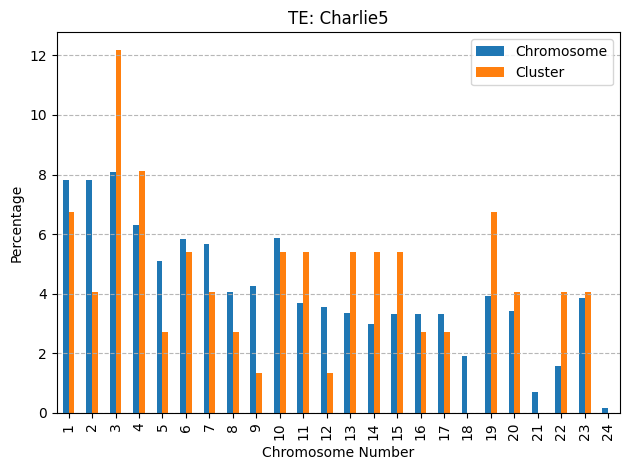

[ 6  8  9 10 12 13 16 17 20 21 22 23]
[ 4  6  8  9 10 12 13 16 20 23]
[]
[]
[]
[]


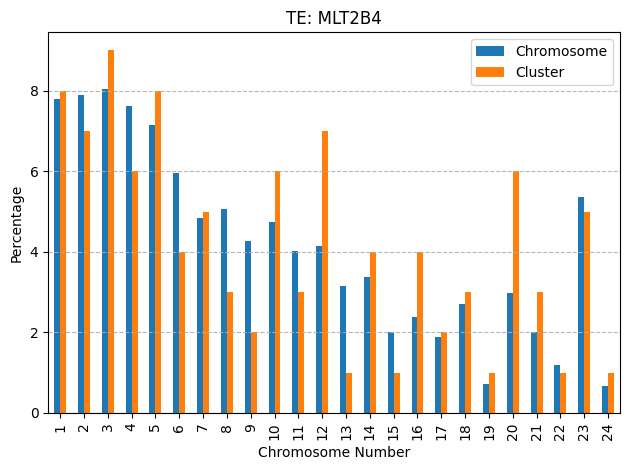

[ 3  4  5  7  9 10 12 14 16 21 22 23]
[ 3  4  7  8  9 10 12 14 23]
[]
[]
[14 23]
[14 23]


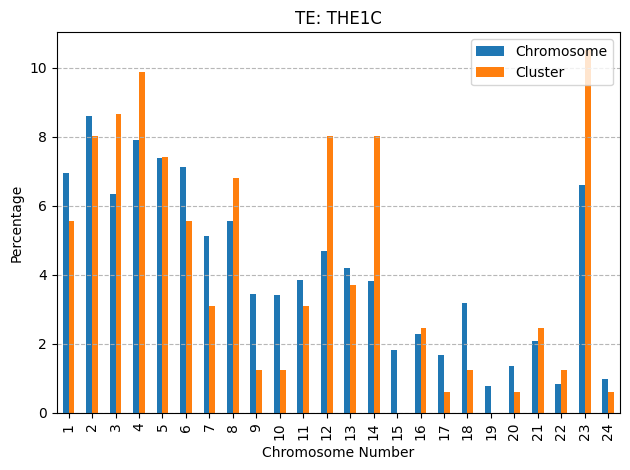

[ 4  6  7  8  9 11 14 16 17 19 22 24]
[ 4  7  8  9 11 16]
[9]
[9]
[4 9]
[4 9]


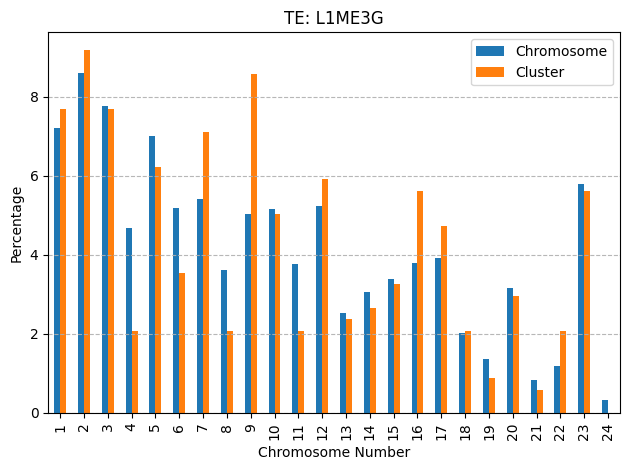

[ 2  5  6  7 10 11 16 17 18 19 20 21 22]
[ 2 10 16 17 19 21 22]
[]
[21]
[21]
[21]


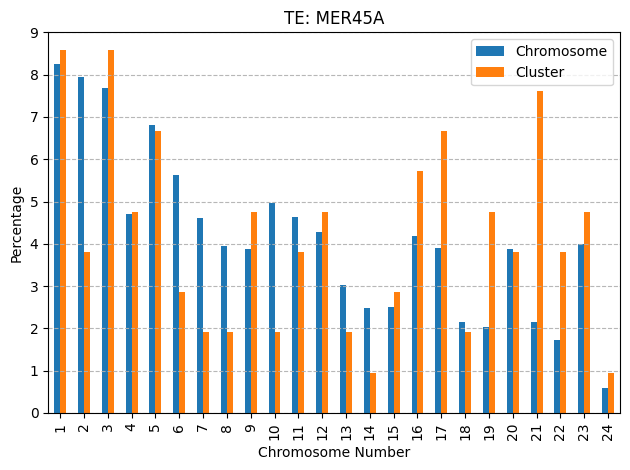

[ 1  2  4  5  6  9 11 12 13 19 20 21 24]
[ 1  2  4  5  6 11 12]
[]
[]
[]
[]


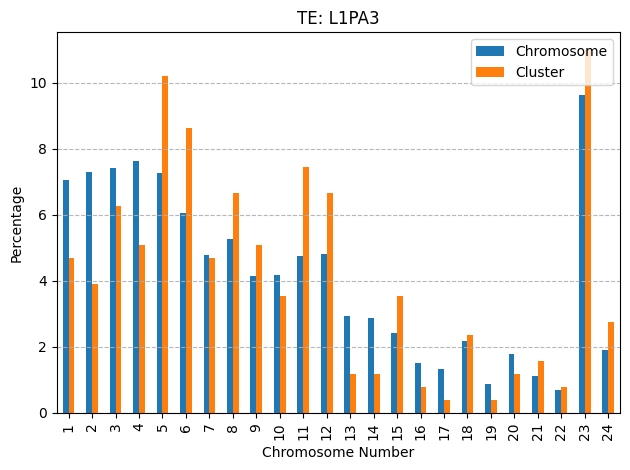

[ 1  2  4  5  6  7  9 10 12 13 18 23]
[ 1  2  5  6  9 15 17 18 23]
[]
[]
[]
[]


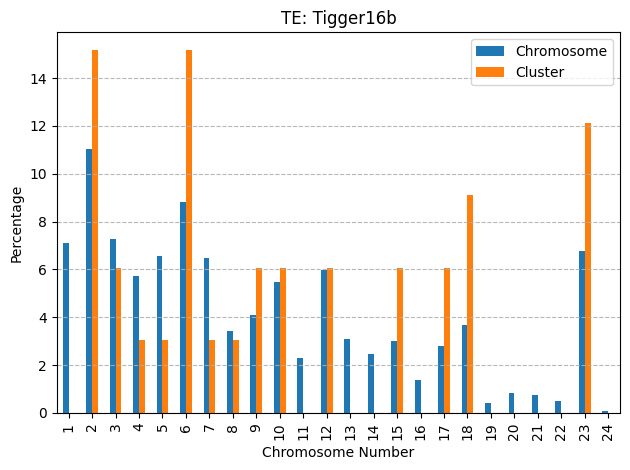

[ 1  2  5  6  7  8  9 11 16 18 23]
[ 1  2  5  8  9 11 23]
[5]
[5]
[ 2  5 11]
[ 2  5 11]


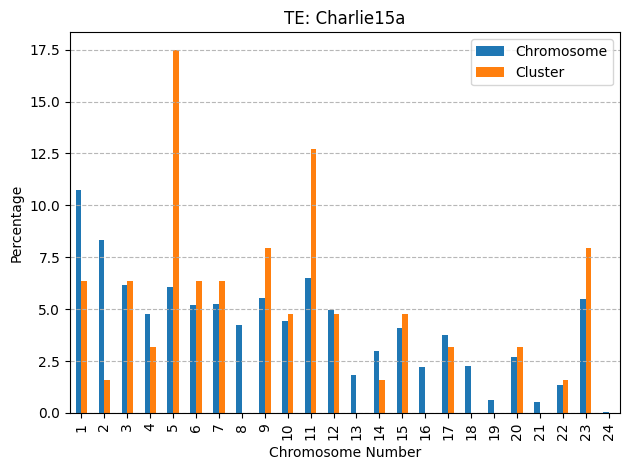

[ 1  2  5  6  7 12 13 18 19 23 24]
[ 1  6 13 18 19 23 24]
[19 23]
[19 23]
[19 23]
[19 23]


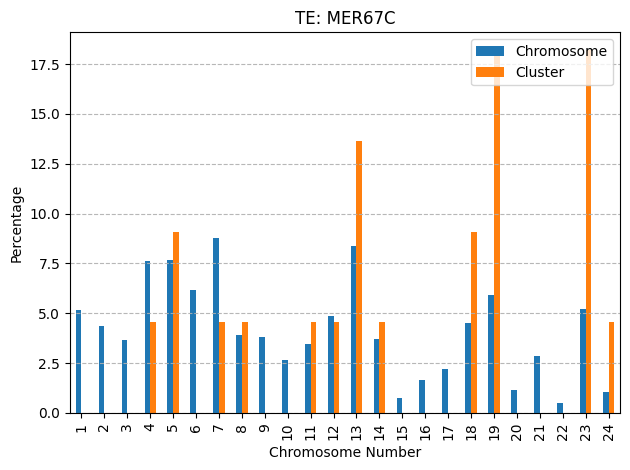

[ 1  2  4  5  7  8 10 11 12 14 15 17 22]
[ 1  4  5  7  8 10 11 17 20 22]
[ 7 11]
[]
[]
[ 7 11]


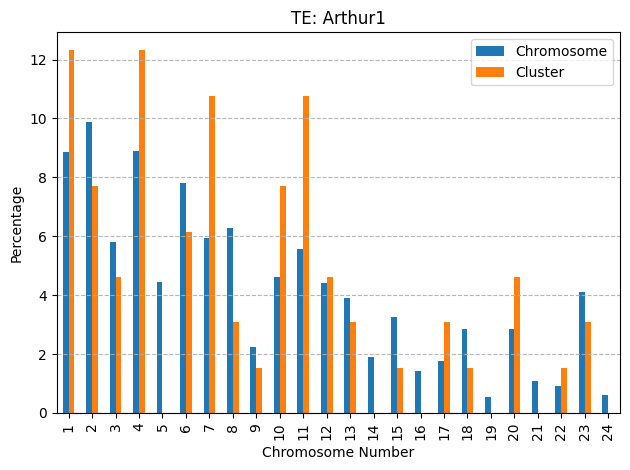

[ 1  2  3  4  7  8  9 16 17 19 23]
[ 2  3  4  7  8 16 17 18 23]
[]
[]
[17]
[17]


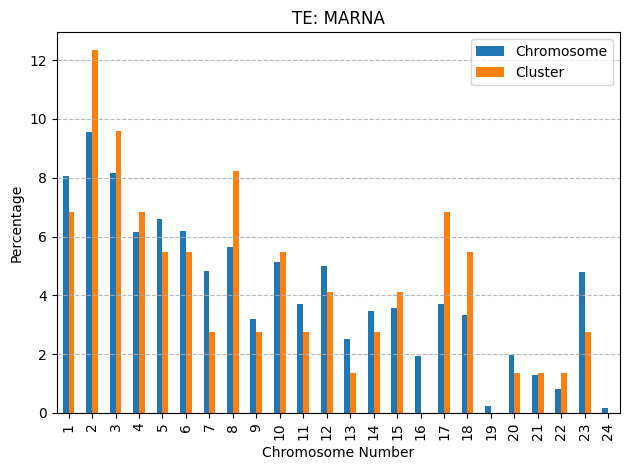

[ 1  2  5  8 12 14 15 16 17 20 22 23 24]
[ 1  5 21 22 23 24]
[]
[]
[]
[]


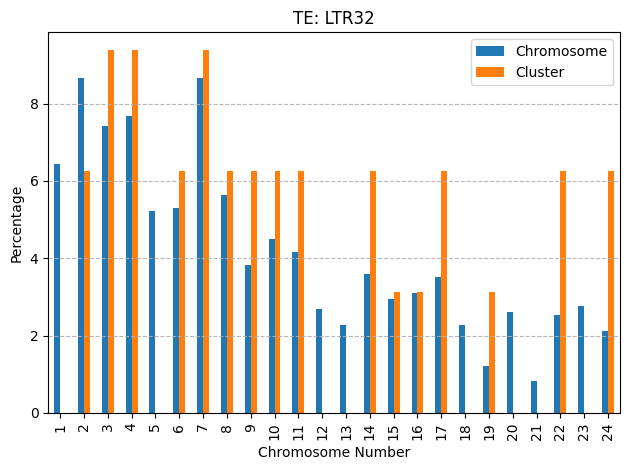

[ 1  4  5  7  8  9 10 12 15 16 22 23]
[ 1  4  5  7 10 12 15]
[1]
[1]
[1 4]
[1 4]


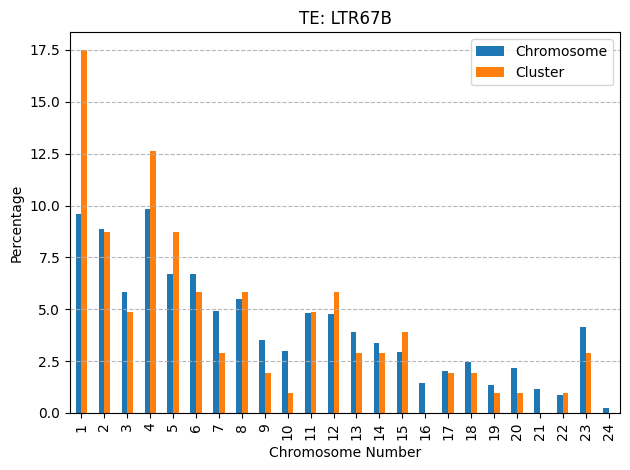

[ 1  3  6  9 10 11 12 13 15 16 23]
[ 1  6 12 15 23]
[23]
[23]
[23]
[23]


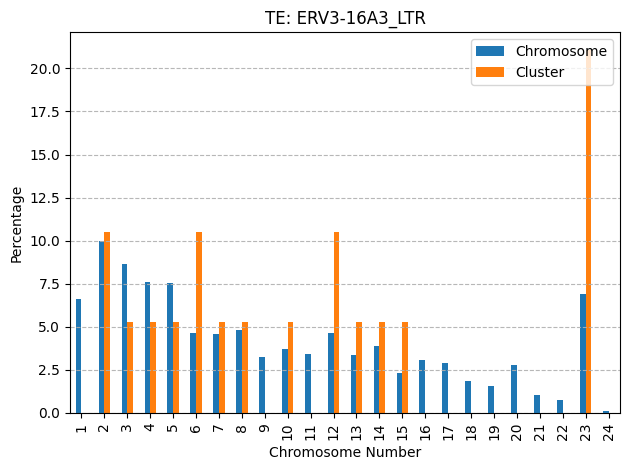

[ 1  2  3  5  7  8 16 17 19 20]
[ 1  7 16 17 19 20]
[]
[19]
[17 19]
[17 19]


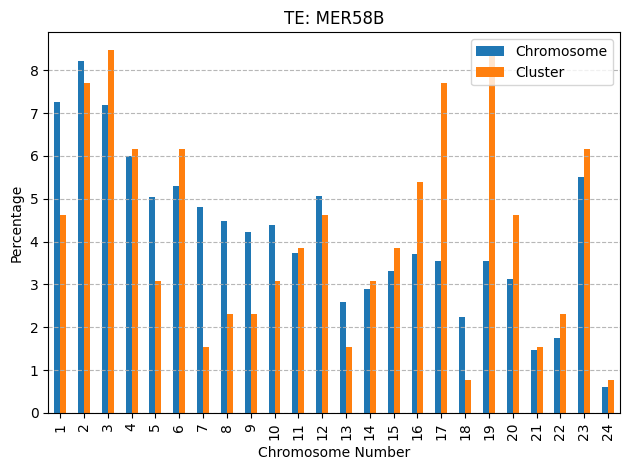

[ 1  3  4 10 12 14 17 18 19 22]
[ 1  4  5 10 12 16 17 19 22]
[]
[]
[]
[]


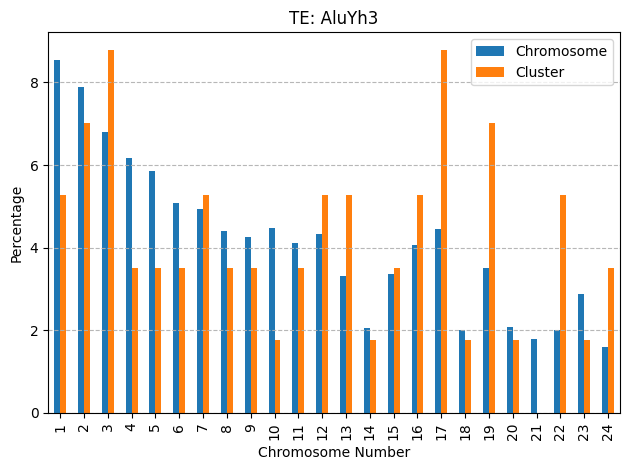

[ 2  3  4  5  7  8  9 10 16 17 19 20 22 23]
[ 3  4  5  9 10 17 20 22 23]
[10 17 20]
[20]
[10 17 20]
[10 17 20]


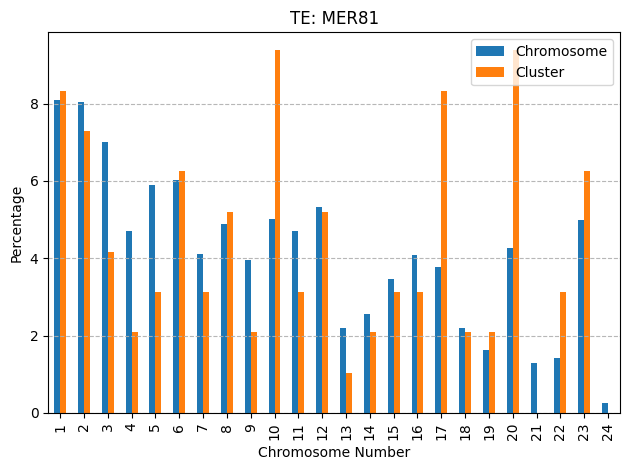

[ 2  3  5  6  7 14 15 16 20 21 23]
[ 3  6  7  8 13 14 15 16 20 23]
[20]
[20]
[20]
[20]


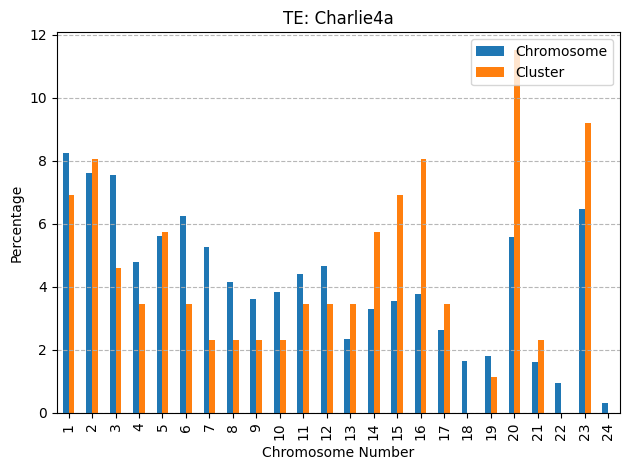

[ 4  5  6  7  9 12 14 17 18 20 22]
[ 1  3  4  5  7  9 12 17 18]
[7]
[7]
[7]
[7]


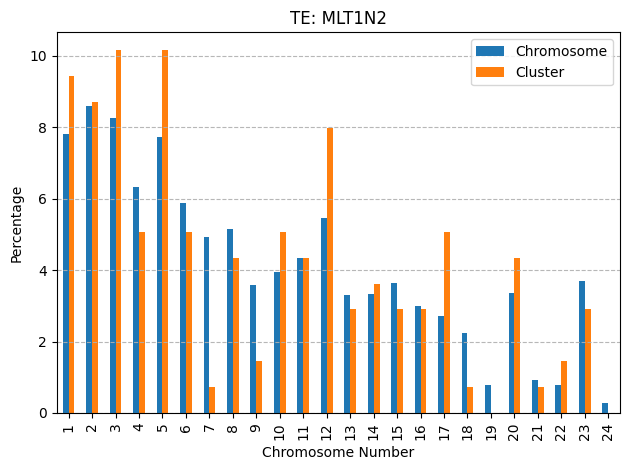

[ 1  3  4  5  8 11 12 14 15 16 21 22 23]
[ 1  3  4  5  8 11 15 22 23]
[ 5 23]
[5]
[ 3  4  5 23]
[ 3  4  5 23]


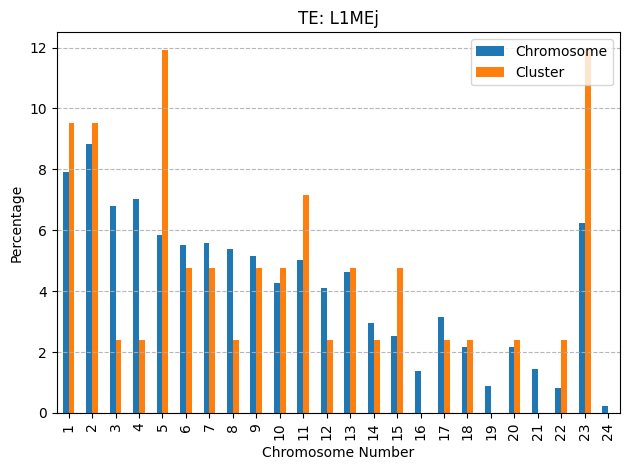

[ 4  5  6  9 11 13 14 15 18 19 22 24]
[ 4  5 13 15 19]
[5]
[ 5 15]
[ 4  5 15]
[ 4  5 15]


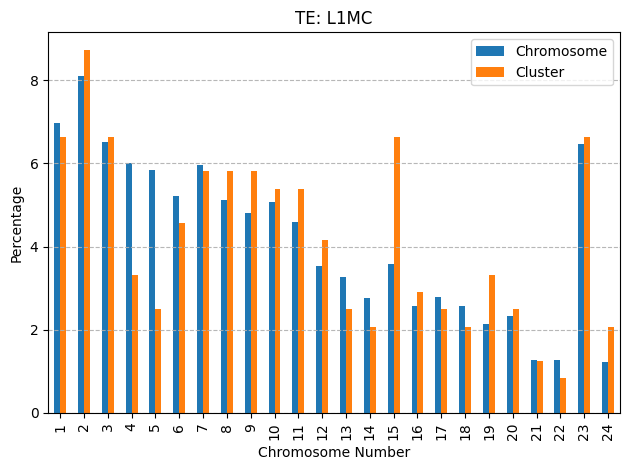

[ 1  2  3  4  8 11 14 16 17 19 20 23]
[ 1  2  4  8 15 16 17 19 20 23]
[]
[]
[]
[]


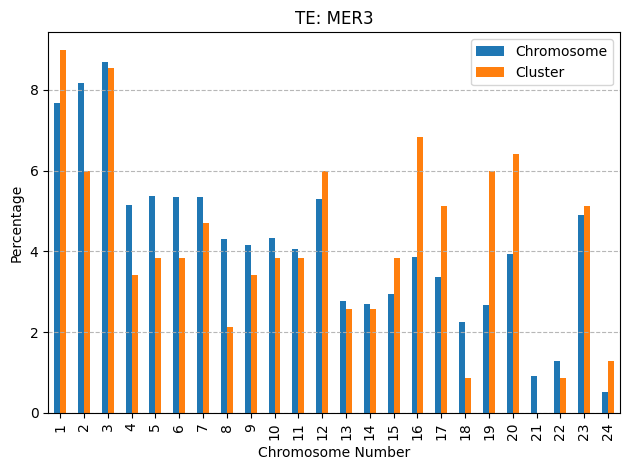

[ 2  3  4  6  7  8 11 18 19 20 22 24]
[ 4  7 11 19 22]
[]
[19]
[]
[19]


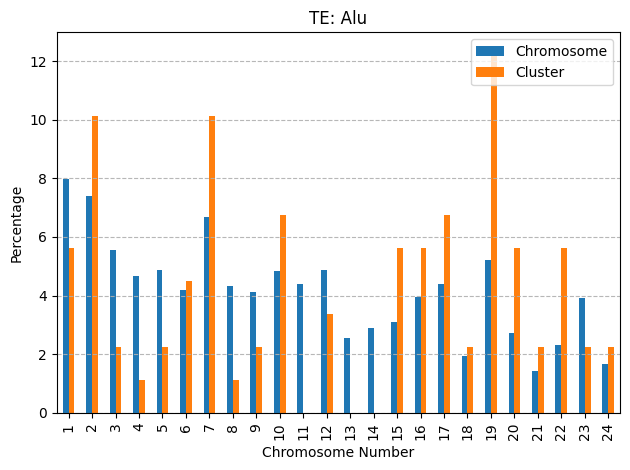

[ 1  2  3  4  6  8  9 11 12 13 20 24]
[ 1  3  8 11 12 20]
[]
[]
[11]
[11]


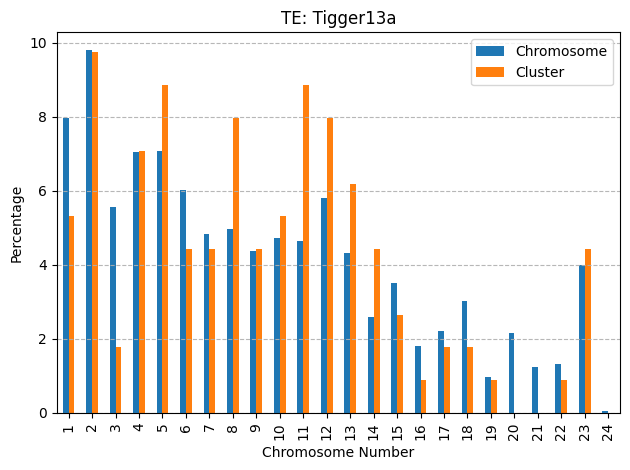

[ 1  3  4  5 10 11 12 13 18 19 22 23]
[ 1 10 11 12 13 14 19 23]
[]
[23]
[19 23]
[19 23]


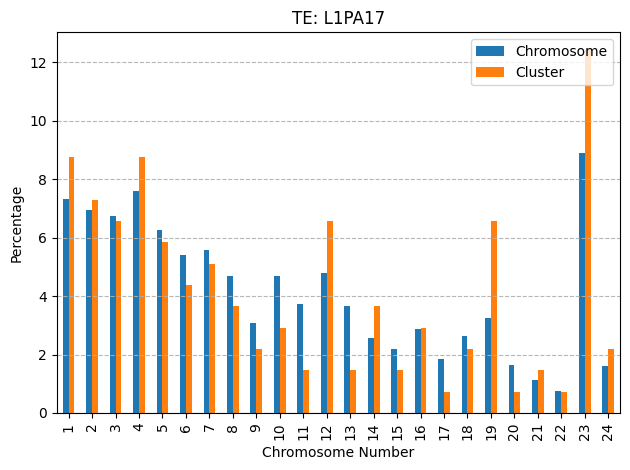

[ 1  2  4  5  6  8  9 13 15 18 21 24]
[ 1  4  5  6  8  9 10 21 24]
[]
[]
[]
[]


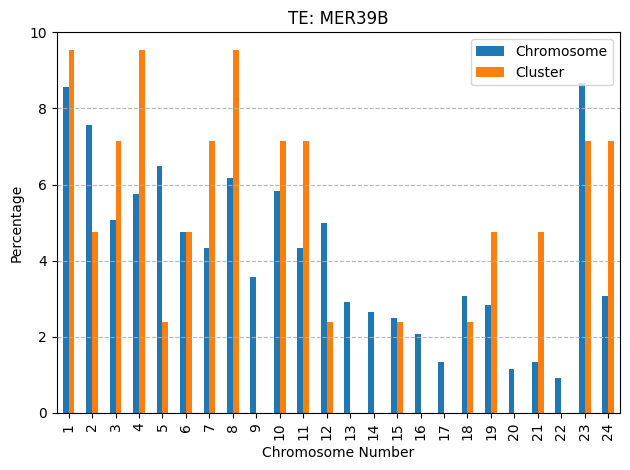

[ 1  2  3  5  6  7  8  9 10 13 15 20 21 23]
[ 1  2  3  5  6  7  8 10 15 16]
[]
[]
[]
[]


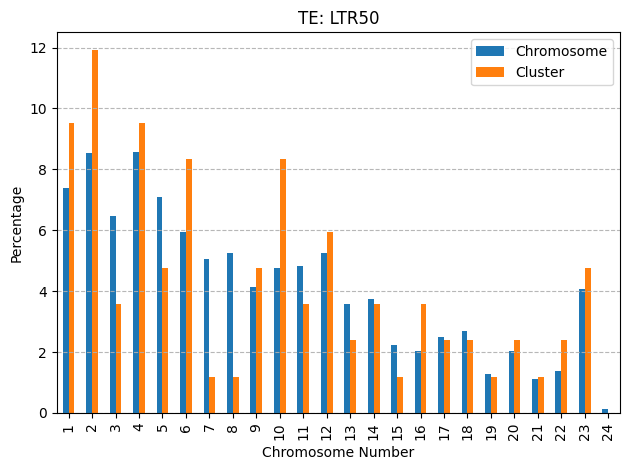

[ 1  4  6  7  9 10 14 15 16 19 22]
[ 4  7  9 14 15 16 19]
[15]
[15]
[15 19]
[15 19]


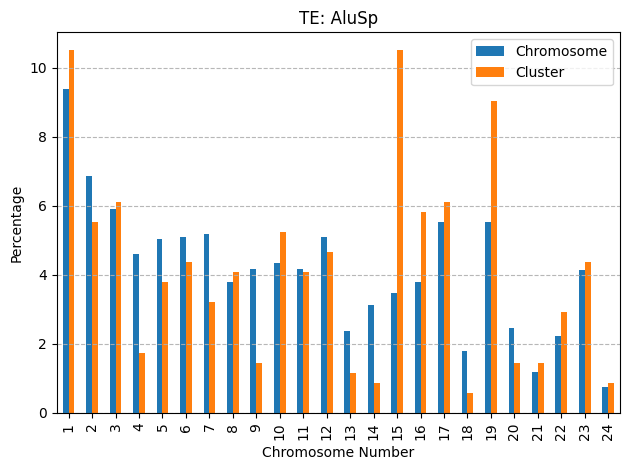

[ 2  4  5  6  7  9 10 12 13 14 23 24]
[ 2  4  6  7  9 12 14 15 17 23]
[]
[6]
[6]
[6]


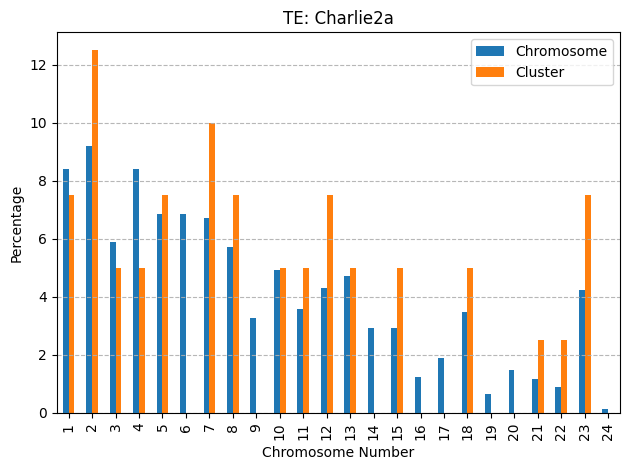

[ 1  2  3  4  5  6  8  9 10 12 14 17 23]
[ 1  4  5  6  8 23]
[ 1 23]
[1]
[ 1 23]
[ 1 23]


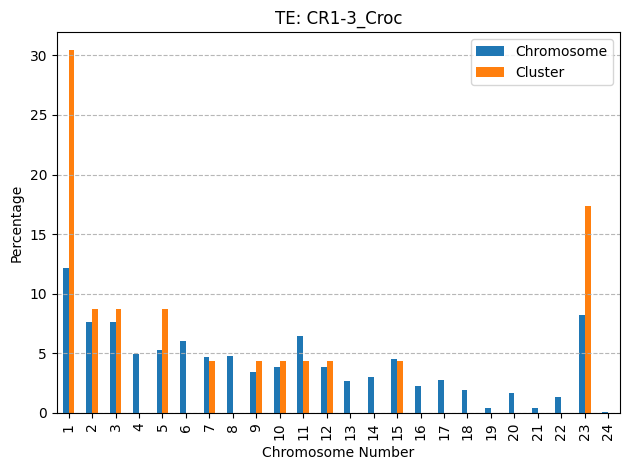

[ 2  3  5  7  8 10 11 14 15 17 22 23]
[ 2  3  5 10 11 23]
[]
[23]
[23]
[23]


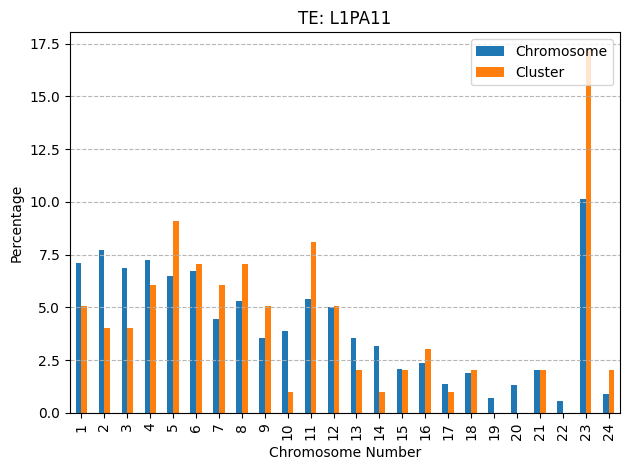

[ 2  4  8  9 11 12 13 14 16 18 19 20 22]
[ 2  4  6  8  9 12 16]
[]
[12]
[12]
[12]


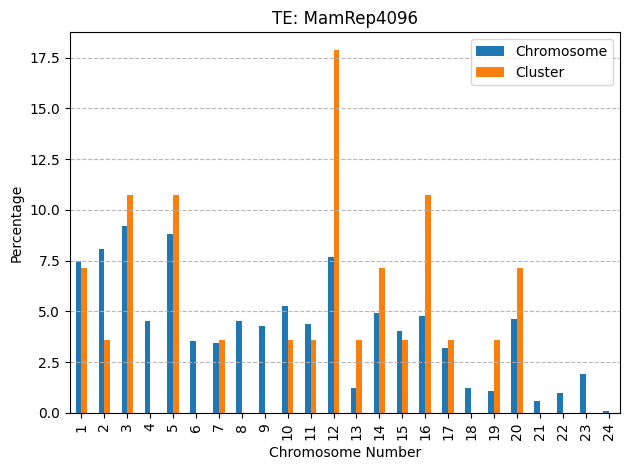

[ 1  2  4  5  6  7  9 10 14 18 19 23 24]
[ 1  2  4  6  7  8 18]
[]
[7]
[7]
[7]


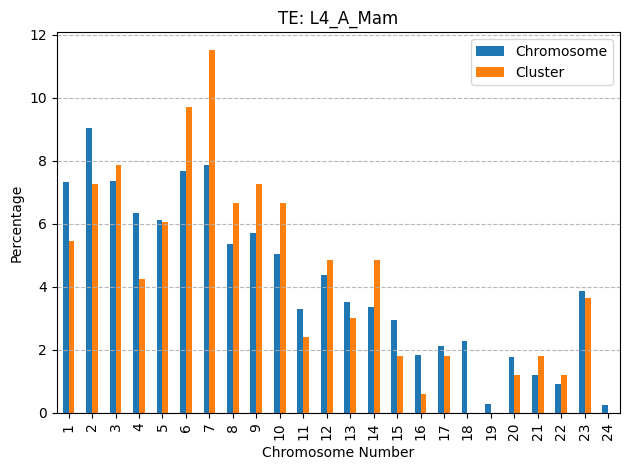

[ 1  2  4  5  8  9 12 13 15 16 17 19 20 22]
[ 4 17 19 23]
[19]
[19]
[19]
[19]


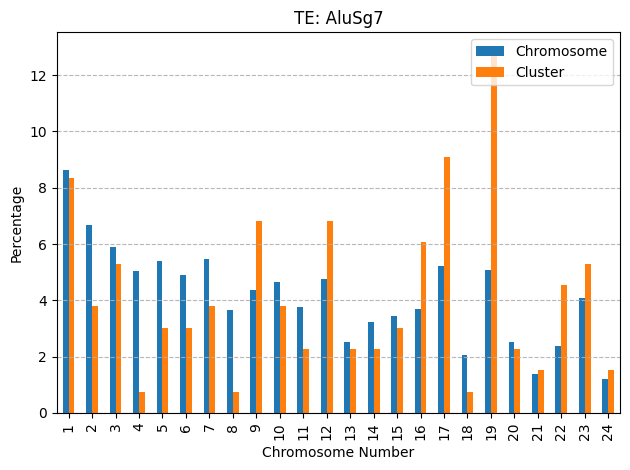

[ 1  2  3  7  8 16 19 20 22 23 24]
[ 1  2 16 19 20 23 24]
[16 19 20 23]
[19 23]
[16 19 20 23]
[16 19 20 23]


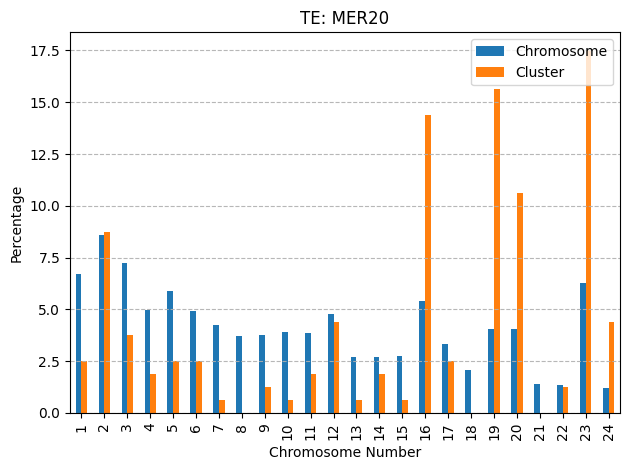

[ 3  4  5  6  7  8  9 10 11 12 15 20 24]
[ 1  4  5  6  7  8 11 12 20]
[]
[]
[6 7]
[6 7]


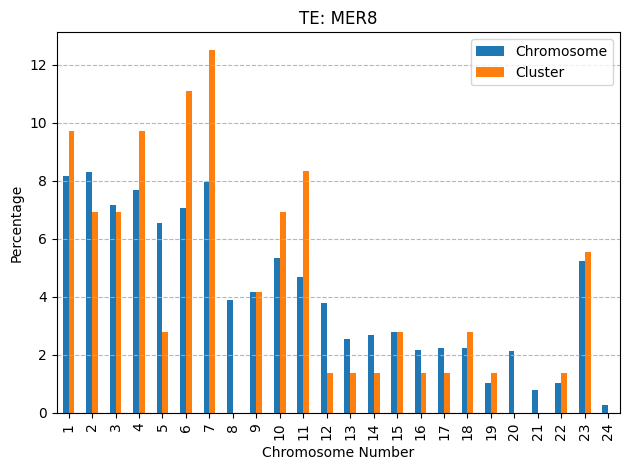

[ 3  4  5  7  9 10 11 14 17 21 23 24]
[ 3  4  8  9 10 11 15 17 23]
[]
[]
[]
[]


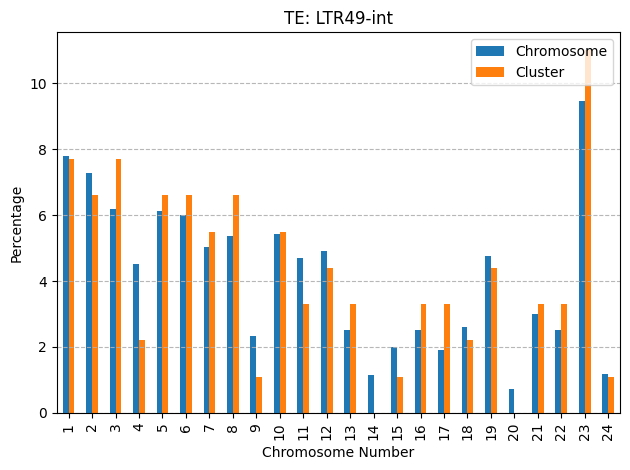

[ 1  2  4  7 10 12 13 14 16 17 18 23]
[ 1  4  7 13 16 23]
[23]
[23]
[ 4 13 23]
[ 4 13 23]


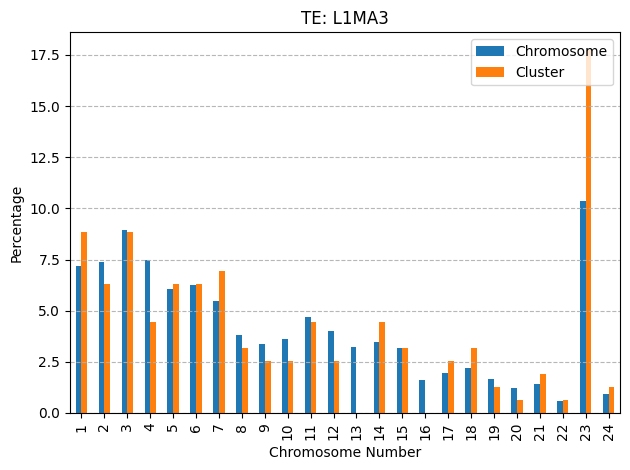

[ 3  4  5  7 10 11 12 13 17 21 22 23 24]
[ 3  4  5  7 10 11 12]
[]
[]
[4]
[4]


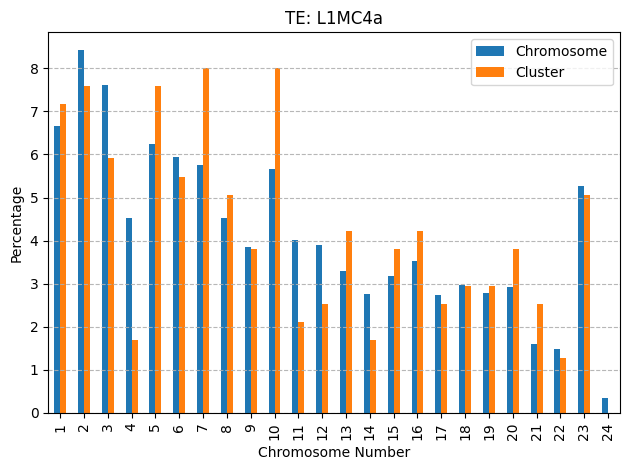

[ 1  2  3  6  7  8 10 13 18 20 23 24]
[ 2  3  7 18 23 24]
[]
[3]
[]
[3]


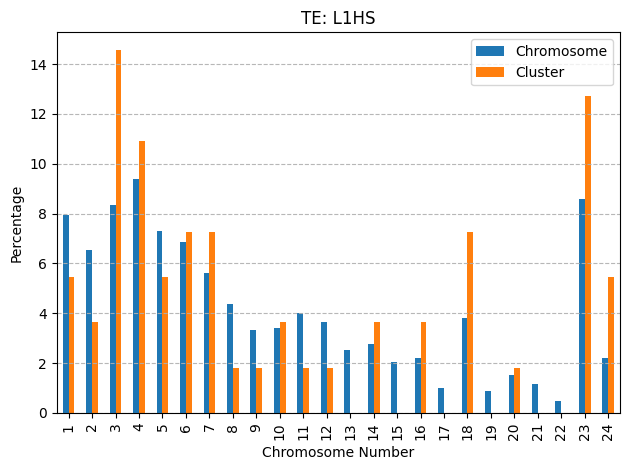

[ 1  3  4  5  6 12 13 16 20 22 23 24]
[ 3  5  6 12 16 20 22]
[]
[3]
[ 3 12]
[ 3 12]


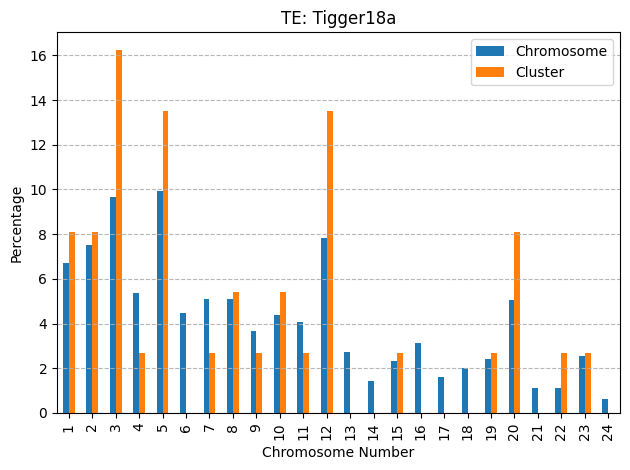

[ 1  2  5  8  9 11 12 13 15 20 24]
[ 1  2  8 11 24]
[]
[11]
[ 8 11]
[ 8 11]


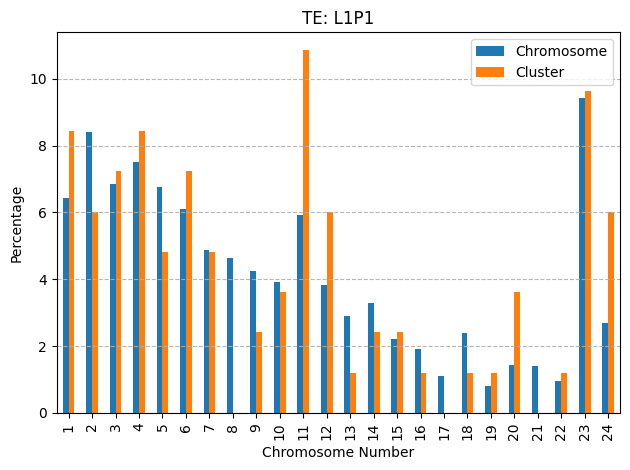

[ 2  4  5  6  8 10 14 15 19 21 23 24]
[ 2  4  5  6  8  9 10 14 15 19]
[]
[]
[]
[]


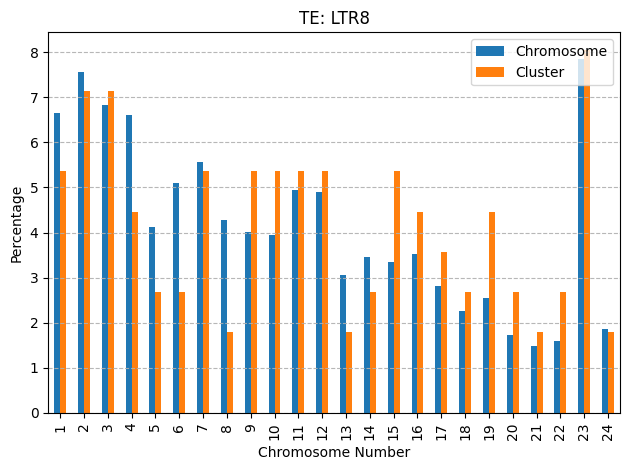

[ 1  2  3  4  5  6  8 13 17 18 24]
[ 2  3  4  5  6  8 15 23]
[]
[6]
[]
[6]


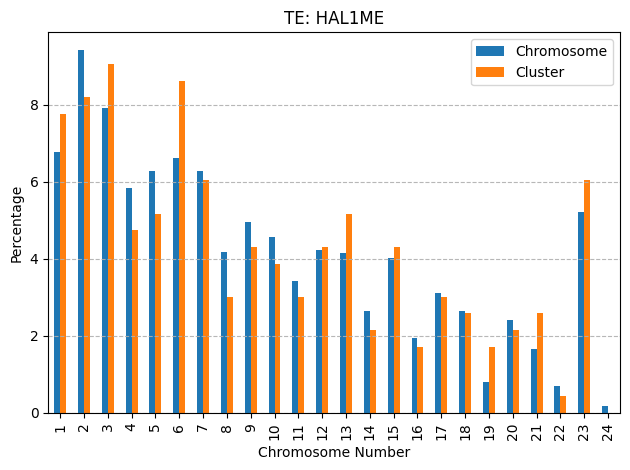

[ 1  2  3  4  9 10 11 12 14 17 22 23]
[ 1  2  3  9 10 11 12 23]
[]
[23]
[23]
[23]


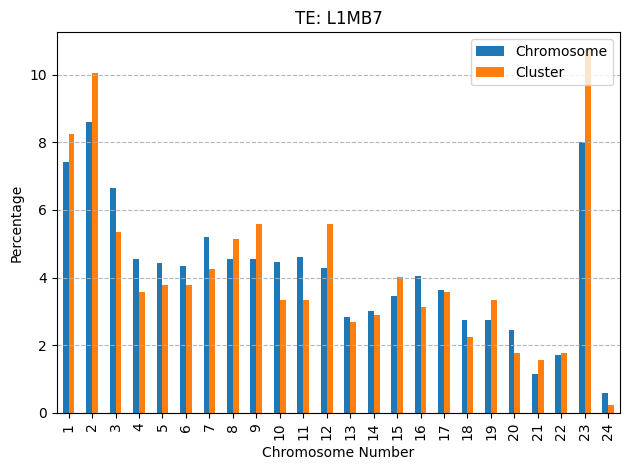

[ 1  3  4  6 10 11 14 15 16 19 20 22]
[ 1  3  4  6 15 16]
[]
[6]
[]
[6]


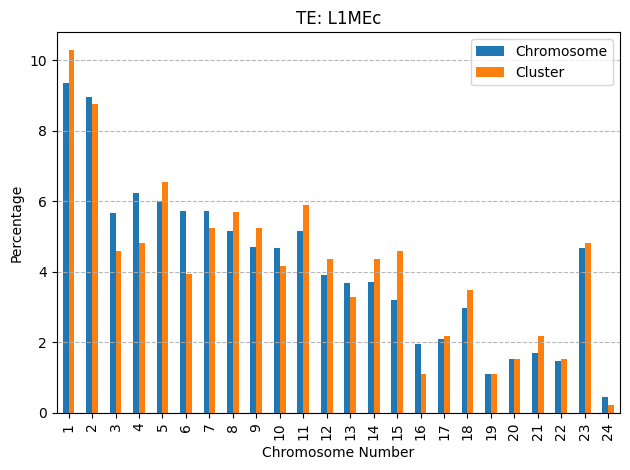

[ 1  2  3  4  6  8  9 10 12 16 23]
[ 1  4  8  9 10 12 13 16 23]
[]
[23]
[23]
[23]


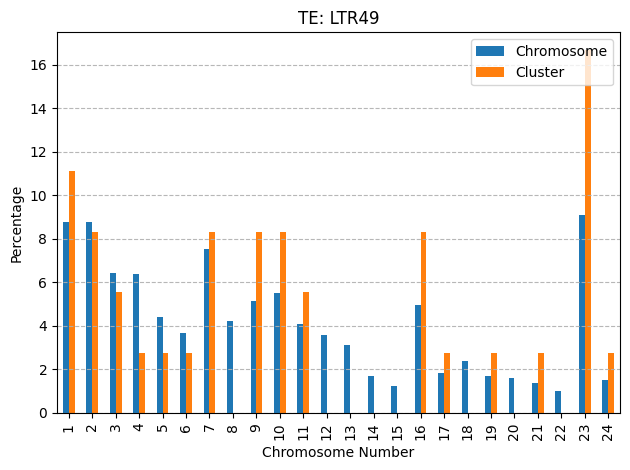

[ 1  2  3  6  7  8 10 11 12 13 15 17 24]
[ 1  2  3  6  7  8 11 15]
[1 7]
[7]
[1 7]
[1 7]


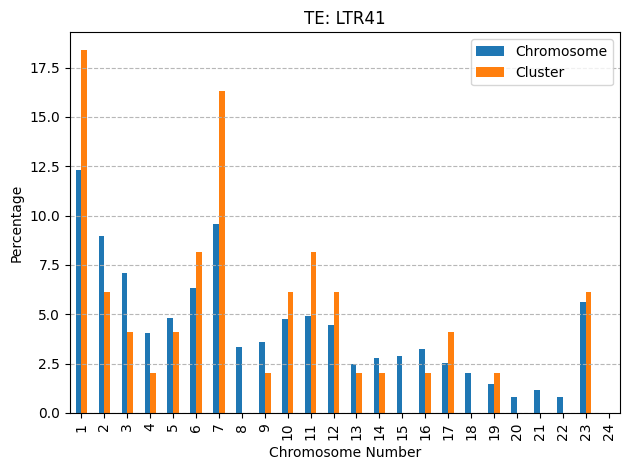

[ 1  2  3  8  9 11 12 13 14 16 17 18 21 23]
[ 2  3  8 11 13 14 23]
[]
[]
[]
[]


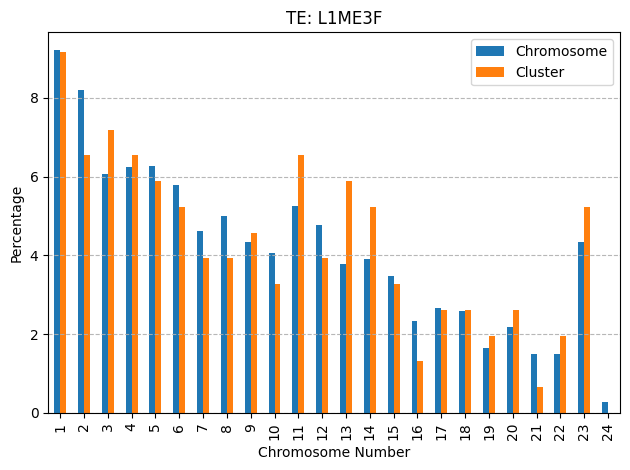

[ 7  8  9 10 11 12 13 14 15 22 23 24]
[ 7  8  9 11 12 23 24]
[23]
[23]
[23 24]
[23 24]


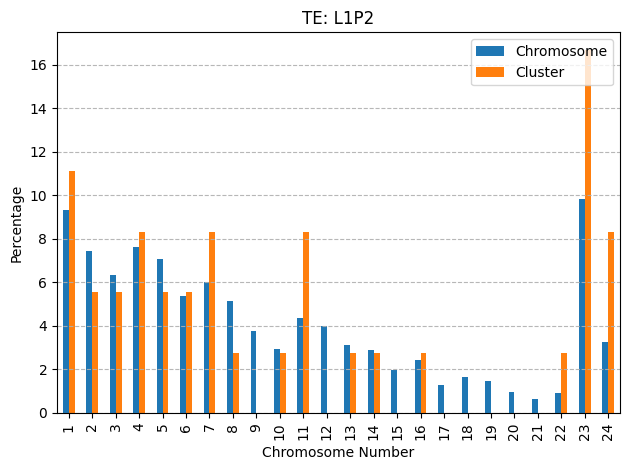

[ 4  6  8 10 11 13 19 20 21 22 23 24]
[ 6 13 19 21 22]
[]
[]
[]
[]


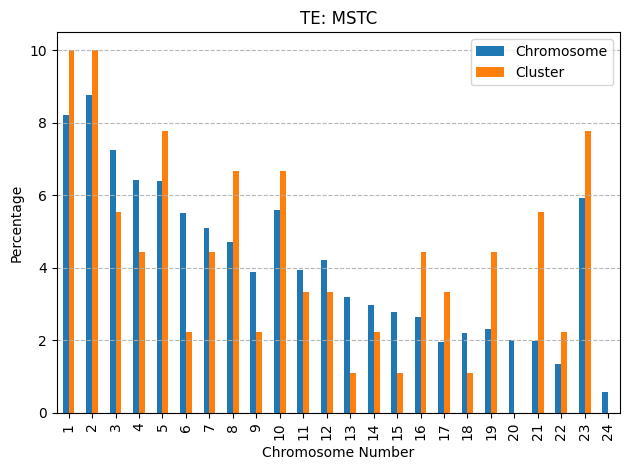

[ 2  3  4  6 10 11 12 16 18 19 20]
[ 3  4  6 10 11 16 19]
[3]
[3]
[ 3  6 19]
[ 3  6 19]


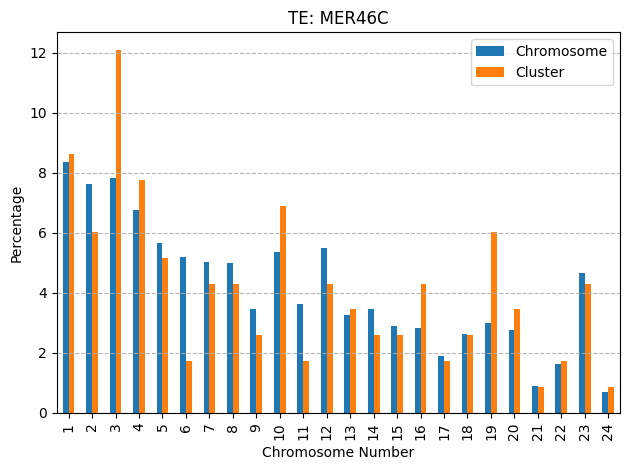

[ 1  2  5  6  8 12 15 16 19 20 23]
[ 1  2  5  6  8  9 12 15 16 20]
[]
[6]
[]
[6]


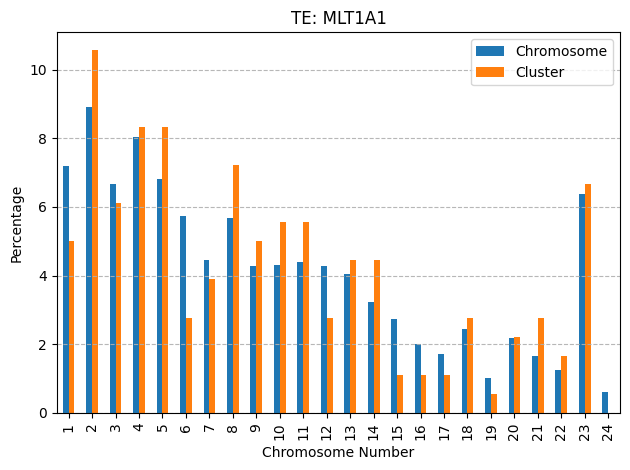

[ 4  6  7  8  9 10 12 13 16 18 19 21 23 24]
[ 3  4  6  7 12 16 19 22 23]
[]
[]
[]
[]


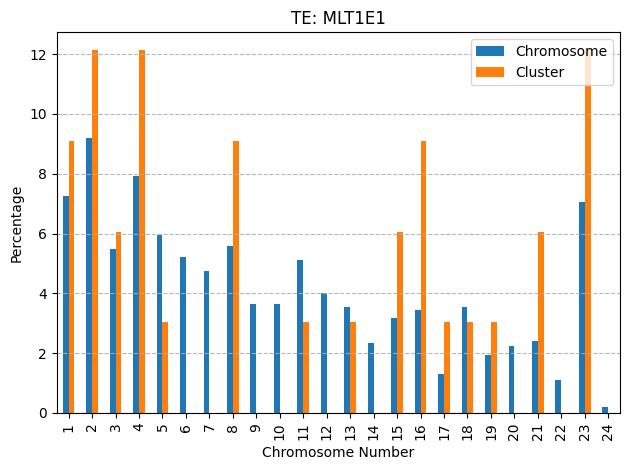

[ 1  2  3  5  6 10 14 17 18 19 21 22 23]
[ 1  2  3  5 17 19]
[]
[]
[ 2 19]
[ 2 19]


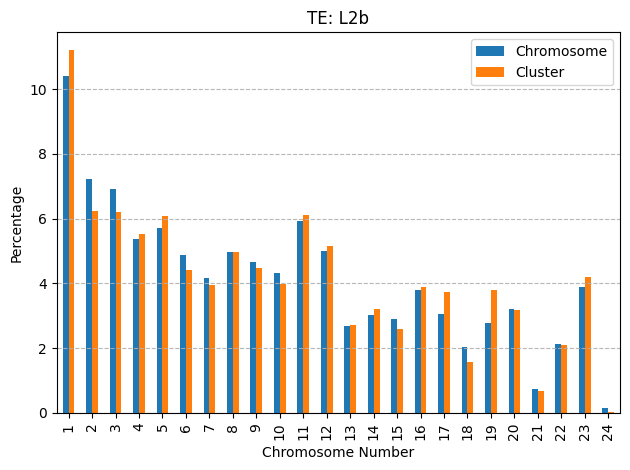

[ 1  3  4  7 10 11 12 13 14 15 17 18 22]
[ 4  5 11 13 14 18]
[]
[]
[]
[]


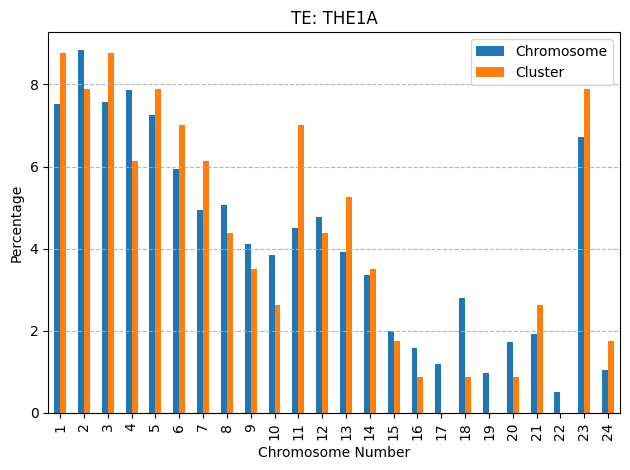

[ 2  3  4  5  7  9 12 13 14 16 20 21 24]
[ 3  4  5  7  9 12 14 16]
[3]
[3]
[3]
[3]


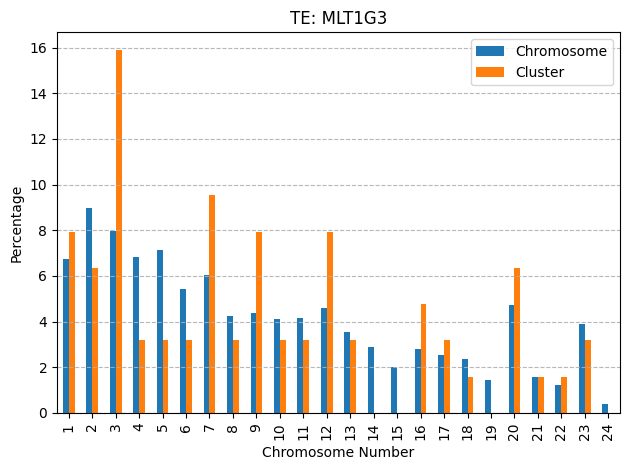

[ 1  2  3  4  8  9 12 14 18 19 22 23 24]
[ 2  3  5  8 12 23 24]
[23]
[23]
[ 3  8 23]
[ 3  8 23]


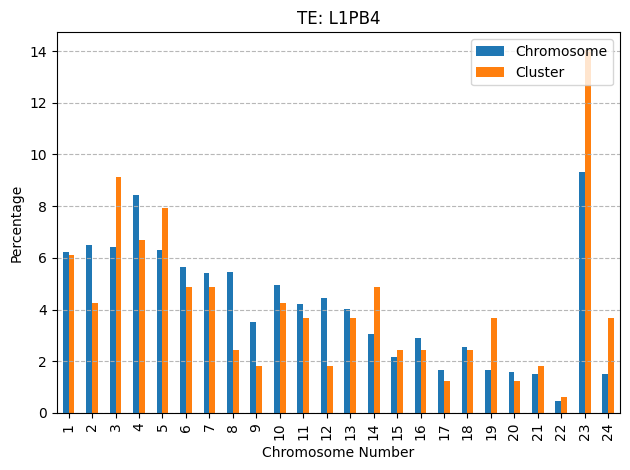

[ 1  3  4  5  6  9 11 17 19 23 24]
[ 1  5 17 19 24]
[17]
[17]
[17]
[17]


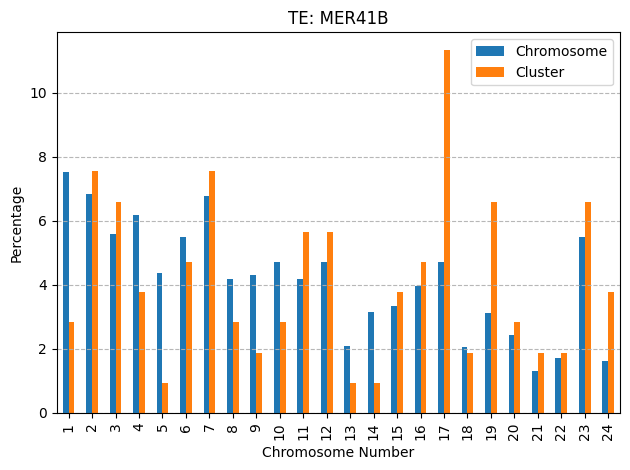

[ 1  2  3  4  5  6 10 12 15 16 20]
[ 1  2  4  5  6 10 12 15 16 20]
[ 4 10 12 16 20]
[]
[ 2  4 10 12 16 20]
[ 2  4 10 12 16 20]


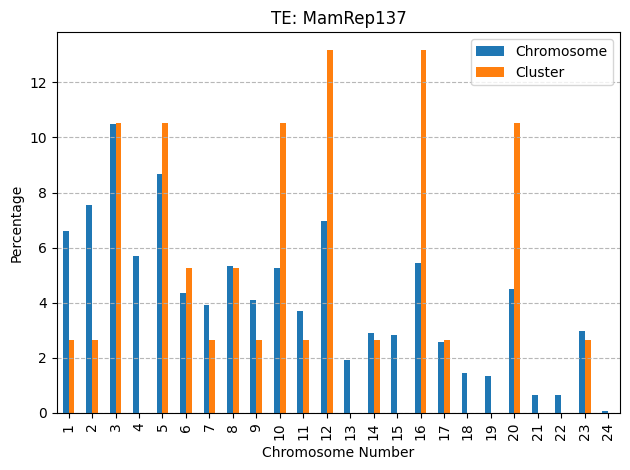

[ 1  2  3  4  5  6 12 14 16 17 19 20]
[ 1  3  5 16 19 20]
[16 20]
[16]
[16 20]
[16 20]


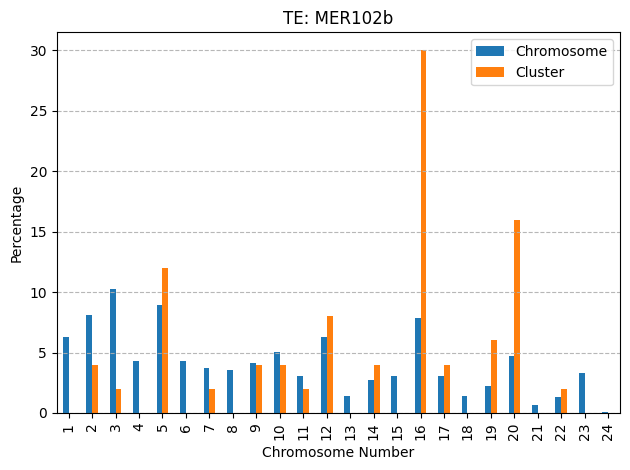

[ 3  4  5  6  7  8  9 11 14 17 19 21 24]
[4 5 6 7 8 9]
[]
[]
[]
[]


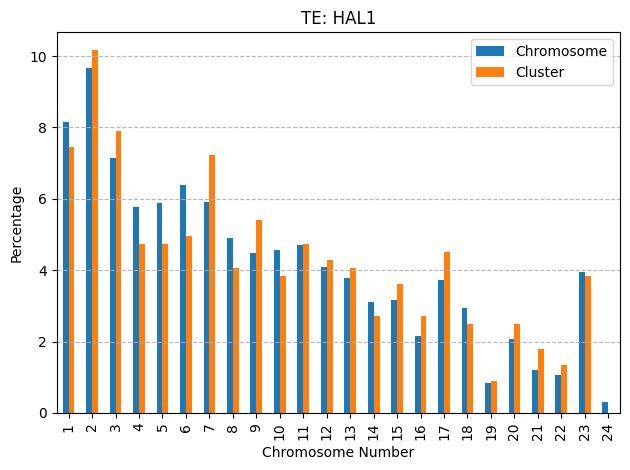

[ 1  3  4  5  6  7  9 10 18 20 21]
[ 1  4  5  6  7  9 10 18]
[ 1  4  5  7 10]
[7]
[ 1  4  5  7 10]
[ 1  4  5  7 10]


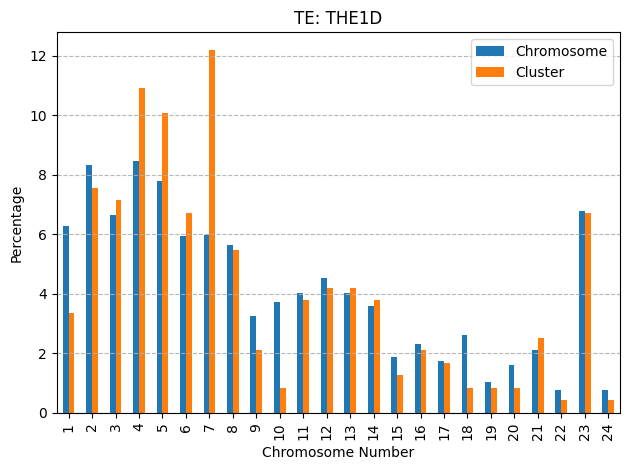

[ 3  5  6  8  9 13 18 20 21 22 23]
[ 5  9 13 18 20 21 22 23]
[9]
[9]
[ 9 18 21]
[ 9 18 21]


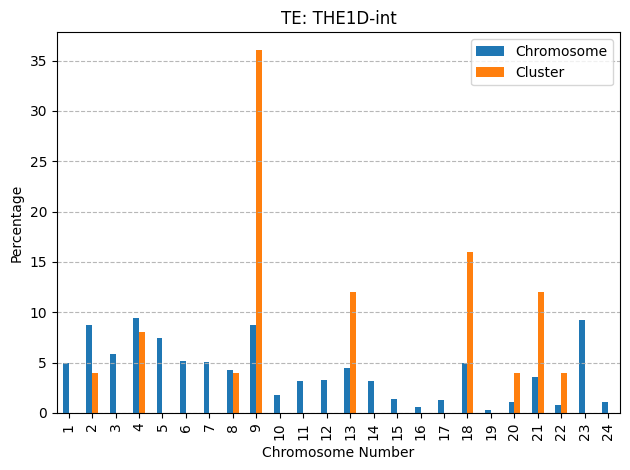

[ 2  4  5  6  7  8 10 14 16 17 19 24]
[ 2  5  7 10 14]
[2]
[2]
[2]
[2]


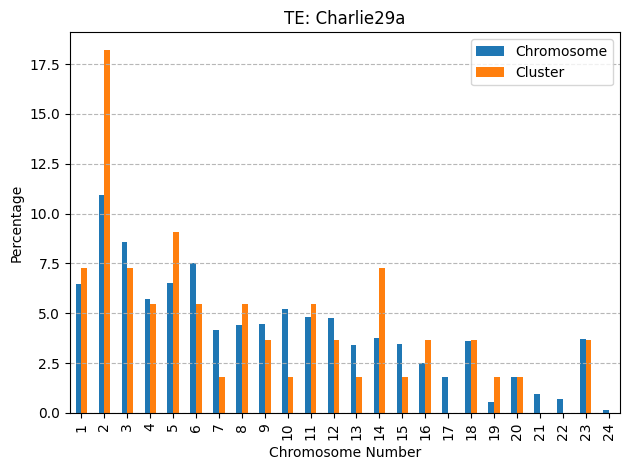

[ 1  2  3  4  5  6  8 10 11 14 20]
[ 1  2  3  4  5  6 10 11 14]
[]
[2]
[2]
[2]


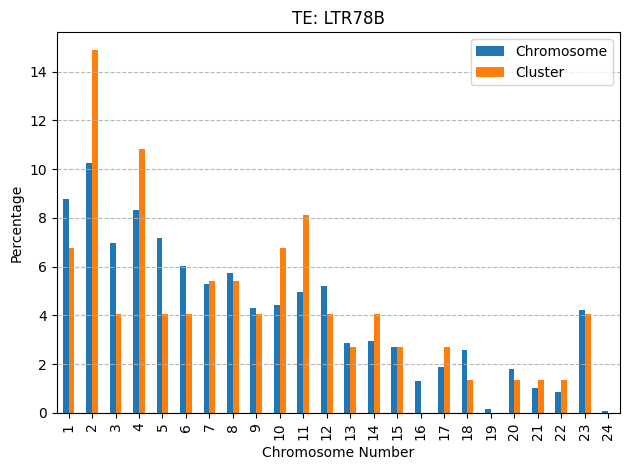

[ 1  2  3  4  5  6  7  9 11 15 17 19 22 23]
[ 5  7 19 22 23]
[23]
[23]
[23]
[23]


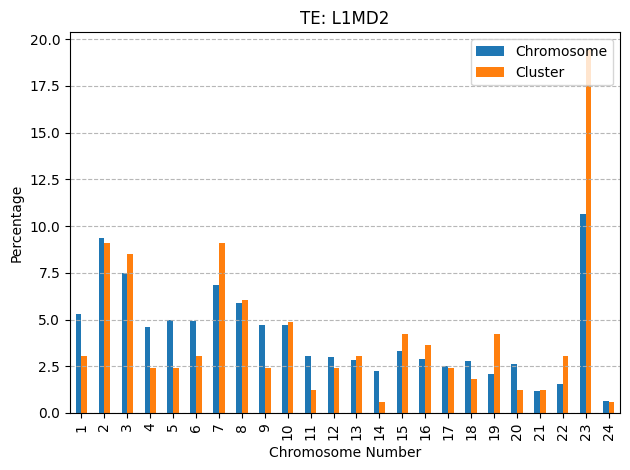

[ 1  6  7  9 10 11 12 13 14 20 23 24]
[ 1  7 10 11 14 23 24]
[23]
[23]
[23]
[23]


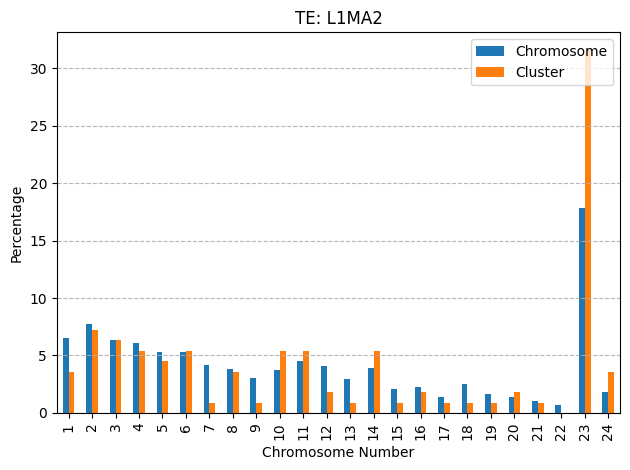

[ 1  3  4  6  7  8 12 16 18 20 22 23]
[ 1  3  4  7 12 16 20 23]
[]
[3]
[3]
[3]


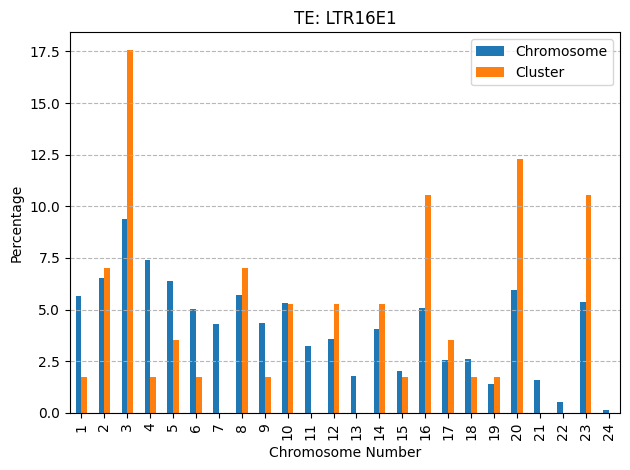

[ 1  2  3  4  5  7  8 10 11 18 23 24]
[ 1  3  4  7 10 18 23 24]
[23 24]
[23 24]
[23 24]
[23 24]


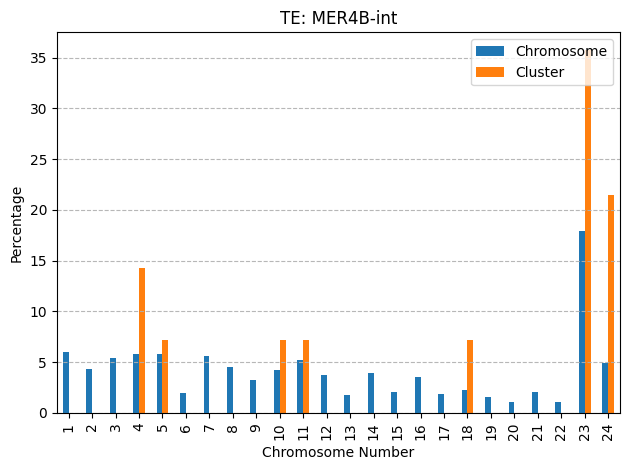

[ 2  3  4  5  6  7 10 11 19 22 24]
[ 2  6  7 22 24]
[7]
[7]
[7]
[7]


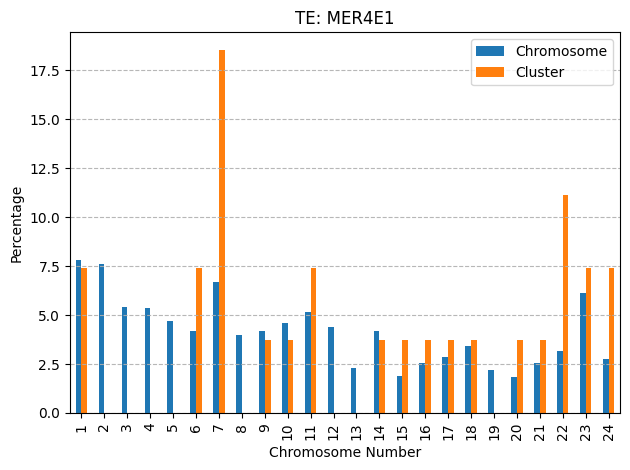

[ 1  2  5  6  8  9 10 12 13 14 16 17 22]
[ 1  5  6  8  9 12]
[]
[]
[]
[]


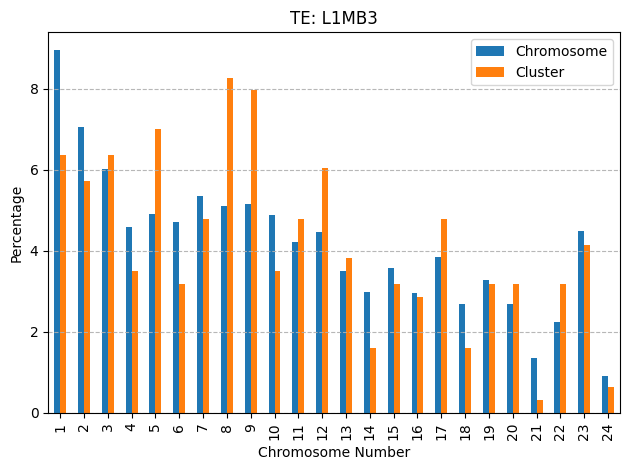

[ 1  2  3  5  6  7  8 12 14 23 24]
[ 1  2  3  6  7  8 14 19]
[8]
[8]
[2 8]
[2 8]


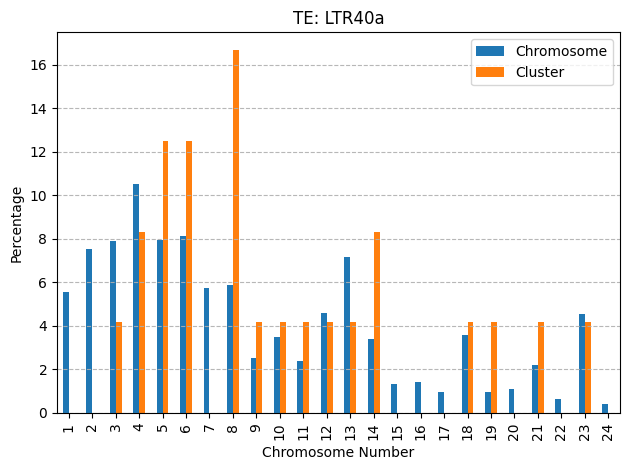

[ 1  2  3  4  5  6  7 12 14 16 18 20 24]
[ 1  3  5  7 11 12 18 20]
[]
[]
[]
[]


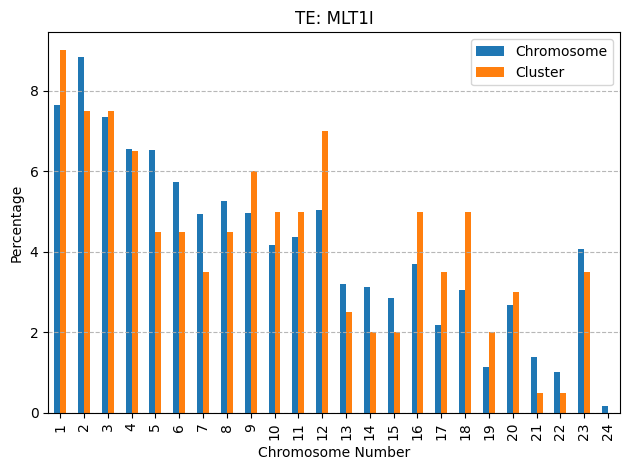

[ 1  3  4  5  7  9 12 14 18 20 21 23 24]
[ 3  4  5  9 18 23]
[]
[4]
[ 3  4 23]
[ 3  4 23]


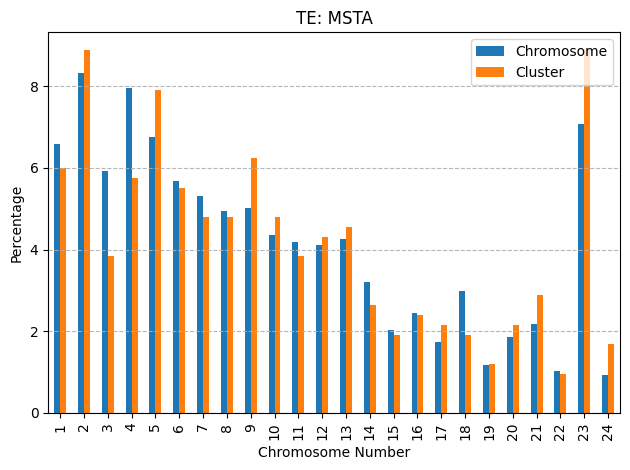

[ 2  3  5  6  7  9 10 12 14 19 22 23 24]
[ 2  3  5  9 12 23]
[23]
[23]
[23]
[23]


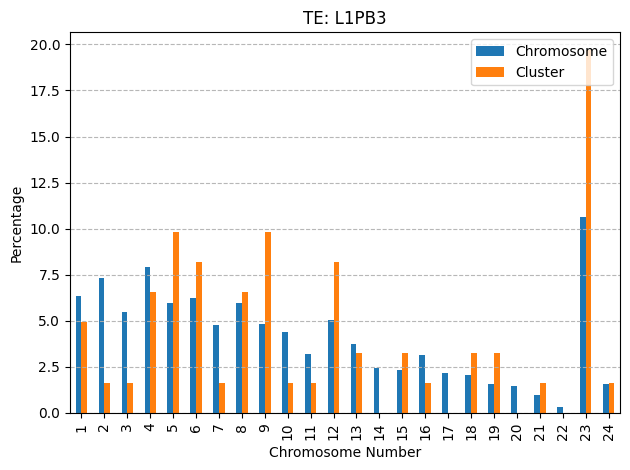

[ 1  4  5  6  7  8  9 11 17 18 23]
[ 1  4  5  6 11 17 23]
[ 1  4  6 17]
[17]
[ 1  4  5  6 17]
[ 1  4  5  6 17]


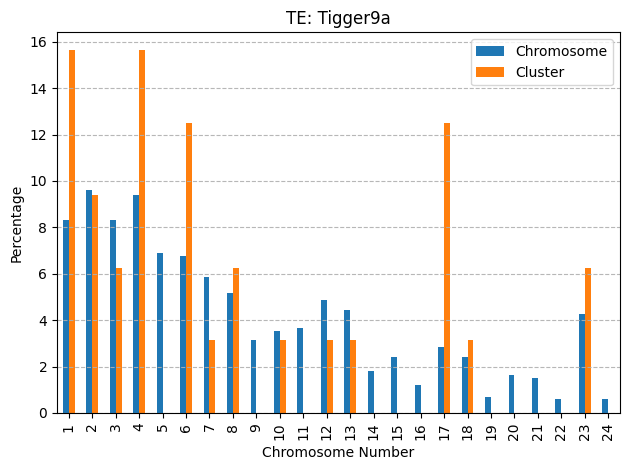

[ 1  4  5  7  8 10 11 12 13 14 17 19 22 23]
[ 1  4  5 11 12 13 14 23 24]
[ 4 23]
[23]
[ 4 23]
[ 4 23]


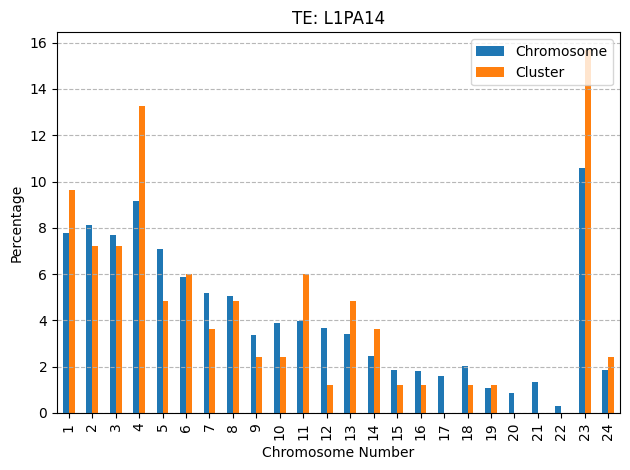

[ 3  4  5  8 10 11 12 13 14 15 19 22 23]
[ 3  4  5  8 10 23]
[]
[10]
[10 23]
[10 23]


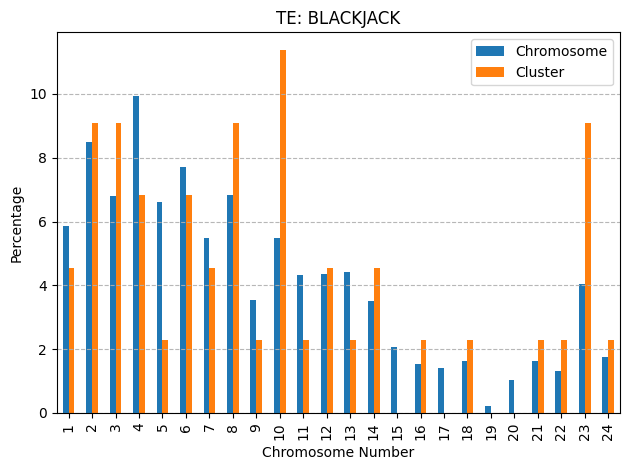

[ 2  4  5  7  8  9 11 14 15 18 19]
[ 4  5  7  8  9 15 18]
[]
[9]
[9]
[9]


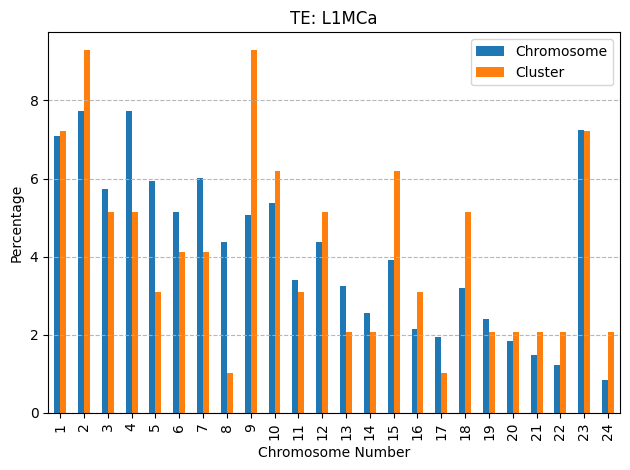

[ 1  3  4  5  6  9 11 16 19 20 23 24]
[ 1  5  6  9 11 20]
[]
[]
[]
[]


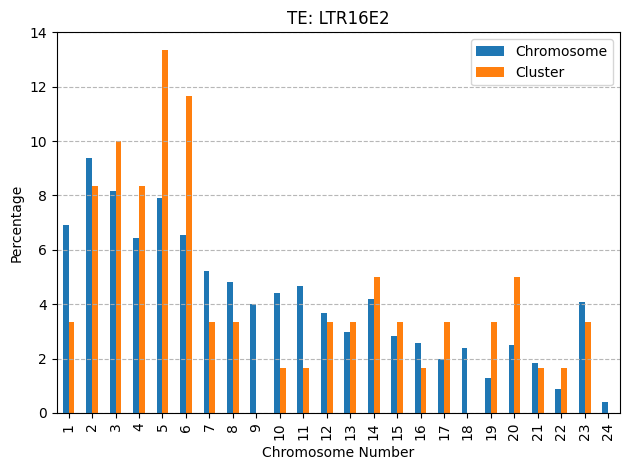

[ 1  2  7 10 11 12 13 14 16 17 24]
[ 1  7 10 11 12 13]
[11]
[11]
[ 7 11]
[ 7 11]


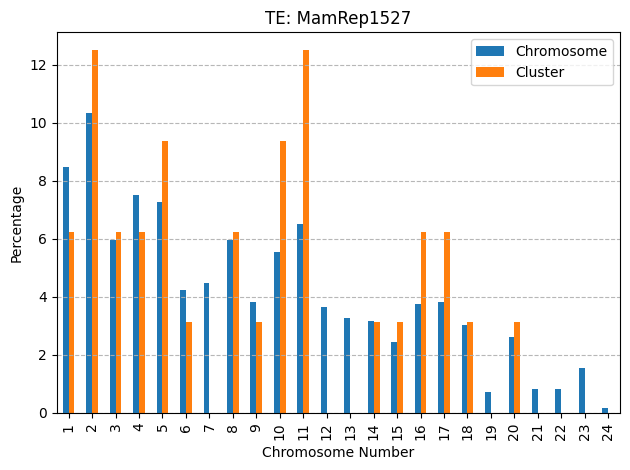

[ 1  2  3  4  5  6  7  8 12 16 19 23]
[ 2  3  4  7  8 12]
[4]
[4]
[4]
[4]


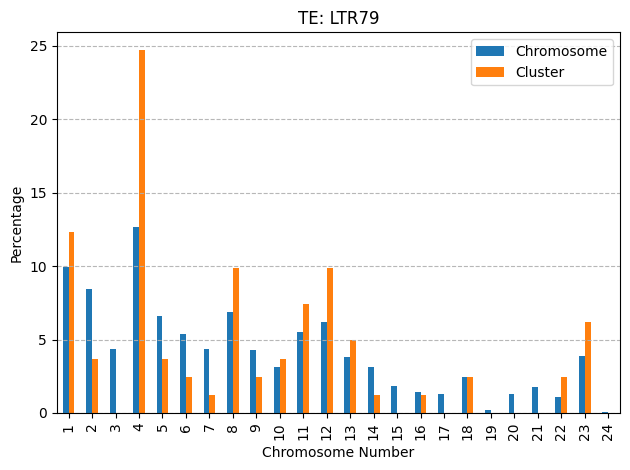

[ 2  3  5  7 10 11 12 13 16 18 19 20]
[ 2 10 11 12 13 18]
[13]
[13]
[13]
[13]


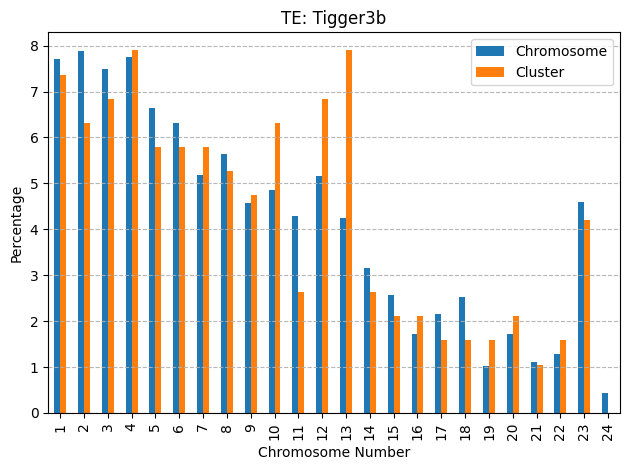

[ 2  3  5  7  8  9 10 11 13 16 19 23 24]
[ 1  2  3  5  9 10 12 13 15 16 22 23]
[]
[]
[]
[]


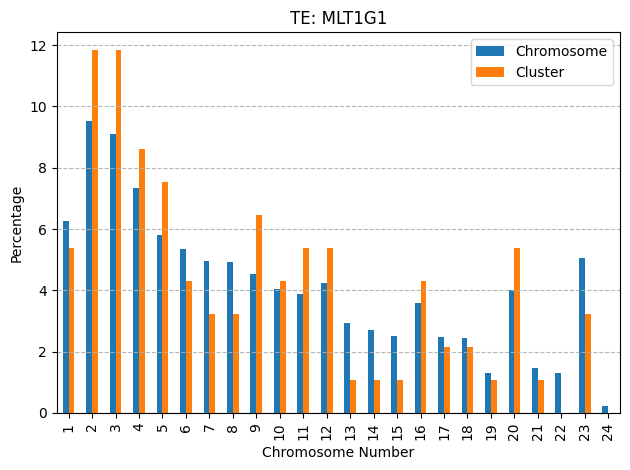

[ 1  2  4  6  8 10 11 12 13 16 22 23]
[ 1  4  6  8 11 12 13]
[ 1  8 11]
[]
[ 1  8 11 13]
[ 1  8 11 13]


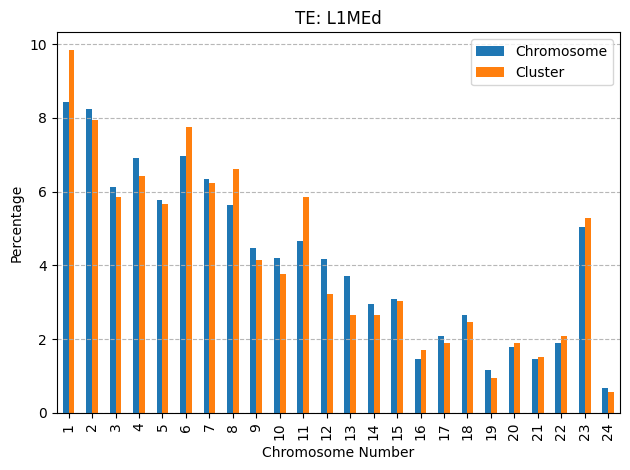

[ 1  4  6  7  8  9 10 11 13 16 18 20 21 23]
[ 1  4  8  9 10 11 23]
[]
[23]
[ 1 11 23]
[ 1 11 23]


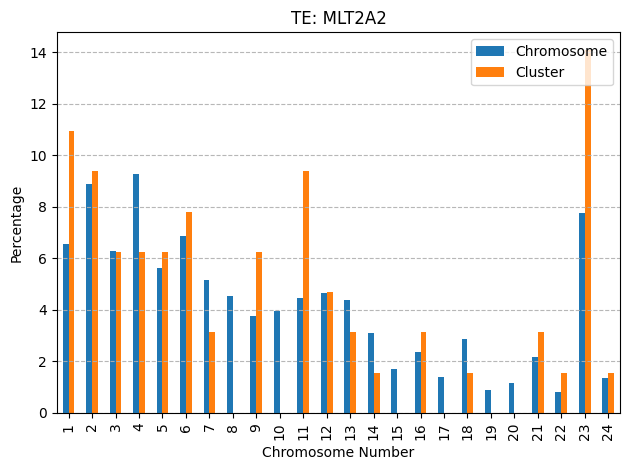

[ 2  4  5  6  8 11 13 14 16 20 23 24]
[ 2  4  8 20 23]
[]
[23]
[]
[23]


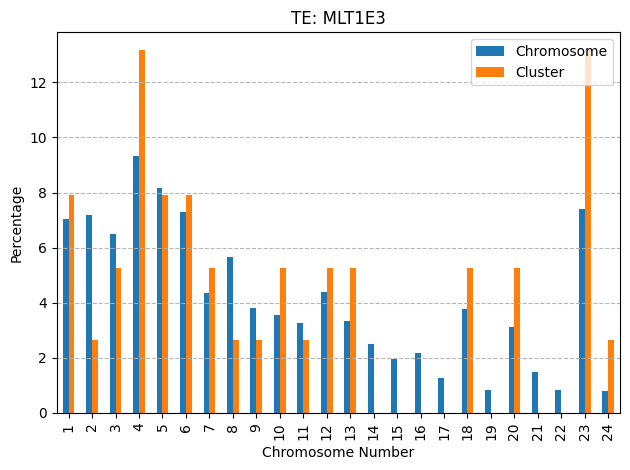

[ 1  2  3  7  8 12 13 14 16 17 18 20 24]
[ 1  2  3 12 17 18 20]
[1]
[1]
[1]
[1]


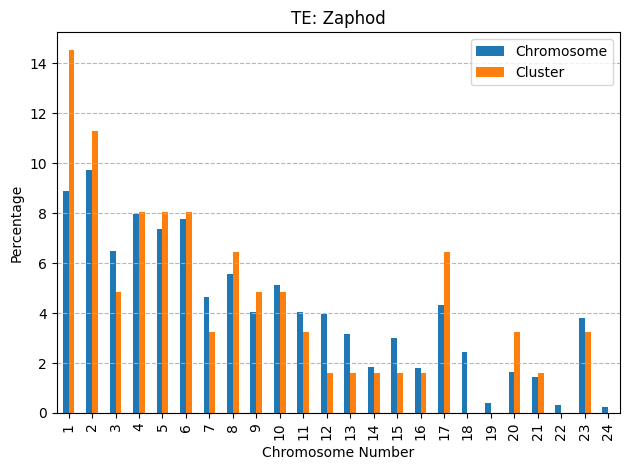

[ 1  4  5  8 10 12 14 15 16 20 23 24]
[ 1  4 10 12 13 15 16 17 20 21 23]
[]
[]
[]
[]


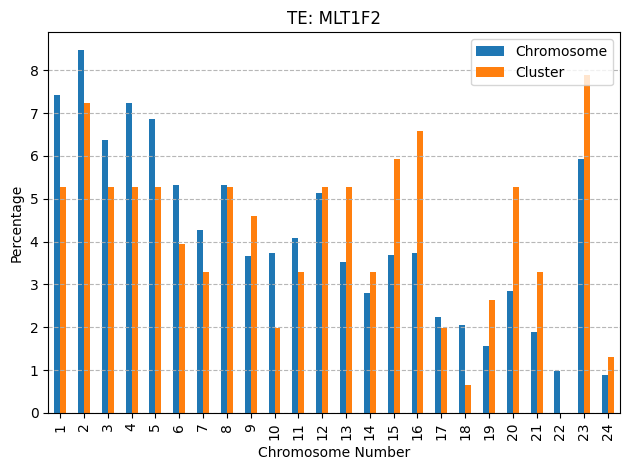

[ 1  2  3  4  5  6  8  9 14 18 23]
[1 2 3 4 6 7 8 9]
[6]
[6]
[2 4 6 8 9]
[2 4 6 8 9]


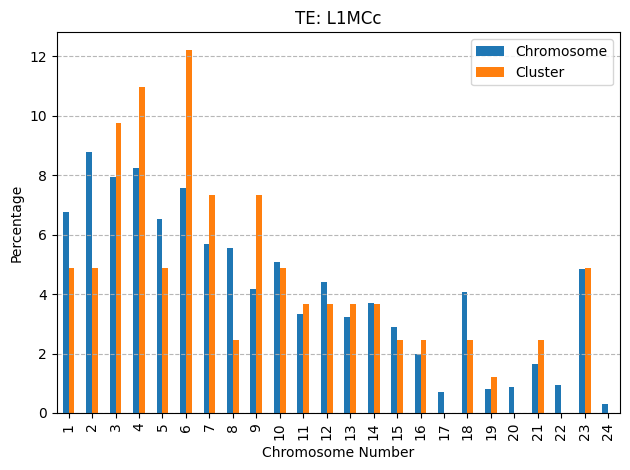

[ 1  3  4  5  6  7  9 11 14 17 18 23 24]
[ 3  4  5  6  9 14 23]
[9]
[9]
[9]
[9]


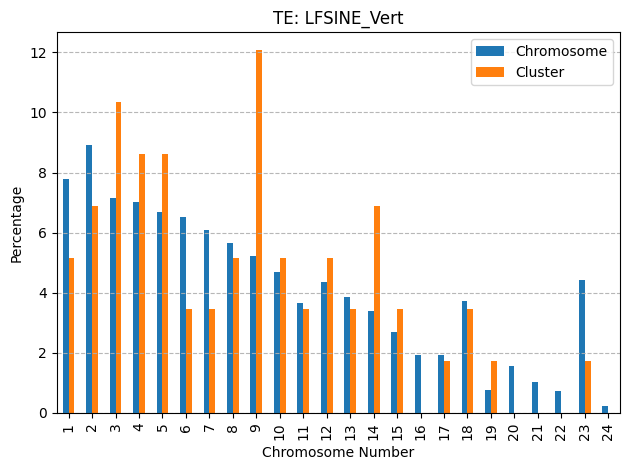

[ 1  7  9 10 11 12 13 15 17 18 19 20 22]
[ 1  9 10 11 12 13 15 17 19 20 21]
[]
[10]
[10]
[10]


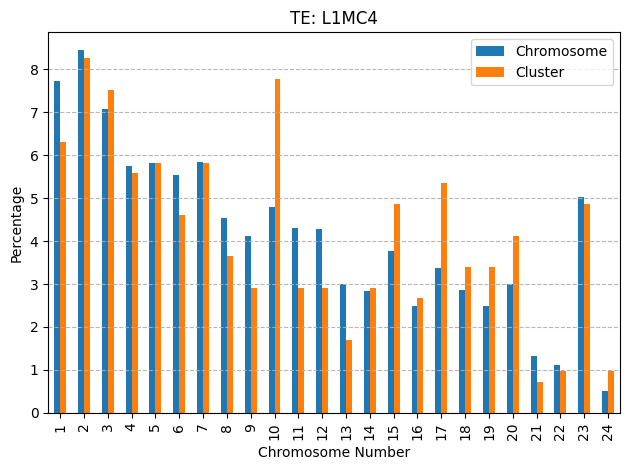

[ 2  5  6  7  8 10 11 13 16 17 19 20]
[ 2  5  6  8 11 13 16 20]
[]
[]
[]
[]


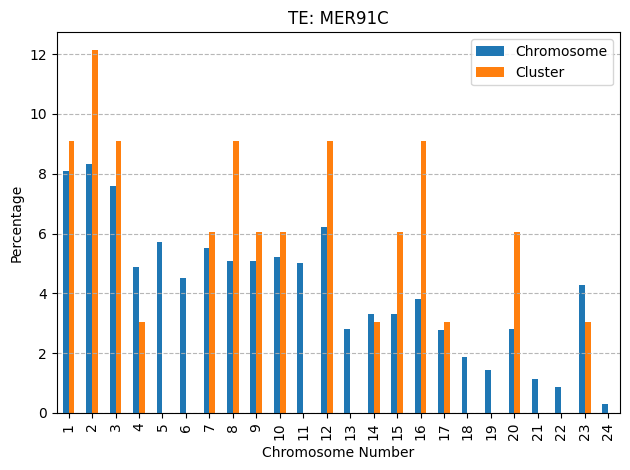

[ 1  2  4  5  7 12 16 17 19 20 22 24]
[ 2  4  5  7 16 17 19]
[ 7 16 19]
[ 7 19]
[ 7 16 17 19]
[ 7 16 17 19]


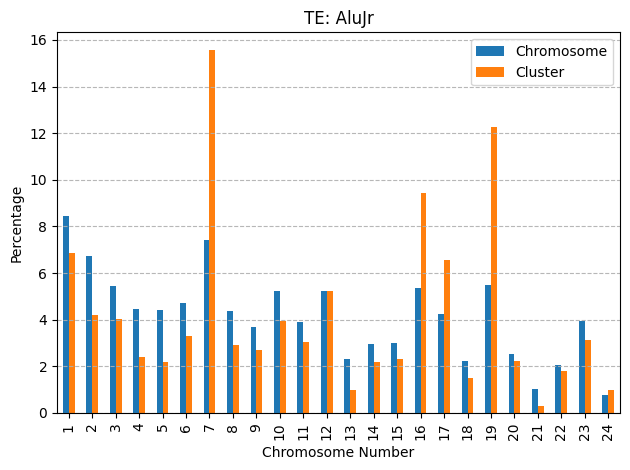

[ 1  3  6  7  8 10 14 15 16 18 19 23]
[ 3  6  7 10 14 16 19 23]
[]
[]
[]
[]


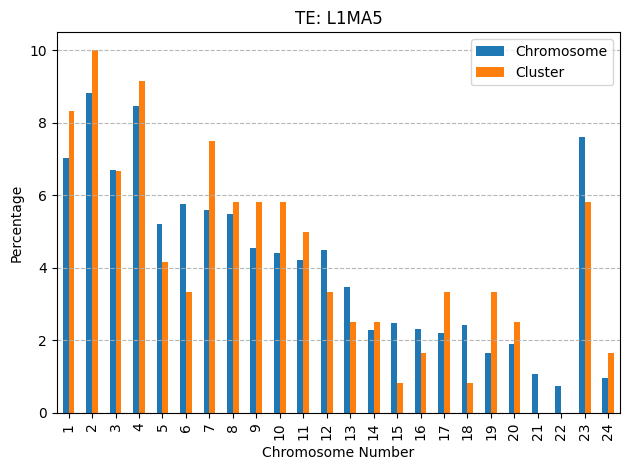

[ 1  2  5  8 14 15 16 17 19 20 23 24]
[ 2  8 14 16 17 19 22]
[]
[19]
[]
[19]


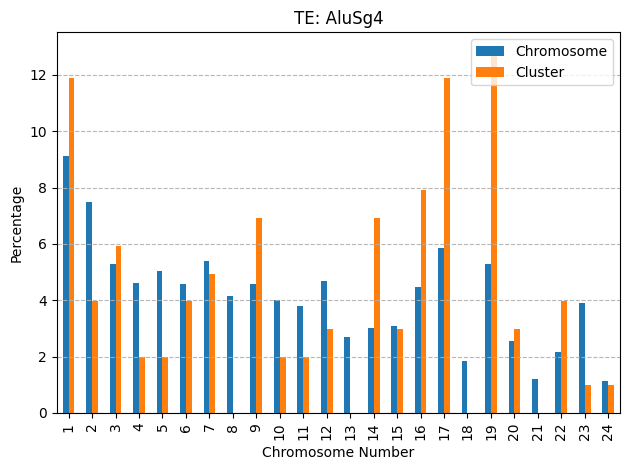

[ 1  2  4  5  6  8  9 12 17 18 23 24]
[ 1  2  4  6 12 18 23]
[]
[23]
[23]
[23]


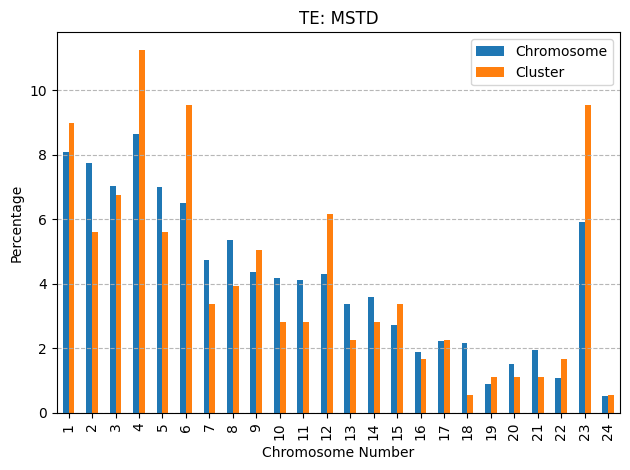

[ 2  3  4  5  7 10 14 19 21 23 24]
[ 2  3  5  7 10 19]
[]
[3]
[]
[3]


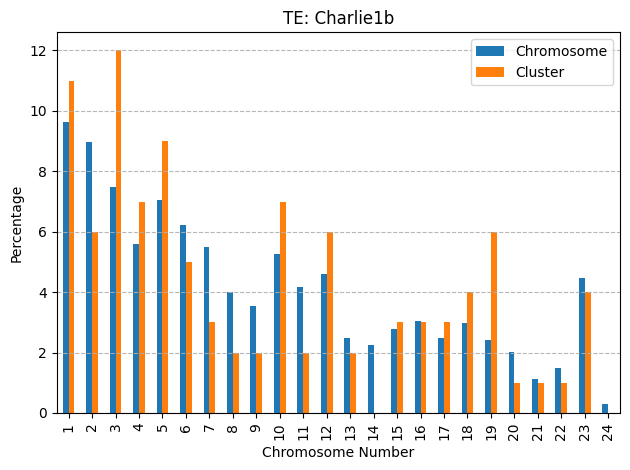

[ 3  4  7  8  9 12 14 15 20 23 24]
[ 3  4  7  8  9 12 14 20]
[]
[]
[3]
[3]


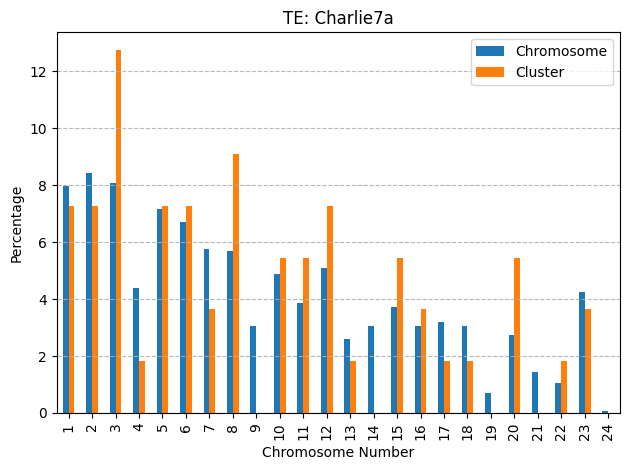

[ 2  4  7  8  9 10 15 17 19 21 22 23 24]
[ 2  4  7  8 15 19]
[]
[]
[]
[]


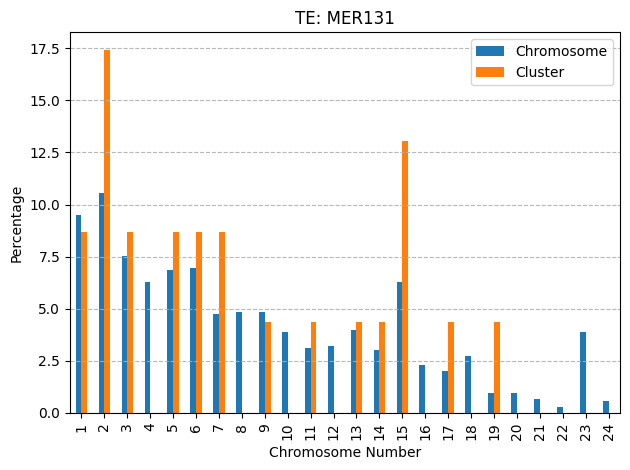

[ 1  2  3  6  9 11 12 14 15 17 21 22]
[ 2  3  6  9 11 12 16 17 24]
[]
[]
[]
[]


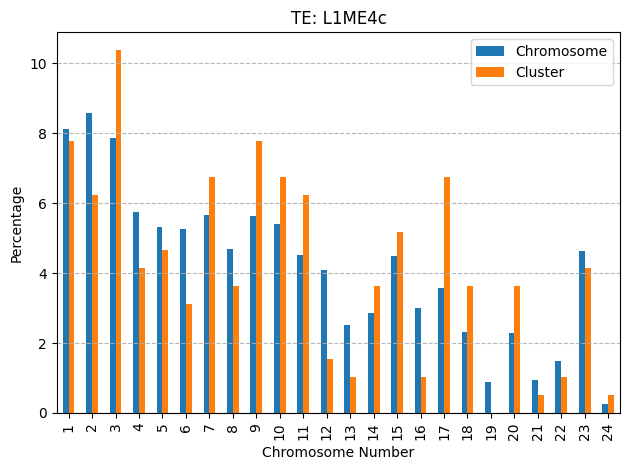

[ 3  4  6  7  9 11 12 14 17 18 23]
[ 3  4  7  9 11 23]
[]
[4 9]
[4 9]
[4 9]


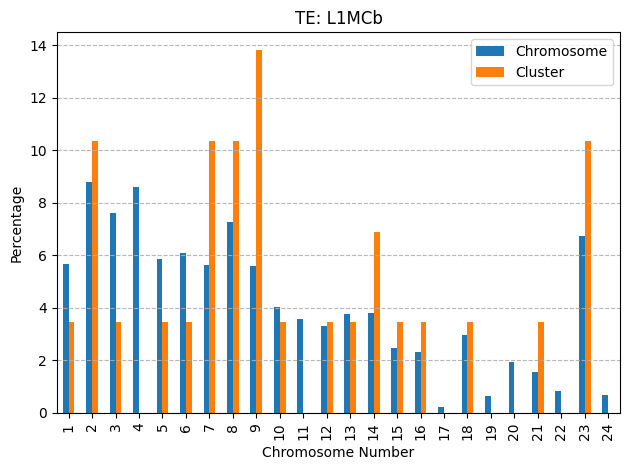

[ 1  3  4  8 10 12 13 14 15 16 20]
[ 1  3  4  8 12 15 20]
[]
[]
[ 4 20]
[ 4 20]


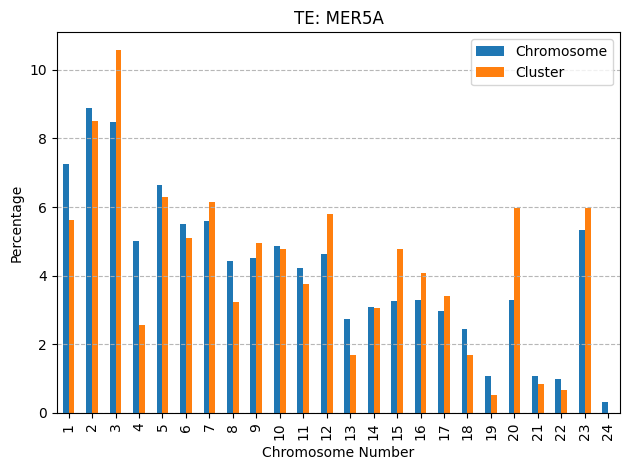

[ 1  3  4  7  9 13 14 16 17 18 22]
[ 1  3  4  8  9 13 15 17 18]
[]
[]
[]
[]


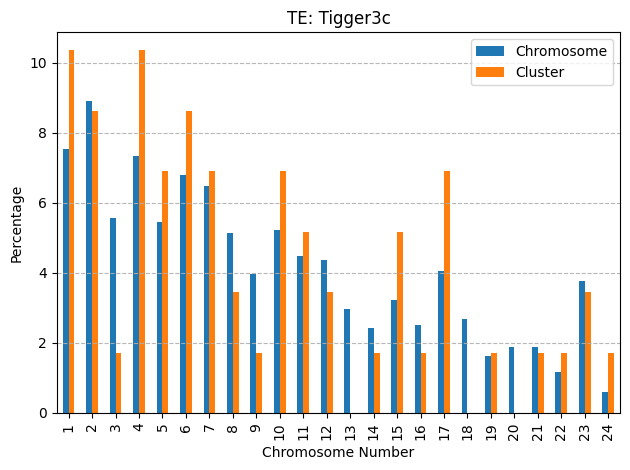

[ 2  3  4  6  8 10 12 14 16 18 19 20 23]
[ 3  4  8 10 14 20]
[]
[]
[]
[]


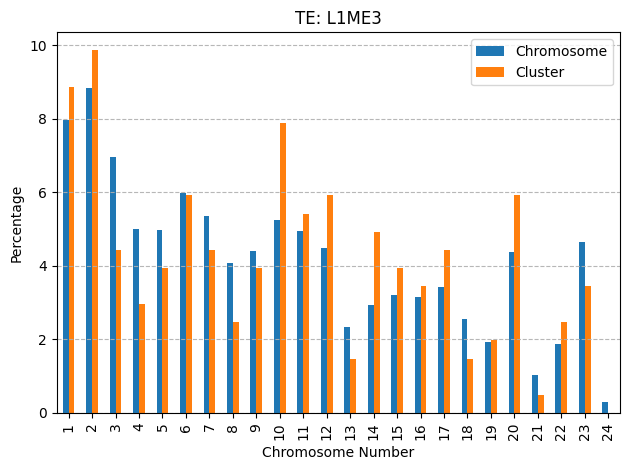

[ 1  2  3  4  5  8  9 11 12 20 22 24]
[ 1  2  4 11 12 20]
[12]
[12]
[12]
[12]


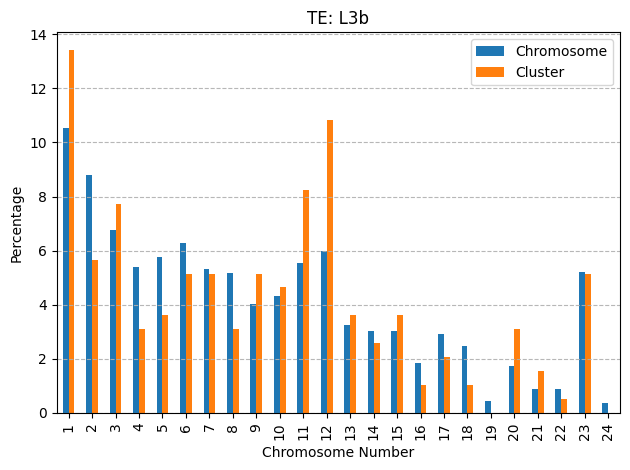

[ 1  3  4  6  7  9 11 13 15 17 20 24]
[ 1  7  9 11 20]
[]
[1]
[]
[1]


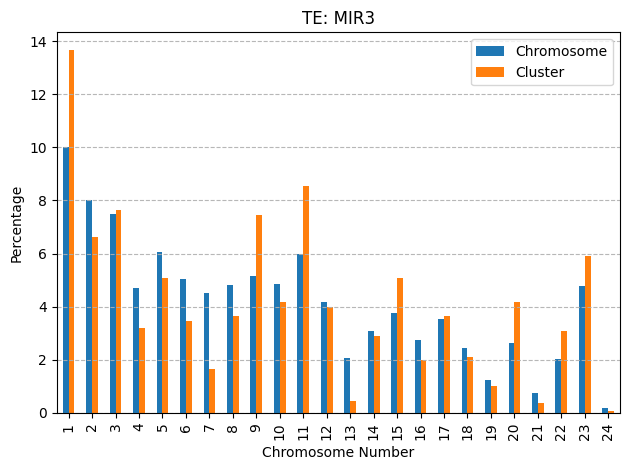

[ 1  5  6  7  9 10 11 12 14 15 17 21]
[ 1  2  4  9 10 11 12 14 19]
[]
[]
[]
[]


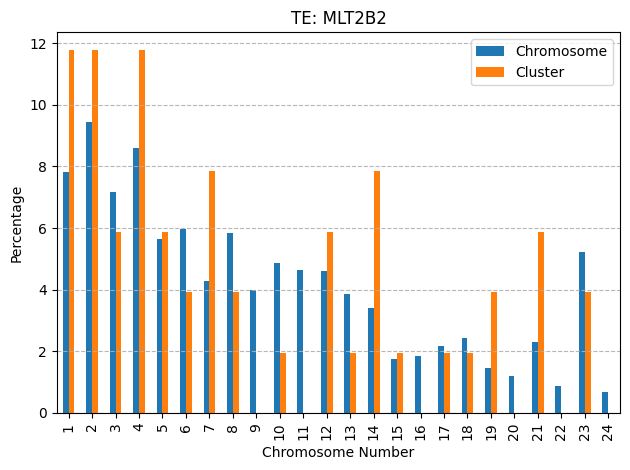

[ 1  2  3  4  6  7  8 11 15 16 21 23]
[ 1  3  4  5  6  8 11 13 14 15 21 23]
[]
[]
[ 1  3  4 11 23]
[ 1  3  4 11 23]


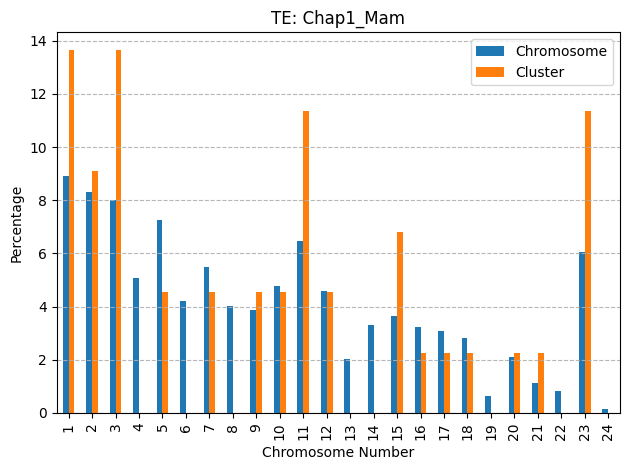

[ 6  7  8  9 13 16 18 19 21 22 24]
[ 3  6  7  8  9 16 18 19 21 24]
[]
[7]
[ 7 16]
[ 7 16]


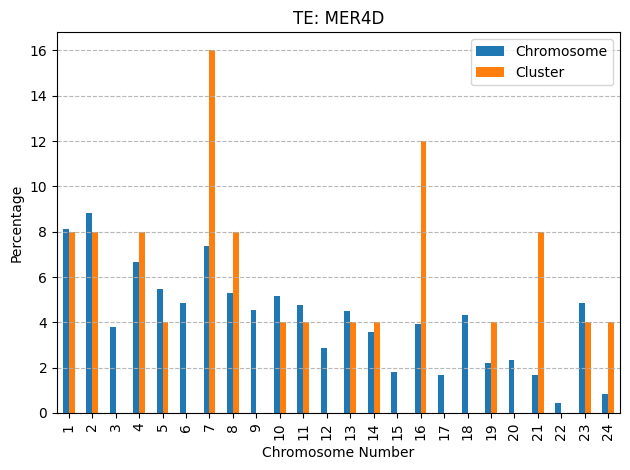

[ 1  2  4  6  7  9 10 11 14 15 16 20 21 22]
[ 1  2  4  6  7 11 16 20]
[]
[1]
[]
[1]


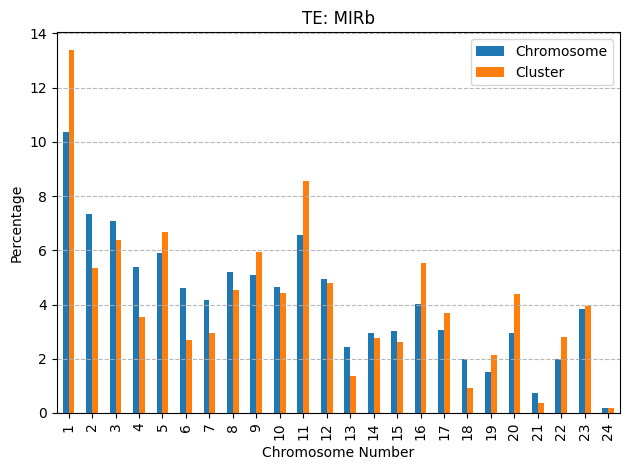

[ 2  5  6  8 10 12 14 16 17 20 22 23 24]
[ 2  5  6  8 12 13 21 22]
[]
[]
[]
[]


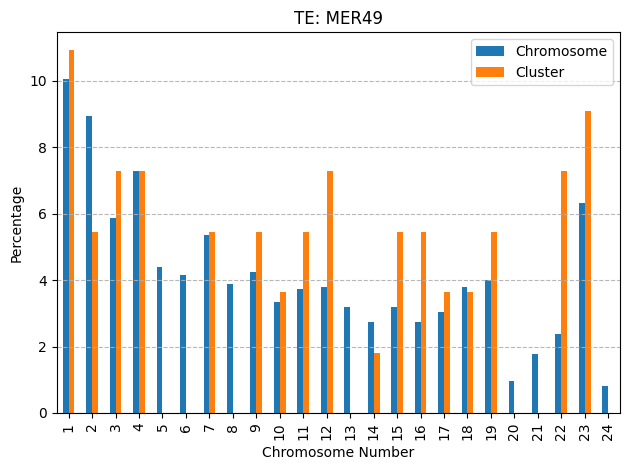

[ 1  2  3  4  7 10 13 15 16 18 19 23]
[ 2  3  4  6  7 11 12 13 15 17 19]
[4]
[4]
[4]
[4]


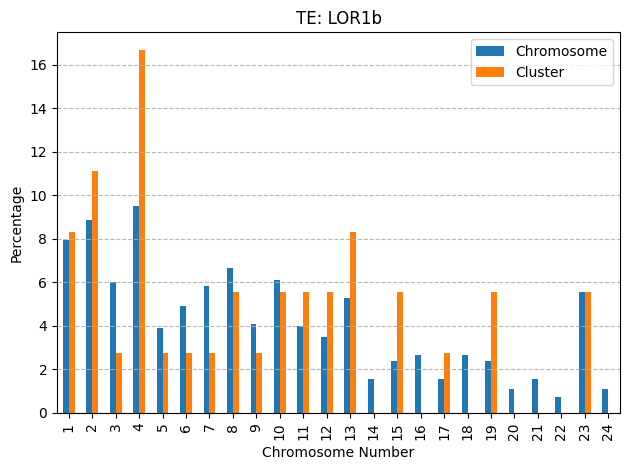

[ 2  4  5  6  7  8  9 12 14 16 19 22 23]
[ 2  4  5  6  8 12 16 23]
[4]
[4]
[4]
[4]


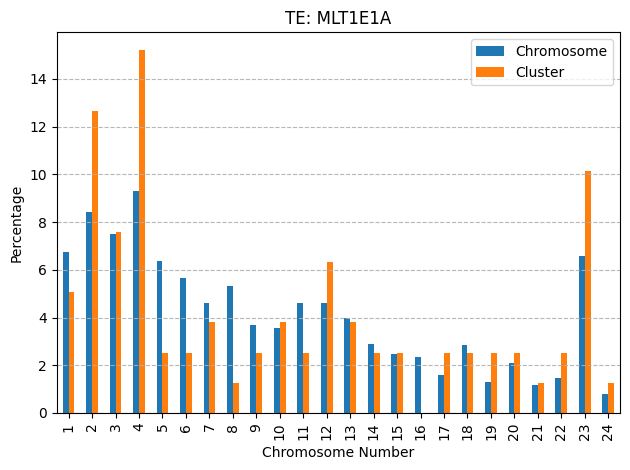

[ 2  3  4  5  8 10 12 13 16 17 19 23 24]
[ 2  3  4  8 11 13 19 23 24]
[]
[]
[]
[]


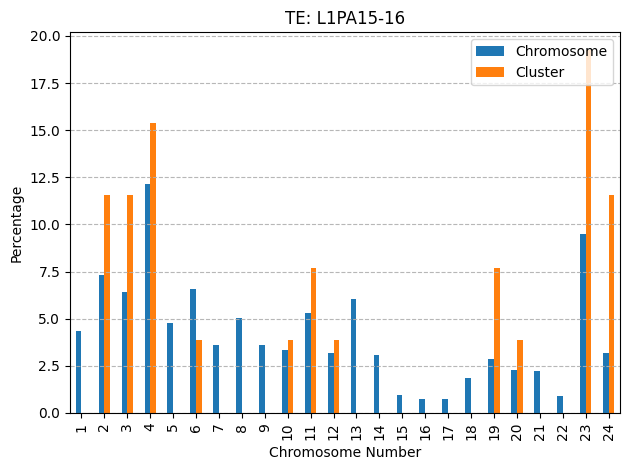

[ 1  3  4  5  8 11 12 14 20 21 23]
[ 1  3  4  5  8 12]
[]
[12]
[12]
[12]


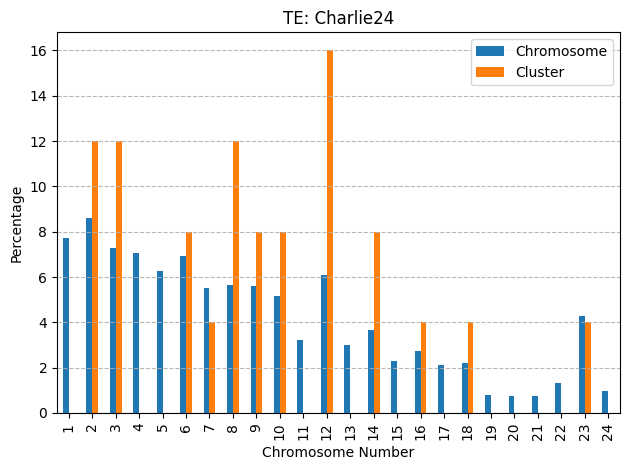

[ 5  7  8  9 10 11 12 13 14 15 19 21]
[ 5  7  9 11 12 13 14 19 21 23]
[ 5  7 12]
[5]
[5]
[ 5  7 12]


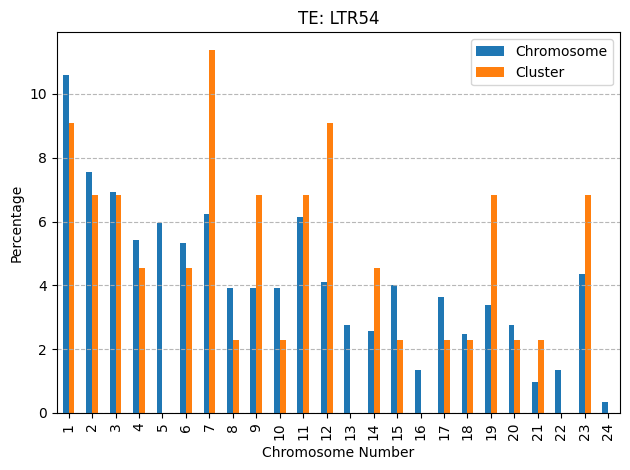

[ 2  3  4  6  9 10 11 13 15 16 23 24]
[ 2  4  6 11 15]
[]
[2]
[]
[2]


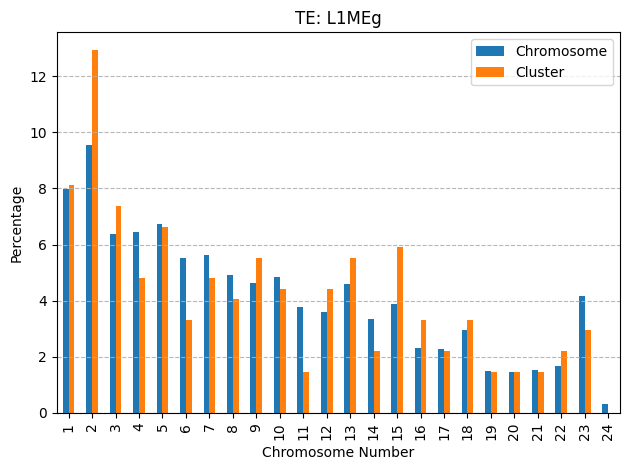

[ 1  4  6  7  9 11 14 15 16 17 18 20 23]
[ 1  4  6  9 11 17]
[1]
[1]
[ 1  4 11]
[ 1  4 11]


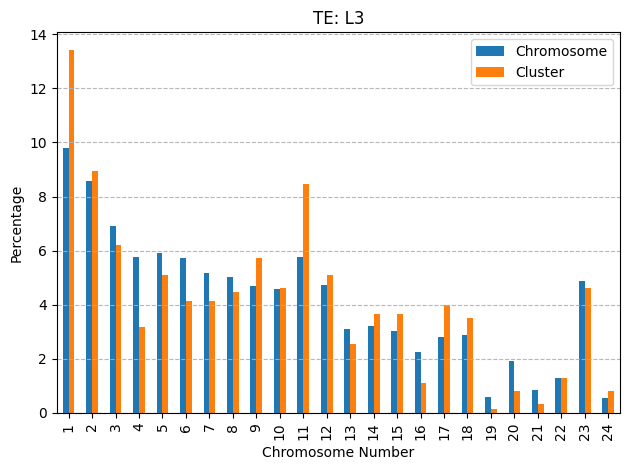

[ 1  2  4  5  8 11 12 14 16 17 21 23]
[ 2  4  8  9 10 13 16 17 23]
[]
[]
[]
[]


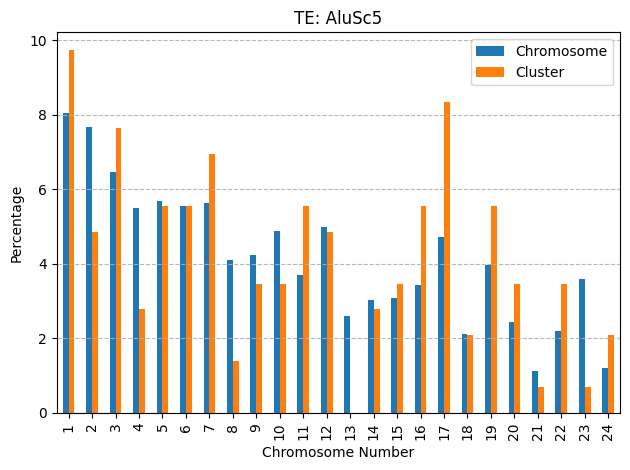

[ 2  4  5  6  8  9 11 13 19 20 22 24]
[ 2  4  5  6  8 11 13]
[ 5  8 11 13]
[13]
[ 5  8 11 13]
[ 5  8 11 13]


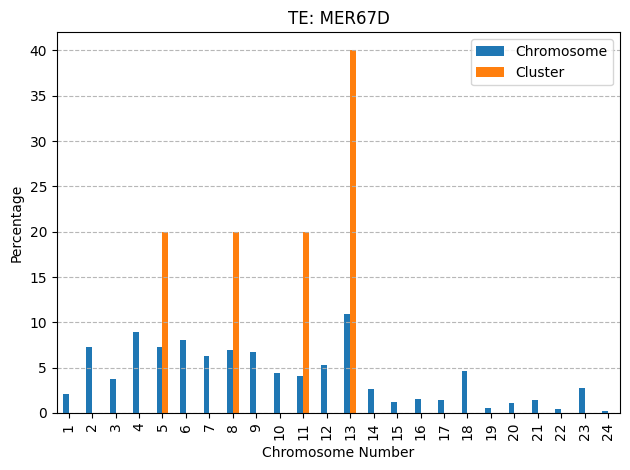

[ 1  4  5  8 13 14 15 18 19 20 24]
[ 4  6  8 11 14 15 19 20]
[]
[]
[]
[]


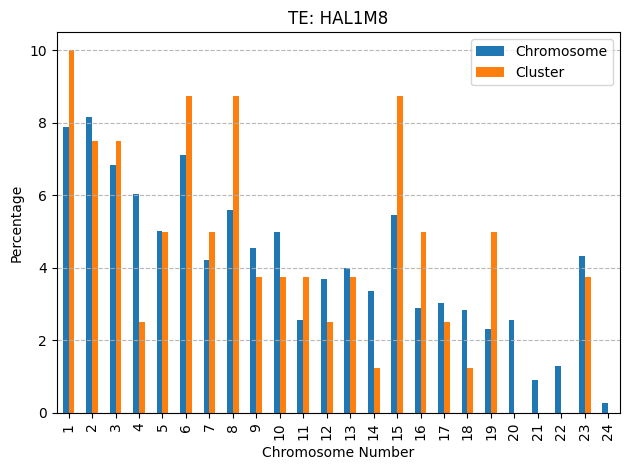

[ 1  2  3  4  6  9 10 12 13 15 16 19 20]
[ 1  3 10 12 19]
[]
[1]
[]
[1]


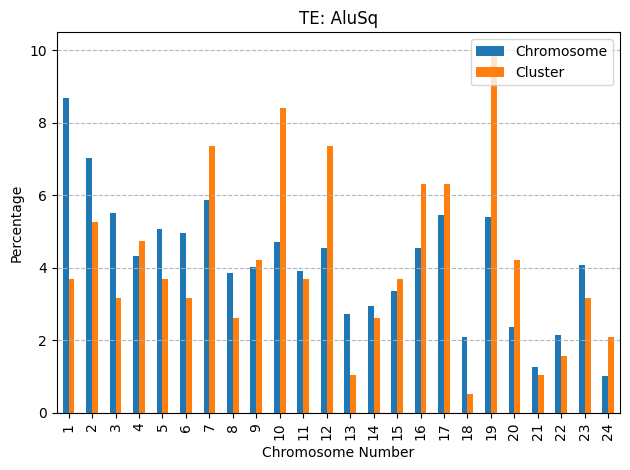

[ 2  4  5  6  9 12 13 16 17 19 20 23]
[ 4 12 16 17 19 20]
[17 19]
[17 19]
[17 19]
[17 19]


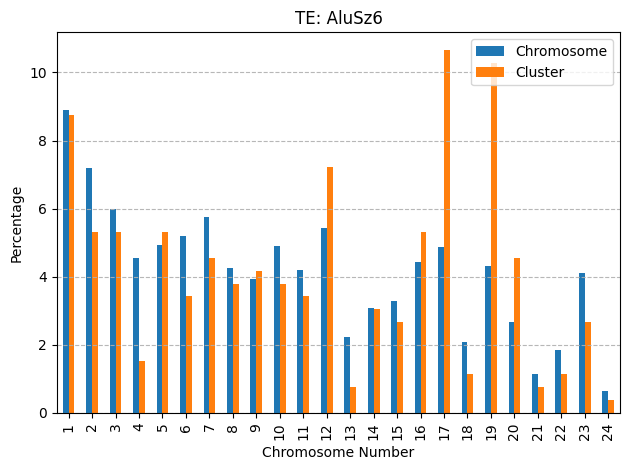

[ 1  4  5  6  8 11 13 14 15 16 18]
[ 1  4  5  6  8 14]
[]
[1 8]
[1 8]
[1 8]


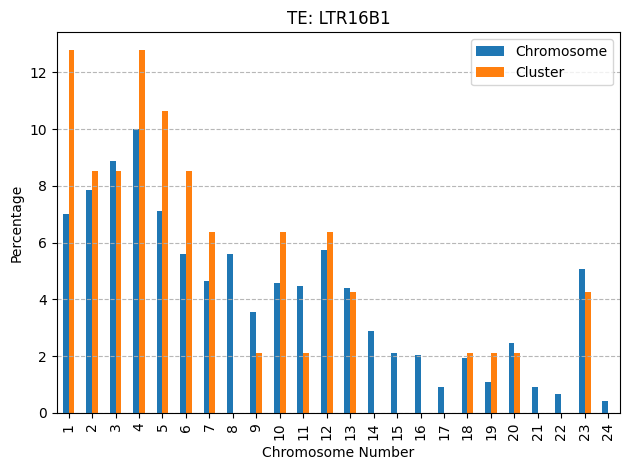

[ 1  2  3  4  6  7  9 10 11 13 20 23 24]
[ 2  3 11 20 23]
[ 3 20]
[ 3 20]
[ 3 11 20 23]
[ 3 11 20 23]


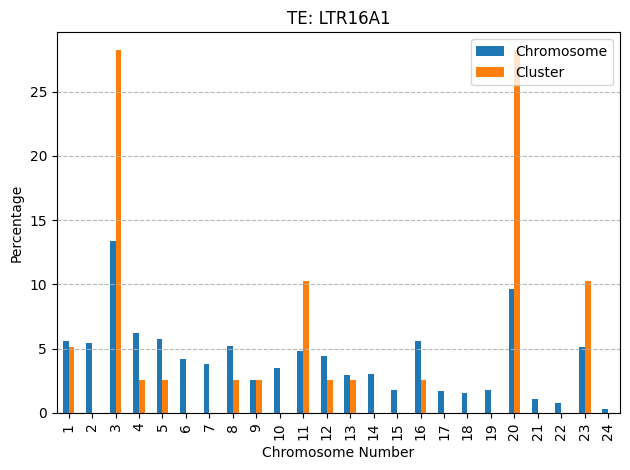

[ 1  2  3  6  7  8  9 12 15 17 22]
[ 2  3  8 17 22 23]
[]
[]
[]
[]


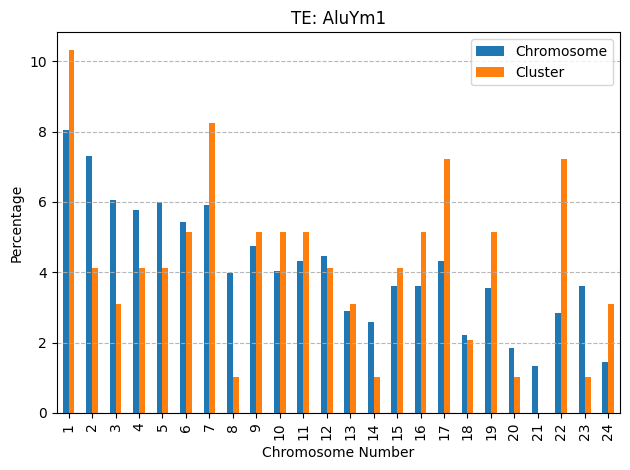

[ 1  3  4  5  6  8  9 11 12 24]
[ 1  3  4  5  8  9 12 14 15 19]
[]
[]
[]
[]


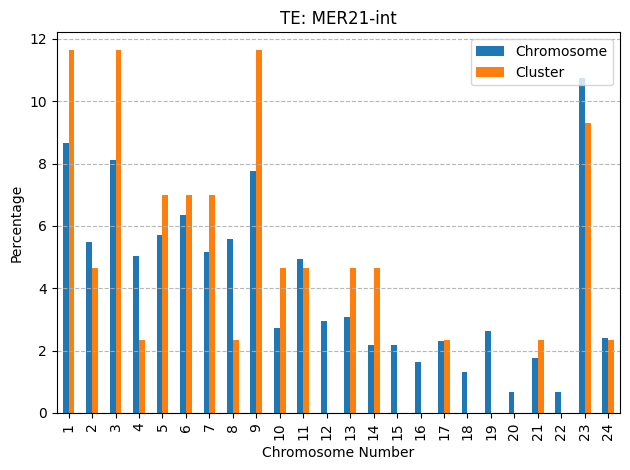

[ 1  2  5  8 10 11 12 13 16 17 18 20]
[ 2  5 10 12 20]
[]
[12]
[12]
[12]


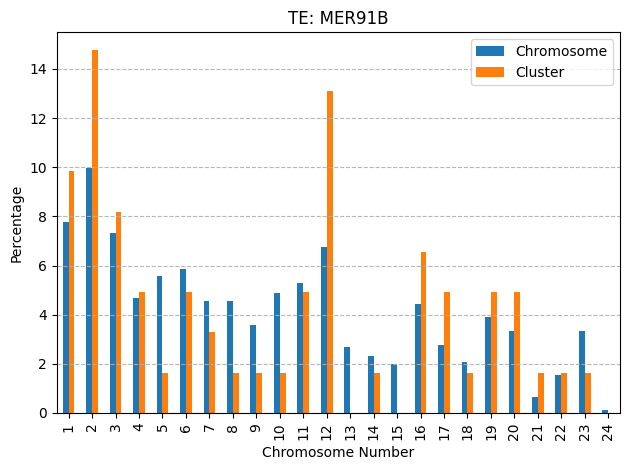

[ 1  2  4  5  8  9 12 13 14 15 20 23]
[ 2  3  4  5  8 10 12 14]
[]
[]
[]
[]


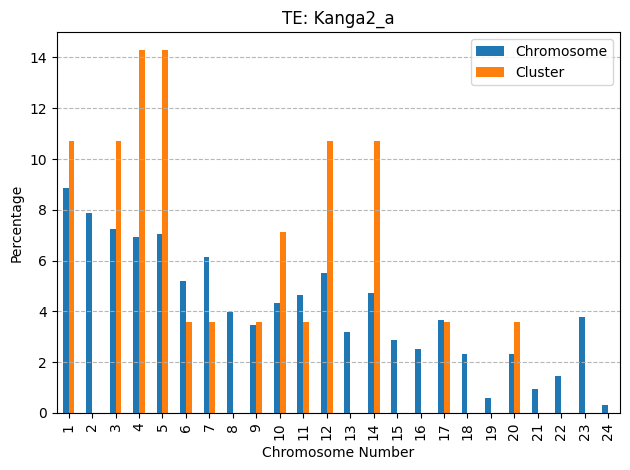

In [80]:
for i, te in enumerate(clusters.columns):
    print(np.where(outliers['svm'][:, i].flatten()==1)[0]+1)
    print(np.where(outliers['iso_forrest'][:, i].flatten()==1)[0]+1)
    print(np.where(outliers['z_score'][:, i].flatten()==1)[0]+1)
    print(np.where(outliers['grubbs'][:, i].flatten()==1)[0]+1)
    print(np.where(outliers['interquantile'][:, i].flatten()==1)[0]+1)
    print(chr_assignments.get(te)+1)
    df = pd.concat([coors.loc[:, te], clusters.loc[:, te]], axis=1)
    df.columns = ['Chromosome', 'Cluster']
    df = df.div(df.sum()) * 100
    ax = df.plot(kind='bar', rot=90)  # Rotate x-axis labels for readability

    plt.title(f"TE: {te}")  # Add a title
    plt.xlabel("Chromosome Number")  # Label for x-axis
    plt.ylabel("Percentage")  # Label for y-axis

    # Customize legend
    plt.legend(loc='upper right')
    
    # Customize grid
    plt.grid(axis='y', linestyle='--', alpha=0.9)

    plt.tight_layout()  # Ensure proper spacing

    plt.show()  # Display the plot

In [22]:
len_tes = {i:len(chrs[i]) for i in range(0, 24)}

<AxesSubplot: xlabel='chr'>

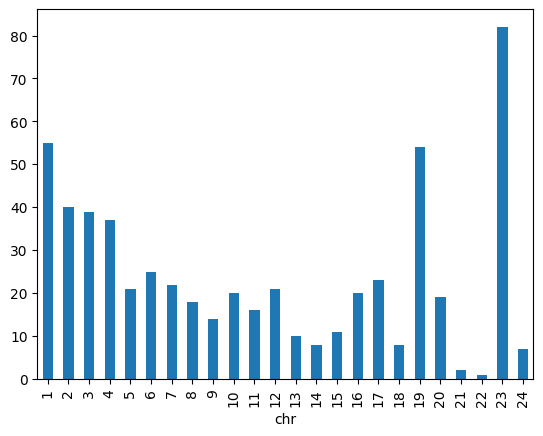

In [77]:
pd.DataFrame({'TE_count':len_tes.values()}, index=coors.index)['TE_count'].plot(kind='bar')

In [ ]:
array([ 41,  31,  36,  29,  28,  22,  27,  18,  26,  12,  20,  30,  30,
        19,  15,  38,  16,  15,  62,  42,  14,   5, 121,  22])


In [100]:
import seaborn as sns

<AxesSubplot: ylabel='Count'>

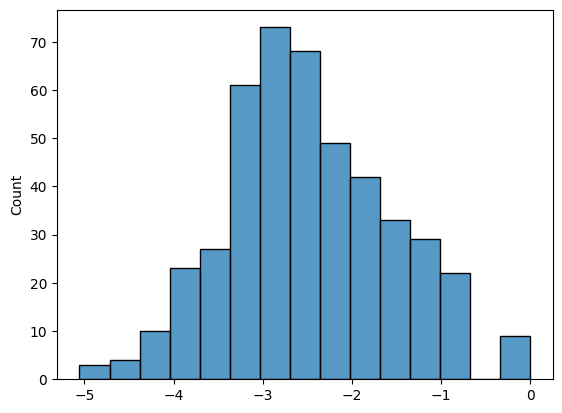

In [25]:
sns.histplot(diff.values[23,:])

<AxesSubplot: ylabel='Count'>

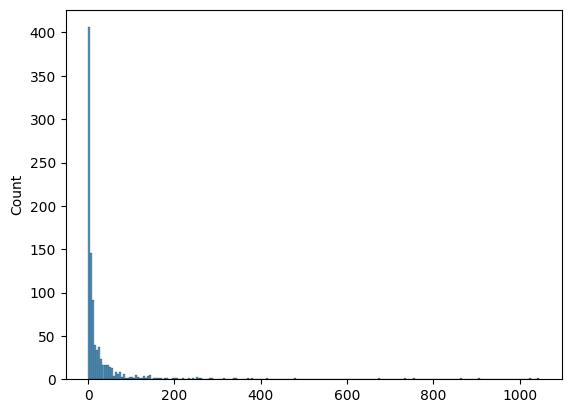

In [125]:
sns.histplot(coors.values[23,:])

<AxesSubplot: ylabel='Count'>

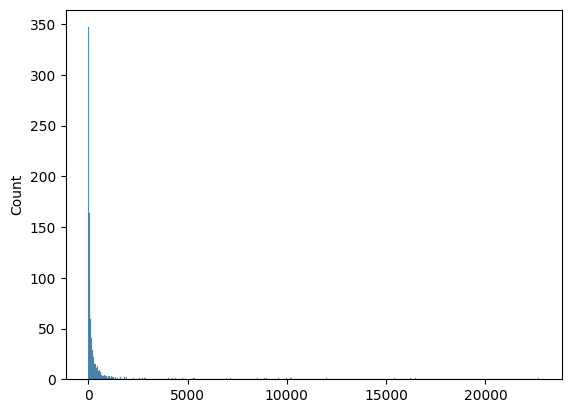

In [123]:
sns.histplot(coors.values[0,:])

<AxesSubplot: ylabel='Count'>

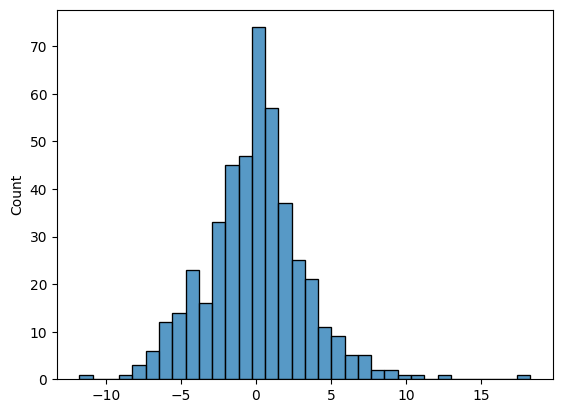

In [102]:
sns.histplot(diff[0,:])